# Plots

This notebooks contains code to generate most of the plots for the archaic hominin splicing project and is organized to reflect the order in which results are presented in the manuscript. A handful of plots were created using Inkscape and several of those generated below were further modified using that software. Finally, a subset of the plots created here were made for presentations and do not appear in the manuscript.

# Table of Contents
- [SAV Characterization](#SAVcharacterization)
    - [gnomAD Specific Variants Allele Frequencies](#gnomadspecific)
    - [N Alt Alleles](#naltalleles)
    - [N Annotations](#nannotations)
    - [Delta Max](#deltamaxhistogram)
    - [N Acceptor Gains/Losses and Donor Gains/Losses](#ngainloss)
    - [Delta Correlations](#deltacorrelations)
    - [Distribution of Unique and Shared SAVs](#SAVdistribution)
    - [Number of Genes with SAVs by Allele Origin](#ngenesbyalleleorigin)
    - [Introgression Overlap](#introgressionoverlap)
    - [N Genes](#ngenes)
- [Phenotype Enrichment](#phenotypeenrichment)
    - [Archaic-Specific](#archaicspecific)
    - [Altai](#altai)
    - [Browning et al. 2018 Introgressed](#browningintrogressed)
    - [Chagyrskaya](#chagyrskaya)
    - [Denisovan](#denisovan)
    - [Neanderthal](#neanderthal)
    - [Shared](#shared)
    - [Vernot et al. 2016 Introgressed](#vernotintrogressed)
    - [Vindija](#vindija)
- [Novel Isoforms](#novelisoforms)
- [Gene Characteristics](#genecharacteristics)
- [Constraint](#constraint)
    - [Browning et al. 2018](#browningconstraint)
    - [Vernot et al. 2016](#vernotconstraint)
- [Conservation](#conservation)
    - [Browning et al. 2018](#browningconservation)
    - [Vernot et al. 2016](#vernotconservation)
- [Purifying Selection](#purifyingselection)
    - [Varied Deltas](#varieddeltas)
    - [Lineage-Specific](#lineagespecific)
- [SAVs in Moderns](#SAVsinmoderns)
    - [Introgression Distribution](#introgressiondistribution)
        - [Vernot et al. 2016](#vernotintrogressiondistribution)
        - [Browning et al. 2018](#browningintrogresseddistribution)
    - [Allele Frequency vs. Max Delta](#allelefrequencymaxdelta)
        - [Vernot et al. 2016](#vernotallelefrequencymaxdelta)
        - [Browning et al. 2018](#browningallelefrequencymaxdelta)
    - [1KG Allele Frequencies by Allele Origin](#1KGallelefrequencybyalleleorigin)
    - [1KG Upset](#1KGupset)
        - [Vernot et al. 2016](#vernotupset)
        - [Browning et al. 2018](#browningupset)
    - [SAVs in Modern Figure](#SAVsinmodernsfigure)
- [Gene Expression](#geneexpression)
    - [sQTLs](#sQTLs)
        - [Browning et al. 2018 Allele Origin](#browningsQTLs)
        - [Vernot et al. 2016 Allele Origin](#vernotsQTLs)
        - [Allele Origin Tissue Distribution](#alleleorigintissuedistribution)
        - [sQTL Allele Origin Differences](#sqtlalleleorigindifferences)
        - [Specific Tissue Distribution](#specifictissuedistribution)
        - [EUR sQTLs](#EURsQTLs)
    - [Gene-Level](#genelevel)
        - [Gene Allele Origin Differences](#genealleleorigindifferences)
        - [Relative Entropy](#relentropy)

Load libraries.

In [1]:
library(ComplexUpset)
library(cowplot)
library(dplyr)
library(eulerr)
library(ggplot2)
library(ggpubr)
#library(ggtext)
library(reshape2)
library(showtext)
library(stringr)
#library(tidyverse)
#options(scipen=999)

options(repr.matrix.max.cols=100)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



Attaching package: ‘ggpubr’


The following object is masked from ‘package:cowplot’:

    get_legend


Loading required package: sysfonts

Loading required package: showtextdb



In [2]:
font_add('Arial', '~/fonts/arial.ttf')
showtext_auto()

Change directories.

In [3]:
setwd('../../plots')

Let's set some colors up here to simplify the code below.

In [4]:
bar_color = 'grey'

ancient_color = '#87bf60'
archaic_specific_color = '#008ada'
introgressed_color = '#9888d6'
non_SAV_color = 'grey'

altai_color = '#66b2b2'
chagyrskaya_color = '#5ba4cf'
denisovan_color = '#0079bf'
vindija_color = '#055a8c'

Load initial data set.

In [5]:
data <- read.csv('../data/dataframes/archaic_data_with_constraint_moderns_introgression_sQTLs.txt', header = TRUE, sep = '\t')
head(data)

,chrom,pos,ref_allele,alt_allele,ancestral_allele,anc_dev,variant_type,altai_gt,chagyrskaya_gt,denisovan_gt,vindija_gt,altai_gt_boolean,chagyrskaya_gt_boolean,denisovan_gt_boolean,vindija_gt_boolean,distribution,present_in_1KG,X1KG_allele_count,X1KG_allele_number,X1KG_allele_frequency,X1KG_EAS_AF,X1KG_EUR_AF,X1KG_AFR_AF,X1KG_AMR_AF,X1KG_SAS_AF,X1KG_non_ASW_AFR_AF,present_in_gnomAD,gnomAD_allele_count,gnomAD_allele_number,gnomAD_allele_frequency,Vernot_introgressed,Vernot_ancestral_allele,Vernot_derived_allele,Vernot_ancestral_derived_code,Vernot_AFA_AF,Vernot_AFR_AF,Vernot_AMR_AF,Vernot_EAS_AF,Vernot_EUR_AF,Vernot_PNG_AF,Vernot_SAS_AF,Vernot_Denisovan_base,Vernot_Neanderthal_base_1,Vernot_Neanderthal_base_2,Vernot_haplotype_tag,Vernot_introgressed_AF,Browning_introgressed,Browning_ref_alt,Browning_introgressed_AF,annotation,⋯,Artery_Aorta,Artery_Coronary,Artery_Tibial,Brain_Amygdala,Brain_Anterior_cingulate_cortex_BA24,Brain_Caudate_basal_ganglia,Brain_Cerebellar_Hemisphere,Brain_Cerebellum,Brain_Cortex,Brain_Frontal_Cortex_BA9,Brain_Hippocampus,Brain_Hypothalamus,Brain_Nucleus_accumbens_basal_ganglia,Brain_Putamen_basal_ganglia,Brain_Spinal_cord_cervical_c.1,Brain_Substantia_nigra,Breast_Mammary_Tissue,Cells_Cultured_fibroblasts,Cells_EBV.transformed_lymphocytes,Colon_Sigmoid,Colon_Transverse,Esophagus_Gastroesophageal_Junction,Esophagus_Mucosa,Esophagus_Muscularis,Heart_Atrial_Appendage,Heart_Left_Ventricle,Kidney_Cortex,Liver,Lung,Minor_Salivary_Gland,Muscle_Skeletal,Nerve_Tibial,Ovary,Pancreas,Pituitary,Prostate,Skin_Not_Sun_Exposed_Suprapubic,Skin_Sun_Exposed_Lower_leg,Small_Intestine_Terminal_Ileum,Spleen,Stomach,Testis,Thyroid,Uterus,Vagina,Whole_Blood,N_GTEx_tissues,sQTL,Vernot_allele_origin,Browning_allele_origin
,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
1,chr1,861808,A,G,A,derived,snv,0/0,0/0,1/1,0/0,False,False,True,False,Denisovan,yes,3479,5096,0.68,0.55,0.97,0.34,0.83,0.88,0.3138402,yes,112289,143198,0.784152000,no,,,NA,NA,NA,NA,NA,NA,NA,NA,,,,,NA,no,NA,NA,SAMD11,⋯,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,yes,ancient,ancient
2,chr1,861808,A,G,A,derived,snv,0/0,0/0,1/1,0/0,False,False,True,False,Denisovan,yes,3479,5096,0.68,0.55,0.97,0.34,0.83,0.88,0.3138402,yes,112289,143198,0.784152000,no,,,NA,NA,NA,NA,NA,NA,NA,NA,,,,,NA,no,NA,NA,AL645608.1,⋯,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,yes,ancient,ancient
3,chr1,862072,C,T,C,derived,snv,1/1,1/1,0/0,0/1,True,True,False,True,Neanderthal,yes,9,5096,0.00,0.01,0.00,0.00,0.00,0.00,0.0000000,yes,8,143246,0.000055848,no,,,NA,NA,NA,NA,NA,NA,NA,NA,,,,,NA,no,NA,NA,SAMD11,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,no,low-confidence ancient,low-confidence ancient
4,chr1,862072,C,T,C,derived,snv,1/1,1/1,0/0,0/1,True,True,False,True,Neanderthal,yes,9,5096,0.00,0.01,0.00,0.00,0.00,0.00,0.0000000,yes,8,143246,0.000055848,no,,,NA,NA,NA,NA,NA,NA,NA,NA,,,,,NA,no,NA,NA,AL645608.1,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,no,low-confidence ancient,low-confidence ancient
5,chr1,862093,T,C,C,ancestral,snv,0/0,0/0,1/1,0/0,False,False,True,False,Denisovan,yes,3484,5096,0.68,0.55,0.97,0.34,0.83,0.88,0.3157895,yes,111981,143126,0.782395000,no

Subset our data per our two delta thresholds.

In [6]:
data_2 <- subset(data, delta_max >= 0.2)

In [7]:
data_5 <- subset(data, delta_max >= 0.5)

Subset data to non splice-altering.

In [8]:
data_non_SA <- subset(data, delta_max = 0)

# SAV Characterization <a class = 'anchor' id = 'SAVcharacterization'></a>

## gnomAD Specific Variants Allele Frequencies <a class = 'anchor' id = 'gnomadspecific'></a>

In [9]:
gnomAD_specific_variants <- subset(data, present_in_1KG == 'no' & present_in_gnomAD == 'yes' & delta_max >= 0.2)

In [10]:
nrow(gnomAD_specific_variants)

[1] 751

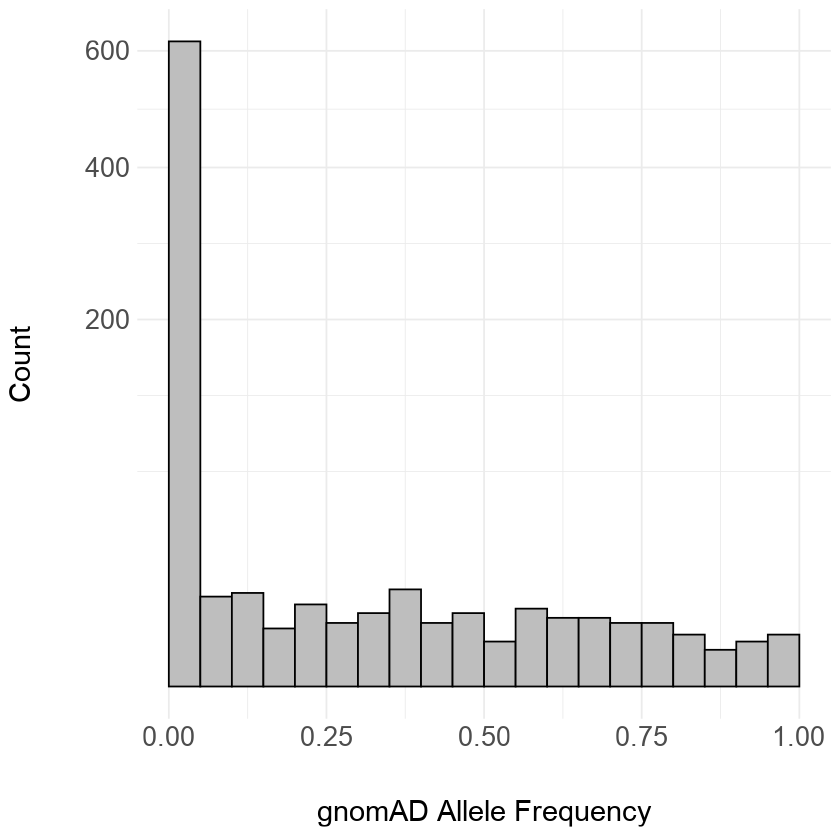

In [11]:
gnomAD_specific_variants_histogram <- ggplot(gnomAD_specific_variants, aes(x = gnomAD_allele_frequency)) + geom_histogram(color = 'black', fill = 'grey', binwidth = 0.05, boundary = 0.5) +
scale_y_sqrt() + xlab('\ngnomAD Allele Frequency') + ylab('Count\n') +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 22), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20))

gnomAD_specific_variants_histogram

In [12]:
pdf('suppl_figs/gnomAD_specific_variants_histogram.pdf', width = 24, height = 8)
gnomAD_specific_variants_histogram
dev.off()

png 
  2

In [13]:
gnomAD_specific_rare_variants <- subset(data, present_in_1KG == 'no' & present_in_gnomAD == 'yes' & delta_max >= 0.2 & gnomAD_allele_frequency <= 0.01)

In [14]:
nrow(gnomAD_specific_rare_variants)

[1] 602

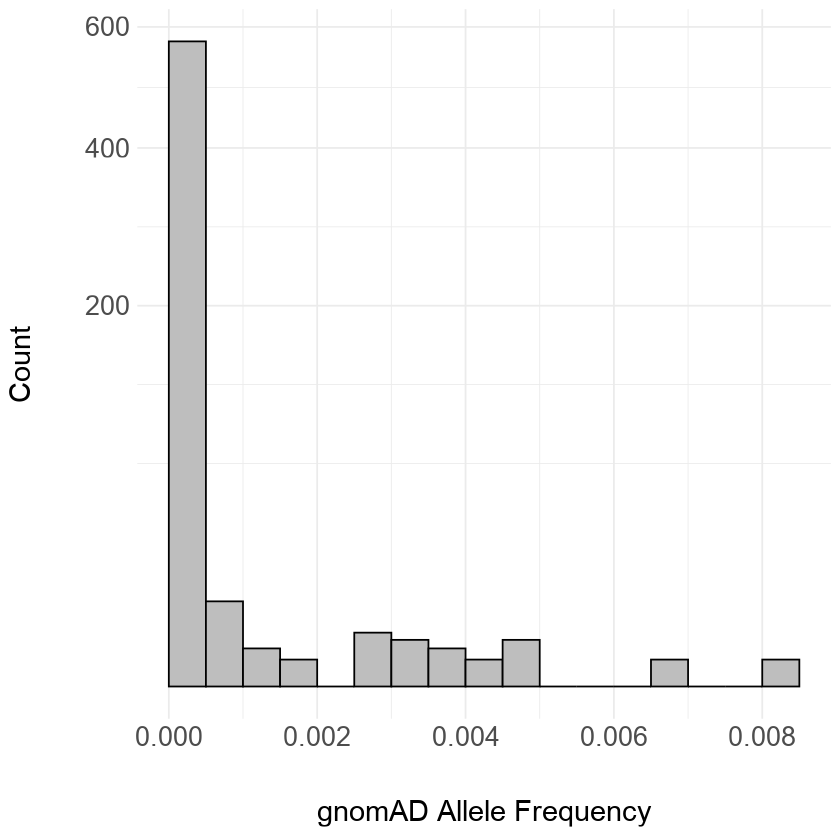

In [15]:
gnomAD_specific_rare_variants_histogram <- ggplot(gnomAD_specific_rare_variants, aes(x = gnomAD_allele_frequency)) + geom_histogram(color = 'black', fill = 'grey', binwidth = 0.0005, boundary = 0.5) +
scale_y_sqrt() + xlab('\ngnomAD Allele Frequency') + ylab('Count\n') +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 22), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20))

gnomAD_specific_rare_variants_histogram

In [16]:
pdf('suppl_figs/gnomAD_specific_rare_variants_histogram.pdf', width = 24, height = 8)
theme_set(theme_cowplot(font_family = 'Arial'))
gnomAD_specific_rare_variants_histogram
dev.off()

png 
  2

## N Alt Alleles <a class = 'anchor' id = 'nalleles'></a>

In [17]:
n_alt_alleles <- c('1','2','3')
count <- c(1566233,1660,1)
alt_alleles_count <- data.frame(n_alt_alleles, count)
head(alt_alleles_count)

,n_alt_alleles,count
,<chr>,<dbl>
1,1,1566233
2,2,1660
3,3,1


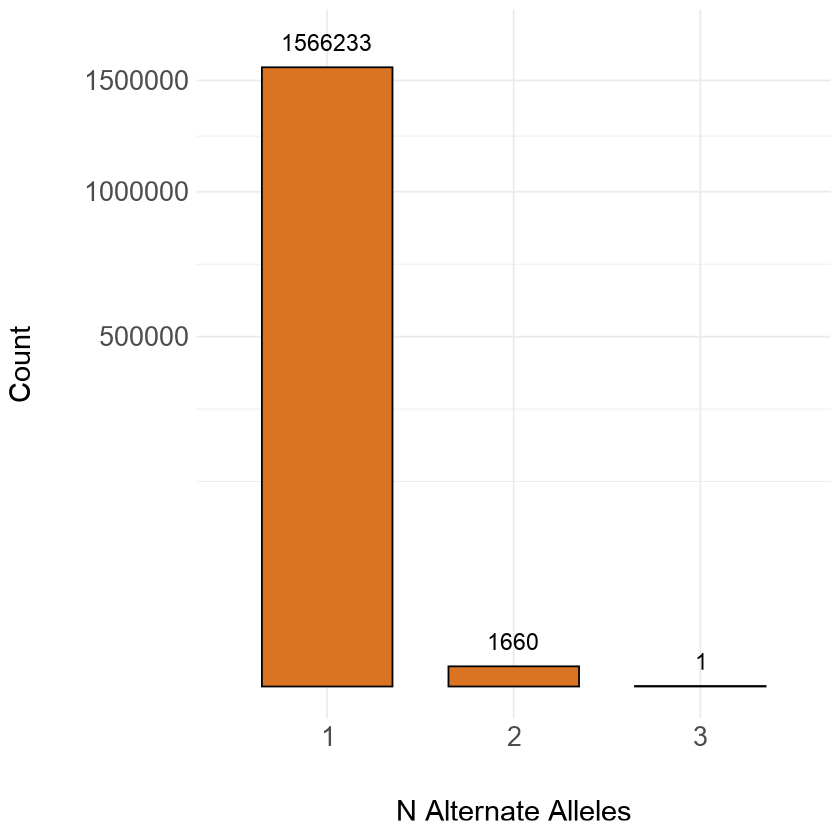

In [18]:
alt_alleles_count_plot <- ggplot(alt_alleles_count, aes(x = reorder(n_alt_alleles, -count), y = count)) + geom_bar(stat = 'identity', width = 0.7, color = 'black', fill = '#DA7422') + geom_text(aes(label = count), vjust = -1, family = 'Arial', size = 6) +
scale_y_sqrt() + xlab('\nN Alternate Alleles') + ylab('Count\n') + theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 22), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20)) +
coord_cartesian(xlim = c(0.9,3.1), ylim = c(0,1700000))

alt_alleles_count_plot

## N Annotations <a class = 'anchor' id = 'nannotations'></a>

In [19]:
n_annotations <- c(1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21)
count <- c(1537451,30448,1154,75,36,15,25,22,36,20,20,15,58,70,34,6,6,32,6,3,24)
annotations_count <- data.frame(n_annotations, count)
head(annotations_count)

,n_annotations,count
,<dbl>,<dbl>
1,1,1537451
2,2,30448
3,3,1154
4,4,75
5,5,36
6,6,15


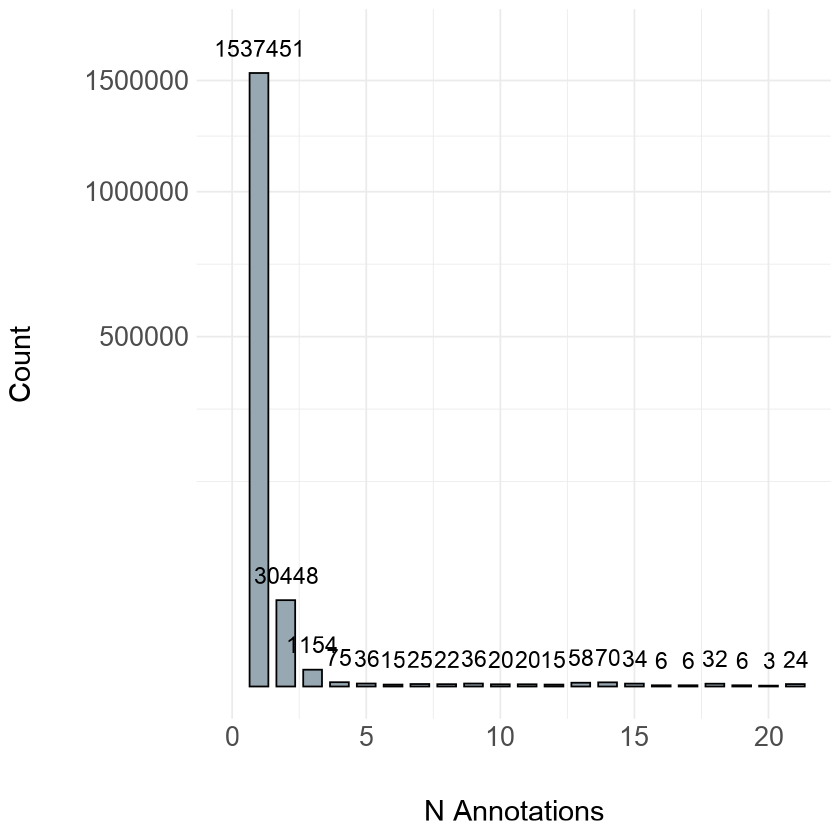

In [20]:
annotations_count_plot <- ggplot(annotations_count, aes(x = n_annotations, y = count)) + geom_bar(stat = 'identity', width = 0.7, color = 'black', fill = '#97A8B2') + geom_text(aes(label = count), vjust = -1, family = 'Arial', size = 6) +
scale_y_sqrt() + xlab('\nN Annotations') + ylab('Count\n') + theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 22), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20)) +
coord_cartesian(xlim = c(-0.25,21.25), ylim = c(0,1700000))

annotations_count_plot

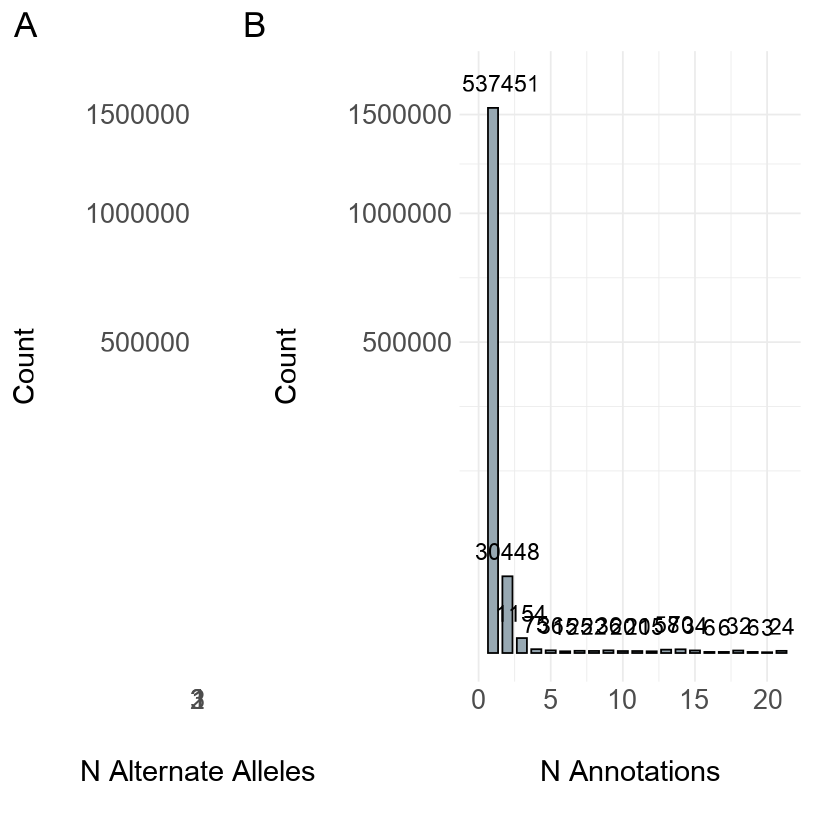

In [21]:
n_variants_plot <- plot_grid(alt_alleles_count_plot, NULL, annotations_count_plot, labels = c('A','','B'), label_size = 26, rel_widths = c(0.25,0.03,0.72), nrow = 1, scale = 0.9)
n_variants_plot

In [22]:
pdf('suppl_figs/n_variants.pdf', width = 24, height = 8)
theme_set(theme_cowplot(font_family = 'Arial'))
n_variants_plot
dev.off()

png 
  2

## Delta Max <a class = 'anchor' id = 'deltamaxhistogram'></a>

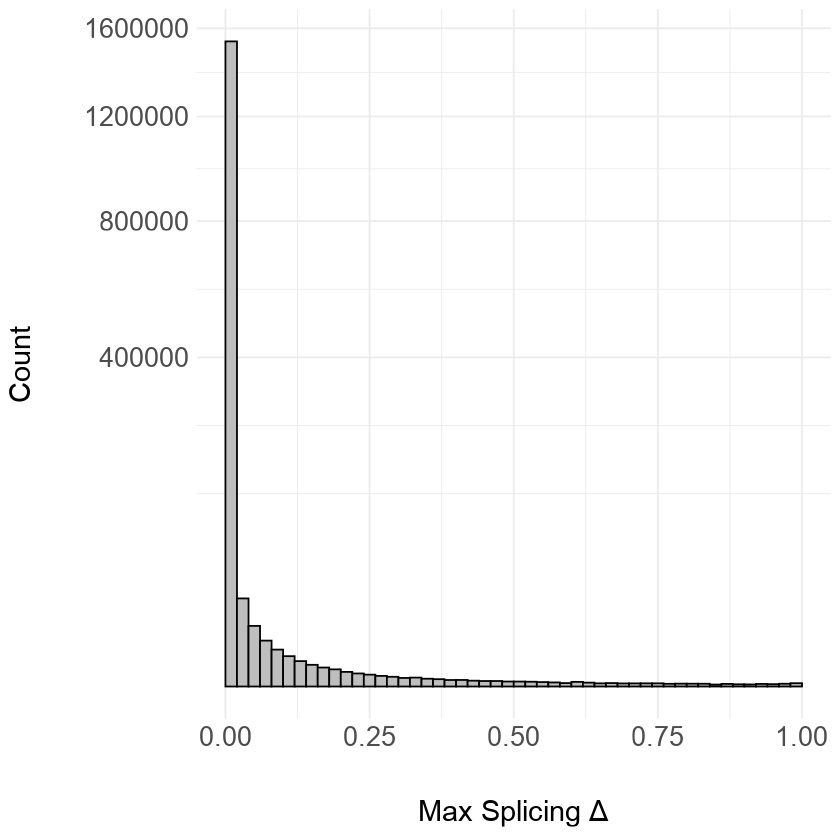

In [23]:
delta_max_histogram <- ggplot(data, aes(x = delta_max)) + geom_histogram(color = 'black', fill = bar_color, binwidth = 0.02, boundary = 0.5) +
scale_y_sqrt() + xlab('\nMax Splicing \u0394') + ylab('Count\n') +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 22), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20))

delta_max_histogram

In [24]:
pdf('suppl_figs/delta_max_histogram.pdf', width = 20, height = 8)
theme_set(theme_cowplot(font_family = 'Arial'))
delta_max_histogram
dev.off()

png 
  2

Add boundaries for delta thresholds.

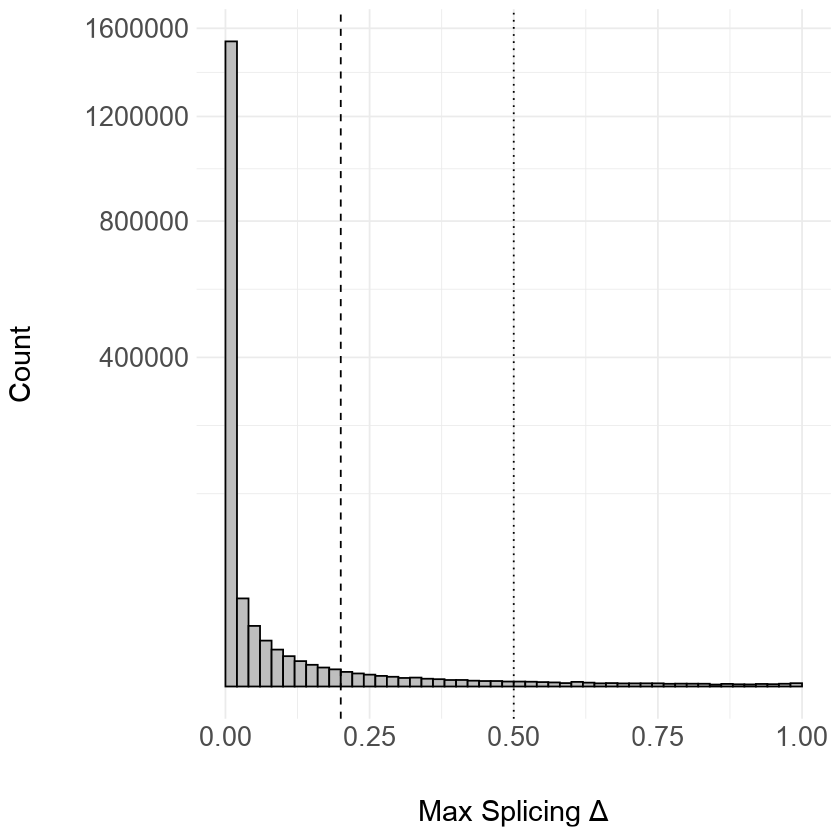

In [25]:
delta_max_histogram_with_thresholds <- ggplot(data, aes(x = delta_max)) + geom_histogram(color = 'black', fill = bar_color, binwidth = 0.02, boundary = 0.5) +
geom_vline(xintercept=0.2, linetype='dashed', color = 'black') +
geom_vline(xintercept=0.5, linetype='dotted', color = 'black') +
scale_y_sqrt() + xlab('\nMax Splicing \u0394') + ylab('Count\n') +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 22), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20))

delta_max_histogram_with_thresholds

In [26]:
pdf('suppl_figs/delta_max_histogram_with_thresholds.pdf', width = 20, height = 8)
theme_set(theme_cowplot(font_family = 'Arial'))
delta_max_histogram_with_thresholds
dev.off()

png 
  2

## N Acceptor Gains/Losses and Donor Gains/Losses <a class = 'anchor' id = 'ngainloss'></a>

In [27]:
type <- c('Acceptor\nGain','Acceptor\nLoss','Donor\nGain','Donor\nLoss')
count <- c(1511,1377,1894,1647)
n_acceptors_donors_2 <- data.frame(type, count)
head(n_acceptors_donors_2)

,type,count
,<chr>,<dbl>
1,Acceptor Gain,1511
2,Acceptor Loss,1377
3,Donor Gain,1894
4,Donor Loss,1647


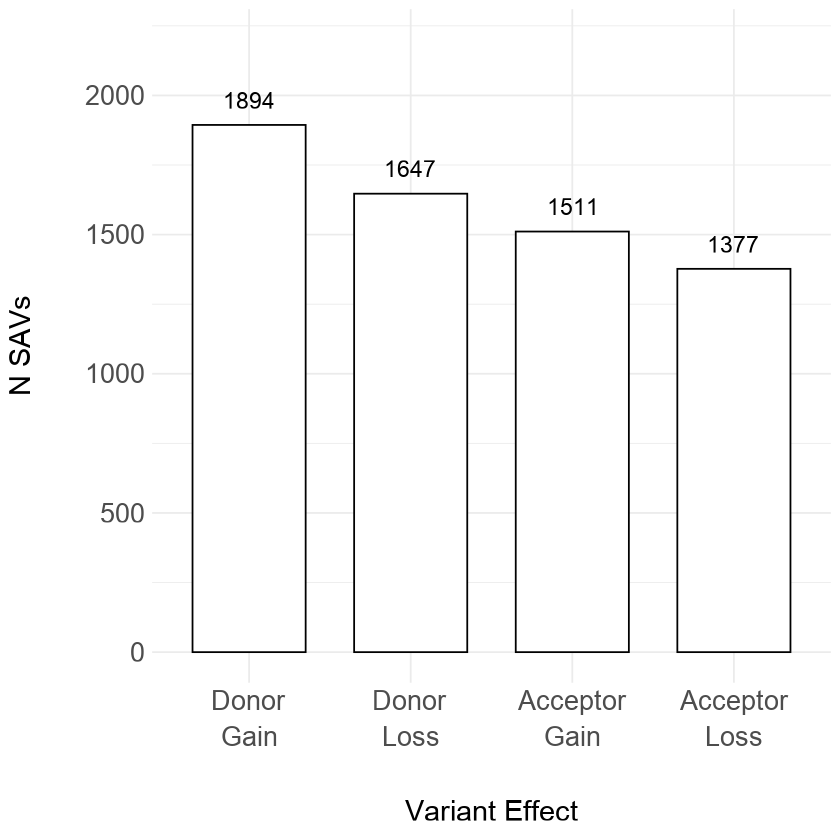

In [28]:
n_acceptors_donors_2_plot <- ggplot(n_acceptors_donors_2, aes(x = reorder(type, -count), y = count)) + geom_bar(stat = 'identity', width = 0.7, color = 'black', fill = 'white') + geom_text(aes(label = count), vjust = -1, family = 'Arial', size = 6) +
scale_y_continuous(limits = c(0, 2200)) + xlab('\nVariant Effect') + ylab('N SAVs\n') + theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 22), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20))

n_acceptors_donors_2_plot

In [29]:
type <- c('Acceptor\nGain','Acceptor\nLoss','Donor\nGain','Donor\nLoss')
count <- c(180,191,390,349)
n_acceptors_donors_5 <- data.frame(type, count)
head(n_acceptors_donors_5)

,type,count
,<chr>,<dbl>
1,Acceptor Gain,180
2,Acceptor Loss,191
3,Donor Gain,390
4,Donor Loss,349


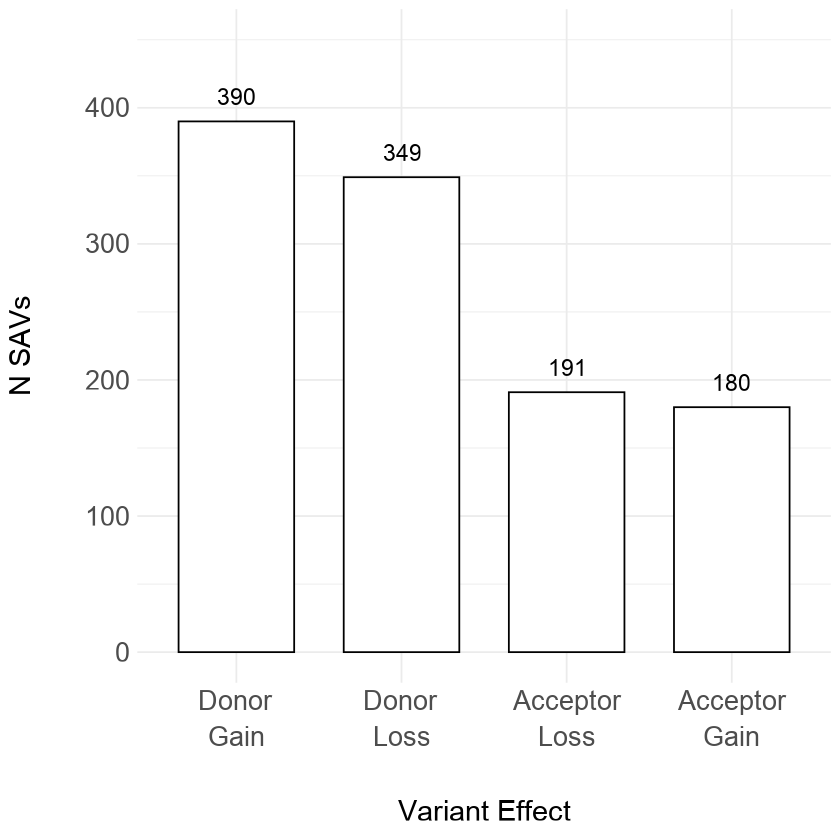

In [30]:
n_acceptors_donors_5_plot <- ggplot(n_acceptors_donors_5, aes(x = reorder(type, -count), y = count)) + geom_bar(stat = 'identity', width = 0.7, color = 'black', fill = 'white') + geom_text(aes(label = count), vjust = -1, family = 'Arial', size = 6) +
scale_y_continuous(limits = c(0, 450)) + xlab('\nVariant Effect') + ylab('N SAVs\n') + theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 22), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20))

n_acceptors_donors_5_plot

In [31]:
n_acceptors_donors <- plot_grid(n_acceptors_donors_2_plot, NULL, n_acceptors_donors_5_plot, labels = c('A','B'), label_size = 26, rel_widths = c(0.45,0.1,0.45), nrow = 1, scale = 0.9)

In [32]:
pdf('suppl_figs/n_acceptors_donors.pdf', width = 20, height = 8)
theme_set(theme_cowplot(font_family = 'Arial'))
n_acceptors_donors
dev.off()

png 
  2

Let's make another plot that indicates what percentage of each variant effect is unique. 

In [33]:
type <- c('Acceptor\nGain','Acceptor\nLoss','Donor\nGain','Donor\nLoss','Acceptor\nGain','Acceptor\nLoss','Donor\nGain','Donor\nLoss')
unique <- c('Single Effect','Single Effect','Single Effect','Single Effect','Multiple Effects','Multiple Effects','Multiple Effects','Multiple Effects')
count <- c(616,569,899,761,895,808,995,886)
label <- c('40.8 %','41.3 %','47.5 %','46.2 %','59.2 %','58.7 %','52.5 %','53.8 %')
n_acceptors_donors_2 <- data.frame(type, unique, count, label)
head(n_acceptors_donors_2)

,type,unique,count,label
,<chr>,<chr>,<dbl>,<chr>
1,Acceptor Gain,Single Effect,616,40.8 %
2,Acceptor Loss,Single Effect,569,41.3 %
3,Donor Gain,Single Effect,899,47.5 %
4,Donor Loss,Single Effect,761,46.2 %
5,Acceptor Gain,Multiple Effects,895,59.2 %
6,Acceptor Loss,Multiple Effects,808,58.7 %


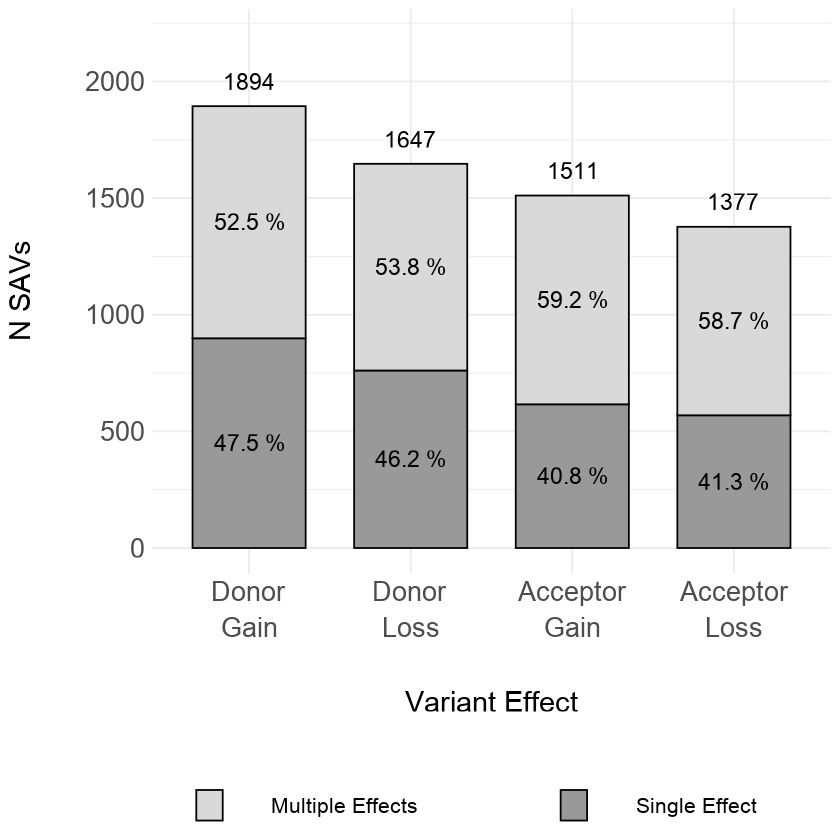

In [34]:
n_acceptors_donors_2_plot <- ggplot(n_acceptors_donors_2, aes(x = reorder(type, -count), y = count, fill = unique)) + 
geom_bar(position = 'stack', stat = 'identity', width = 0.7, color = 'black') + 
geom_text(aes(label = label), position = position_stack(vjust = 0.5), family = 'Arial', size = 6) + 
geom_text(aes(label = after_stat(y), group = type), stat = 'summary', fun = sum, vjust = -1, family = 'Arial', size = 6) +
scale_fill_manual(values = c('grey85','grey60')) +
scale_y_continuous(limits = c(0, 2200)) + xlab('\nVariant Effect\n') + ylab('N SAVs\n') + theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 22), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20)) +
theme(legend.title = element_blank(), legend.text = element_text(size = 16), legend.spacing.x = unit(1, 'cm')) +
theme(legend.position = 'bottom')

n_acceptors_donors_2_plot

In [35]:
type <- c('Acceptor\nGain','Acceptor\nLoss','Donor\nGain','Donor\nLoss','Acceptor\nGain','Acceptor\nLoss','Donor\nGain','Donor\nLoss')
unique <- c('Single Effect','Single Effect','Single Effect','Single Effect','Multiple Effects','Multiple Effects','Multiple Effects','Multiple Effects')
count <- c(39,37,146,133,141,154,244,216)
label <- c('21.7 %','19.4 %','37.4 %','38.1 %','78.3 %','80.6 %','62.6 %','61.9 %')
n_acceptors_donors_5 <- data.frame(type, unique, count, label)
head(n_acceptors_donors_5)

,type,unique,count,label
,<chr>,<chr>,<dbl>,<chr>
1,Acceptor Gain,Single Effect,39,21.7 %
2,Acceptor Loss,Single Effect,37,19.4 %
3,Donor Gain,Single Effect,146,37.4 %
4,Donor Loss,Single Effect,133,38.1 %
5,Acceptor Gain,Multiple Effects,141,78.3 %
6,Acceptor Loss,Multiple Effects,154,80.6 %


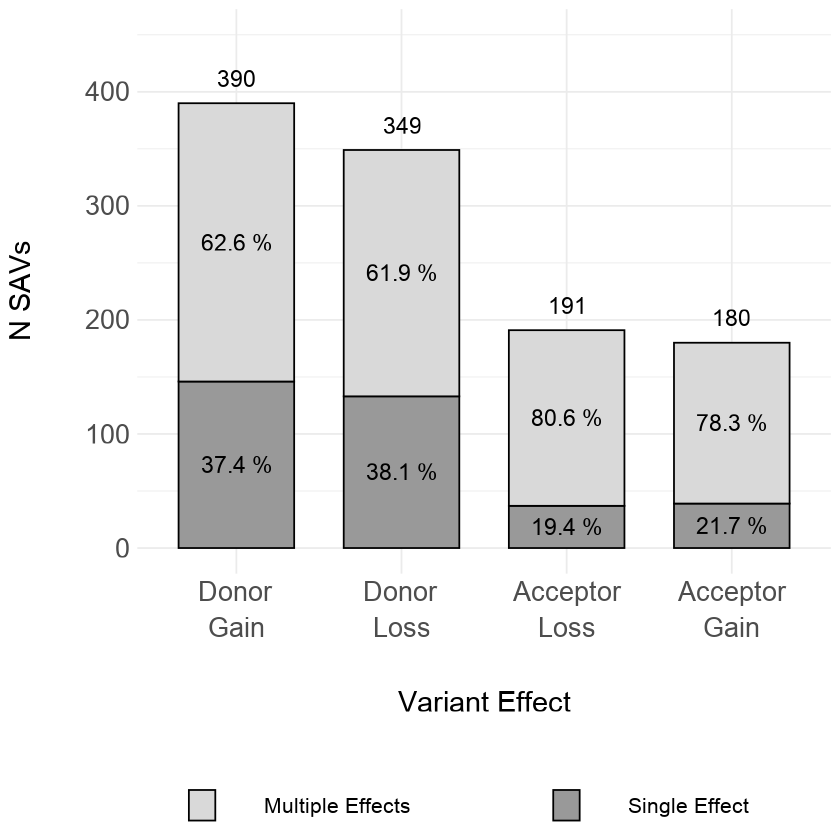

In [36]:
n_acceptors_donors_5_plot <- ggplot(n_acceptors_donors_5, aes(x = reorder(type, -count), y = count, fill = unique)) + 
geom_bar(position = 'stack', stat = 'identity', width = 0.7, color = 'black') + 
geom_text(aes(label = label), position = position_stack(vjust = 0.5), family = 'Arial', size = 6) + 
geom_text(aes(label = after_stat(y), group = type), stat = 'summary', fun = sum, vjust = -1, family = 'Arial', size = 6) +
scale_fill_manual(values = c('grey85','grey60')) +
scale_y_continuous(limits = c(0, 450)) + xlab('\nVariant Effect\n') + ylab('N SAVs\n') + theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 22), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20)) +
theme(legend.title = element_blank(), legend.text = element_text(size = 16), legend.spacing.x = unit(1, 'cm')) +
theme(legend.position = 'bottom')

n_acceptors_donors_5_plot

Warning message in grid.Call(C_stringMetric, as.graphicsAnnot(x$label)):
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_stringMetric, as.graphicsAnnot(x$label)):
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_stringMetric, as.graphicsAnnot(x$label)):
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_stringMetric, as.graphicsAnnot(x$label)):
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_stringMetric, as.graphicsAnnot(x$label)):
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_stringMetric, as.graphicsAnnot(x$label)):
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_stringMetric, as.graphicsAnnot(x$label)):
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_stringMetric, as.graphicsAnnot(x$label

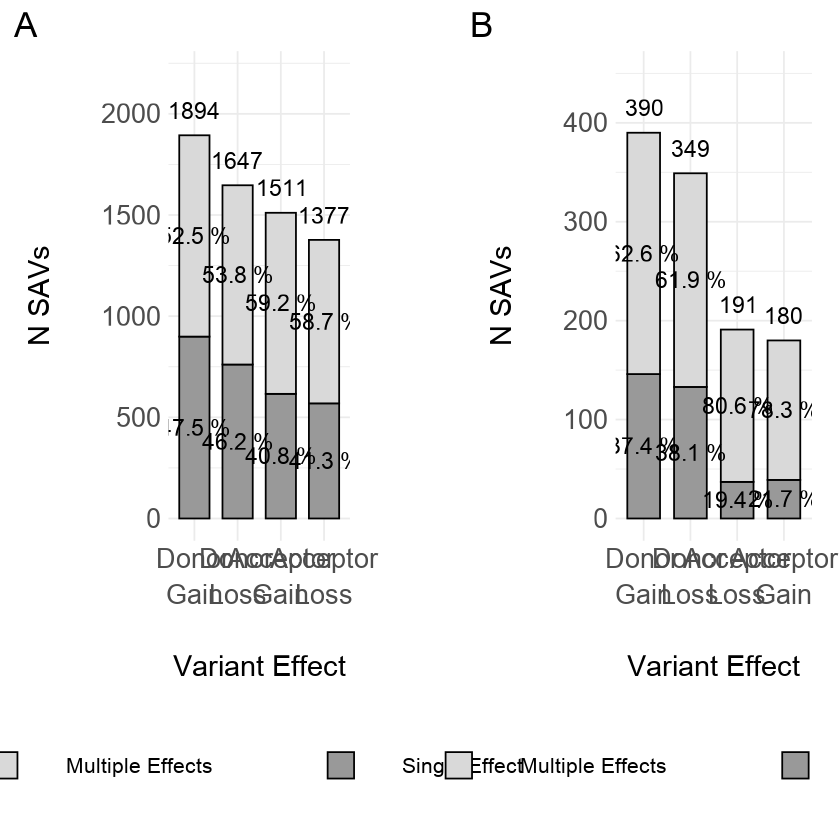

In [37]:
n_acceptors_donors_percents_per_unique <- plot_grid(n_acceptors_donors_2_plot, NULL, n_acceptors_donors_5_plot, labels = c('A','','B'), label_size = 26, rel_widths = c(0.45,0.1,0.45), nrow = 1, scale = 0.9)
n_acceptors_donors_percents_per_unique

In [38]:
pdf('suppl_figs/n_acceptors_donors_percents_per_unique.pdf', width = 20, height = 8)
theme_set(theme_cowplot(font_family = 'Arial'))
n_acceptors_donors_percents_per_unique
dev.off()

png 
  2

## Delta Correlations <a class = 'anchor' id = 'deltacorrelations'></a>

In [39]:
data_nonzero = subset(data, delta_max > 0)

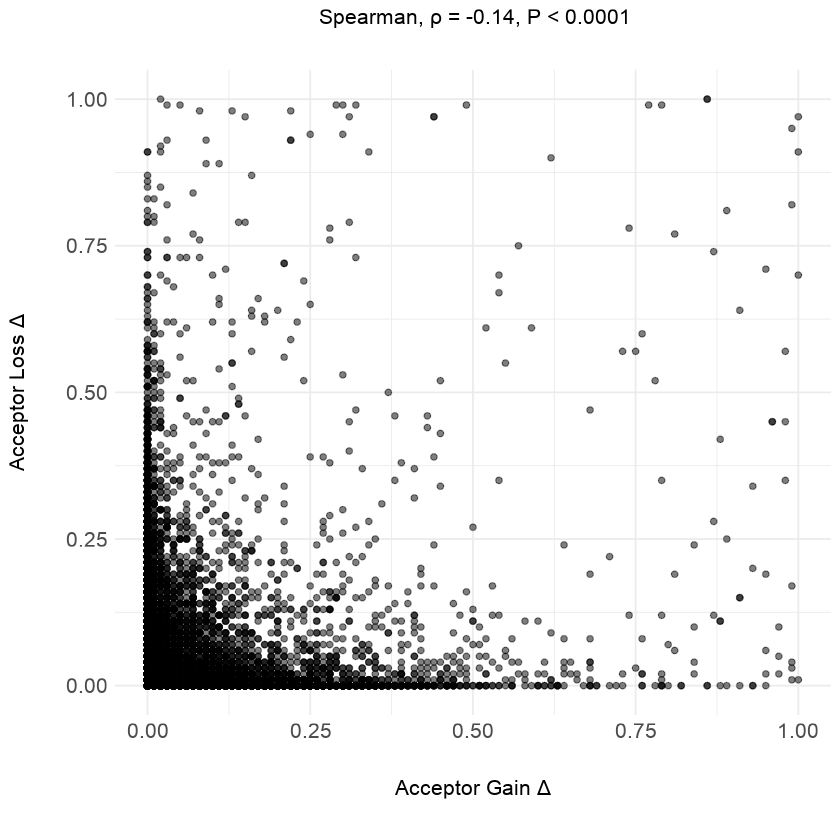

In [40]:
ag_al <- ggplot(data_nonzero, aes(x = ag_delta, y = al_delta)) + geom_point(alpha = 0.5) +
xlab('\nAcceptor Gain \u0394\n') + ylab('Acceptor Loss \u0394\n') + ggtitle('Spearman, \u03c1 = -0.14, P < 0.0001\n') +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 16), axis.text.x = element_text(size = 16), axis.text.y = element_text(size = 16)) +
theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 16))

ag_al

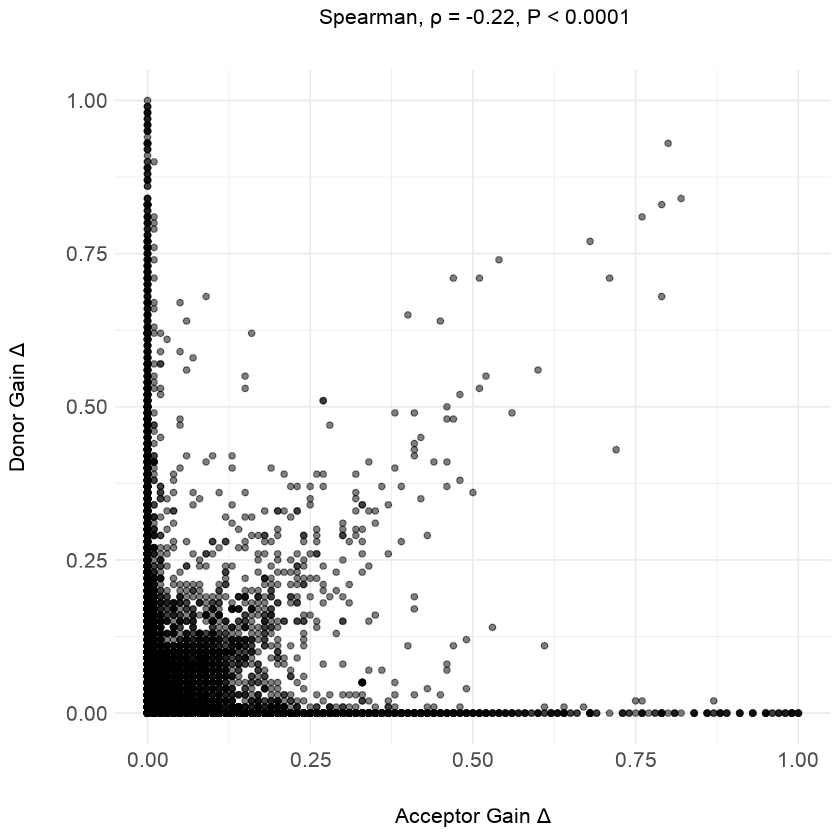

In [41]:
ag_dg <- ggplot(data_nonzero, aes(x = ag_delta, y = dg_delta)) + geom_point(alpha = 0.5) +
xlab('\nAcceptor Gain \u0394') + ylab('Donor Gain \u0394\n') + ggtitle('Spearman, \u03c1 = -0.22, P < 0.0001\n') +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 16), axis.text.x = element_text(size = 16), axis.text.y = element_text(size = 16)) +
theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 16))

ag_dg

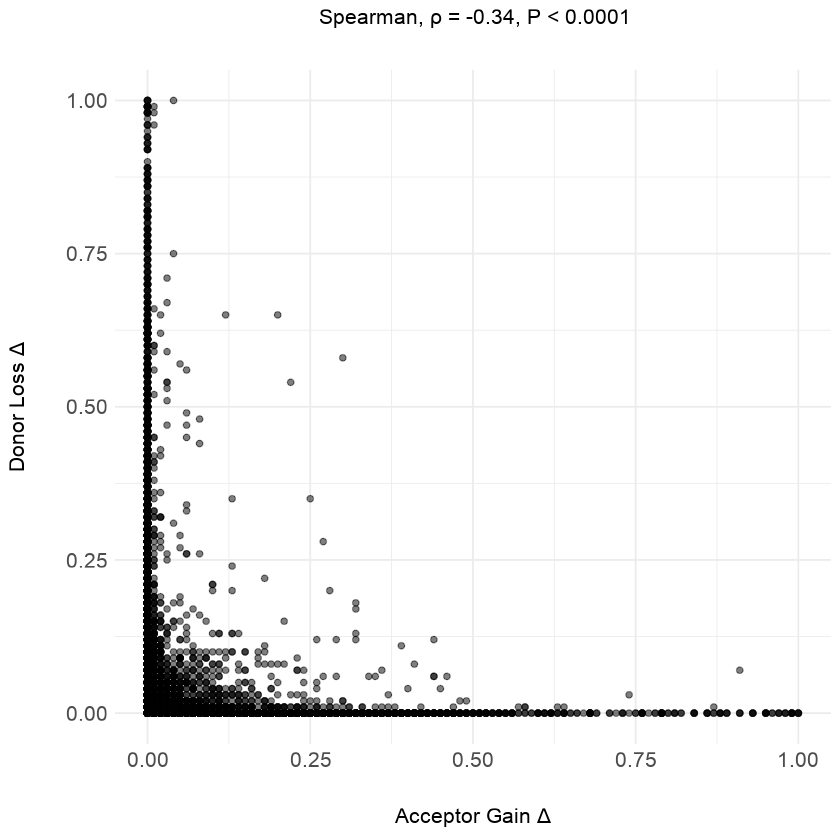

In [42]:
ag_dl <- ggplot(data_nonzero, aes(x = ag_delta, y = dl_delta)) + geom_point(alpha = 0.5) +
xlab('\nAcceptor Gain \u0394') + ylab('Donor Loss \u0394\n') + ggtitle('Spearman, \u03c1 = -0.34, P < 0.0001\n') +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 16), axis.text.x = element_text(size = 16), axis.text.y = element_text(size = 16)) +
theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 16))

ag_dl

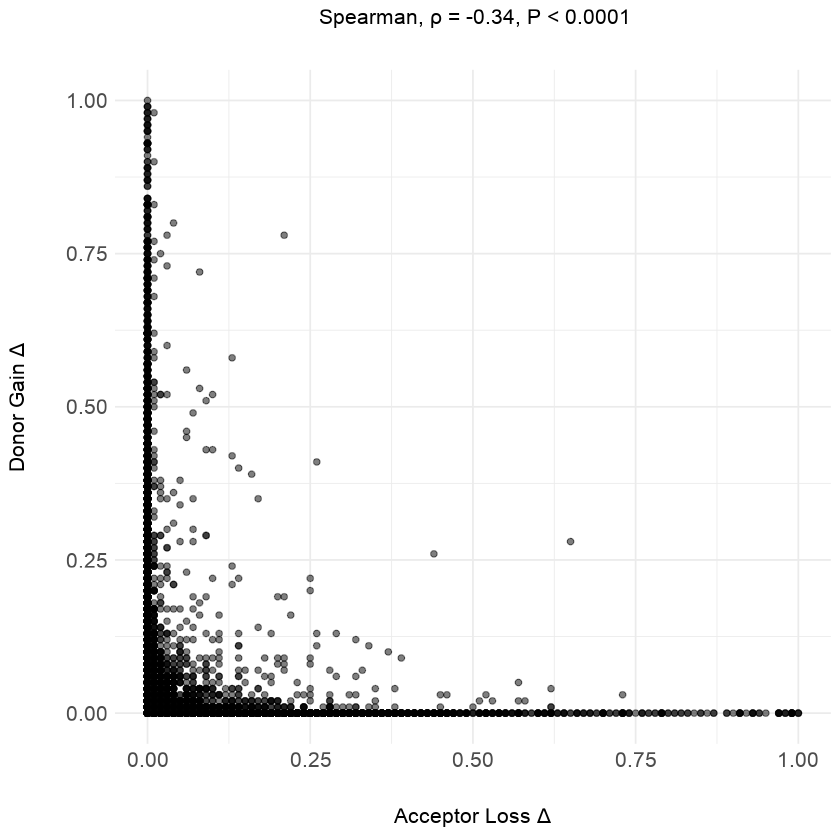

In [43]:
al_dg <- ggplot(data_nonzero, aes(x = al_delta, y = dg_delta)) + geom_point(alpha = 0.5) +
xlab('\nAcceptor Loss \u0394') + ylab('Donor Gain \u0394\n') + ggtitle('Spearman, \u03c1 = -0.34, P < 0.0001\n') +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 16), axis.text.x = element_text(size = 16), axis.text.y = element_text(size = 16)) +
theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 16))

al_dg

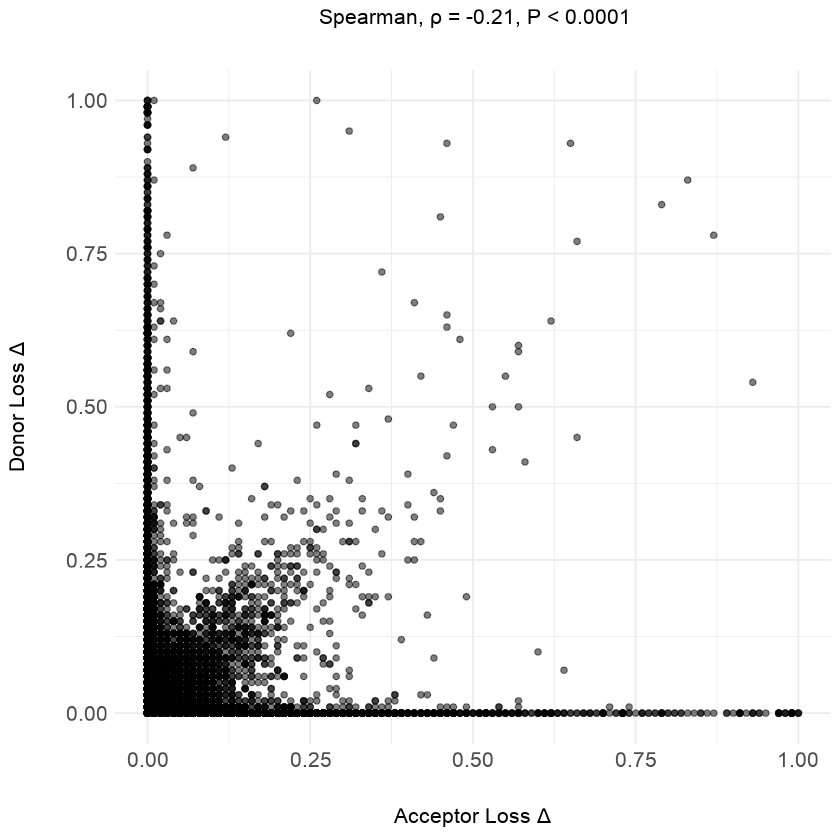

In [44]:
al_dl <- ggplot(data_nonzero, aes(x = al_delta, y = dl_delta)) + geom_point(alpha = 0.5) +
xlab('\nAcceptor Loss \u0394') + ylab('Donor Loss \u0394\n') + ggtitle('Spearman, \u03c1 = -0.21, P < 0.0001\n') +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 16), axis.text.x = element_text(size = 16), axis.text.y = element_text(size = 16)) +
theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 16))

al_dl

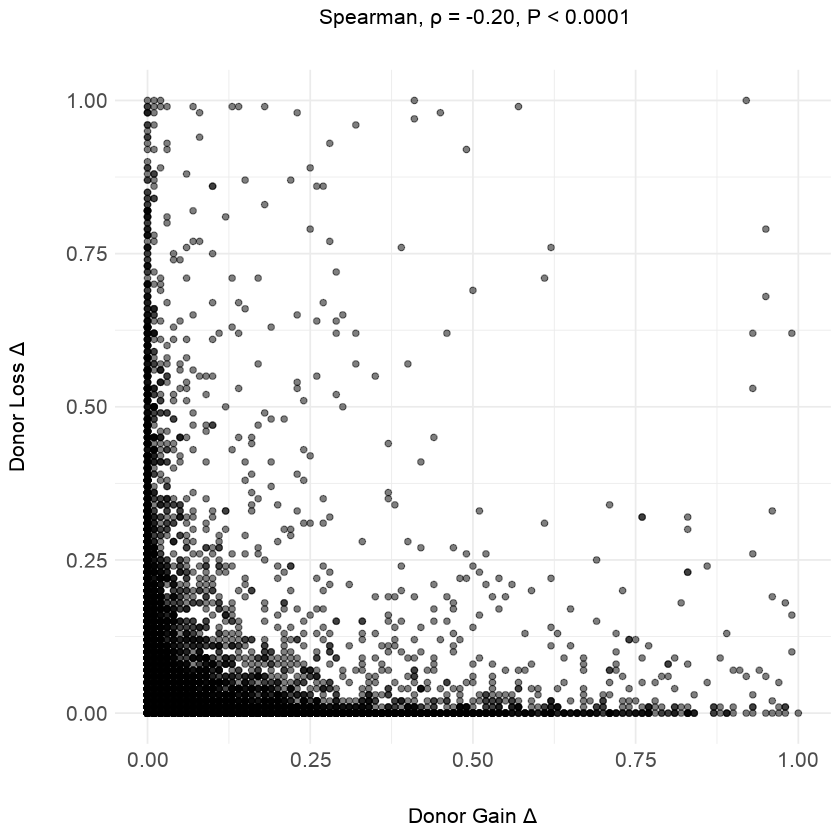

In [45]:
dg_dl <- ggplot(data_nonzero, aes(x = dg_delta, y = dl_delta)) + geom_point(alpha = 0.5) +
xlab('\nDonor Gain \u0394') + ylab('Donor Loss \u0394\n') + ggtitle('Spearman, \u03c1 = -0.20, P < 0.0001\n') +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 16), axis.text.x = element_text(size = 16), axis.text.y = element_text(size = 16)) +
theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 16))

dg_dl

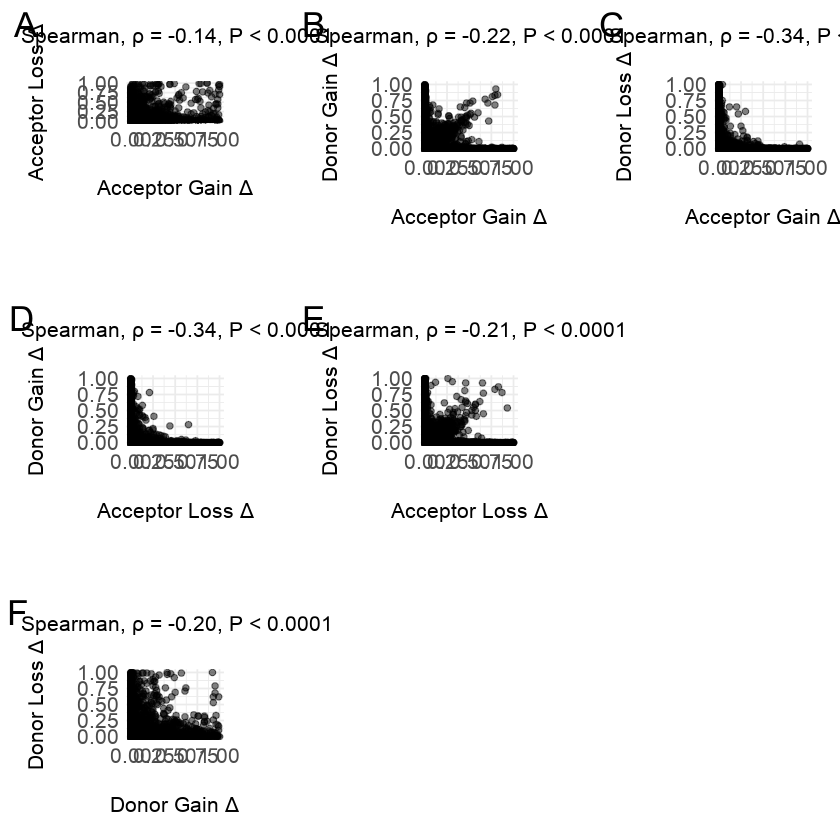

In [46]:
null_row <- plot_grid(NULL)
top_row <- plot_grid(ag_al, NULL, ag_dg, NULL, ag_dl, labels = c('A','','B','','C'), label_size = 26, rel_widths = c(0.3,0.05,0.3,0.05,0.3), nrow = 1, scale = 0.85)
middle_row <- plot_grid(al_dg, NULL, al_dl, NULL, labels = c('D','','E',''), label_size = 26, rel_widths = c(0.3,0.05,0.3,0.35), nrow = 1, scale = 0.85)
bottom_row <- plot_grid(dg_dl, NULL, NULL, labels = c('F','',''), label_size = 26, rel_widths = c(0.3,0.35,0.35), nrow = 1, scale = 0.85)
theme_set(theme_cowplot(font_family = 'Arial'))
delta_correlations <- plot_grid(top_row, null_row, middle_row, null_row, bottom_row, rel_heights = c(0.3,0.05,0.3,0.05,0.3), ncol = 1)
delta_correlations

In [47]:
pdf('suppl_figs/delta_correlations.pdf', width=16, height=16)
delta_correlations
dev.off()

png 
  2

## Distribution of Unique and Shared SAVs <a class = 'anchor' id = 'SAVdistribution'></a>

In [48]:
upset_2 <- subset(data_2)
upset_2 <- subset(upset_2, select = c('altai_gt_boolean','chagyrskaya_gt_boolean','denisovan_gt_boolean','vindija_gt_boolean'))
colnames(upset_2) = c('Altai','Chagyrskaya','Denisovan','Vindija')
upset_2 <- upset_2[, c(2, 4, 1, 3)]
head(upset_2)

,Chagyrskaya,Vindija,Altai,Denisovan
,<chr>,<chr>,<chr>,<chr>
25,True,True,True,True
66,False,False,True,False
131,True,True,True,True
156,True,True,True,False
211,True,True,True,True
219,False,True,True,True


In [49]:
nrow(upset_2)

[1] 5950

Warning message in upset_data(data, intersect, mode = mode, encode_sets = encode_sets, :
“Converting non-logical columns to binary: Chagyrskaya, Vindija, Altai, Denisovan”


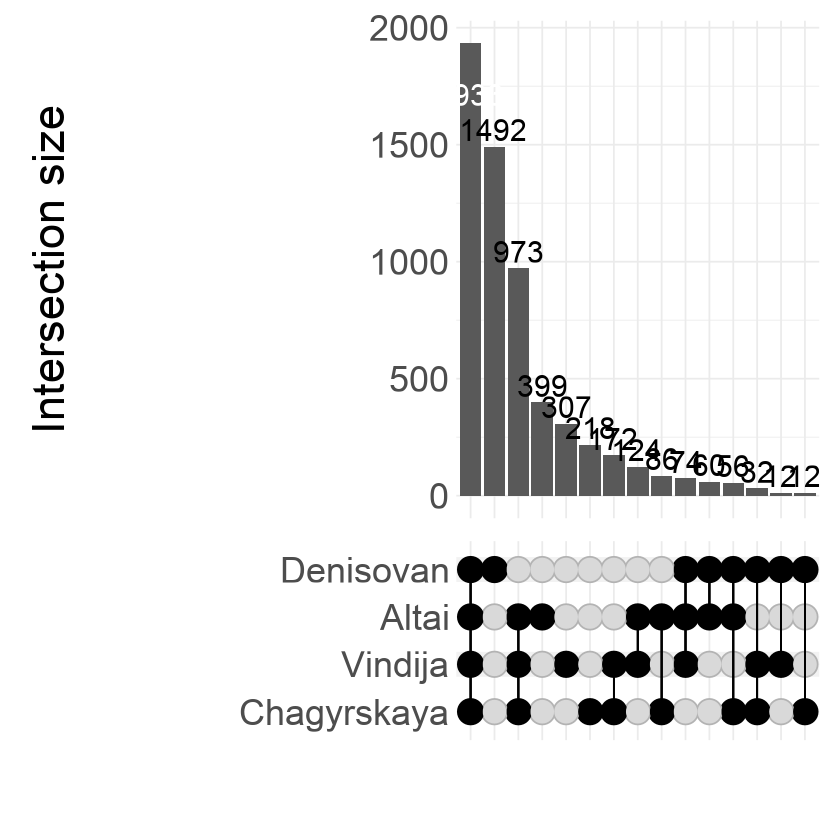

In [50]:
upset_2_plot <- upset(data = upset_2, intersect = colnames(upset_2), sort_sets = FALSE,
                      name = '', 
                      min_size = 0,
                      height_ratio = 0.4,
                      width_ratio = 0.25,
                      set_sizes = FALSE,
                      matrix=(intersection_matrix(geom=geom_point(size=6))),
                      base_annotations = list('Intersection size' = intersection_size(text = list(family = 'Arial', size = 8))),
                      themes = upset_modify_themes(list('Intersection size' = theme(text = element_text(family = 'Arial', size = 34)),  
                                                        'intersections_matrix' = theme(text = element_text(family = 'Arial', size = 34)))))

upset_2_plot 

In [51]:
pdf('upset_2_plot.pdf', width = 12, height = 12)
upset_2_plot
dev.off()

png 
  2

Repeat for delta >= 0.5.

In [52]:
upset_5 <- subset(data_5)
upset_5 <- subset(upset_5, select = c('altai_gt_boolean','chagyrskaya_gt_boolean','denisovan_gt_boolean','vindija_gt_boolean'))
colnames(upset_5) = c('Altai','Chagyrskaya','Denisovan','Vindija')
upset_5 <- upset_5[, c(2, 4, 1, 3)]
head(upset_5)

,Chagyrskaya,Vindija,Altai,Denisovan
,<chr>,<chr>,<chr>,<chr>
410,False,False,False,True
1882,False,False,False,True
3148,False,False,True,False
4235,True,True,True,True
4625,True,True,True,True
5441,False,False,False,True


In [53]:
nrow(upset_5)

[1] 1049

Warning message in upset_data(data, intersect, mode = mode, encode_sets = encode_sets, :
“Converting non-logical columns to binary: Chagyrskaya, Vindija, Altai, Denisovan”


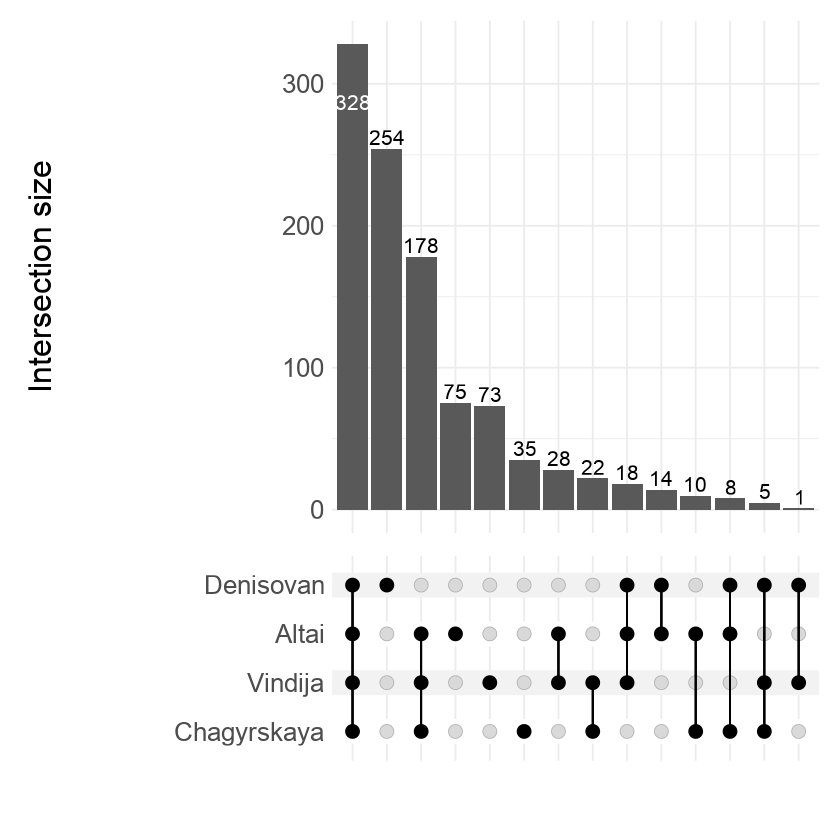

In [54]:
upset_5_plot <- upset(data = upset_5, intersect = colnames(upset_5), sort_sets=  FALSE,
      name = '', 
      min_size = 0,
      height_ratio = 0.4,
      width_ratio = 0.25,
      set_sizes = FALSE,
      base_annotations = list('Intersection size' = intersection_size(text = list(family = 'Arial', size = 5.5))),
      themes = upset_modify_themes(list('Intersection size' = theme(text = element_text(family = 'Arial', size = 24)),  
                                      'intersections_matrix' = theme(text = element_text(family = 'Arial', size = 24)))))
upset_5_plot

In [55]:
pdf('suppl_figs/upset_5_plot.pdf', width = 16, height = 10)
upset_5_plot
dev.off()

png 
  2

## N SAV Genes by Allele Origin <a class = 'anchor' id = 'ngenesbyalleleorigin'></a>

In [56]:
origin <- c('Ancient','Archaic-Specific','Introgressed')
count <- c(1856,1907,361)
Browning_n_genes_allele_origin <- data.frame(origin, count)
head(Browning_n_genes_allele_origin)

,origin,count
,<chr>,<dbl>
1,Ancient,1856
2,Archaic-Specific,1907
3,Introgressed,361


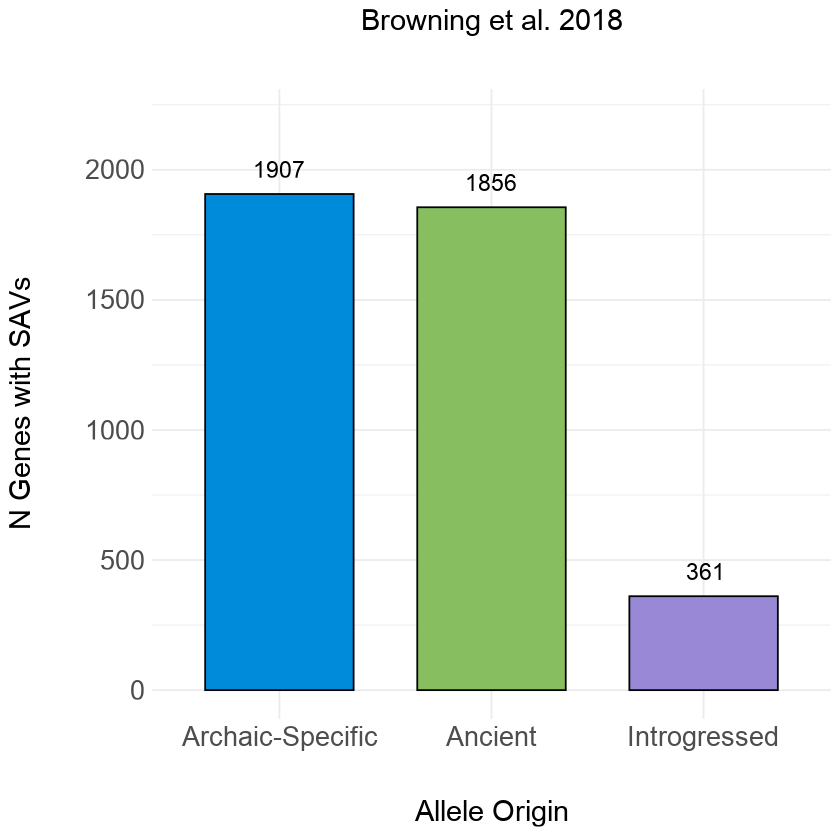

In [57]:
Browning_n_genes_allele_origin_plot <- ggplot(Browning_n_genes_allele_origin, aes(x = reorder(origin, -count), y = count, fill = origin)) + 
geom_bar(stat = 'identity', width = 0.7, color = 'black') + 
geom_text(aes(label = count), vjust = -1, family = 'Arial', size = 6) +
scale_y_continuous(limits = c(0, 2200)) + xlab('\nAllele Origin') + ylab('N Genes with SAVs\n') + 
ggtitle('Browning et al. 2018\n') +
scale_fill_manual(values = c(ancient_color,archaic_specific_color,introgressed_color)) +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 22)) +
theme(axis.title = element_text(size = 22), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20)) +
theme(legend.position = "none")

Browning_n_genes_allele_origin_plot

In [58]:
origin <- c('Ancient','Archaic-Specific','Introgressed')
count <- c(1896,1907,239)
Vernot_n_genes_allele_origin <- data.frame(origin, count)
head(Vernot_n_genes_allele_origin)

,origin,count
,<chr>,<dbl>
1,Ancient,1896
2,Archaic-Specific,1907
3,Introgressed,239


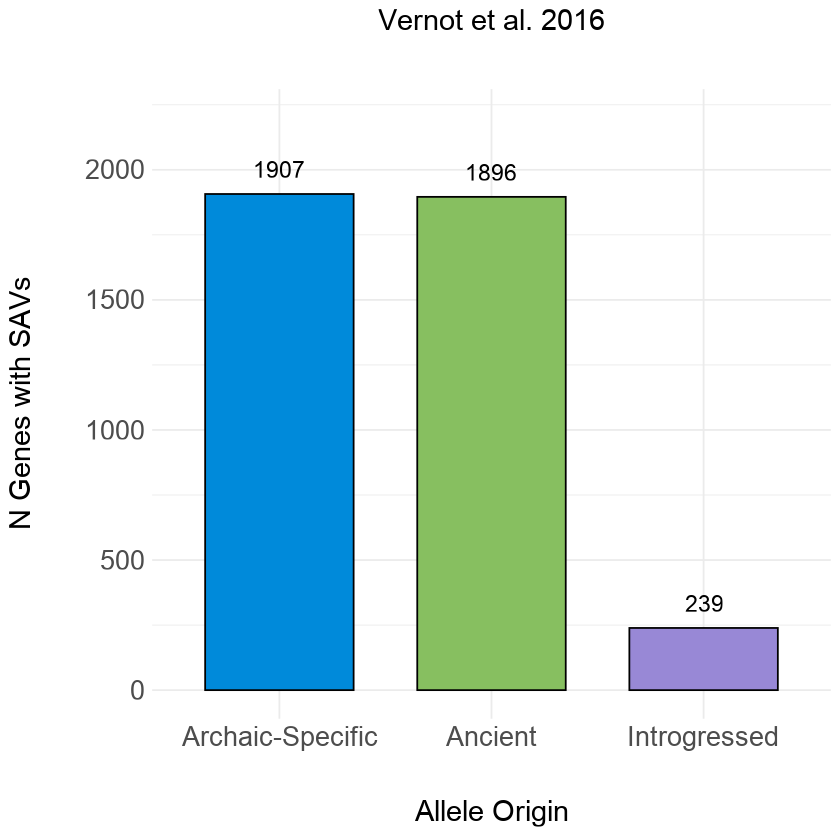

In [59]:
Vernot_n_genes_allele_origin_plot <- ggplot(Vernot_n_genes_allele_origin, aes(x = reorder(origin, -count), y = count, fill = origin)) + 
geom_bar(stat = 'identity', width = 0.7, color = 'black') + 
geom_text(aes(label = count), vjust = -1, family = 'Arial', size = 6) +
scale_y_continuous(limits = c(0, 2200)) + xlab('\nAllele Origin') + ylab('N Genes with SAVs\n') + 
ggtitle('Vernot et al. 2016\n') +
scale_fill_manual(values = c(ancient_color,archaic_specific_color,introgressed_color)) +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 22)) +
theme(axis.title = element_text(size = 22), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20)) +
theme(legend.position = "none")

Vernot_n_genes_allele_origin_plot

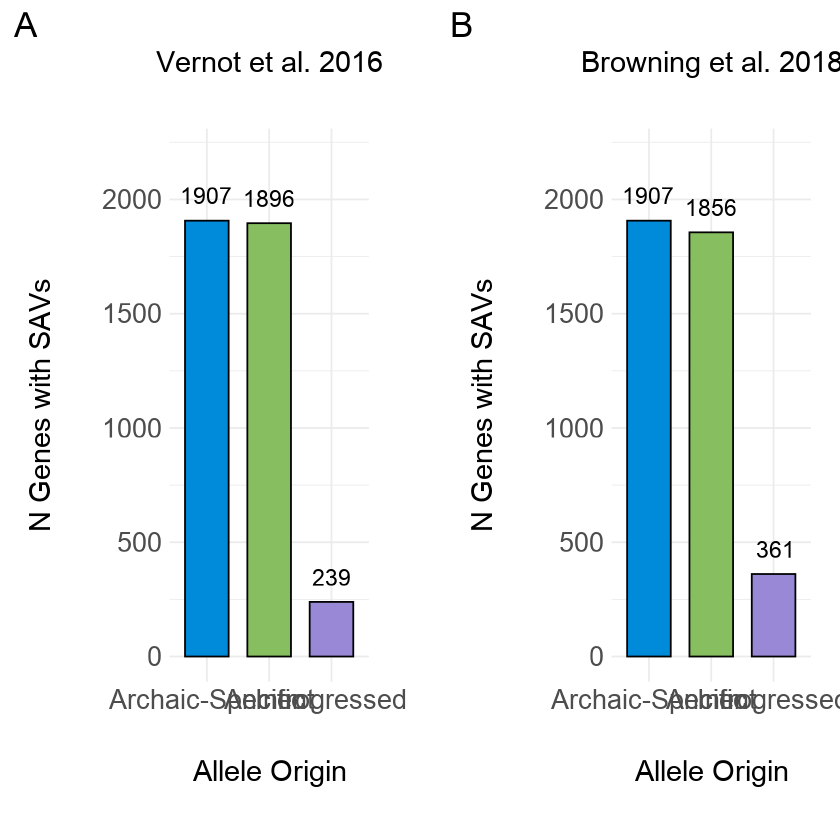

In [60]:
theme_set(theme_cowplot(font_family = 'Arial'))
n_genes_allele_origin <- plot_grid(Vernot_n_genes_allele_origin_plot, NULL, Browning_n_genes_allele_origin_plot, labels = c('A','','B'), label_size = 26, rel_widths = c(0.45,0.05,0.45), nrow = 1, scale = 0.9)
n_genes_allele_origin

In [61]:
pdf('suppl_figs/n_genes_archaic_allele_origin.pdf', width = 24, height = 10)
n_genes_allele_origin
dev.off()

png 
  2

## Introgression Overlap <a class = 'anchor' id = 'introgressionoverlap'></a>

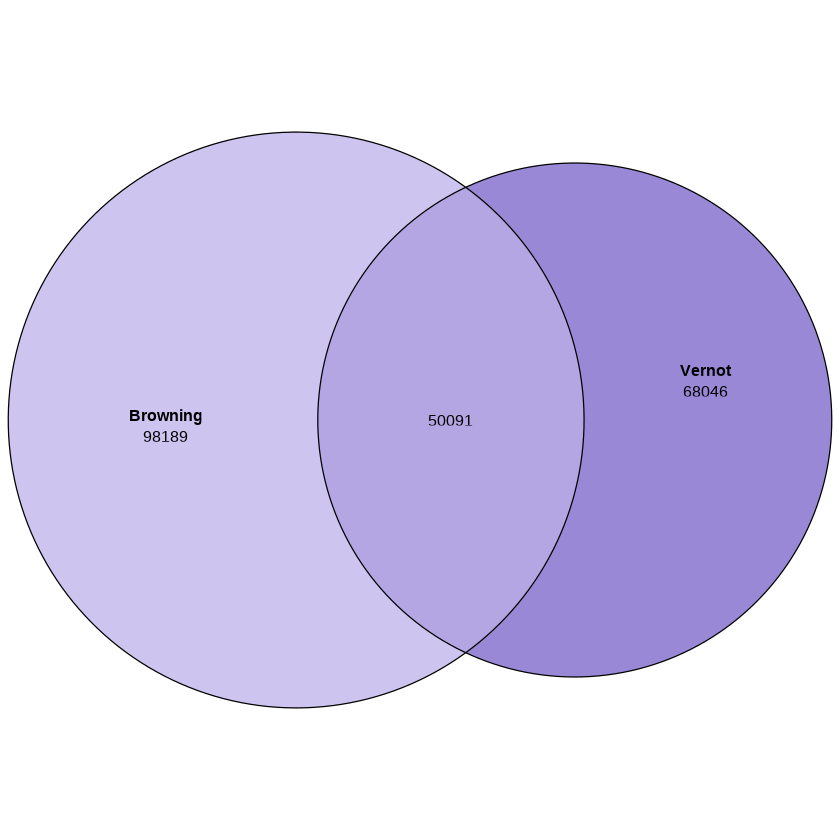

In [62]:
introgression_overlap_all_variants <- euler(c(Browning = 98189, Vernot = 68046, 'Browning&Vernot' = 50091))
introgression_overlap_all_variants_plot <- plot(introgression_overlap_all_variants, fills = c('#cdc5f0', introgressed_color), family = 'Arial', fontsize = 12, quantities = list(family = 'Arial', fontsize = 12))
introgression_overlap_all_variants_plot

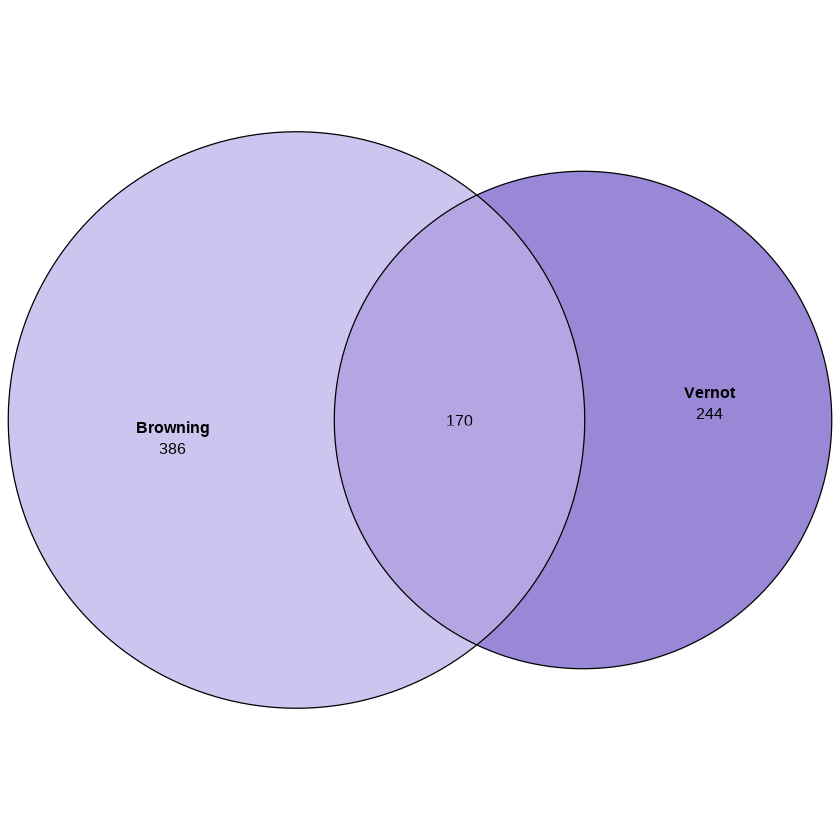

In [63]:
introgression_overlap_SAVs <- euler(c(Browning = 386, Vernot = 244, 'Browning&Vernot' = 170))
introgression_overlap_SAVs_plot <- plot(introgression_overlap_SAVs, fills = c('#cdc5f0', introgressed_color), family = 'Arial', fontsize = 12, quantities = list(family = 'Arial', fontsize = 12))
introgression_overlap_SAVs_plot

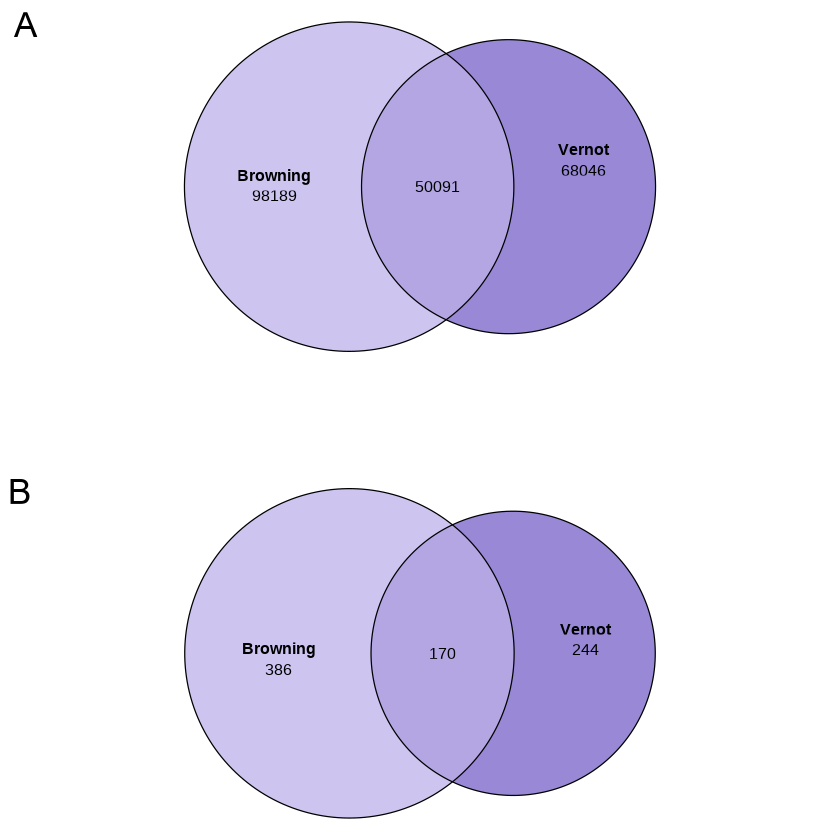

In [64]:
theme_set(theme_cowplot(font_family = 'Arial'))
introgression_overlap <- plot_grid(introgression_overlap_all_variants_plot, NULL, introgression_overlap_SAVs_plot, labels = c('A','','B'), label_size = 26, rel_heights = c(0.4,0.1,0.4), ncol = 1, scale = 0.9)
introgression_overlap

In [65]:
pdf('suppl_figs/introgression_overlap.pdf', width = 10, height = 12)
introgression_overlap
dev.off()

png 
  2

## N Genes <a class = 'anchor' id = 'ngenes'></a>

In [66]:
n_SAVs <- c(1,2,3,4,5,6,7,8,9,10,11)
count <- c(3111,769,246,71,19,14,6,1,2,1,2)
n_SAVs_per_gene <- data.frame(n_SAVs, count)
n_SAVs_per_gene$n_SAVs <- as.factor(n_SAVs_per_gene$n_SAVs)
head(n_SAVs_per_gene)

,n_SAVs,count
,<fct>,<dbl>
1,1,3111
2,2,769
3,3,246
4,4,71
5,5,19
6,6,14


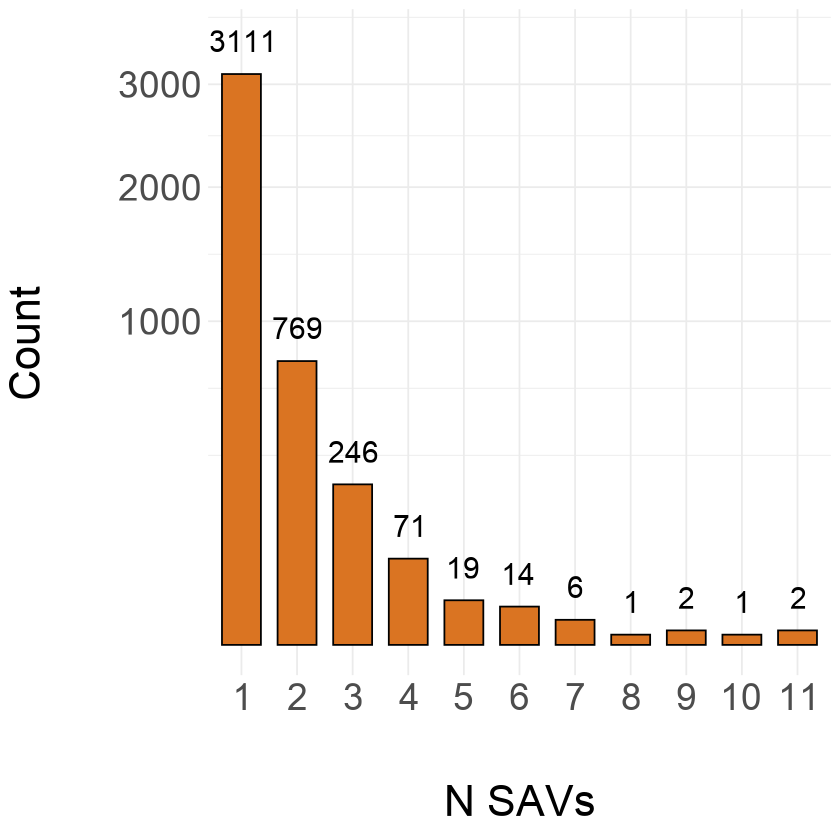

In [67]:
n_SAVs_per_gene_plot <- ggplot(n_SAVs_per_gene, aes(x = n_SAVs, y = count)) + geom_bar(stat = 'identity', width = 0.7, color = 'black', fill = '#DA7422') + geom_text(aes(label = count), vjust = -1, family = 'Arial', size = 8) +
scale_y_sqrt() + xlab('\nN SAVs') + ylab('Count\n') + theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 32), axis.text.x = element_text(size = 28), axis.text.y = element_text(size = 28)) +
coord_cartesian(ylim = c(0,3500))

n_SAVs_per_gene_plot

In [68]:
pdf('suppl_figs/n_SAVs_per_gene_plot.pdf', width = 20, height = 12)
n_SAVs_per_gene_plot
dev.off()

png 
  2

# Phenotype Enrichment <a class = 'anchor' id = 'phenotypeenrichment'></a>

Let's write a function to make the repetitive plotting below easier.

In [69]:
phenotype_enrichment_plot <- function(path, stricter_p_value_threshold, strict_p_value_threshold, plot_title) {
    
    enrichment_data <- read.csv(path, header = TRUE, sep = '\t')
    systems_numbers = c('behavior'=1,'cardiovascular'=2,'digestive'=3,'endocrine'=4,'hematologic'=5,'immune'=6,'integumentary'=7,'lymphatic'=8,'metabolic'=9,'nervous'=10,'reproductive'=11,'respiratory'=12,'skeletal'=13,'skeletal muscle'=14,'urinary'=15,'other'=16)
    enrichment_data$system <- factor(enrichment_data$system, levels = c('behavior','cardiovascular','digestive','endocrine','hematologic','immune','integumentary','lymphatic','metabolic','nervous','reproductive','respiratory','skeletal','skeletal muscle','urinary','other'))
    enrichment_data$x_coordinate = systems_numbers[enrichment_data$system] + (log2(enrichment_data$enrichment)/4)
    
    ggplot(enrichment_data, aes(x = x_coordinate, y = -log10(p_value), color = system)) + geom_point(alpha = 0.5, aes(size = enrichment)) +
    geom_hline(yintercept=-log10(stricter_p_value_threshold), linetype='dotted', color = 'black') +
    geom_hline(yintercept=-log10(strict_p_value_threshold), linetype='dashed', color = 'black') +
    scale_x_continuous(breaks=1:16, labels = c('behavior','cardiovascular','digestive','endocrine','hematologic','immune','integumentary','lymphatic','metabolic','nervous','reproductive','respiratory','skeletal','skeletal muscle','urinary','other')) +
    ggtitle(plot_title) + xlab('\nSystem') + ylab('-log10(P)\n') + 
    theme_minimal() + theme(text = element_text(family = 'Arial')) + theme(plot.title = element_text(size = 18, hjust = 0.5)) +
    theme(axis.title = element_text(size = 18), axis.text.x = element_text(size = 16, angle = 45, hjust = 1), axis.text.y = element_text(size = 16)) +
    theme(legend.position = 'none')
}

Starting with archaic-specific for the main figure.

## Archaic-Specific <a class = 'anchor' id = 'archaicspecific'></a>

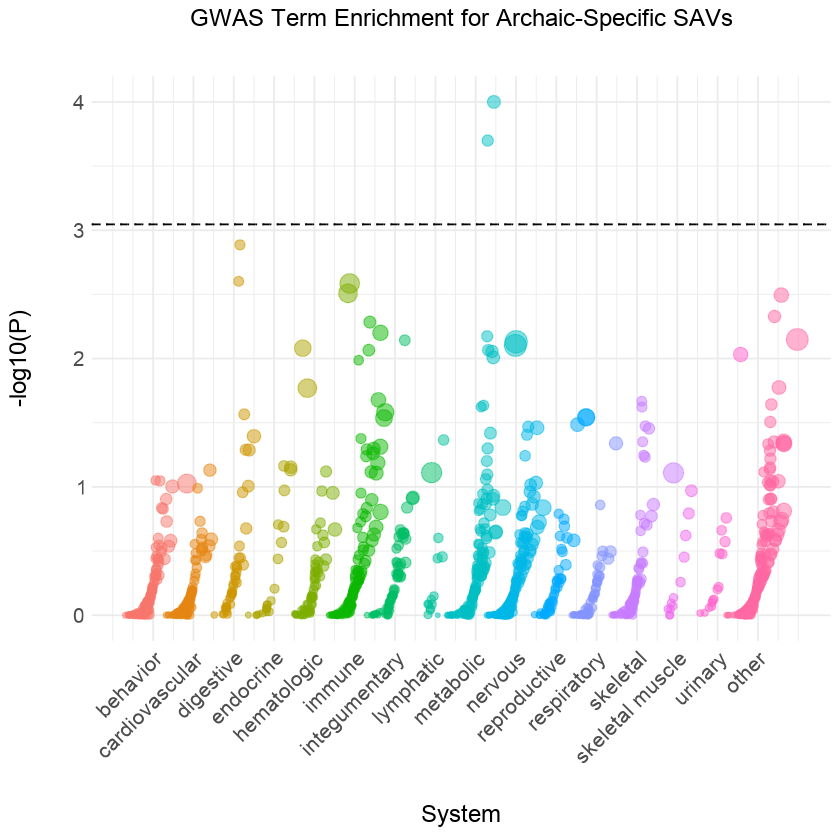

In [70]:
archaic_specific_GWAS_plot <- phenotype_enrichment_plot('../data/phenotype_enrichment/enrichment/archaic_specific_GWAS_enrichment_with_system.txt', 0.0009, 0.0009, 'GWAS Term Enrichment for Archaic-Specific SAVs\n')
archaic_specific_GWAS_plot

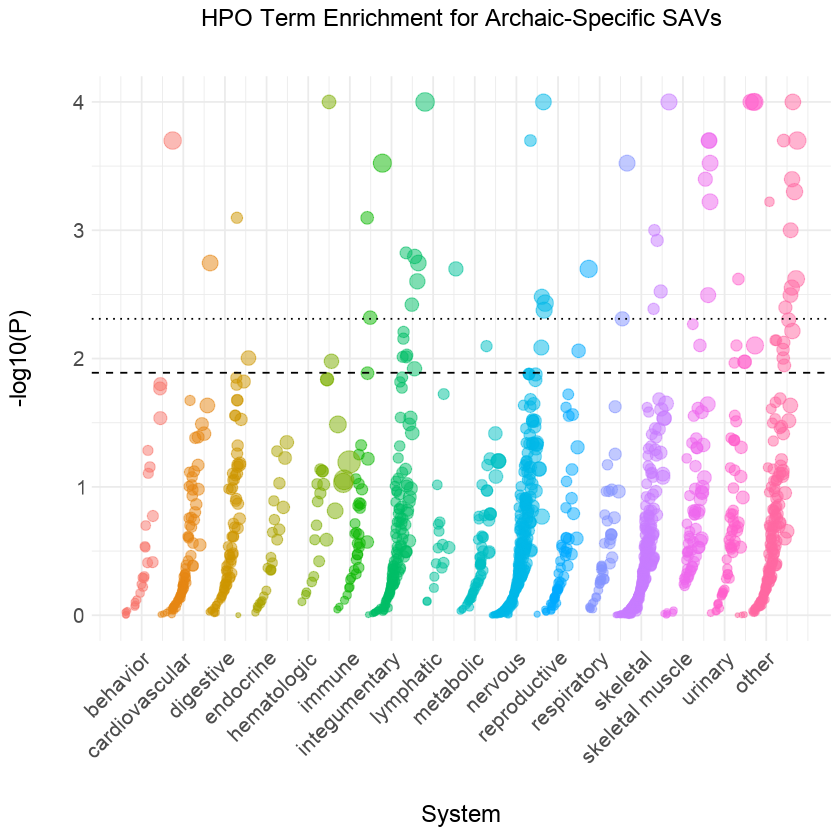

In [71]:
archaic_specific_HPO_plot <- phenotype_enrichment_plot('../data/phenotype_enrichment/enrichment/archaic_specific_HPO_enrichment_with_system.txt', 0.0049, 0.0129, 'HPO Term Enrichment for Archaic-Specific SAVs\n')
archaic_specific_HPO_plot

Warning message in grid.Call(C_stringMetric, as.graphicsAnnot(x$label)):
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_stringMetric, as.graphicsAnnot(x$label)):
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_stringMetric, as.graphicsAnnot(x$label)):
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_stringMetric, as.graphicsAnnot(x$label)):
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_stringMetric, as.graphicsAnnot(x$label)):
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_stringMetric, as.graphicsAnnot(x$label)):
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_stringMetric, as.graphicsAnnot(x$label)):
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_stringMetric, as.graphicsAnnot(x$label

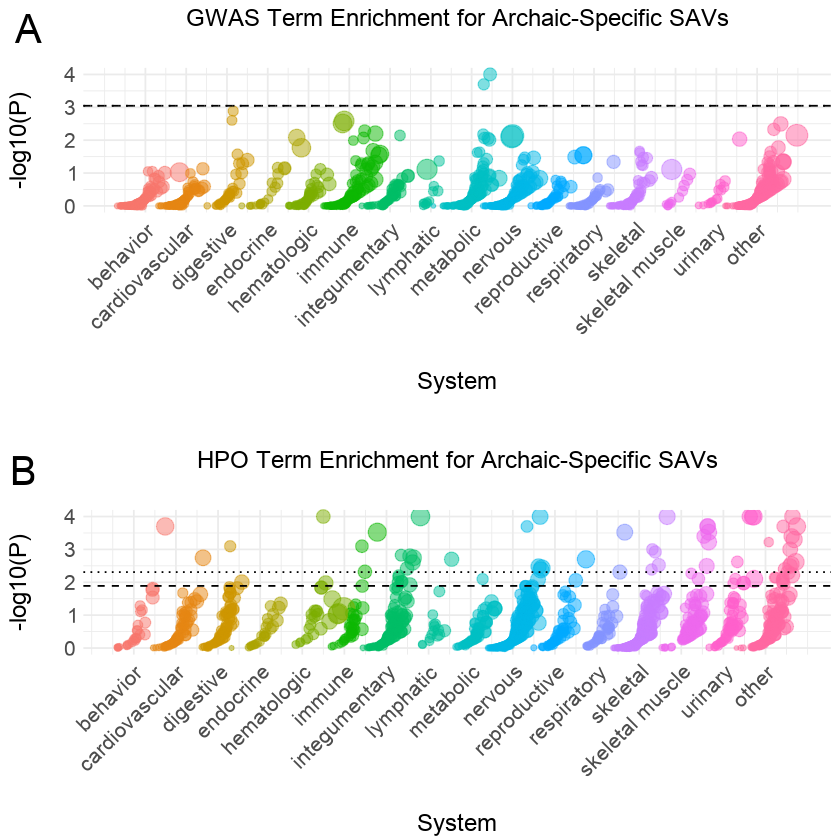

In [72]:
theme_set(theme_cowplot(font_family = 'Arial'))
archaic_specific_enrichment_plot <- plot_grid(archaic_specific_GWAS_plot, NULL, archaic_specific_HPO_plot, labels = c('A','','B'), label_size = 30, rel_heights = c(0.45,0.05,0.45), ncol = 1)
archaic_specific_enrichment_plot

In [73]:
pdf('enrichment_plot.pdf', width = 16, height = 16)
archaic_specific_enrichment_plot
dev.off()

png 
  2

## Altai

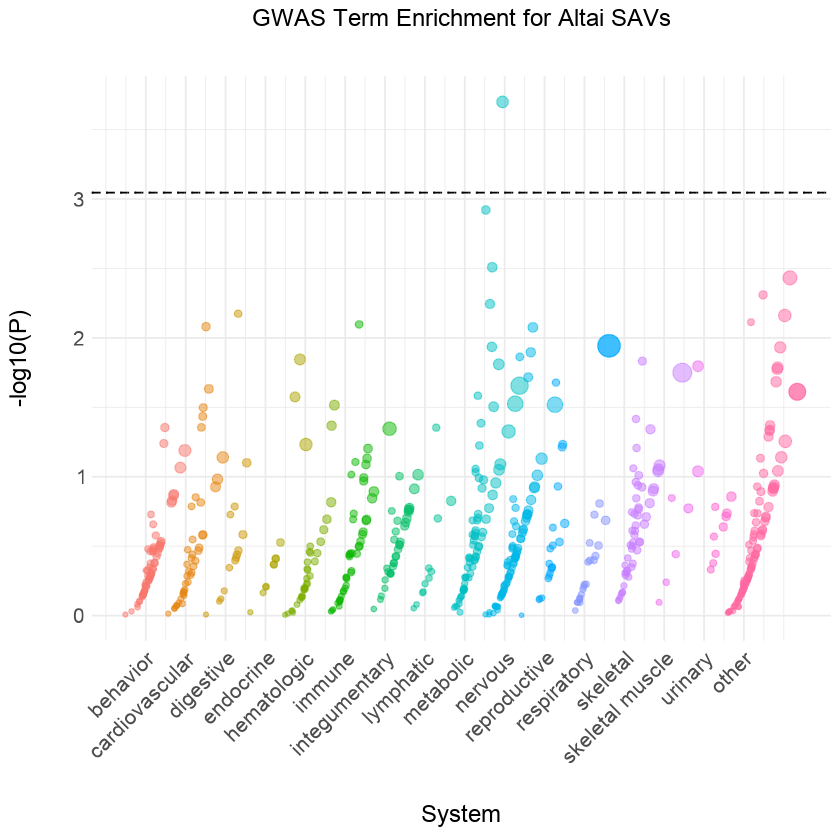

In [74]:
altai_GWAS_plot <- phenotype_enrichment_plot('../data/phenotype_enrichment/enrichment/altai_GWAS_enrichment_with_system.txt', 0.0009, 0.0009, 'GWAS Term Enrichment for Altai SAVs\n')
altai_GWAS_plot

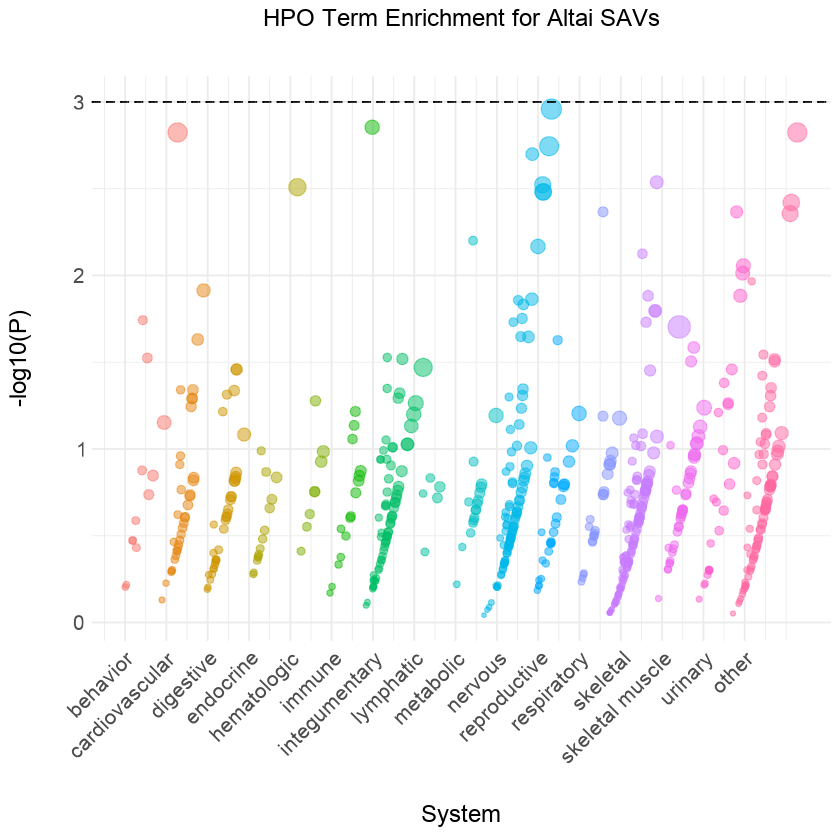

In [75]:
altai_HPO_plot <- phenotype_enrichment_plot('../data/phenotype_enrichment/enrichment/altai_HPO_enrichment_with_system.txt', 0.0010, 0.0010, 'HPO Term Enrichment for Altai SAVs\n')
altai_HPO_plot

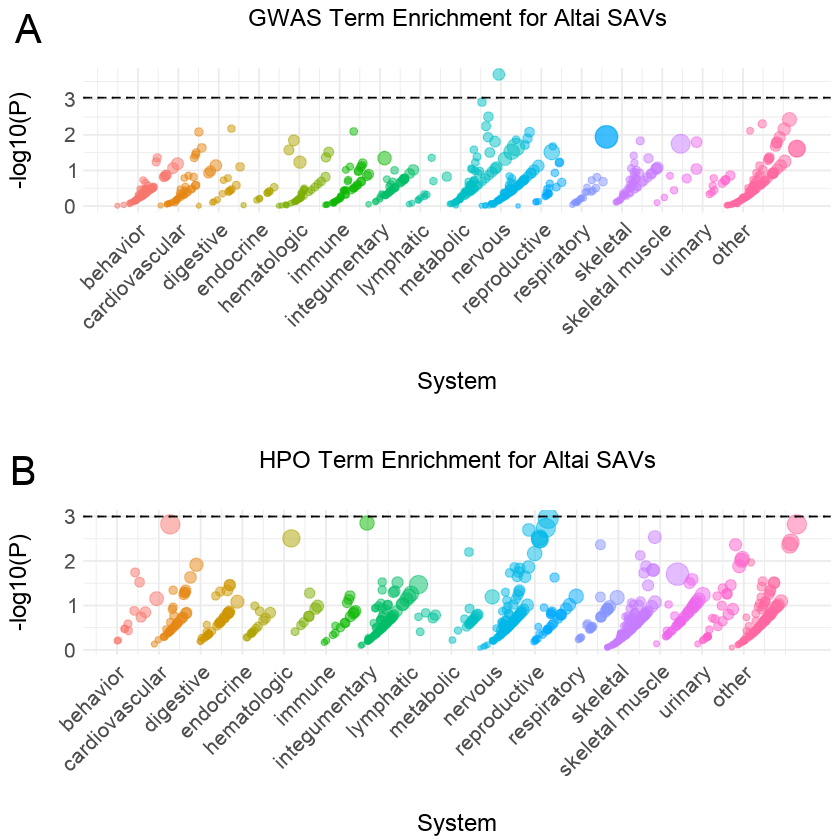

In [76]:
theme_set(theme_cowplot(font_family = 'Arial'))
altai_enrichment_plot <- plot_grid(altai_GWAS_plot, NULL, altai_HPO_plot, labels = c('A','','B'), label_size = 30, rel_heights = c(0.45,0.05,0.45), ncol = 1)
altai_enrichment_plot

In [77]:
pdf('suppl_figs/altai_enrichment.pdf', width = 16, height = 16)
altai_enrichment_plot
dev.off()

png 
  2

## Browning et al. 2018 Introgressed

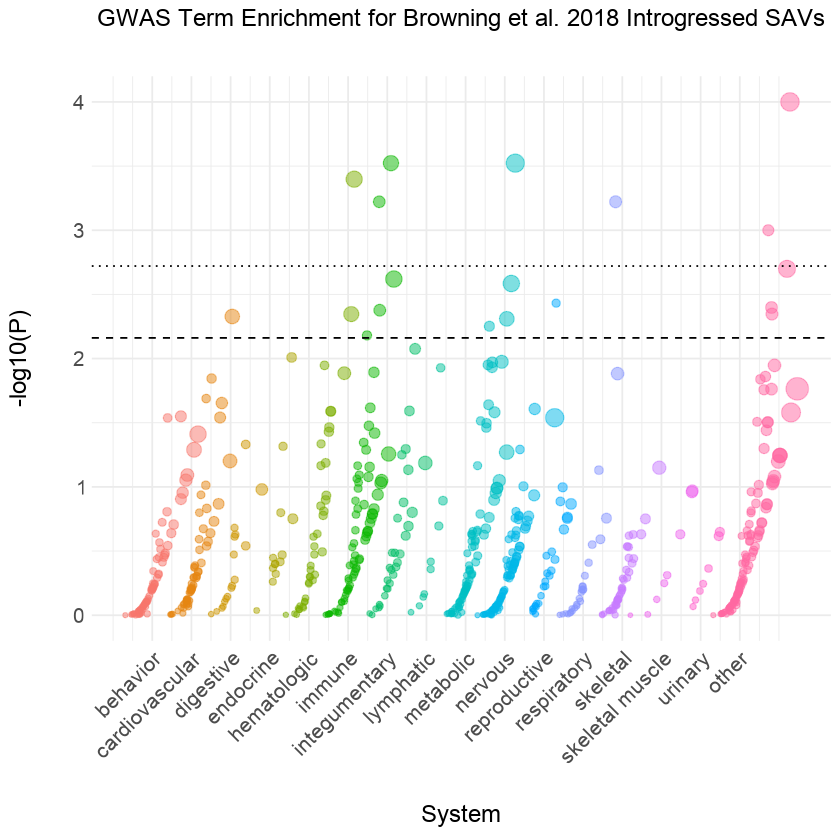

In [78]:
Browning_introgressed_GWAS_plot <- phenotype_enrichment_plot('../data/phenotype_enrichment/enrichment/Browning_introgressed_GWAS_enrichment_with_system.txt', 0.0019, 0.0069, 'GWAS Term Enrichment for Browning et al. 2018 Introgressed SAVs\n')
Browning_introgressed_GWAS_plot

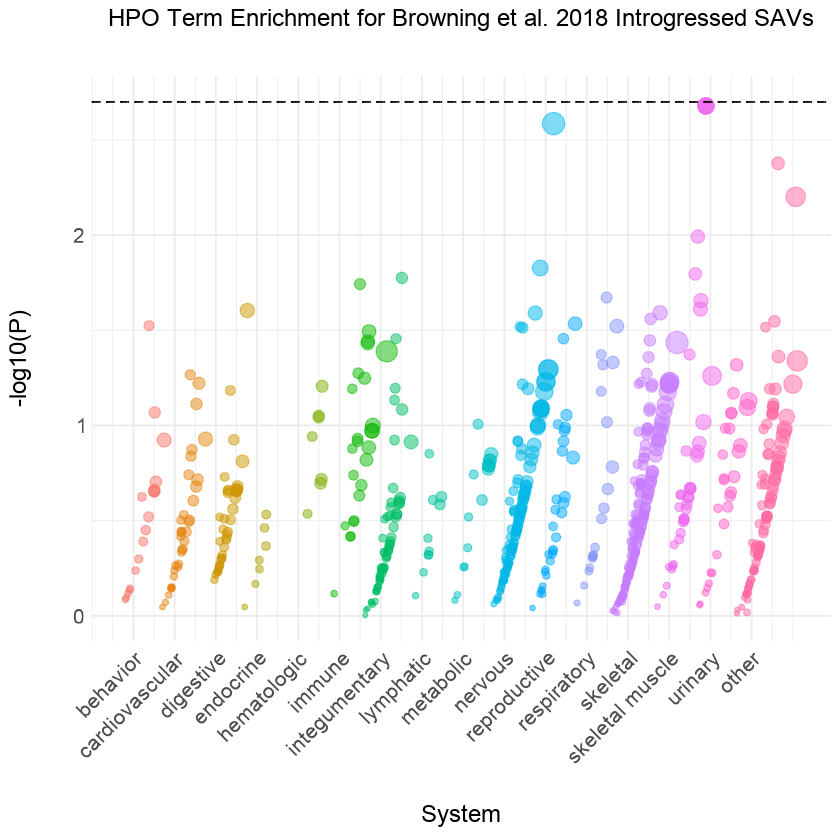

In [79]:
Browning_introgressed_HPO_plot <- phenotype_enrichment_plot('../data/phenotype_enrichment/enrichment/Browning_introgressed_HPO_enrichment_with_system.txt', 0.0020, 0.0020, 'HPO Term Enrichment for Browning et al. 2018 Introgressed SAVs\n')
Browning_introgressed_HPO_plot

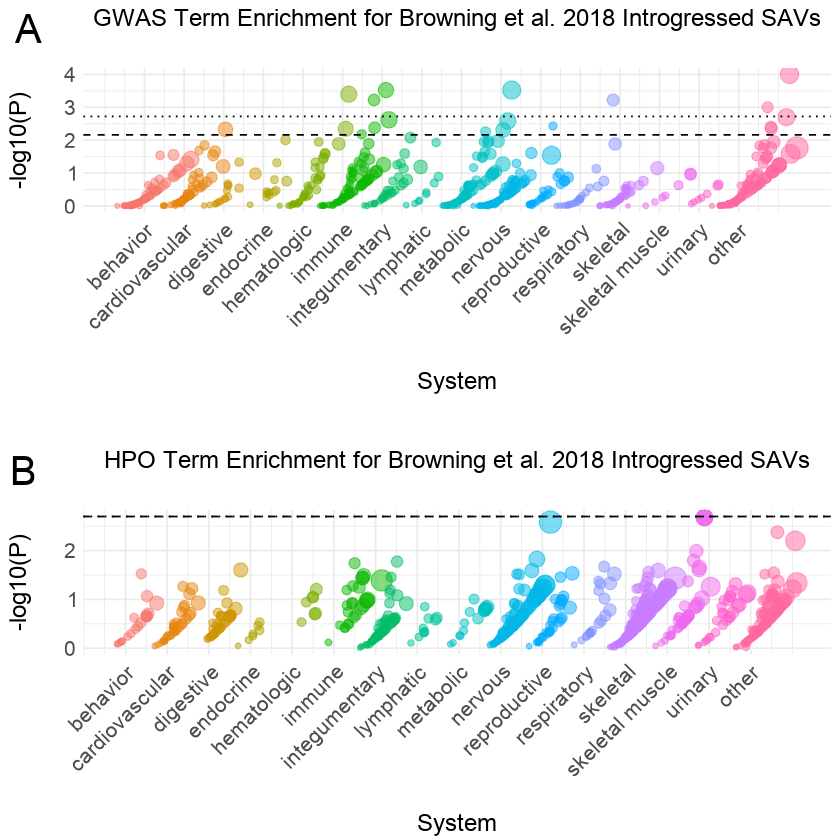

In [80]:
theme_set(theme_cowplot(font_family = 'Arial'))
Browning_introgressed_enrichment_plot <- plot_grid(Browning_introgressed_GWAS_plot, NULL, Browning_introgressed_HPO_plot, labels = c('A','','B'), label_size = 30, rel_heights = c(0.45,0.05,0.45), ncol = 1)
Browning_introgressed_enrichment_plot

In [81]:
pdf('suppl_figs/Browning_introgressed_enrichment.pdf', width = 16, height = 16)
Browning_introgressed_enrichment_plot
dev.off()

png 
  2

## Chagyrskaya

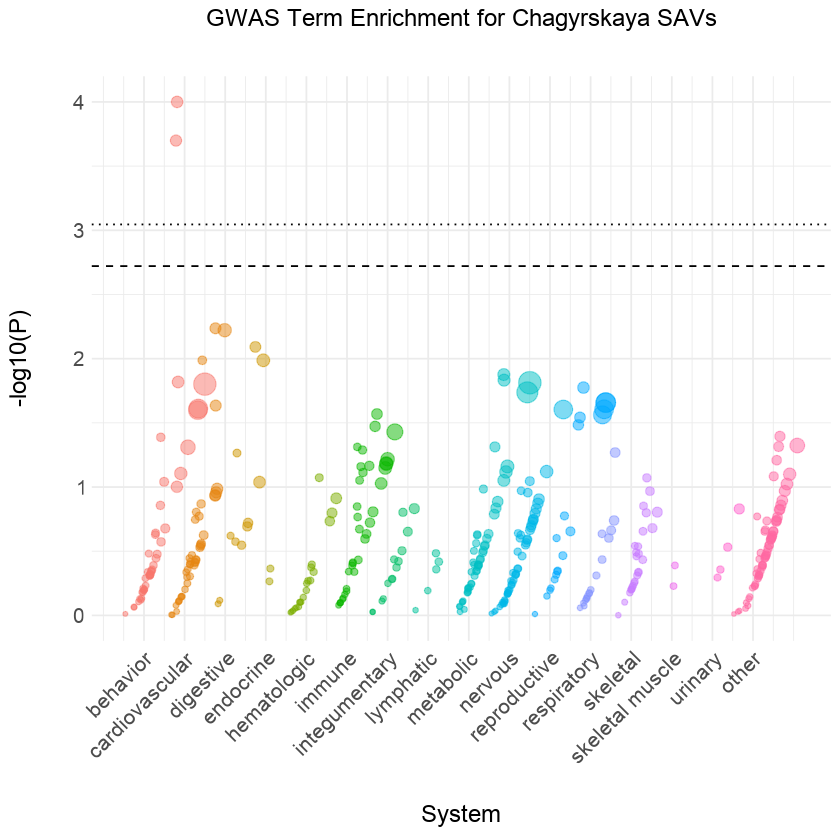

In [82]:
chagyrskaya_GWAS_plot <- phenotype_enrichment_plot('../data/phenotype_enrichment/enrichment/chagyrskaya_GWAS_enrichment_with_system.txt', 0.0009, 0.0019, 'GWAS Term Enrichment for Chagyrskaya SAVs\n')
chagyrskaya_GWAS_plot

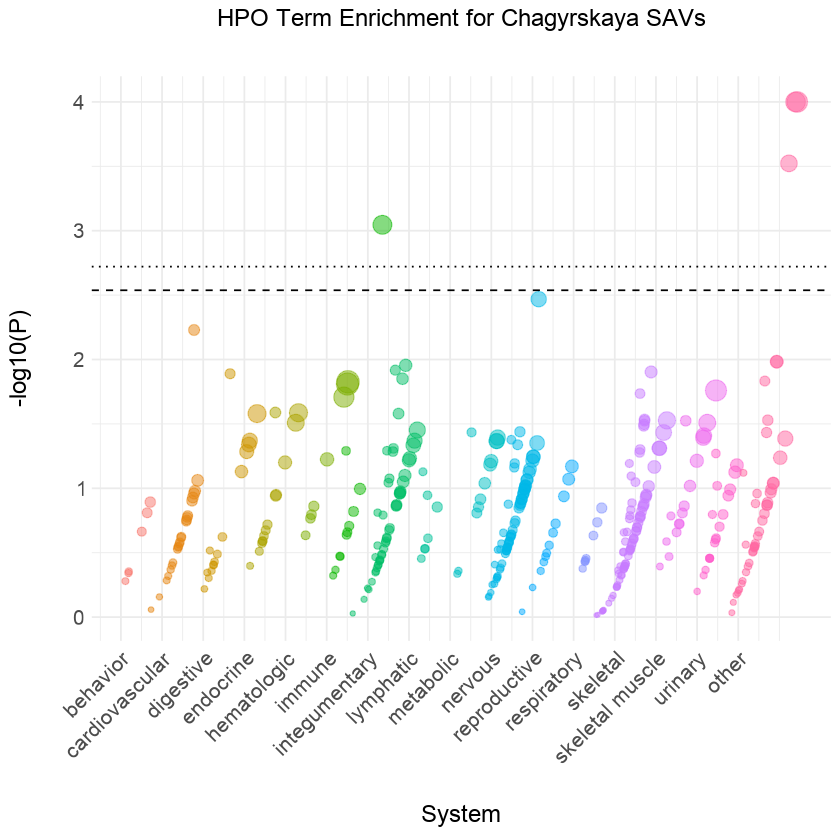

In [83]:
chagyrskaya_HPO_plot <- phenotype_enrichment_plot('../data/phenotype_enrichment/enrichment/chagyrskaya_HPO_enrichment_with_system.txt', 0.0019, 0.0029, 'HPO Term Enrichment for Chagyrskaya SAVs\n')
chagyrskaya_HPO_plot

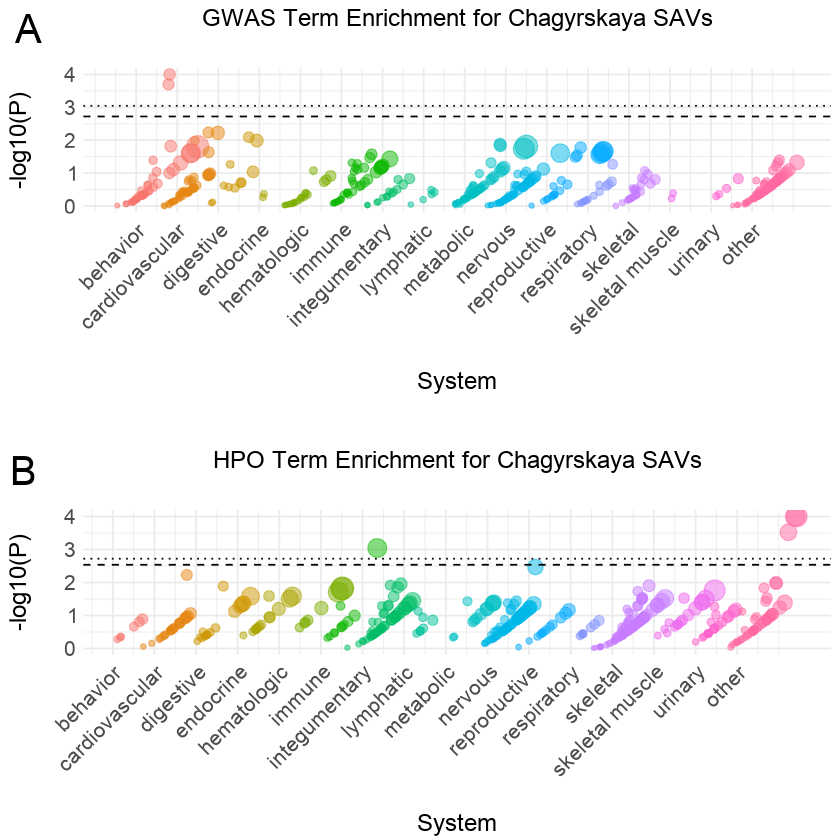

In [84]:
theme_set(theme_cowplot(font_family = 'Arial'))
chagyrskaya_enrichment_plot <- plot_grid(chagyrskaya_GWAS_plot, NULL, chagyrskaya_HPO_plot, labels = c('A','','B'), label_size = 30, rel_heights = c(0.45,0.05,0.45), ncol = 1)
chagyrskaya_enrichment_plot

In [85]:
pdf('suppl_figs/chagyrskaya_enrichment.pdf', width = 16, height = 16)
chagyrskaya_enrichment_plot
dev.off()

png 
  2

## Denisovan

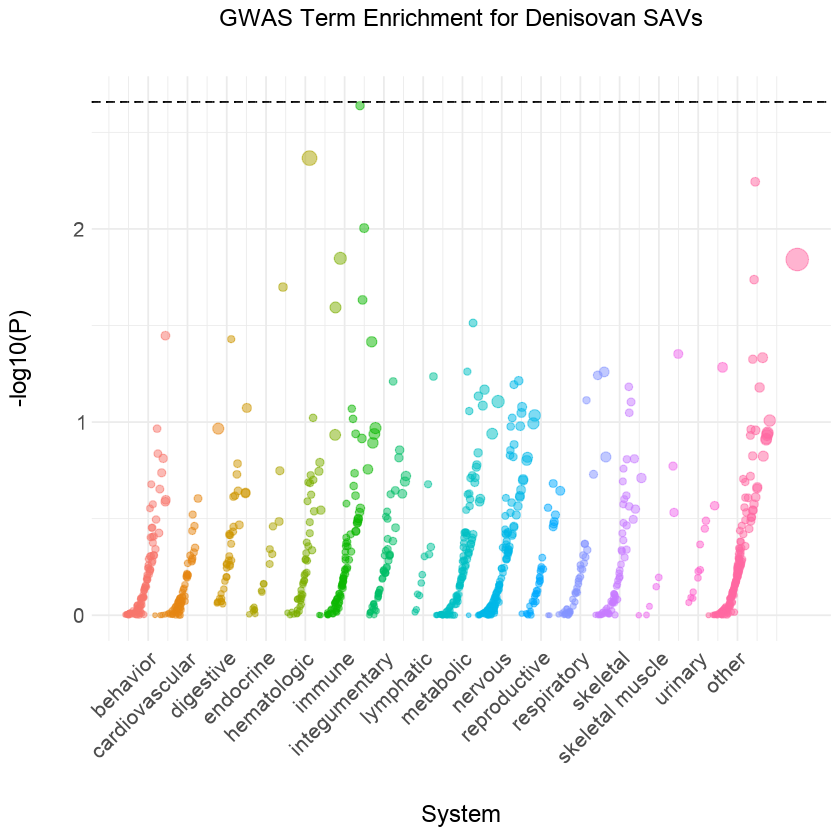

In [86]:
denisovan_GWAS_plot <- phenotype_enrichment_plot('../data/phenotype_enrichment/enrichment/denisovan_GWAS_enrichment_with_system.txt', 0.0022, 0.0022, 'GWAS Term Enrichment for Denisovan SAVs\n')
denisovan_GWAS_plot

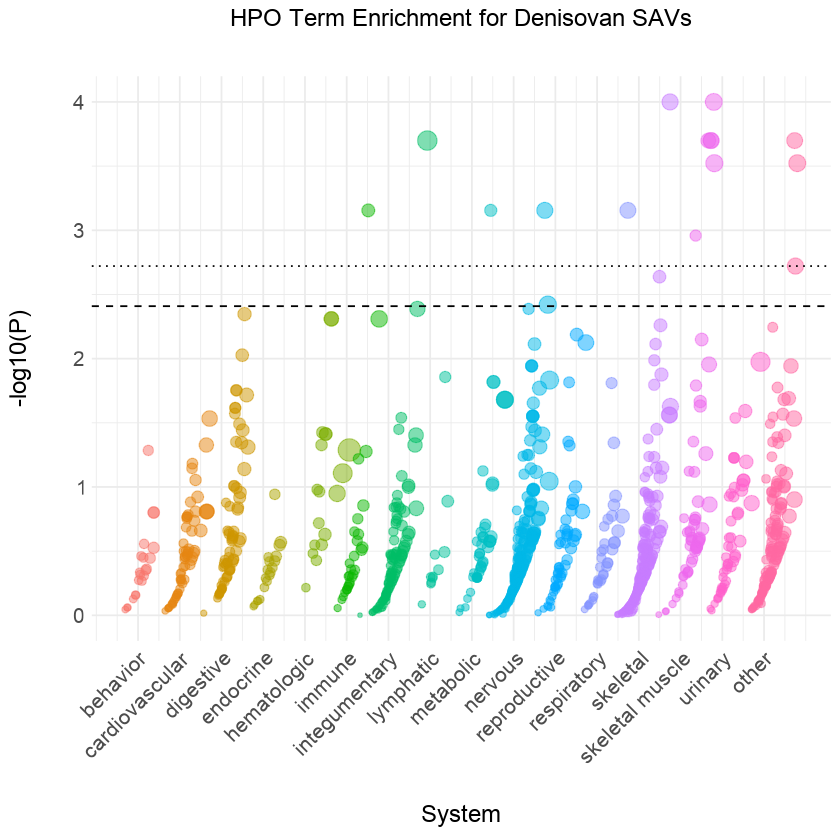

In [87]:
denisovan_HPO_plot <- phenotype_enrichment_plot('../data/phenotype_enrichment/enrichment/denisovan_HPO_enrichment_with_system.txt', 0.0019, 0.0039, 'HPO Term Enrichment for Denisovan SAVs\n')
denisovan_HPO_plot

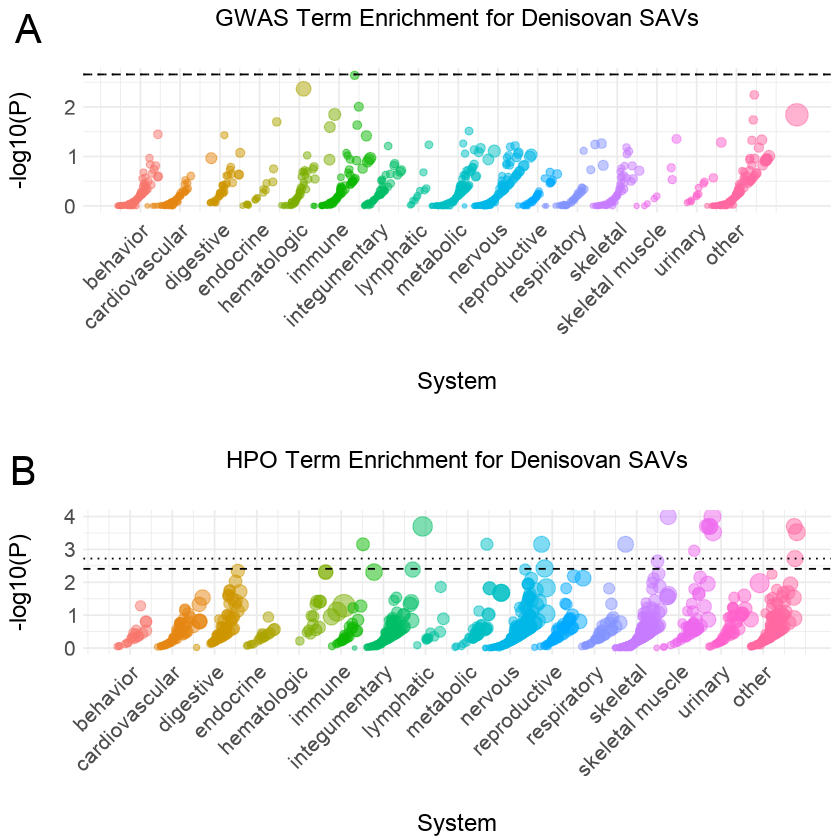

In [88]:
theme_set(theme_cowplot(font_family = 'Arial'))
denisovan_enrichment_plot <- plot_grid(denisovan_GWAS_plot, NULL, denisovan_HPO_plot, labels = c('A','','B'), label_size = 30, rel_heights = c(0.45,0.05,0.45), ncol = 1)
denisovan_enrichment_plot

In [89]:
pdf('suppl_figs/denisovan_enrichment.pdf', width = 16, height = 16)
denisovan_enrichment_plot
dev.off()

png 
  2

## Neanderthal

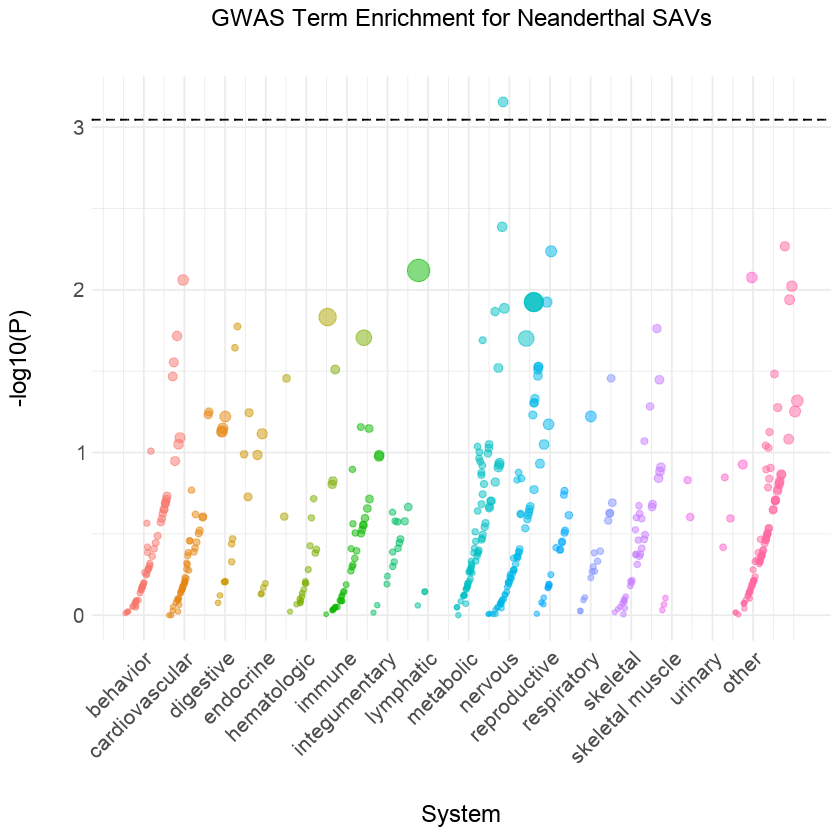

In [90]:
neanderthal_GWAS_plot <- phenotype_enrichment_plot('../data/phenotype_enrichment/enrichment/neanderthal_GWAS_enrichment_with_system.txt', 0.0009, 0.0009, 'GWAS Term Enrichment for Neanderthal SAVs\n')
neanderthal_GWAS_plot

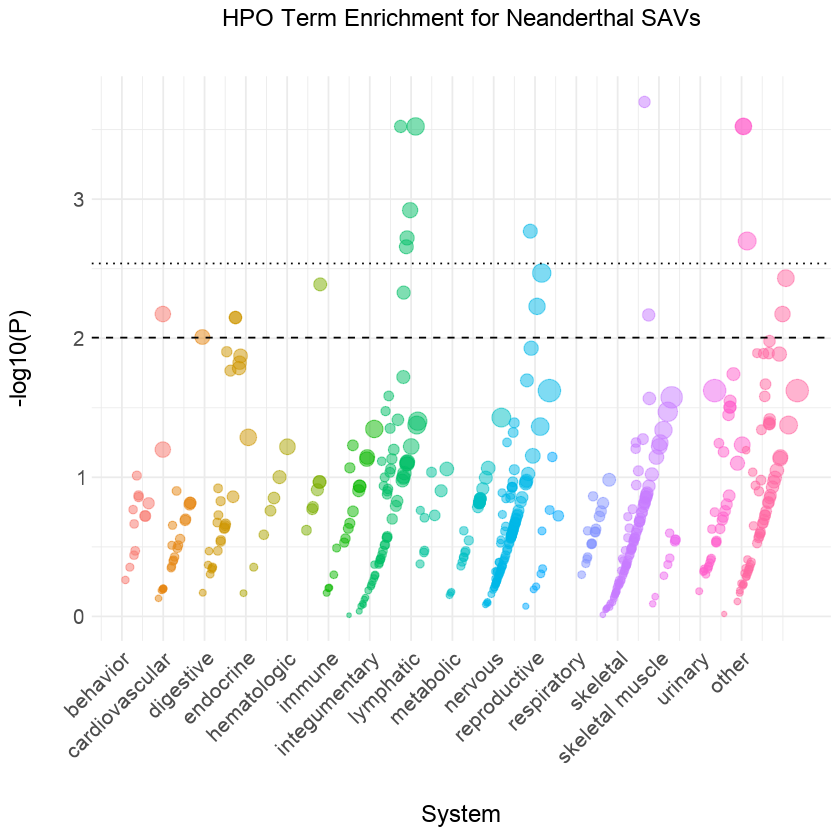

In [91]:
neanderthal_HPO_plot <- phenotype_enrichment_plot('../data/phenotype_enrichment/enrichment/neanderthal_HPO_enrichment_with_system.txt', 0.0029, 0.0099, 'HPO Term Enrichment for Neanderthal SAVs\n')
neanderthal_HPO_plot

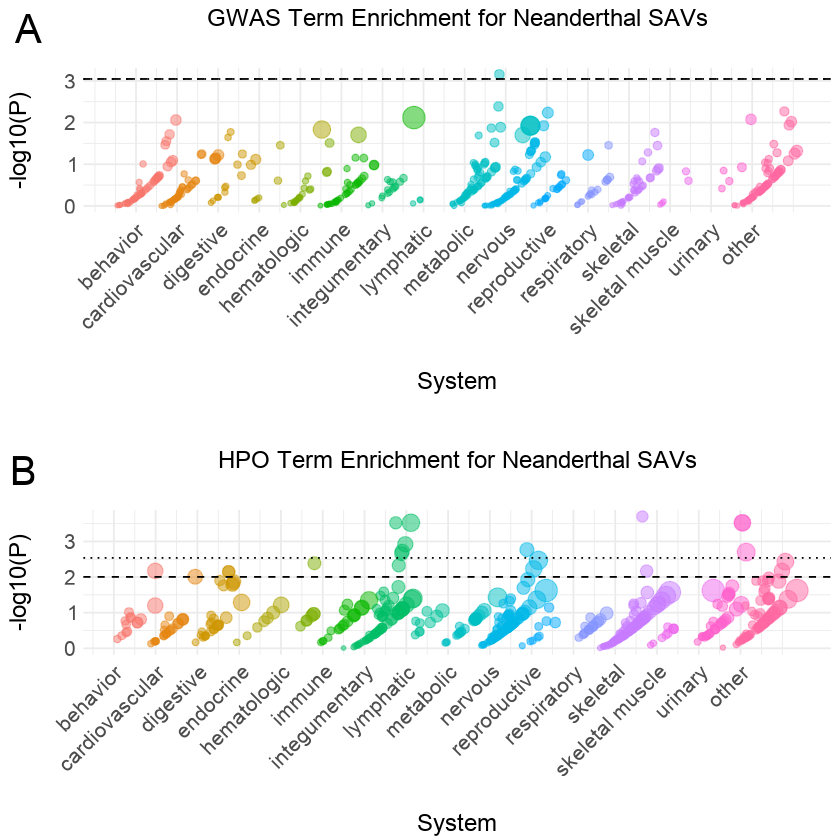

In [92]:
theme_set(theme_cowplot(font_family = 'Arial'))
neanderthal_enrichment_plot <- plot_grid(neanderthal_GWAS_plot, NULL, neanderthal_HPO_plot, labels = c('A','','B'), label_size = 30, rel_heights = c(0.45,0.05,0.45), ncol = 1)
neanderthal_enrichment_plot

In [93]:
pdf('suppl_figs/neanderthal_enrichment.pdf', width = 16, height = 16)
neanderthal_enrichment_plot
dev.off()

png 
  2

## Shared

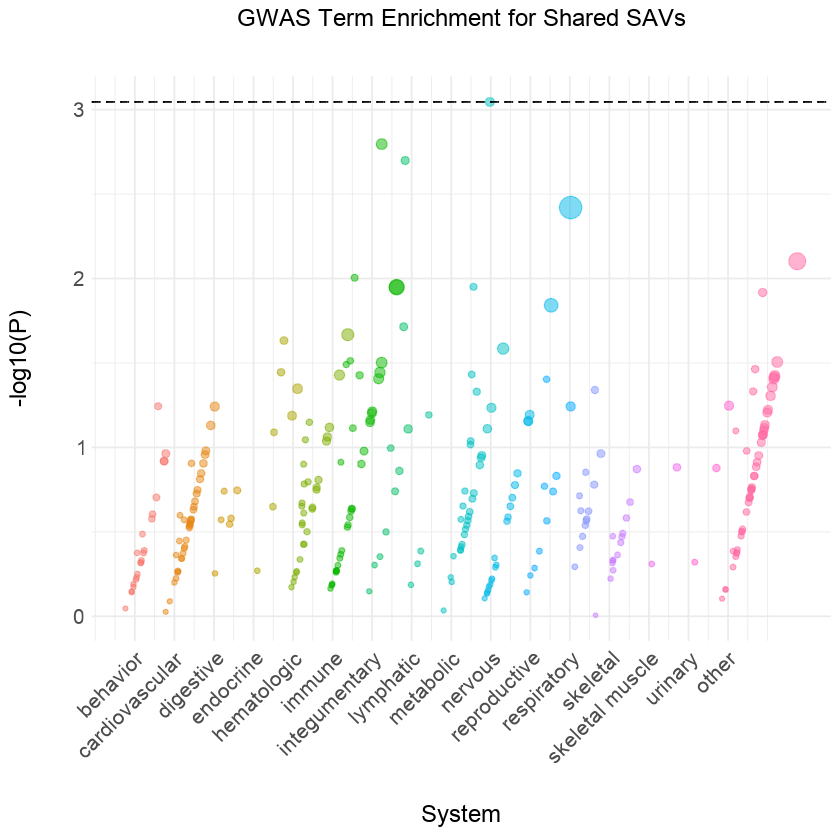

In [94]:
shared_GWAS_plot <- phenotype_enrichment_plot('../data/phenotype_enrichment/enrichment/shared_GWAS_enrichment_with_system.txt', 0.0009, 0.0009, 'GWAS Term Enrichment for Shared SAVs\n')
shared_GWAS_plot

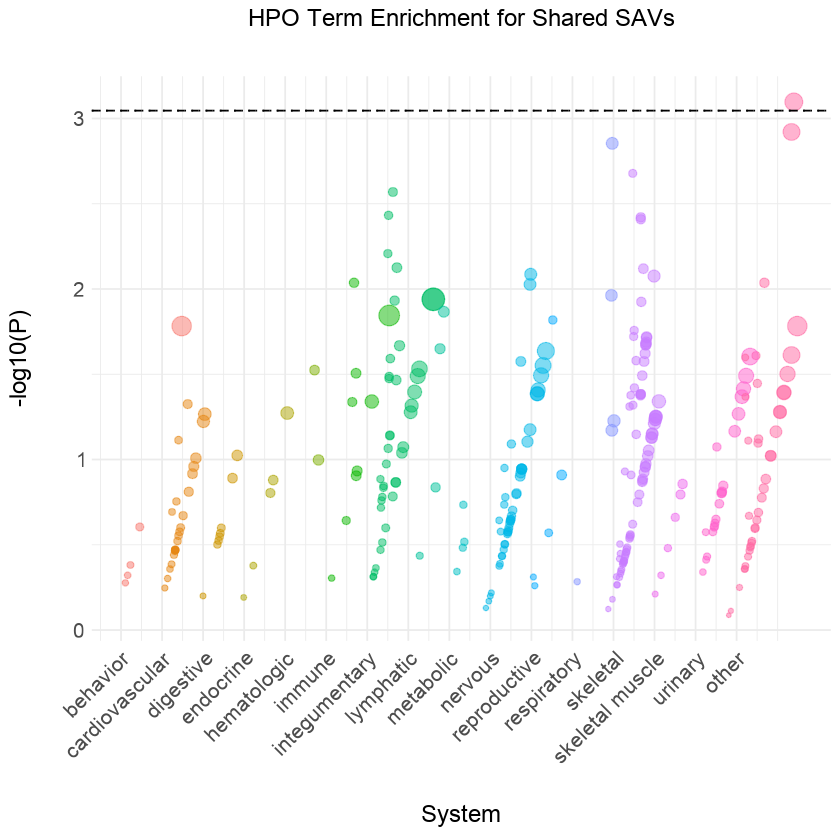

In [95]:
shared_HPO_plot <- phenotype_enrichment_plot('../data/phenotype_enrichment/enrichment/shared_HPO_enrichment_with_system.txt', 0.0009, 0.0009, 'HPO Term Enrichment for Shared SAVs\n')
shared_HPO_plot

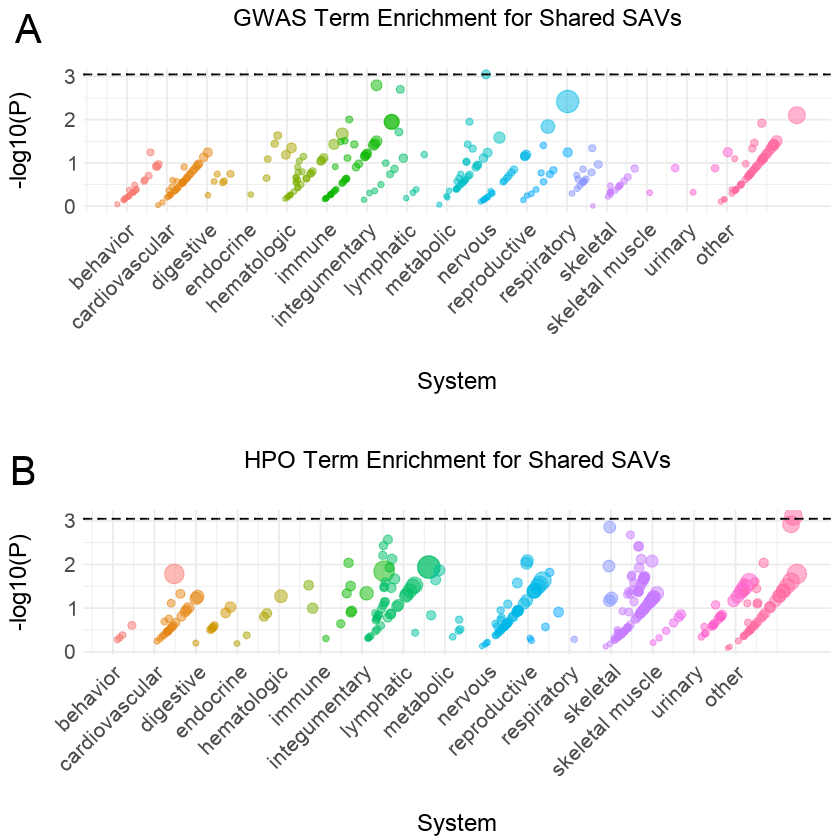

In [96]:
theme_set(theme_cowplot(font_family = 'Arial'))
shared_enrichment_plot <- plot_grid(shared_GWAS_plot, NULL, shared_HPO_plot, labels = c('A','','B'), label_size = 30, rel_heights = c(0.45,0.05,0.45), ncol = 1)
shared_enrichment_plot

In [97]:
pdf('suppl_figs/shared_enrichment.pdf', width = 16, height = 16)
shared_enrichment_plot
dev.off()

png 
  2

## Vernot et al. 2016 Introgressed

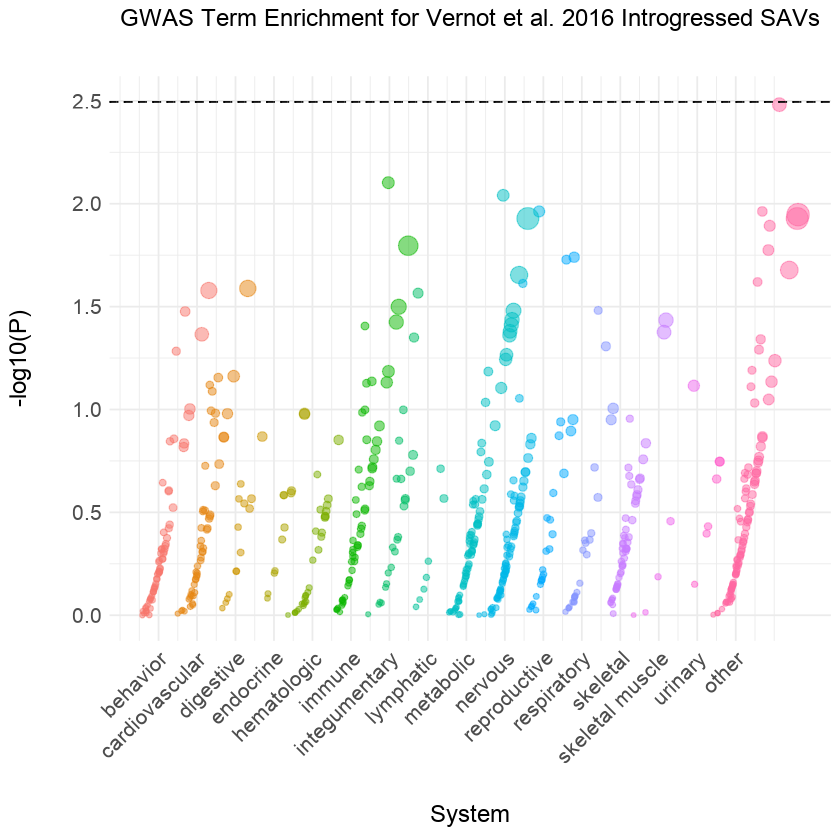

In [98]:
Vernot_introgressed_GWAS_plot <- phenotype_enrichment_plot('../data/phenotype_enrichment/enrichment/Vernot_introgressed_GWAS_enrichment_with_system.txt', 0.0032, 0.0032, 'GWAS Term Enrichment for Vernot et al. 2016 Introgressed SAVs\n')
Vernot_introgressed_GWAS_plot

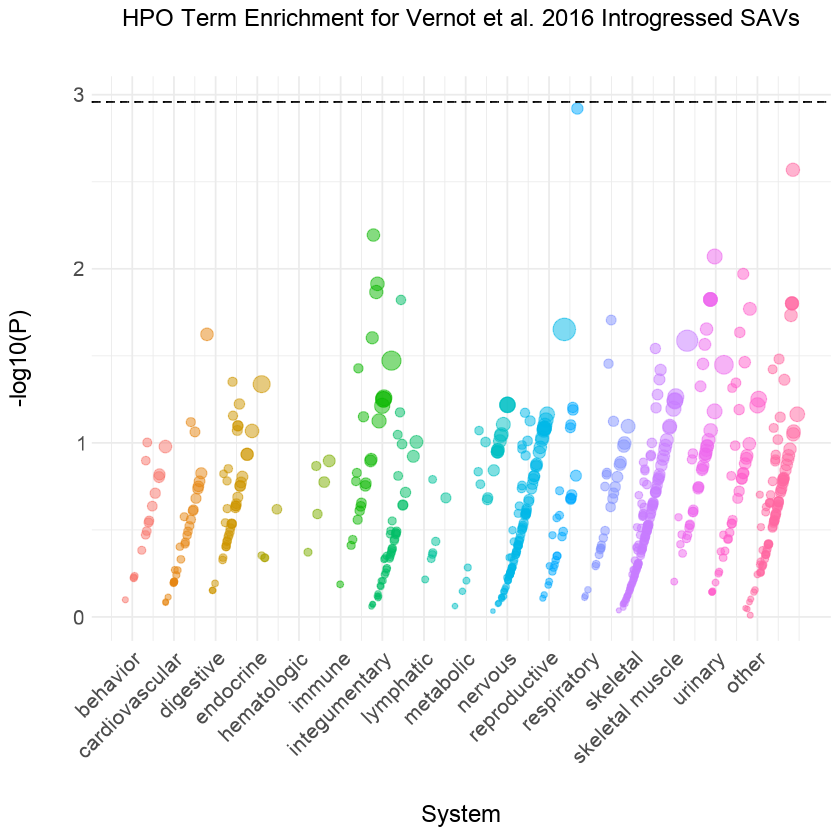

In [99]:
Vernot_introgressed_HPO_plot <- phenotype_enrichment_plot('../data/phenotype_enrichment/enrichment/Vernot_introgressed_HPO_enrichment_with_system.txt', 0.0011, 0.0011, 'HPO Term Enrichment for Vernot et al. 2016 Introgressed SAVs\n')
Vernot_introgressed_HPO_plot

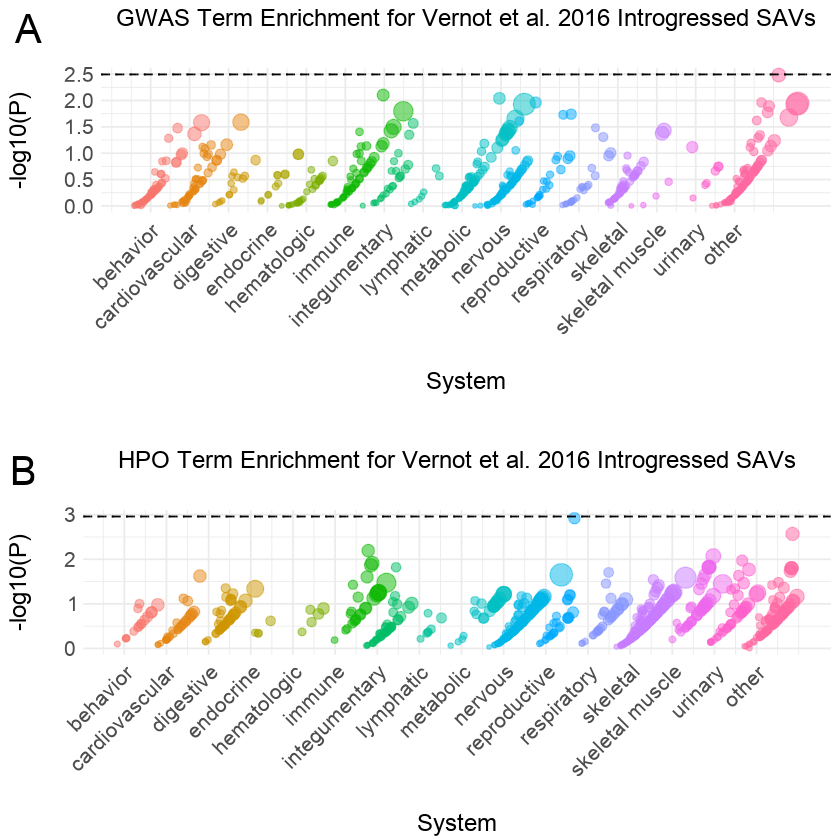

In [100]:
theme_set(theme_cowplot(font_family = 'Arial'))
Vernot_introgressed_enrichment_plot <- plot_grid(Vernot_introgressed_GWAS_plot, NULL, Vernot_introgressed_HPO_plot, labels = c('A','','B'), label_size = 30, rel_heights = c(0.45,0.05,0.45), ncol = 1)
Vernot_introgressed_enrichment_plot

In [101]:
pdf('suppl_figs/Vernot_introgressed_enrichment.pdf', width = 16, height = 16)
Vernot_introgressed_enrichment_plot
dev.off()

png 
  2

## Vindija

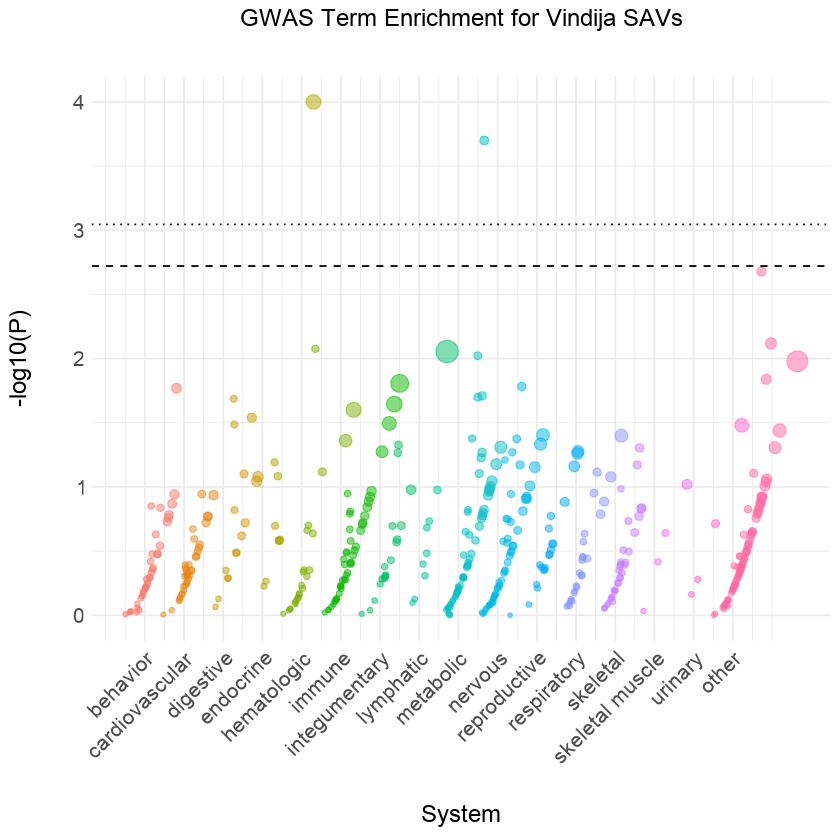

In [102]:
vindija_GWAS_plot <- phenotype_enrichment_plot('../data/phenotype_enrichment/enrichment/vindija_GWAS_enrichment_with_system.txt', 0.0009, 0.0019, 'GWAS Term Enrichment for Vindija SAVs\n')
vindija_GWAS_plot

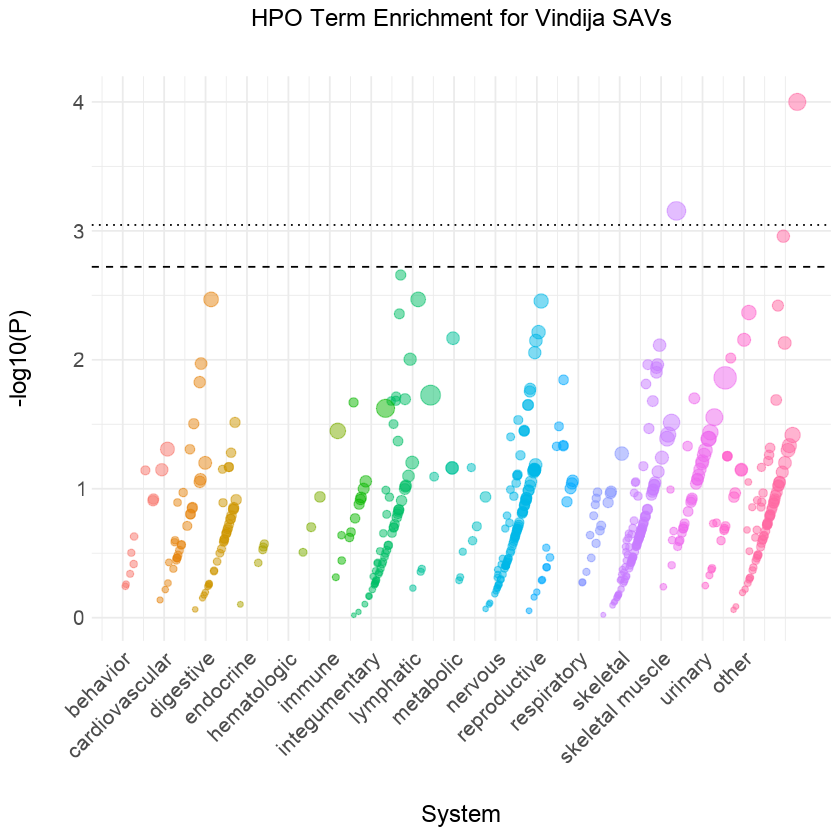

In [103]:
vindija_HPO_plot <- phenotype_enrichment_plot('../data/phenotype_enrichment/enrichment/vindija_HPO_enrichment_with_system.txt', 0.0009, 0.0019, 'HPO Term Enrichment for Vindija SAVs\n')
vindija_HPO_plot

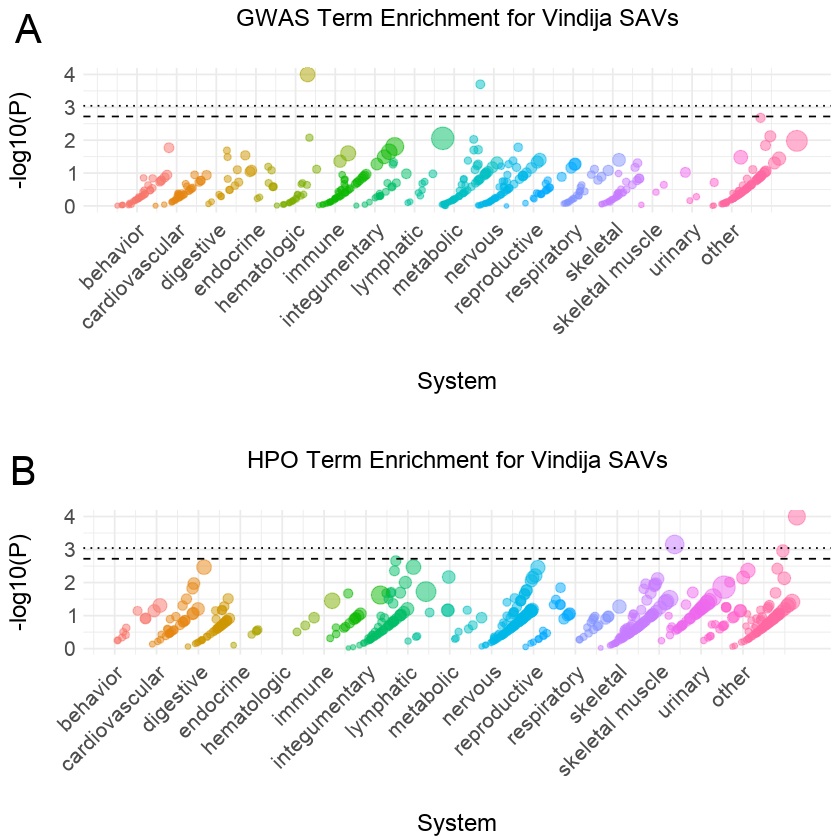

In [104]:
theme_set(theme_cowplot(font_family = 'Arial'))
vindija_enrichment_plot <- plot_grid(vindija_GWAS_plot, NULL, vindija_HPO_plot, labels = c('A','','B'), label_size = 30, rel_heights = c(0.45,0.05,0.45), ncol = 1)
vindija_enrichment_plot

In [105]:
pdf('suppl_figs/vindija_enrichment.pdf', width = 16, height = 16)
vindija_enrichment_plot
dev.off()

png 
  2

## Novel Isoforms <a class = 'anchor' id = 'novelisoforms'></a>

In [106]:
effect <- c('No effect','Longer\nprotein\nw/ PTCs','Longer\nprotein\nw/o PTCs','Longer UTR','Truncated\nprotein','Truncated\nUTR','Single\nmissense')
count <- c(2391,1897,333,479,332,116,396)
SAV_effects <- data.frame(effect, count)
SAV_effects$effect <- factor(SAV_effects$effect <- factor(SAV_effects$effect, levels = c('No effect','Longer\nprotein\nw/ PTCs','Longer UTR','Single\nmissense','Longer\nprotein\nw/o PTCs','Truncated\nprotein','Truncated\nUTR')))
head(SAV_effects)

,effect,count
,<fct>,<dbl>
1,No effect,2391
2,Longer protein w/ PTCs,1897
3,Longer protein w/o PTCs,333
4,Longer UTR,479
5,Truncated protein,332
6,Truncated UTR,116


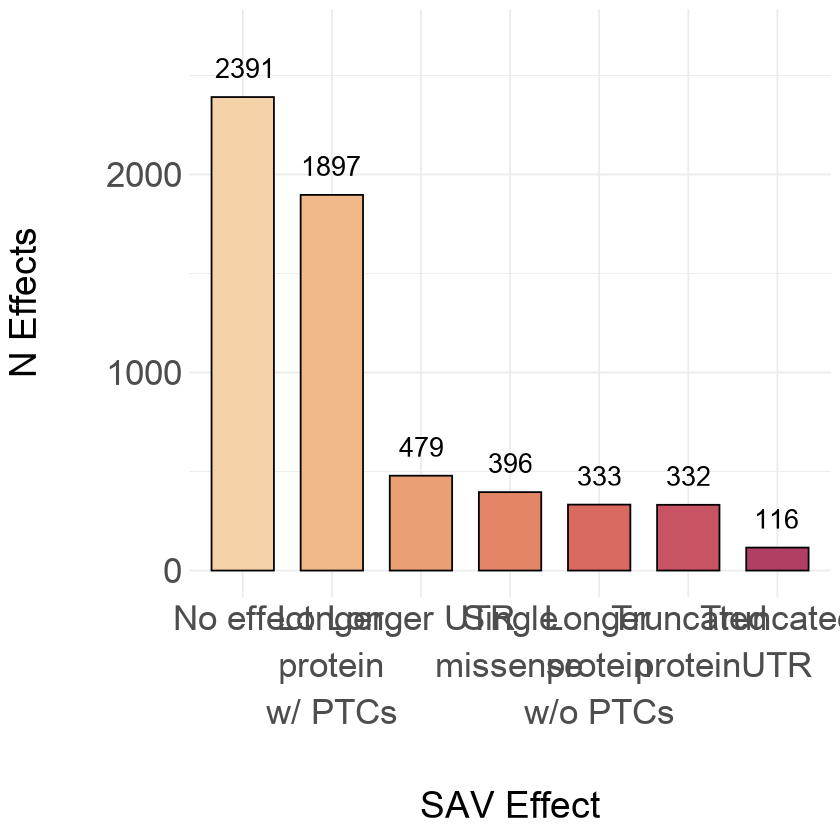

In [107]:
SAV_effects_plot <- ggplot(SAV_effects, aes(x = reorder(effect, -count), y = count, fill = effect)) + 
geom_bar(stat = 'identity', width = 0.7, color = 'black') + 
geom_text(aes(label = count), vjust = -1, family = 'Arial', size = 7) +
scale_y_continuous(limits = c(0, 2700)) + xlab('\nSAV Effect') + ylab('N Effects\n') + 
scale_fill_manual(values = c('#f5d1a8','#f1b889','#eb9f74','#e38566','#da695f','#c85362','#b13f63')) +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 28), axis.text.x = element_text(size = 26), axis.text.y = element_text(size = 26)) +
theme(legend.position = "none")

SAV_effects_plot

In [108]:
allele_origin <- c('ancient','ancient','ancient','ancient','ancient','ancient','ancient','archaic-specific','archaic-specific','archaic-specific','archaic-specific','archaic-specific','archaic-specific','archaic-specific','introgressed','introgressed','introgressed','introgressed','introgressed','introgressed','introgressed')
effect <- c('Longer UTR','Longer protein\nw/ PTCs','Longer protein\nw/o PTCs','No effect','Single\nmissense','Truncated\nUTR','Truncated\nprotein','Longer UTR','Longer protein\nw/ PTCs','Longer protein\nw/o PTCs','No effect','Single\nmissense','Truncated\nUTR','Truncated\nprotein','Longer UTR','Longer protein\nw/ PTCs','Longer protein\nw/o PTCs','No effect','Single\nmissense','Truncated\nUTR','Truncated\nprotein')
proportion <- c(0.067,0.282,0.042,0.485,0.063,0.02,0.041,0.094,0.345,0.07,0.334,0.063,0.022,0.071,0.107,0.373,0.057,0.283,0.086,0.02,0.074)
label <- c('6.7%','28.2%','4.2%','48.5%','6.3%','2%','4.1%','9.4%','34.5%','7%','33.4%','6.3%','2.2%','7.1%','10.7%','37.3%','5.7%','28.3%','8.6%','2%','7.4%')
SAV_effects_Vernot_allele_origin <- data.frame(allele_origin, effect, proportion, label)
SAV_effects_Vernot_allele_origin$effect <- factor(SAV_effects_Vernot_allele_origin$effect <- factor(SAV_effects_Vernot_allele_origin$effect, levels = c('No effect','Longer protein\nw/ PTCs','Longer UTR','Single\nmissense','Longer protein\nw/o PTCs','Truncated\nprotein','Truncated\nUTR')))
head(SAV_effects_Vernot_allele_origin)

,allele_origin,effect,proportion,label
,<chr>,<fct>,<dbl>,<chr>
1,ancient,Longer UTR,0.067,6.7%
2,ancient,Longer protein w/ PTCs,0.282,28.2%
3,ancient,Longer protein w/o PTCs,0.042,4.2%
4,ancient,No effect,0.485,48.5%
5,ancient,Single missense,0.063,6.3%
6,ancient,Truncated UTR,0.020,2%


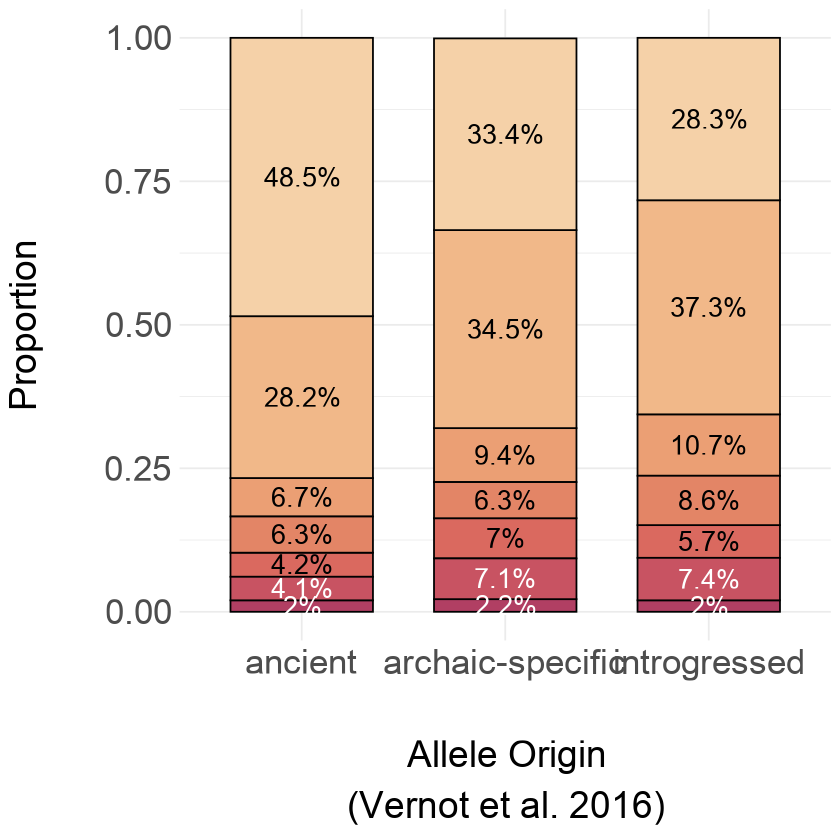

In [109]:
SAV_effects_plot_Vernot_allele_origin <- ggplot(SAV_effects_Vernot_allele_origin, aes(x = allele_origin, y = proportion, fill = effect)) + 
geom_bar(position = 'stack', stat = 'identity', width = 0.7, color = 'black') + 
geom_text(aes(label = label), position = position_stack(vjust = 0.5), family = 'Arial', size = 7, color = ifelse(SAV_effects_Vernot_allele_origin$effect == 'Truncated\nprotein' | SAV_effects_Vernot_allele_origin$effect == 'Truncated\nUTR', 'white', 'black'),) + 
#geom_text(aes(label = count), vjust = -1, family = 'Arial', size = 6) +
xlab('\nAllele Origin\n(Vernot et al. 2016)') + ylab('Proportion\n') + 
scale_fill_manual(values = c('#f5d1a8','#f1b889','#eb9f74','#e38566','#da695f','#c85362','#b13f63')) +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 28), axis.text.x = element_text(size = 26), axis.text.y = element_text(size = 26)) +
theme(legend.position = "none")

SAV_effects_plot_Vernot_allele_origin

Warning message in grid.Call(C_stringMetric, as.graphicsAnnot(x$label)):
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_stringMetric, as.graphicsAnnot(x$label)):
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_stringMetric, as.graphicsAnnot(x$label)):
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_stringMetric, as.graphicsAnnot(x$label)):
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_stringMetric, as.graphicsAnnot(x$label)):
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_stringMetric, as.graphicsAnnot(x$label)):
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_stringMetric, as.graphicsAnnot(x$label)):
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_stringMetric, as.graphicsAnnot(x$label

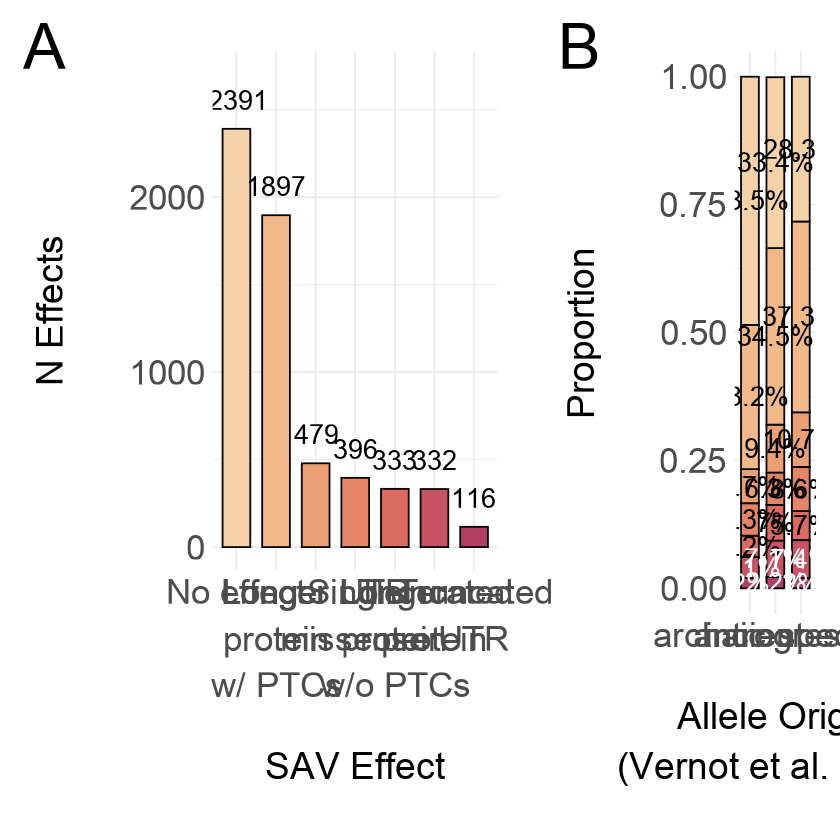

In [110]:
SAV_effects_plot_multiplot <- plot_grid(SAV_effects_plot, NULL, SAV_effects_plot_Vernot_allele_origin, rel_widths = c(0.54,0.01,0.3), labels = c('A','','B'), label_size = 48, nrow = 1, scale = 0.9)
SAV_effects_plot_multiplot

In [111]:
pdf('SAV_effects_plot_multiplot.pdf', width = 30, height = 15)
plot_grid(SAV_effects_plot_multiplot)
dev.off()

png 
  2

# Gene Characteristics <a class = 'anchor' id = 'genecharacteristics'></a>

In [112]:
gene_characteristics <- read.csv('../data/dataframes/variant_characteristics.txt', header = TRUE, sep = '\t')
head(gene_characteristics)

,name,n_exons,gene_length,exon_length,n_variants,variant_count_2,variant_count_5
,<chr>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>
1,OR4F5,1,918,918,0,0,0
2,AL627309.1,2,4479,2661,0,0,0
3,OR4F29,1,995,995,0,0,0
4,OR4F16,1,939,939,0,0,0
5,AL669831.1,3,606,129,0,0,0
6,AL645608.2,3,1941,57,0,0,0


In [113]:
gene_characteristics$n_exons_bins <- cut(gene_characteristics$n_exons, breaks=c(0, 5, 10, 20, Inf), labels=c('1-5','6-10','11-20','21+'))

In [114]:
with(gene_characteristics, tapply(variant_count_2, n_exons_bins, length))

1-5  6-10 11-20   21+ 
 7725  5511  4830  2208

In [115]:
n_exons_summary <- aggregate(gene_characteristics$variant_count_2, list(gene_characteristics$n_exons_bins), mean)
colnames(n_exons_summary)[1] <- 'bin'
colnames(n_exons_summary)[2] <- 'mean'
n_exons_summary$count <- c(7725,5511,4830,2208)

n_exons_summary

bin,mean,count
<fct>,<dbl>,<dbl>
1-5,0.09864078,7725
6-10,0.24895663,5511
11-20,0.42401656,4830
21+,0.80072464,2208


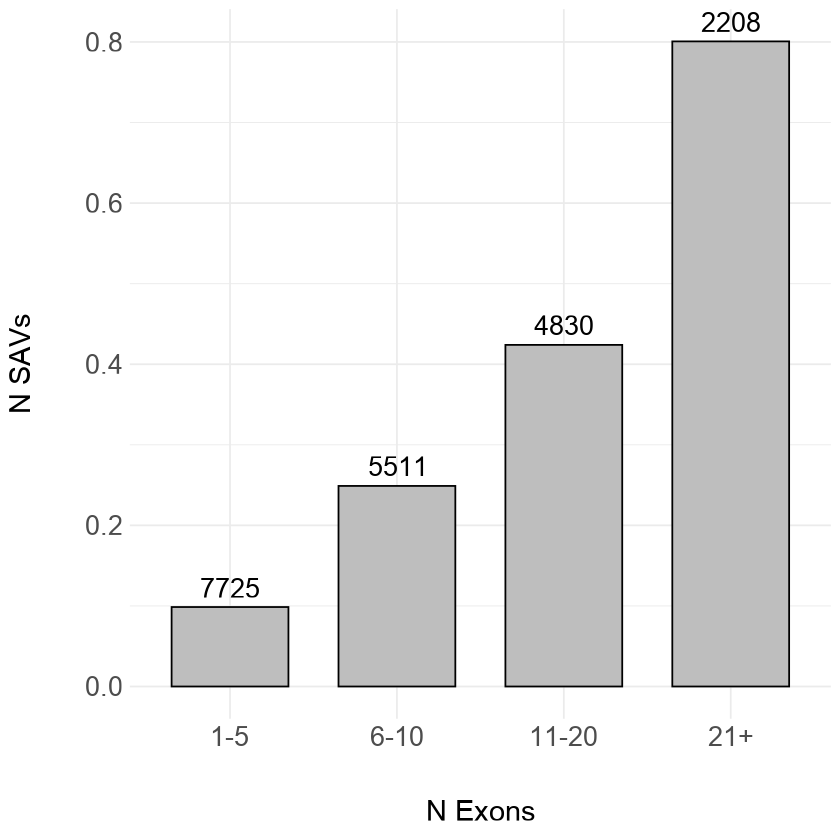

In [116]:
exons_2 <- ggplot(n_exons_summary, aes(x=bin, y=mean)) + geom_bar(stat = "summary", fun = "mean", width = 0.7, color = 'black', fill = bar_color) +
geom_text(aes(label = count), family = 'Arial', size = 7, vjust = -0.5) +
xlab('\nN Exons') + ylab('N SAVs\n') + 
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 22), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20))

exons_2

In [117]:
gene_characteristics$exon_length_bins <- cut(gene_characteristics$exon_length, breaks=c(0, 2500, 5000, 10000, Inf), labels=c('1-\n2,500','2,501-\n5,000','5,001-\n10,000','10,001+'))

In [118]:
with(gene_characteristics, tapply(variant_count_2, exon_length_bins, length))

1-\n2,500  2,501-\n5,000 5,001-\n10,000        10,001+ 
          9862           6732           3129            551

In [119]:
exon_length_summary <- aggregate(gene_characteristics$variant_count_2, list(gene_characteristics$exon_length_bins), mean)
colnames(exon_length_summary)[1] <- 'bin'
colnames(exon_length_summary)[2] <- 'mean'
exon_length_summary$count <- c(9872,6732,3129,551)

exon_length_summary

bin,mean,count
<fct>,<dbl>,<dbl>
"1- 2,500",0.1829244,9872
"2,501- 5,000",0.3184789,6732
"5,001- 10,000",0.4966443,3129
"10,001+",0.8130672,551


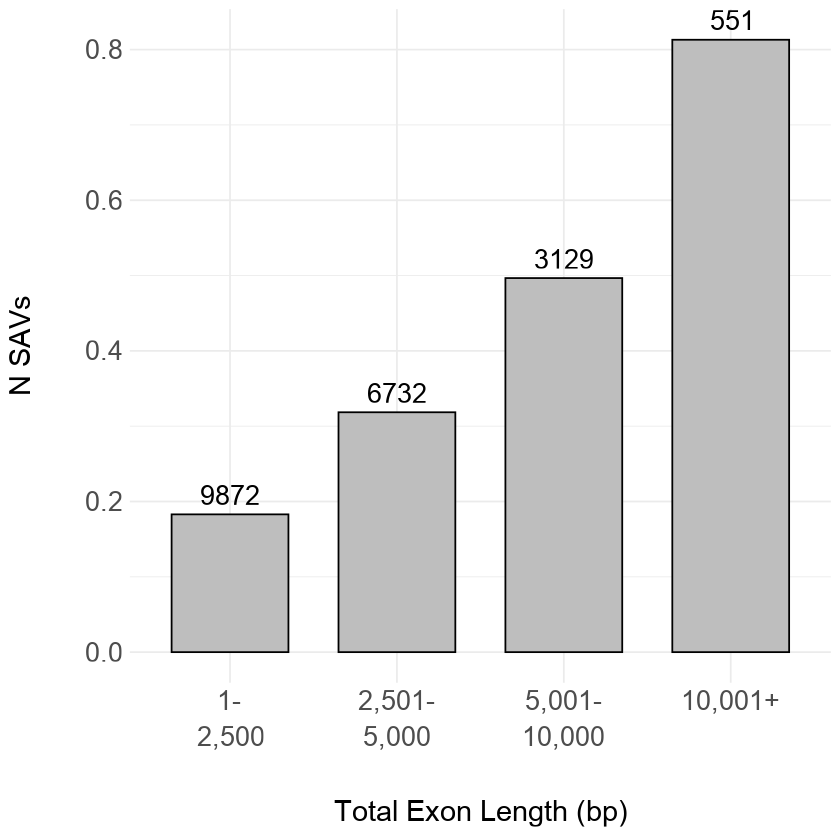

In [120]:
exon_length_2 <- ggplot(exon_length_summary, aes(x = bin, y = mean)) + geom_bar(stat = "summary", fun = "mean", width = 0.7, color = 'black', fill = bar_color) +
geom_text(aes(label = count), family = 'Arial', size = 7, vjust = -0.5) +
xlab('\nTotal Exon Length (bp)') + ylab('N SAVs\n') + 
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 22), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20))

exon_length_2

In [121]:
gene_characteristics$gene_length_bins <- cut(gene_characteristics$gene_length, breaks=c(0, 10000, 25000, 100000, Inf), labels=c('1-\n10,000','10,001-\n25,000','25,001-\n100,000','100,001+'))

In [122]:
with(gene_characteristics, tapply(variant_count_2, gene_length_bins, length))

1-\n10,000  10,001-\n25,000 25,001-\n100,000         100,001+ 
            6530             4488             6285             2971

In [123]:
gene_length_summary <- aggregate(gene_characteristics$variant_count_2, list(gene_characteristics$gene_length_bins), mean)
colnames(gene_length_summary)[1] <- 'bin'
colnames(gene_length_summary)[2] <- 'mean'
gene_length_summary$count <- c(6530,4488,6285,2971)

gene_length_summary

bin,mean,count
<fct>,<dbl>,<dbl>
"1- 10,000",0.09984686,6530
"10,001- 25,000",0.22571301,4488
"25,001- 100,000",0.34256165,6285
"100,001+",0.71760350,2971


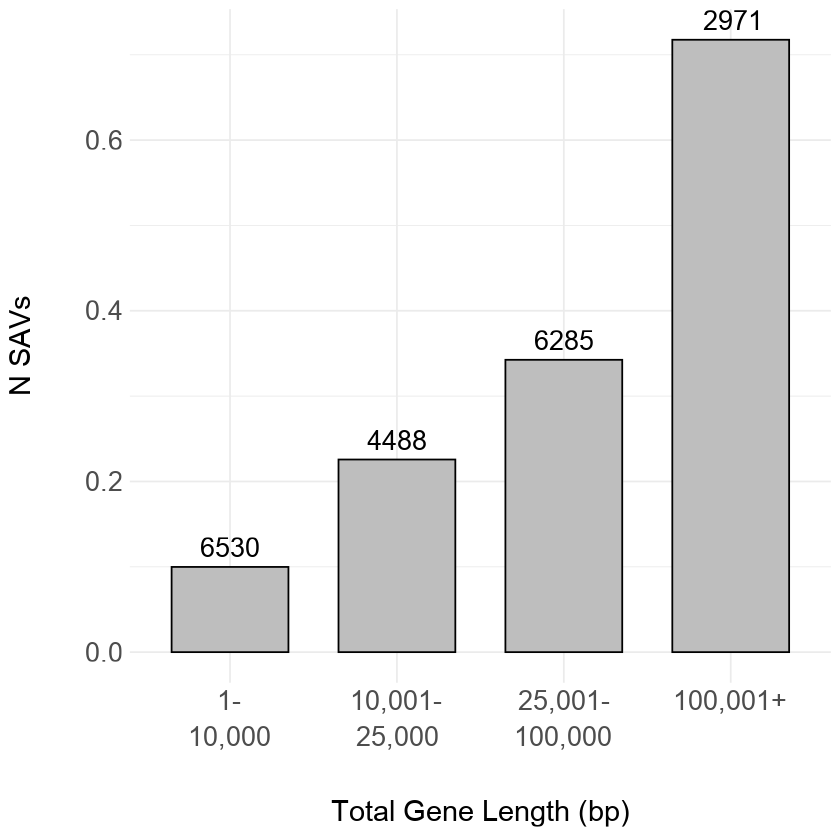

In [124]:
gene_length_2 <- ggplot(gene_length_summary, aes(x = bin, y = mean)) + geom_bar(stat = "summary", fun = "mean", width = 0.7, color = 'black', fill = bar_color) +
geom_text(aes(label = count), family = 'Arial', size = 7, vjust = -0.5) +
xlab('\nTotal Gene Length (bp)') + ylab('N SAVs\n') + 
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 22), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20))

gene_length_2

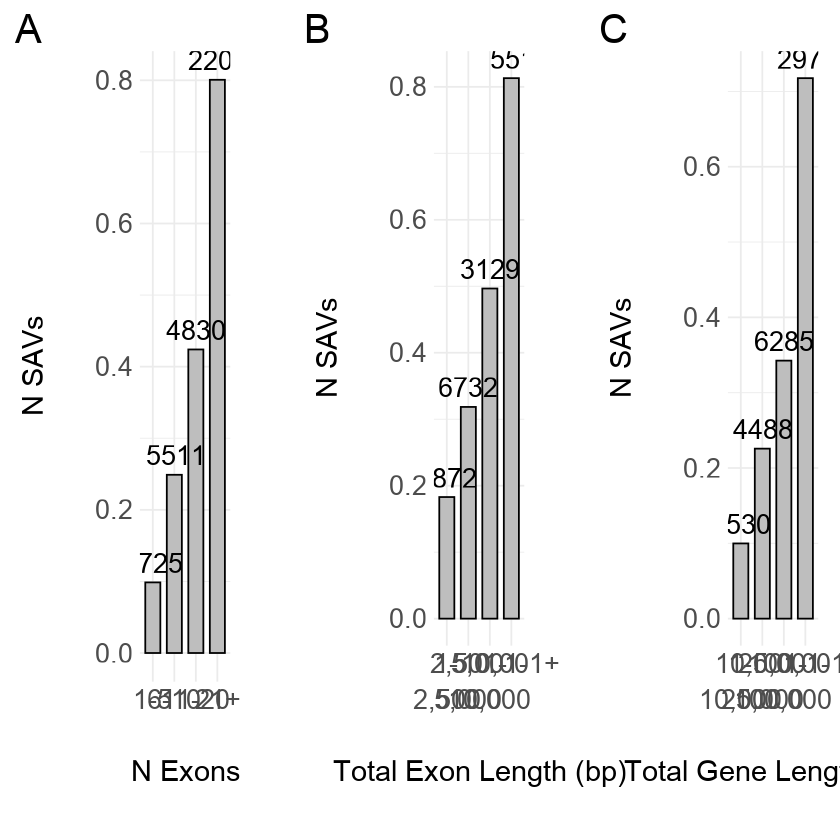

In [125]:
theme_set(theme_cowplot(font_family = 'Arial'))
characteristics_plot <- plot_grid(exons_2, NULL, exon_length_2, NULL, gene_length_2, labels = c('A','','B','','C'), label_size = 30, rel_widths = c(0.3,0.05,0.3,0.05,0.3), nrow = 1, scale = 0.9)
characteristics_plot

In [126]:
pdf('suppl_figs/characteristics_plot.pdf', width = 24, height = 10)
characteristics_plot
dev.off()

png 
  2

# Constraint <a class = 'anchor' id = 'constraint'></a>

## Browning et al. 2018 <a class = 'anchor' id = 'browningconstraint'></a>

### Missense Observed/Expected

In [127]:
SA_genes_mis_oe <- subset(data_2, select = c('annotation','Browning_allele_origin','mis_oe'))

In [128]:
ancient_genes_mis_oe <- subset(SA_genes_mis_oe, Browning_allele_origin == 'ancient')
ancient_genes_mis_oe <- ancient_genes_mis_oe[!duplicated(ancient_genes_mis_oe), ]
ancient_genes_mis_oe <- na.omit(ancient_genes_mis_oe)
head(ancient_genes_mis_oe)

,annotation,Browning_allele_origin,mis_oe
,<chr>,<chr>,<dbl>
25,SAMD11,ancient,1.50820
131,PLEKHN1,ancient,1.25930
211,AGRN,ancient,0.98257
331,TTLL10,ancient,0.95390
410,SDF4,ancient,0.90199
529,ACAP3,ancient,0.79314


In [129]:
nrow(ancient_genes_mis_oe)

[1] 1780

In [130]:
archaic_specific_genes_mis_oe <- subset(SA_genes_mis_oe, Browning_allele_origin == 'archaic-specific')
archaic_specific_genes_mis_oe <- archaic_specific_genes_mis_oe[!duplicated(archaic_specific_genes_mis_oe), ]
archaic_specific_genes_mis_oe <- na.omit(archaic_specific_genes_mis_oe)
head(archaic_specific_genes_mis_oe)

,annotation,Browning_allele_origin,mis_oe
,<chr>,<chr>,<dbl>
66,SAMD11,archaic-specific,1.50820
225,AGRN,archaic-specific,0.98257
378,SDF4,archaic-specific,0.90199
1653,MORN1,archaic-specific,1.04670
1890,MMEL1,archaic-specific,0.98394
3148,MEGF6,archaic-specific,0.95847


In [131]:
nrow(archaic_specific_genes_mis_oe)

[1] 1832

In [132]:
introgressed_genes_mis_oe <- subset(SA_genes_mis_oe, Browning_allele_origin == 'introgressed')
introgressed_genes_mis_oe <- introgressed_genes_mis_oe[!duplicated(introgressed_genes_mis_oe), ]
introgressed_genes_mis_oe <- na.omit(introgressed_genes_mis_oe)
head(introgressed_genes_mis_oe)

,annotation,Browning_allele_origin,mis_oe
,<chr>,<chr>,<dbl>
10929,MIIP,introgressed,1.04000
14505,SPATA21,introgressed,1.00130
17108,EMC1,introgressed,0.84271
17140,AKR7L,introgressed,0.92753
19012,HSPG2,introgressed,0.93887
22076,CEP85,introgressed,0.96911


In [133]:
nrow(introgressed_genes_mis_oe)

[1] 349

In [134]:
SA_genes_mis_oe = rbind(archaic_specific_genes_mis_oe, ancient_genes_mis_oe, introgressed_genes_mis_oe)
head(SA_genes_mis_oe)

,annotation,Browning_allele_origin,mis_oe
,<chr>,<chr>,<dbl>
66,SAMD11,archaic-specific,1.50820
225,AGRN,archaic-specific,0.98257
378,SDF4,archaic-specific,0.90199
1653,MORN1,archaic-specific,1.04670
1890,MMEL1,archaic-specific,0.98394
3148,MEGF6,archaic-specific,0.95847


In [135]:
nrow(SA_genes_mis_oe)

[1] 3961

In [136]:
non_SA_genes_mis_oe = subset(data, !(annotation %in% data_2$annotation))
non_SA_genes_mis_oe = subset(non_SA_genes_mis_oe, select = c('annotation','Browning_allele_origin','mis_oe'))
non_SA_genes_mis_oe <- non_SA_genes_mis_oe[!duplicated(non_SA_genes_mis_oe$annotation), ]
non_SA_genes_mis_oe <- na.omit(non_SA_genes_mis_oe)
non_SA_genes_mis_oe$Browning_allele_origin <- 'non-SA'
head(non_SA_genes_mis_oe)

,annotation,Browning_allele_origin,mis_oe
,<chr>,<chr>,<dbl>
2,AL645608.1,non-SA,1.2217
71,NOC2L,non-SA,1.2489
108,KLHL17,non-SA,1.0772
146,HES4,non-SA,1.1390
148,ISG15,non-SA,1.0115
240,RNF223,non-SA,1.1504


In [137]:
nrow(non_SA_genes_mis_oe)

[1] 12708

In [138]:
genes_mis_oe = rbind(SA_genes_mis_oe, non_SA_genes_mis_oe)
head(genes_mis_oe)

,annotation,Browning_allele_origin,mis_oe
,<chr>,<chr>,<dbl>
66,SAMD11,archaic-specific,1.50820
225,AGRN,archaic-specific,0.98257
378,SDF4,archaic-specific,0.90199
1653,MORN1,archaic-specific,1.04670
1890,MMEL1,archaic-specific,0.98394
3148,MEGF6,archaic-specific,0.95847


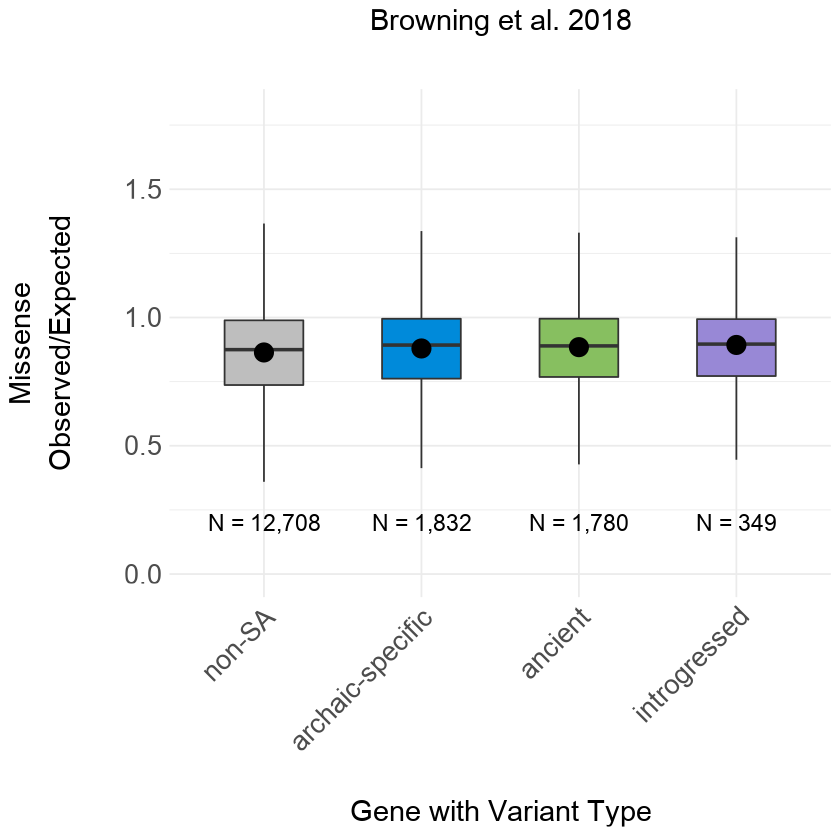

In [139]:
Browning_genes_constraint_mis_oe <- ggplot(genes_mis_oe, aes(x = reorder(Browning_allele_origin, mis_oe), y = mis_oe, fill = Browning_allele_origin)) +
geom_boxplot(width=0.5, outlier.shape = NA) + coord_cartesian(ylim = c(0,1.8)) +
stat_summary(fun = 'mean', geom = 'point', color = 'black', size = 5) +
scale_fill_manual(values = c(ancient_color,archaic_specific_color,introgressed_color,non_SAV_color)) +
xlab('\nGene with Variant Type') + ylab('Missense\nObserved/Expected\n') +
ggtitle('Browning et al. 2018\n') +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 22)) +
theme(axis.title = element_text(size = 22), axis.text.x = element_text(size = 20, angle = 45, hjust = 1), axis.text.y = element_text(size = 20)) +
theme(legend.position = "none") +
annotate('text', x = 'non-SA', y = 0.2, label = 'N = 12,708', size = 6, family = 'Arial') + 
annotate('text', x = 'ancient', y = 0.2, label = 'N = 1,780', , size = 6, family = 'Arial') +
annotate('text', x = 'archaic-specific', y = 0.2, label = 'N = 1,832', , size = 6, family = 'Arial') +
annotate('text', x = 'introgressed', y = 0.2, label = 'N = 349', , size = 6, family = 'Arial') 

Browning_genes_constraint_mis_oe

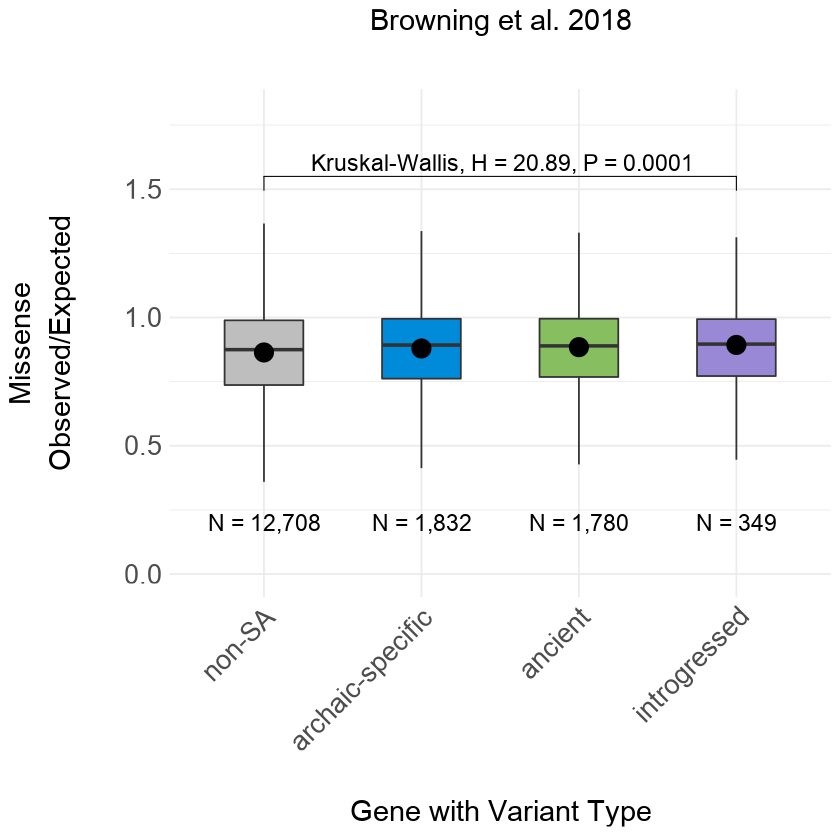

In [140]:
Browning_genes_constraint_mis_oe = Browning_genes_constraint_mis_oe + geom_bracket(xmin = 'non-SA', xmax = 'introgressed', y.position = 1.55, tip.length = c(0.015), label = 'Kruskal-Wallis, H = 20.89, P = 0.0001', label.size = 6, family = 'Arial', inherit.aes = FALSE)
Browning_genes_constraint_mis_oe

### Loss of Function Observed/Expected

In [141]:
SA_genes_lof_oe <- subset(data_2, select = c('annotation','Browning_allele_origin','lof_oe'))

In [142]:
ancient_genes_lof_oe <- subset(SA_genes_lof_oe, Browning_allele_origin == 'ancient')
ancient_genes_lof_oe <- ancient_genes_lof_oe[!duplicated(ancient_genes_lof_oe), ]
ancient_genes_lof_oe <- na.omit(ancient_genes_lof_oe)
head(ancient_genes_lof_oe)

,annotation,Browning_allele_origin,lof_oe
,<chr>,<chr>,<dbl>
25,SAMD11,ancient,0.89656
131,PLEKHN1,ancient,0.80467
211,AGRN,ancient,0.31914
331,TTLL10,ancient,0.77894
410,SDF4,ancient,0.38720
529,ACAP3,ancient,0.39045


In [143]:
nrow(ancient_genes_lof_oe)

[1] 1774

In [144]:
archaic_specific_genes_lof_oe <- subset(SA_genes_lof_oe, Browning_allele_origin == 'archaic-specific')
archaic_specific_genes_lof_oe <- archaic_specific_genes_lof_oe[!duplicated(archaic_specific_genes_lof_oe), ]
archaic_specific_genes_lof_oe <- na.omit(archaic_specific_genes_lof_oe)
head(archaic_specific_genes_lof_oe)

,annotation,Browning_allele_origin,lof_oe
,<chr>,<chr>,<dbl>
66,SAMD11,archaic-specific,0.89656
225,AGRN,archaic-specific,0.31914
378,SDF4,archaic-specific,0.38720
1653,MORN1,archaic-specific,0.76779
1890,MMEL1,archaic-specific,0.76824
3148,MEGF6,archaic-specific,0.73856


In [145]:
nrow(archaic_specific_genes_lof_oe)

[1] 1824

In [146]:
introgressed_genes_lof_oe <- subset(SA_genes_lof_oe, Browning_allele_origin == 'introgressed')
introgressed_genes_lof_oe <- introgressed_genes_lof_oe[!duplicated(introgressed_genes_lof_oe), ]
introgressed_genes_lof_oe <- na.omit(introgressed_genes_lof_oe)
head(introgressed_genes_lof_oe)

,annotation,Browning_allele_origin,lof_oe
,<chr>,<chr>,<dbl>
10929,MIIP,introgressed,1.27490
14505,SPATA21,introgressed,1.07330
17108,EMC1,introgressed,0.78902
17140,AKR7L,introgressed,0.82684
19012,HSPG2,introgressed,0.34121
22076,CEP85,introgressed,0.33885


In [147]:
nrow(introgressed_genes_lof_oe)

[1] 349

In [148]:
SA_genes_lof_oe = rbind(archaic_specific_genes_lof_oe, ancient_genes_lof_oe, introgressed_genes_lof_oe)
head(SA_genes_lof_oe)

,annotation,Browning_allele_origin,lof_oe
,<chr>,<chr>,<dbl>
66,SAMD11,archaic-specific,0.89656
225,AGRN,archaic-specific,0.31914
378,SDF4,archaic-specific,0.38720
1653,MORN1,archaic-specific,0.76779
1890,MMEL1,archaic-specific,0.76824
3148,MEGF6,archaic-specific,0.73856


In [149]:
nrow(SA_genes_lof_oe)

[1] 3947

In [150]:
non_SA_genes_lof_oe = subset(data, !(annotation %in% data_2$annotation))
non_SA_genes_lof_oe = subset(non_SA_genes_lof_oe, select = c('annotation','Browning_allele_origin','lof_oe'))
non_SA_genes_lof_oe <- non_SA_genes_lof_oe[!duplicated(non_SA_genes_lof_oe$annotation), ]
non_SA_genes_lof_oe <- na.omit(non_SA_genes_lof_oe)
non_SA_genes_lof_oe$Browning_allele_origin <- 'non-SA'
head(non_SA_genes_lof_oe)

,annotation,Browning_allele_origin,lof_oe
,<chr>,<chr>,<dbl>
2,AL645608.1,non-SA,0.73515
71,NOC2L,non-SA,1.02910
108,KLHL17,non-SA,0.90749
146,HES4,non-SA,1.69970
148,ISG15,non-SA,0.00000
240,RNF223,non-SA,0.95227


In [151]:
nrow(non_SA_genes_lof_oe)

[1] 12484

In [152]:
genes_lof_oe = rbind(SA_genes_lof_oe, non_SA_genes_lof_oe)
head(genes_lof_oe)

,annotation,Browning_allele_origin,lof_oe
,<chr>,<chr>,<dbl>
66,SAMD11,archaic-specific,0.89656
225,AGRN,archaic-specific,0.31914
378,SDF4,archaic-specific,0.38720
1653,MORN1,archaic-specific,0.76779
1890,MMEL1,archaic-specific,0.76824
3148,MEGF6,archaic-specific,0.73856


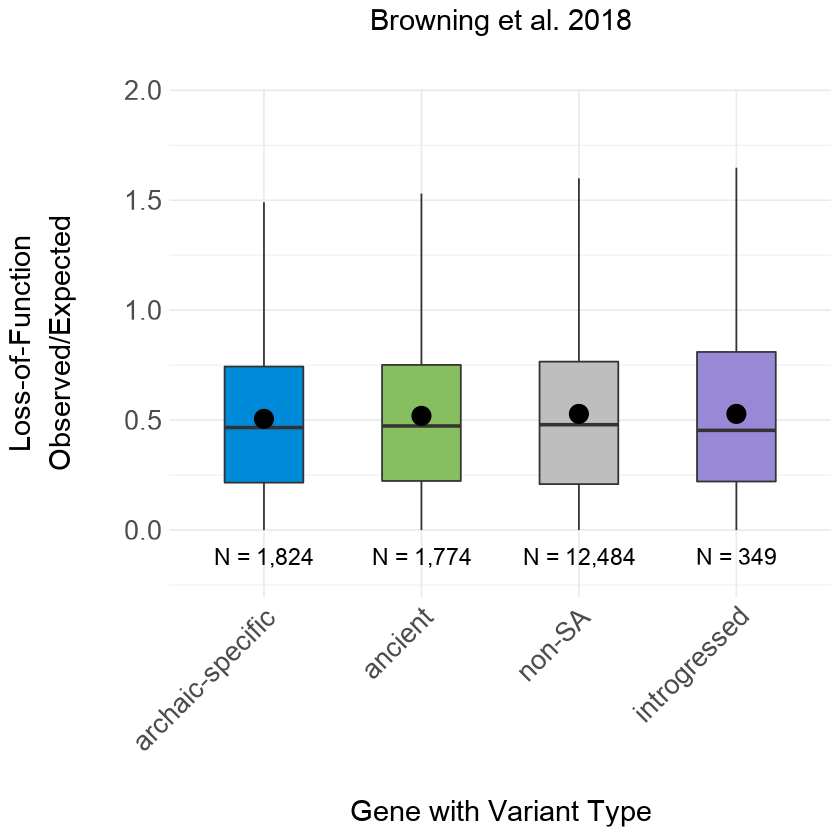

In [153]:
Browning_genes_constraint_lof_oe <- ggplot(genes_lof_oe, aes(x = reorder(Browning_allele_origin, lof_oe), y = lof_oe, fill = Browning_allele_origin)) +
geom_boxplot(width=0.5, outlier.shape = NA) + coord_cartesian(ylim = c(-0.2,1.9)) +
stat_summary(fun = 'mean', geom = 'point', color = 'black', size = 5) +
scale_fill_manual(values = c(ancient_color,archaic_specific_color,introgressed_color,non_SAV_color)) +
xlab('\nGene with Variant Type') + ylab('Loss-of-Function\nObserved/Expected\n') +
ggtitle('Browning et al. 2018\n') +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 22)) +
theme(axis.title = element_text(size = 22), axis.text.x = element_text(size = 20, angle = 45, hjust = 1), axis.text.y = element_text(size = 20)) +
theme(legend.position = "none") +
annotate('text', x = 'non-SA', y = -0.12, label = 'N = 12,484', size = 6, family = 'Arial') + 
annotate('text', x = 'ancient', y = -0.12, label = 'N = 1,774', , size = 6, family = 'Arial') +
annotate('text', x = 'archaic-specific', y = -0.12, label = 'N = 1,824', size = 6, family = 'Arial') +
annotate('text', x = 'introgressed', y = -0.12, label = 'N = 349', , size = 6, family = 'Arial')

Browning_genes_constraint_lof_oe

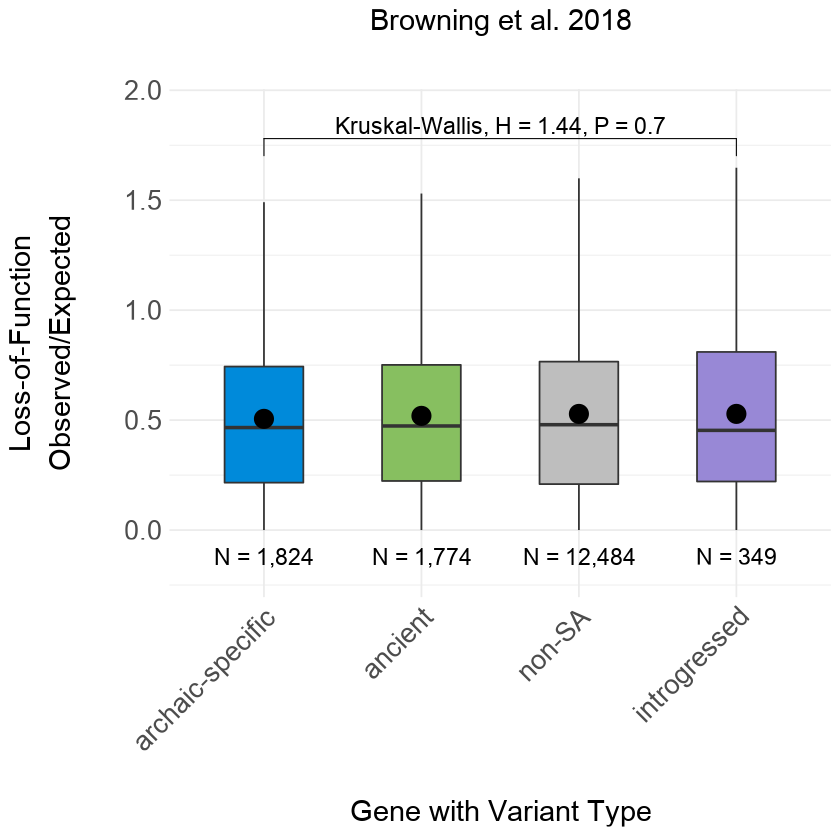

In [154]:
Browning_genes_constraint_lof_oe = Browning_genes_constraint_lof_oe + geom_bracket(xmin = 'archaic-specific', xmax = 'introgressed', y.position = 1.78, tip.length = c(0.008), label = 'Kruskal-Wallis, H = 1.44, P = 0.7', label.size = 6, family = 'Arial', inherit.aes = FALSE)
Browning_genes_constraint_lof_oe

## Vernot et al. 2016 <a class = 'anchor' id = 'vernotconstraint'></a>

### Missense Observed/Expected

In [155]:
SA_genes_mis_oe <- subset(data_2, select = c('annotation','Vernot_allele_origin','mis_oe'))

In [156]:
ancient_genes_mis_oe <- subset(SA_genes_mis_oe, Vernot_allele_origin == 'ancient')
ancient_genes_mis_oe <- ancient_genes_mis_oe[!duplicated(ancient_genes_mis_oe), ]
ancient_genes_mis_oe <- na.omit(ancient_genes_mis_oe)
head(ancient_genes_mis_oe)

,annotation,Vernot_allele_origin,mis_oe
,<chr>,<chr>,<dbl>
25,SAMD11,ancient,1.50820
131,PLEKHN1,ancient,1.25930
211,AGRN,ancient,0.98257
331,TTLL10,ancient,0.95390
410,SDF4,ancient,0.90199
529,ACAP3,ancient,0.79314


In [157]:
nrow(ancient_genes_mis_oe)

[1] 1817

In [158]:
archaic_specific_genes_mis_oe <- subset(SA_genes_mis_oe, Vernot_allele_origin == 'archaic-specific')
archaic_specific_genes_mis_oe <- archaic_specific_genes_mis_oe[!duplicated(archaic_specific_genes_mis_oe), ]
archaic_specific_genes_mis_oe <- na.omit(archaic_specific_genes_mis_oe)
head(archaic_specific_genes_mis_oe)

,annotation,Vernot_allele_origin,mis_oe
,<chr>,<chr>,<dbl>
66,SAMD11,archaic-specific,1.50820
225,AGRN,archaic-specific,0.98257
378,SDF4,archaic-specific,0.90199
1653,MORN1,archaic-specific,1.04670
1890,MMEL1,archaic-specific,0.98394
3148,MEGF6,archaic-specific,0.95847


In [159]:
nrow(archaic_specific_genes_mis_oe)

[1] 1832

In [160]:
introgressed_genes_mis_oe <- subset(SA_genes_mis_oe, Vernot_allele_origin == 'introgressed')
introgressed_genes_mis_oe <- introgressed_genes_mis_oe[!duplicated(introgressed_genes_mis_oe), ]
introgressed_genes_mis_oe <- na.omit(introgressed_genes_mis_oe)
head(introgressed_genes_mis_oe)

,annotation,Vernot_allele_origin,mis_oe
,<chr>,<chr>,<dbl>
10572,C1orf167,introgressed,0.88374
17108,EMC1,introgressed,0.84271
19012,HSPG2,introgressed,0.93887
22076,CEP85,introgressed,0.96911
24227,PUM1,introgressed,0.52545
27632,AGO3,introgressed,0.33906


In [161]:
nrow(introgressed_genes_mis_oe)

[1] 234

In [162]:
SA_genes_mis_oe = rbind(archaic_specific_genes_mis_oe, ancient_genes_mis_oe, introgressed_genes_mis_oe)
head(SA_genes_mis_oe)

,annotation,Vernot_allele_origin,mis_oe
,<chr>,<chr>,<dbl>
66,SAMD11,archaic-specific,1.50820
225,AGRN,archaic-specific,0.98257
378,SDF4,archaic-specific,0.90199
1653,MORN1,archaic-specific,1.04670
1890,MMEL1,archaic-specific,0.98394
3148,MEGF6,archaic-specific,0.95847


In [163]:
nrow(SA_genes_mis_oe)

[1] 3883

In [164]:
non_SA_genes_mis_oe = subset(data, !(annotation %in% data_2$annotation))
non_SA_genes_mis_oe = subset(non_SA_genes_mis_oe, select = c('annotation','Vernot_allele_origin','mis_oe'))
non_SA_genes_mis_oe <- non_SA_genes_mis_oe[!duplicated(non_SA_genes_mis_oe$annotation), ]
non_SA_genes_mis_oe <- na.omit(non_SA_genes_mis_oe)
non_SA_genes_mis_oe$Vernot_allele_origin <- 'non-SA'
head(non_SA_genes_mis_oe)

,annotation,Vernot_allele_origin,mis_oe
,<chr>,<chr>,<dbl>
2,AL645608.1,non-SA,1.2217
71,NOC2L,non-SA,1.2489
108,KLHL17,non-SA,1.0772
146,HES4,non-SA,1.1390
148,ISG15,non-SA,1.0115
240,RNF223,non-SA,1.1504


In [165]:
nrow(non_SA_genes_mis_oe)

[1] 12708

In [166]:
genes_mis_oe = rbind(SA_genes_mis_oe, non_SA_genes_mis_oe)
head(genes_mis_oe)

,annotation,Vernot_allele_origin,mis_oe
,<chr>,<chr>,<dbl>
66,SAMD11,archaic-specific,1.50820
225,AGRN,archaic-specific,0.98257
378,SDF4,archaic-specific,0.90199
1653,MORN1,archaic-specific,1.04670
1890,MMEL1,archaic-specific,0.98394
3148,MEGF6,archaic-specific,0.95847


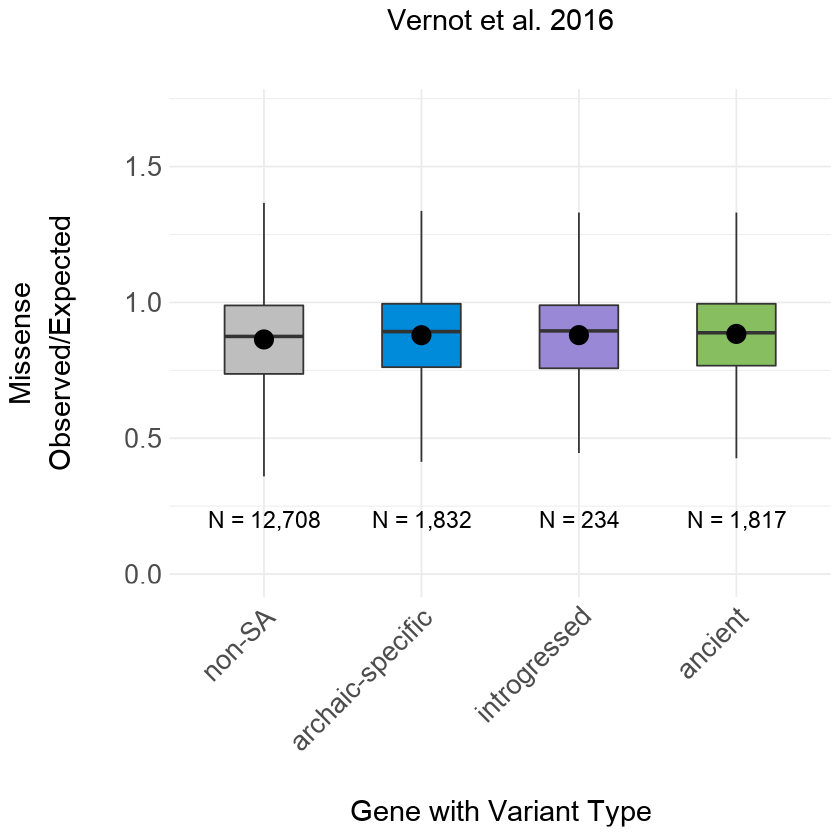

In [167]:
Vernot_genes_constraint_mis_oe <- ggplot(genes_mis_oe, aes(x = reorder(Vernot_allele_origin, mis_oe), y = mis_oe, fill = Vernot_allele_origin)) +
geom_boxplot(width=0.5, outlier.shape = NA) + coord_cartesian(ylim = c(0,1.7)) +
stat_summary(fun = 'mean', geom = 'point', color = 'black', size = 5) +
xlab('\nGene with Variant Type') + ylab('Missense\nObserved/Expected\n') +
ggtitle('Vernot et al. 2016\n') +
scale_fill_manual(values = c(ancient_color,archaic_specific_color,introgressed_color,non_SAV_color)) +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 22)) +
theme(axis.title = element_text(size = 22), axis.text.x = element_text(size = 20, angle = 45, hjust = 1), axis.text.y = element_text(size = 20)) +
theme(legend.position = "none") +
annotate('text', x = 'non-SA', y = 0.2, label = 'N = 12,708', size = 6, family = 'Arial') + 
annotate('text', x = 'ancient', y = 0.2, label = 'N = 1,817', , size = 6, family = 'Arial') +
annotate('text', x = 'archaic-specific', y = 0.2, label = 'N = 1,832', , size = 6, family = 'Arial') +
annotate('text', x = 'introgressed', y = 0.2, label = 'N = 234', , size = 6, family = 'Arial') 

Vernot_genes_constraint_mis_oe

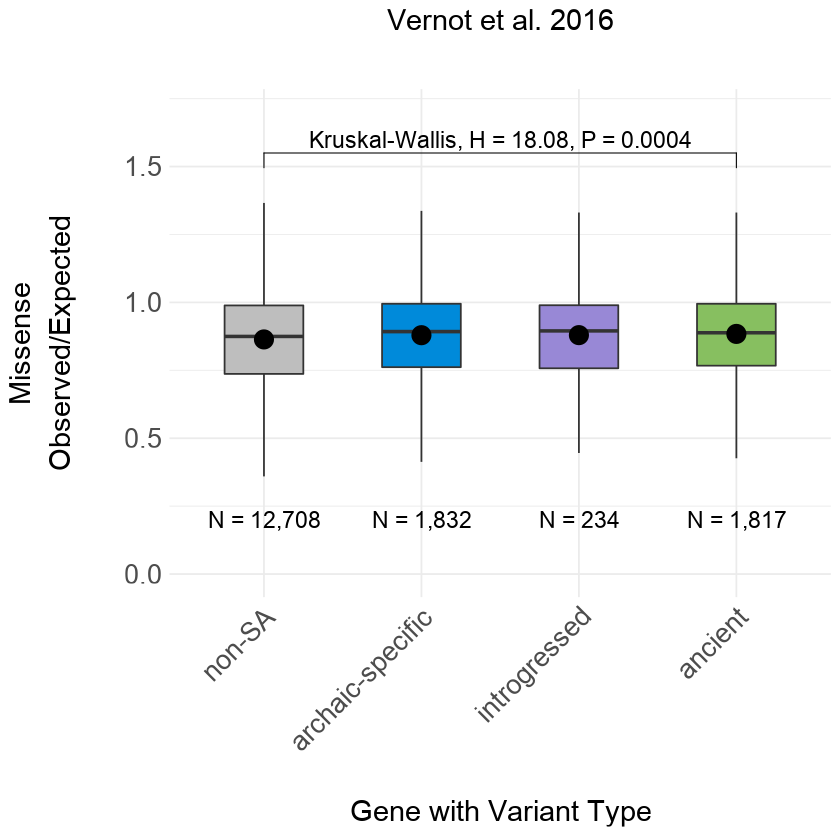

In [168]:
Vernot_genes_constraint_mis_oe = Vernot_genes_constraint_mis_oe + geom_bracket(xmin = 'non-SA', xmax = 'ancient', y.position = 1.55, tip.length = c(0.015), label = 'Kruskal-Wallis, H = 18.08, P = 0.0004', label.size = 6, family = 'Arial', inherit.aes = FALSE)
Vernot_genes_constraint_mis_oe

### Loss of Function Observed/Expected

In [169]:
SA_genes_lof_oe <- subset(data_2, select = c('annotation','Vernot_allele_origin','lof_oe'))

In [170]:
ancient_genes_lof_oe <- subset(SA_genes_lof_oe, Vernot_allele_origin == 'ancient')
ancient_genes_lof_oe <- ancient_genes_lof_oe[!duplicated(ancient_genes_lof_oe), ]
ancient_genes_lof_oe <- na.omit(ancient_genes_lof_oe)
head(ancient_genes_lof_oe)

,annotation,Vernot_allele_origin,lof_oe
,<chr>,<chr>,<dbl>
25,SAMD11,ancient,0.89656
131,PLEKHN1,ancient,0.80467
211,AGRN,ancient,0.31914
331,TTLL10,ancient,0.77894
410,SDF4,ancient,0.38720
529,ACAP3,ancient,0.39045


In [171]:
nrow(ancient_genes_lof_oe)

[1] 1811

In [172]:
archaic_specific_genes_lof_oe <- subset(SA_genes_lof_oe, Vernot_allele_origin == 'archaic-specific')
archaic_specific_genes_lof_oe <- archaic_specific_genes_lof_oe[!duplicated(archaic_specific_genes_lof_oe), ]
archaic_specific_genes_lof_oe <- na.omit(archaic_specific_genes_lof_oe)
head(archaic_specific_genes_lof_oe)

,annotation,Vernot_allele_origin,lof_oe
,<chr>,<chr>,<dbl>
66,SAMD11,archaic-specific,0.89656
225,AGRN,archaic-specific,0.31914
378,SDF4,archaic-specific,0.38720
1653,MORN1,archaic-specific,0.76779
1890,MMEL1,archaic-specific,0.76824
3148,MEGF6,archaic-specific,0.73856


In [173]:
nrow(archaic_specific_genes_lof_oe)

[1] 1824

In [174]:
introgressed_genes_lof_oe <- subset(SA_genes_lof_oe, Vernot_allele_origin == 'introgressed')
introgressed_genes_lof_oe <- introgressed_genes_lof_oe[!duplicated(introgressed_genes_lof_oe), ]
introgressed_genes_lof_oe <- na.omit(introgressed_genes_lof_oe)
head(introgressed_genes_lof_oe)

,annotation,Vernot_allele_origin,lof_oe
,<chr>,<chr>,<dbl>
10572,C1orf167,introgressed,0.843340
17108,EMC1,introgressed,0.789020
19012,HSPG2,introgressed,0.341210
22076,CEP85,introgressed,0.338850
24227,PUM1,introgressed,0.049979
27632,AGO3,introgressed,0.084318


In [175]:
nrow(introgressed_genes_lof_oe)

[1] 234

In [176]:
SA_genes_lof_oe = rbind(archaic_specific_genes_lof_oe, ancient_genes_lof_oe, introgressed_genes_lof_oe)
head(SA_genes_lof_oe)

,annotation,Vernot_allele_origin,lof_oe
,<chr>,<chr>,<dbl>
66,SAMD11,archaic-specific,0.89656
225,AGRN,archaic-specific,0.31914
378,SDF4,archaic-specific,0.38720
1653,MORN1,archaic-specific,0.76779
1890,MMEL1,archaic-specific,0.76824
3148,MEGF6,archaic-specific,0.73856


In [177]:
nrow(SA_genes_lof_oe)

[1] 3869

In [178]:
non_SA_genes_lof_oe = subset(data, !(annotation %in% data_2$annotation))
non_SA_genes_lof_oe = subset(non_SA_genes_lof_oe, select = c('annotation','Vernot_allele_origin','lof_oe'))
non_SA_genes_lof_oe <- non_SA_genes_lof_oe[!duplicated(non_SA_genes_lof_oe$annotation), ]
non_SA_genes_lof_oe <- na.omit(non_SA_genes_lof_oe)
non_SA_genes_lof_oe$Vernot_allele_origin <- 'non-SA'
head(non_SA_genes_lof_oe)

,annotation,Vernot_allele_origin,lof_oe
,<chr>,<chr>,<dbl>
2,AL645608.1,non-SA,0.73515
71,NOC2L,non-SA,1.02910
108,KLHL17,non-SA,0.90749
146,HES4,non-SA,1.69970
148,ISG15,non-SA,0.00000
240,RNF223,non-SA,0.95227


In [179]:
nrow(non_SA_genes_lof_oe)

[1] 12484

In [180]:
genes_lof_oe = rbind(SA_genes_lof_oe, non_SA_genes_lof_oe)
head(genes_lof_oe)

,annotation,Vernot_allele_origin,lof_oe
,<chr>,<chr>,<dbl>
66,SAMD11,archaic-specific,0.89656
225,AGRN,archaic-specific,0.31914
378,SDF4,archaic-specific,0.38720
1653,MORN1,archaic-specific,0.76779
1890,MMEL1,archaic-specific,0.76824
3148,MEGF6,archaic-specific,0.73856


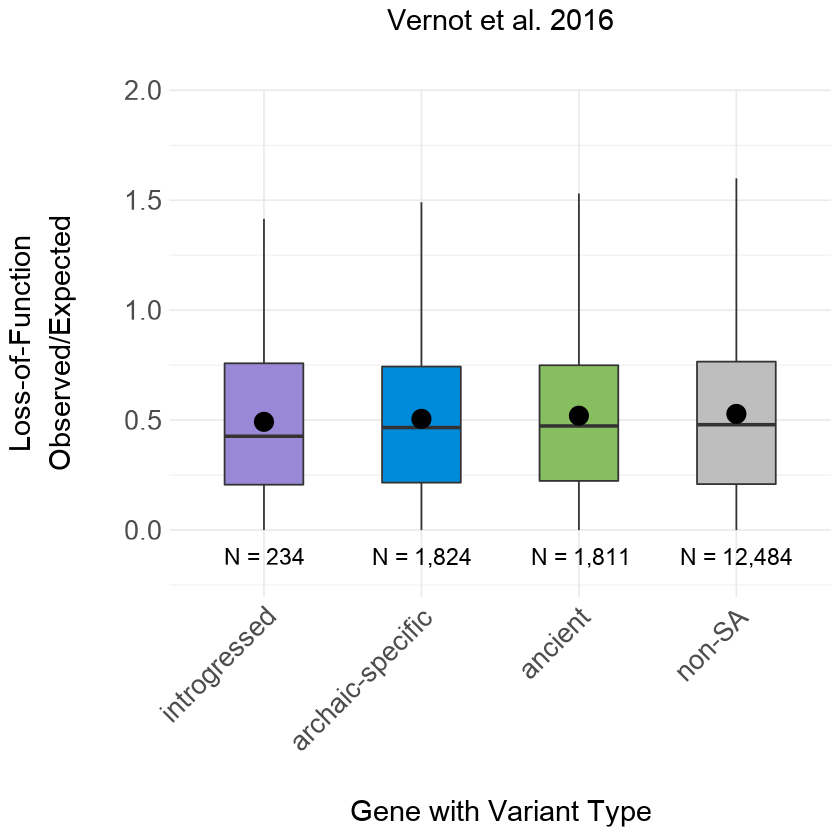

In [181]:
Vernot_genes_constraint_lof_oe <- ggplot(genes_lof_oe, aes(x = reorder(Vernot_allele_origin, lof_oe), y = lof_oe, fill = Vernot_allele_origin)) +
geom_boxplot(width=0.5, outlier.shape = NA) + coord_cartesian(ylim = c(-0.2,1.9)) +
stat_summary(fun = 'mean', geom = 'point', color = 'black', size = 5) +
scale_fill_manual(values = c(ancient_color,archaic_specific_color,introgressed_color,non_SAV_color)) +
xlab('\nGene with Variant Type') + ylab('Loss-of-Function\nObserved/Expected\n') +
ggtitle('Vernot et al. 2016\n') +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 22)) +
theme(axis.title = element_text(size = 22), axis.text.x = element_text(size = 20, angle = 45, hjust = 1), axis.text.y = element_text(size = 20)) +
theme(legend.position = "none") +
annotate('text', x = 'non-SA', y = -0.12, label = 'N = 12,484', size = 6, family = 'Arial') + 
annotate('text', x = 'ancient', y = -0.12, label = 'N = 1,811', , size = 6, family = 'Arial') +
annotate('text', x = 'archaic-specific', y = -0.12, label = 'N = 1,824', size = 6, family = 'Arial') +
annotate('text', x = 'introgressed', y = -0.12, label = 'N = 234', , size = 6, family = 'Arial')

Vernot_genes_constraint_lof_oe

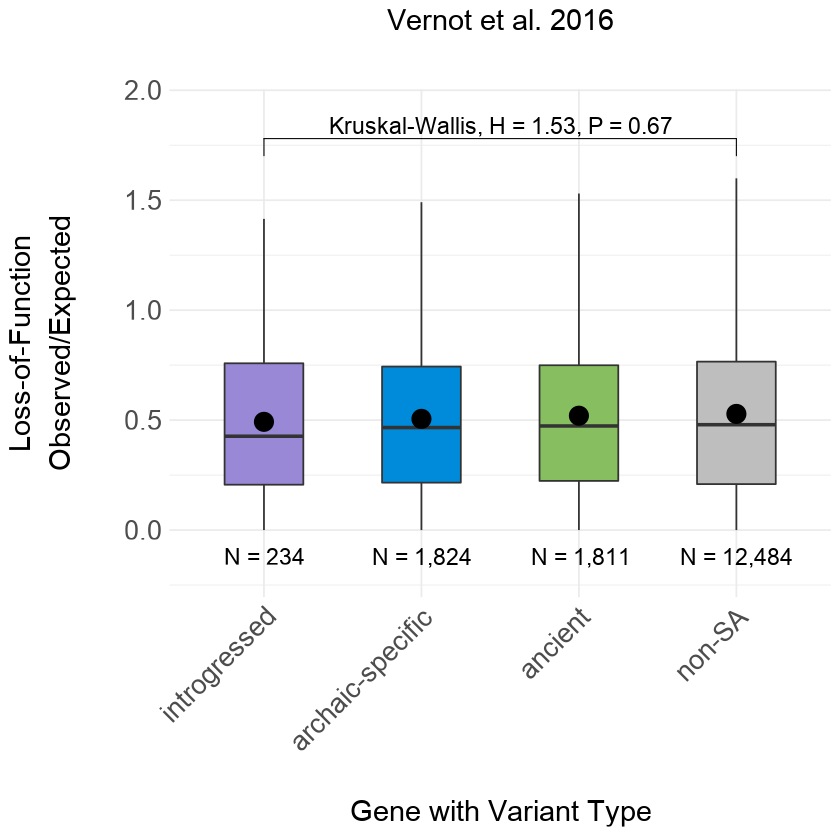

In [182]:
Vernot_genes_constraint_lof_oe = Vernot_genes_constraint_lof_oe + geom_bracket(xmin = 'introgressed', xmax = 'non-SA', y.position = 1.78, tip.length = c(0.008), label = 'Kruskal-Wallis, H = 1.53, P = 0.67', label.size = 6, family = 'Arial', inherit.aes = FALSE)
Vernot_genes_constraint_lof_oe

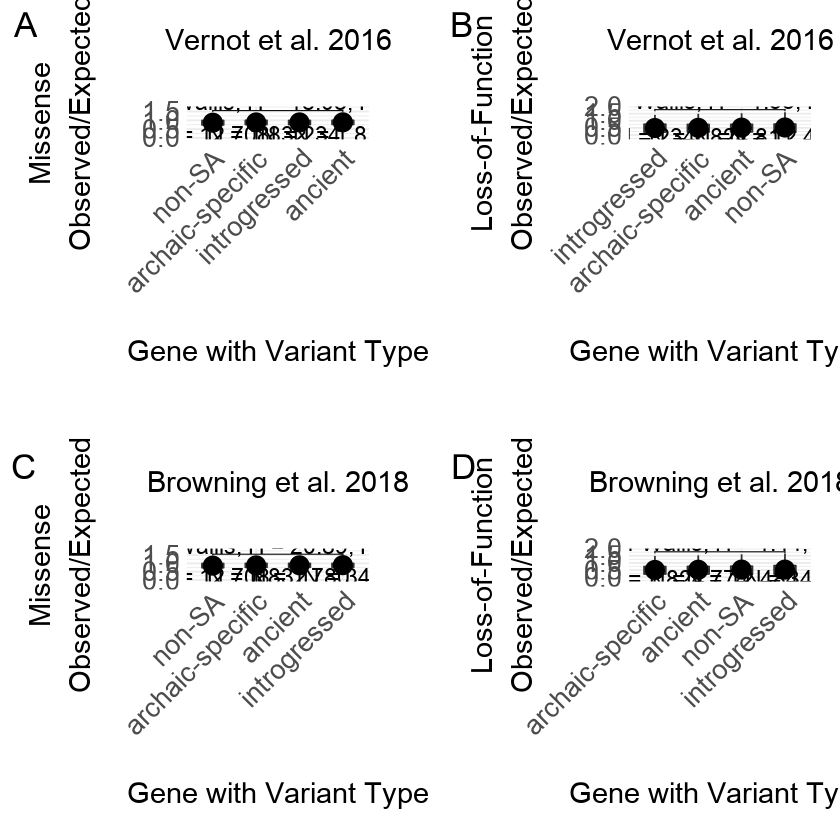

In [183]:
top_row <- plot_grid(Vernot_genes_constraint_mis_oe, NULL, Vernot_genes_constraint_lof_oe, labels = c('A','','B'), label_size = 26, rel_widths = c(0.45,0.05,0.45), nrow = 1, scale = 0.9)
middle_row <- plot_grid(NULL, labels = c(''), nrow = 1, scale = 0.9)
bottom_row <- plot_grid(Browning_genes_constraint_mis_oe, NULL, Browning_genes_constraint_lof_oe, labels = c('C','','D'), label_size = 26, rel_widths = c(0.45,0.05,0.45), nrow = 1, scale = 0.9)
theme_set(theme_cowplot(font_family = 'Arial'))
genes_constraint_plot <- plot_grid(top_row, middle_row, bottom_row, rel_heights = c(0.45,0.05,0.45), ncol = 1)
genes_constraint_plot

In [184]:
pdf('suppl_figs/genes_constraint_plot.pdf', width = 20, height = 18)
genes_constraint_plot
dev.off()

png 
  2

# Conservation <a class = 'anchor' id = 'conservation'></a>

## Browning et al. 2018 <a class = 'anchor' id = 'browningconservation'></a>

In [185]:
SA_genes_phyloP <- subset(data_2, select = c('Browning_allele_origin','phyloP'))
SA_genes_phyloP <- subset(SA_genes_phyloP, Browning_allele_origin != 'low-confidence ancient')
SA_genes_phyloP <- na.omit(SA_genes_phyloP)
non_SA_genes_phyloP <- subset(data, delta_max < 0.2)
non_SA_genes_phyloP <- subset(non_SA_genes_phyloP, select = c('Browning_allele_origin','phyloP'))
non_SA_genes_phyloP$Browning_allele_origin <- 'non-SA'
non_SA_genes_phyloP <- na.omit(non_SA_genes_phyloP)

In [186]:
variants_phyloP = rbind(SA_genes_phyloP, non_SA_genes_phyloP)
head(variants_phyloP)

,Browning_allele_origin,phyloP
,<chr>,<dbl>
25,ancient,0.398
66,archaic-specific,-0.847
131,ancient,-1.259
211,ancient,0.364
219,ancient,0.561
225,archaic-specific,-0.375


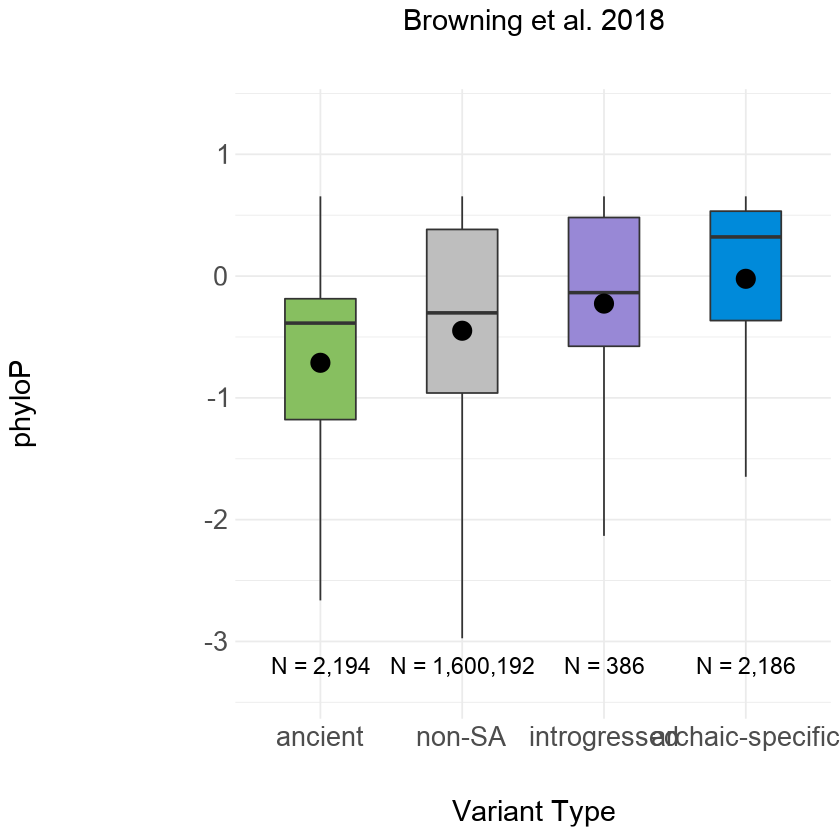

In [187]:
Browning_genes_constraint_variant_phyloP <- ggplot(variants_phyloP, aes(x = reorder(Browning_allele_origin, phyloP), y = phyloP, fill = Browning_allele_origin)) +
geom_boxplot(width=0.5, outlier.shape = NA) + coord_cartesian(ylim = c(-3.4,1.3)) +
stat_summary(fun = 'mean', geom = 'point', color = 'black', size = 5) +
scale_fill_manual(values = c(ancient_color,archaic_specific_color,introgressed_color,non_SAV_color)) +
xlab('\nVariant Type') + ylab('phyloP\n\n\n\n') +
ggtitle('Browning et al. 2018\n') +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 22)) +
theme(axis.title = element_text(size = 22), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20)) +
theme(legend.position = "none") +
annotate('text', x = 'non-SA', y = -3.2, label = 'N = 1,600,192', size = 6, family = 'Arial') + 
annotate('text', x = 'ancient', y = -3.2, label = 'N = 2,194', size = 6, family = 'Arial') +
annotate('text', x = 'archaic-specific', y = -3.2, label = 'N = 2,186', size = 6, family = 'Arial') +
annotate('text', x = 'introgressed', y = -3.2, label = 'N = 386', size = 6, family = 'Arial')

Browning_genes_constraint_variant_phyloP

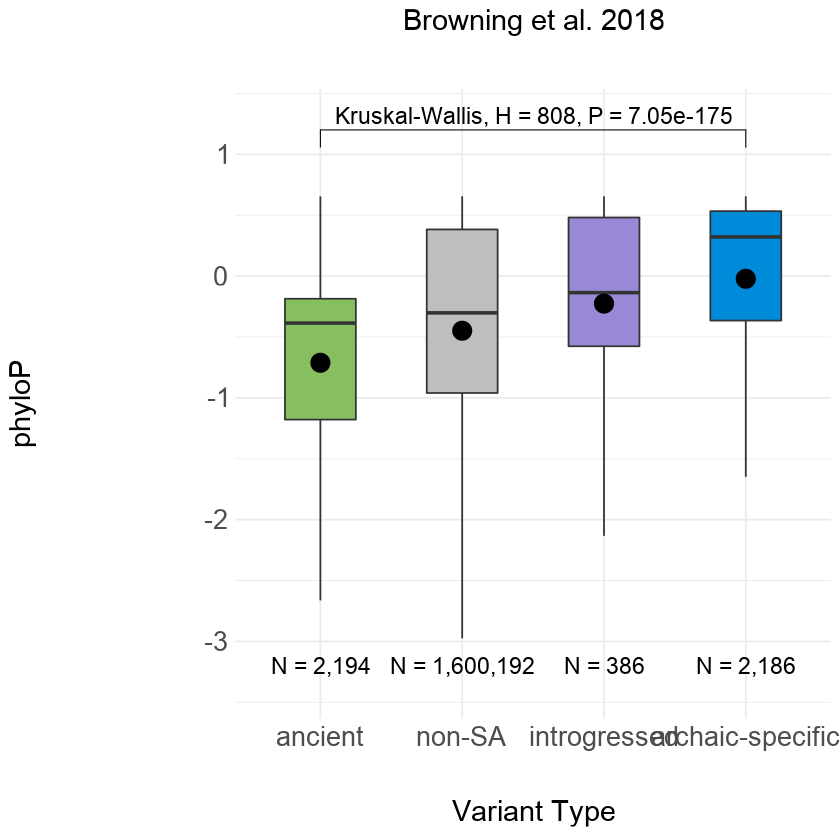

In [188]:
Browning_genes_constraint_variant_phyloP = Browning_genes_constraint_variant_phyloP + geom_bracket(xmin = 'ancient', xmax = 'archaic-specific', y.position = 1.2, tip.length = c(0.015), label = 'Kruskal-Wallis, H = 808, P = 7.05e-175', label.size = 6, family = 'Arial', inherit.aes = FALSE)
Browning_genes_constraint_variant_phyloP

In [189]:
pdf('suppl_figs/Browning_genes_constraint_variant_phyloP.pdf', width = 14, height = 12)
Browning_genes_constraint_variant_phyloP
dev.off()

png 
  2

## Vernot et al. 2016 <a class = 'anchor' id = 'vernotconservation'></a>

In [190]:
SA_genes_phyloP <- subset(data_2, select = c('Vernot_allele_origin','phyloP'))
SA_genes_phyloP <- subset(SA_genes_phyloP, Vernot_allele_origin != 'low-confidence ancient')
SA_genes_phyloP <- na.omit(SA_genes_phyloP)
non_SA_genes_phyloP <- subset(data, delta_max < 0.2)
non_SA_genes_phyloP <- subset(non_SA_genes_phyloP, select = c('Vernot_allele_origin','phyloP'))
non_SA_genes_phyloP$Vernot_allele_origin <- 'non-SA'
non_SA_genes_phyloP <- na.omit(non_SA_genes_phyloP)

In [191]:
variants_phyloP = rbind(SA_genes_phyloP, non_SA_genes_phyloP)
head(variants_phyloP)

,Vernot_allele_origin,phyloP
,<chr>,<dbl>
25,ancient,0.398
66,archaic-specific,-0.847
131,ancient,-1.259
211,ancient,0.364
219,ancient,0.561
225,archaic-specific,-0.375


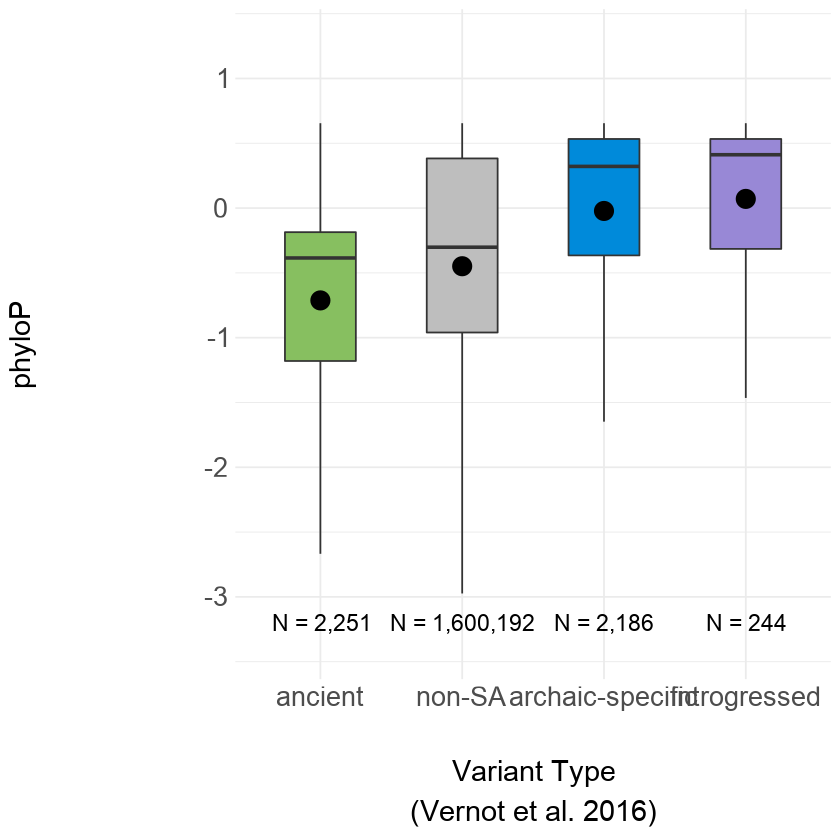

In [192]:
Vernot_genes_constraint_variant_phyloP <- ggplot(variants_phyloP, aes(x = reorder(Vernot_allele_origin, phyloP), y = phyloP, fill = Vernot_allele_origin)) +
geom_boxplot(width=0.5, outlier.shape = NA) + coord_cartesian(ylim = c(-3.4,1.3)) +
stat_summary(fun = 'mean', geom = 'point', color = 'black', size = 5) +
scale_fill_manual(values = c(ancient_color,archaic_specific_color,introgressed_color,non_SAV_color)) +
xlab('\nVariant Type\n(Vernot et al. 2016)') + ylab('phyloP\n\n\n\n') +
#ggtitle('Vernot et al. 2016\n') +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
#theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 22)) +
#theme(axis.title = element_text(size = 22), axis.text.x = element_text(size = 20, angle = 45, hjust = 1), axis.text.y = element_text(size = 20)) +
theme(axis.title = element_text(size = 22), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20)) +
theme(legend.position = "none") +
annotate('text', x = 'non-SA', y = -3.2, label = 'N = 1,600,192', size = 6, family = 'Arial') + 
annotate('text', x = 'ancient', y = -3.2, label = 'N = 2,251', size = 6, family = 'Arial') +
annotate('text', x = 'archaic-specific', y = -3.2, label = 'N = 2,186', size = 6, family = 'Arial') +
annotate('text', x = 'introgressed', y = -3.2, label = 'N = 244', size = 6, family = 'Arial')

Vernot_genes_constraint_variant_phyloP

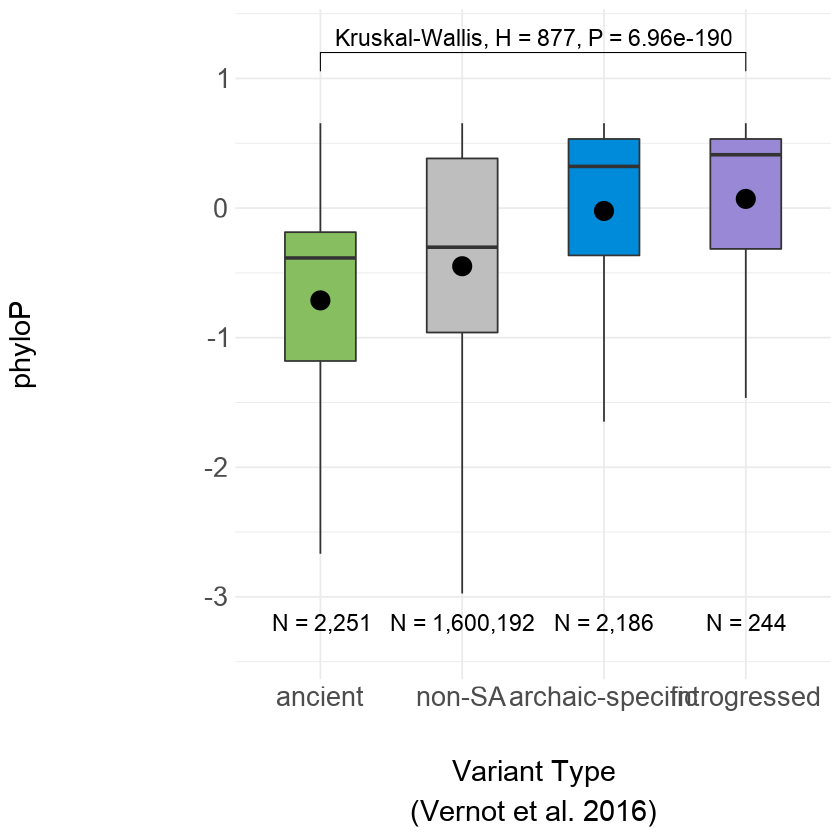

In [193]:
Vernot_genes_constraint_variant_phyloP = Vernot_genes_constraint_variant_phyloP + geom_bracket(xmin = 'ancient', xmax = 'introgressed', y.position = 1.2, tip.length = c(0.015), label = 'Kruskal-Wallis, H = 877, P = 6.96e-190', label.size = 6, family = 'Arial', inherit.aes = FALSE)
Vernot_genes_constraint_variant_phyloP

In [194]:
pdf('Vernot_genes_constraint_variant_phyloP.pdf', width = 14, height = 12)
Vernot_genes_constraint_variant_phyloP
dev.off()

png 
  2

# Purifying Selection <a class = 'anchor' id = 'purifyingselection'></a>

## Varied Deltas <a class = 'anchor' id = 'varieddeltas'></a>

In [195]:
total_unique_enrichment <- read.csv('../data/dataframes/total_unique_enrichment_tests.txt', header = TRUE, sep = '\t')
total_unique_enrichment$delta_threshold <- as.factor(total_unique_enrichment$delta_threshold)
head(total_unique_enrichment)

,delta_threshold,N_total_unique_SAVs,N_total_unique_non_SAVs,N_shared_SAVs,N_shared_non_SAVs,odds_ratio,p_value,lower_CI,upper_CI
,<fct>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.2,2416,615666,1933,571264,1.159730,1.225950e-06,1.092280,1.231350
2,0.3,1175,616907,945,572252,1.153383,1.099380e-03,1.058636,1.256614
3,0.4,685,617397,533,572664,1.192062,2.351174e-03,1.064410,1.335025
4,0.5,437,617645,328,572869,1.235731,3.771799e-03,1.070824,1.426036


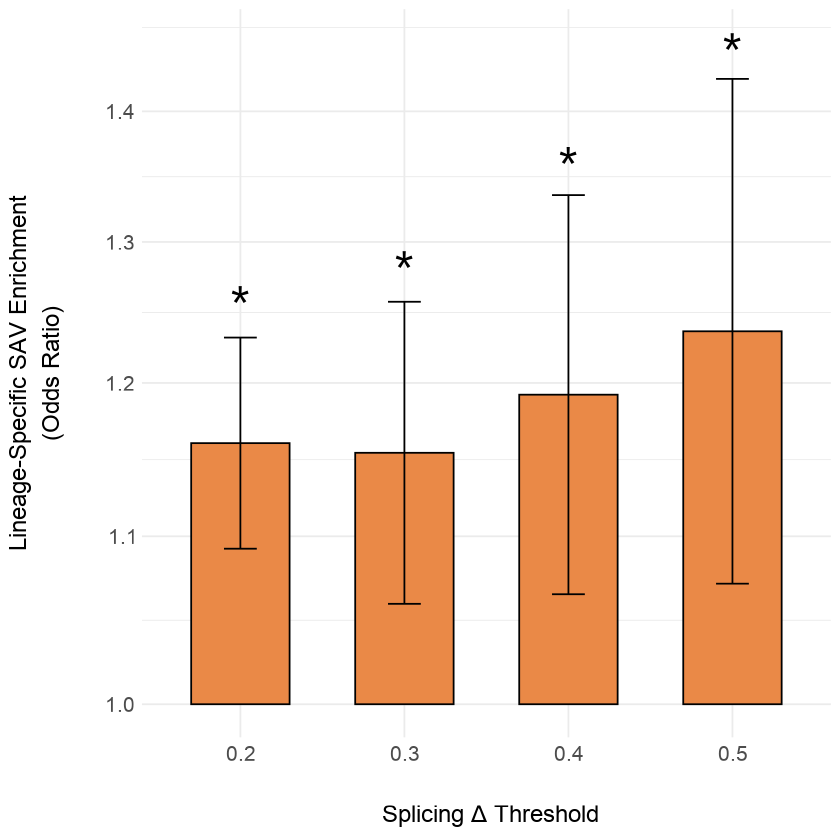

In [196]:
total_unique_enrichment_plot <- ggplot(total_unique_enrichment, aes(x = delta_threshold, y = odds_ratio)) + geom_bar(position = "dodge", stat = "identity", width = 0.6, color = 'black', fill = '#ea8947') +
geom_errorbar(aes(ymin = lower_CI, ymax = upper_CI), width = 0.2) +
scale_y_log10() + 
xlab('\n Splicing \u0394 Threshold') + ylab('Lineage-Specific SAV Enrichment\n(Odds Ratio)\n') +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 18), axis.text.x = element_text(size = 16), axis.text.y = element_text(size = 16)) +
geom_point(data = total_unique_enrichment[total_unique_enrichment$p_value < 0.0125], aes(delta_threshold, upper_CI + 0.03), shape = "*", size=12, color="black")
        
total_unique_enrichment_plot

## Lineage-Specific <a class = 'anchor' id = 'lineagespecific'></a>

In [197]:
lineage_specific_unique_enrichment <- read.csv('../data/dataframes/lineage_specific_enrichment_tests.txt', header = TRUE, sep = '\t')
lineage_specific_unique_enrichment$delta_threshold <- as.factor(lineage_specific_unique_enrichment$delta_threshold)
lineage_specific_unique_enrichment$lineage <- factor(lineage_specific_unique_enrichment$lineage, levels = c('denisovan','altai','chagyrskaya','vindija'))
head(lineage_specific_unique_enrichment)

,delta_threshold,lineage,N_unique_SAVs,N_unique_non_SAVs,N_shared_SAVs,N_shared_non_SAVs,odds_ratio,p_value,lower_CI,upper_CI
,<fct>,<fct>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.2,altai,399,81517,1933,571264,1.446538,1.152673e-10,1.2984202,1.611250
2,0.2,chagyrskaya,218,53457,1933,571264,1.205194,1.078870e-02,1.0474164,1.386416
3,0.2,denisovan,1492,410000,1933,571264,1.075449,3.575391e-02,1.0050886,1.150713
4,0.2,vindija,307,70692,1933,571264,1.283433,8.655485e-05,1.1375377,1.447754
5,0.5,altai,75,81841,328,572869,1.600559,4.931121e-04,1.2453054,2.056994
6,0.5,chagyrskaya,35,53640,328,572869,1.139622,4.524517e-01,0.8041701,1.614854


In [198]:
lineage_specific_unique_2_enrichment <- subset(lineage_specific_unique_enrichment, delta_threshold == '0.2')
lineage_specific_unique_5_enrichment <- subset(lineage_specific_unique_enrichment, delta_threshold == '0.5')

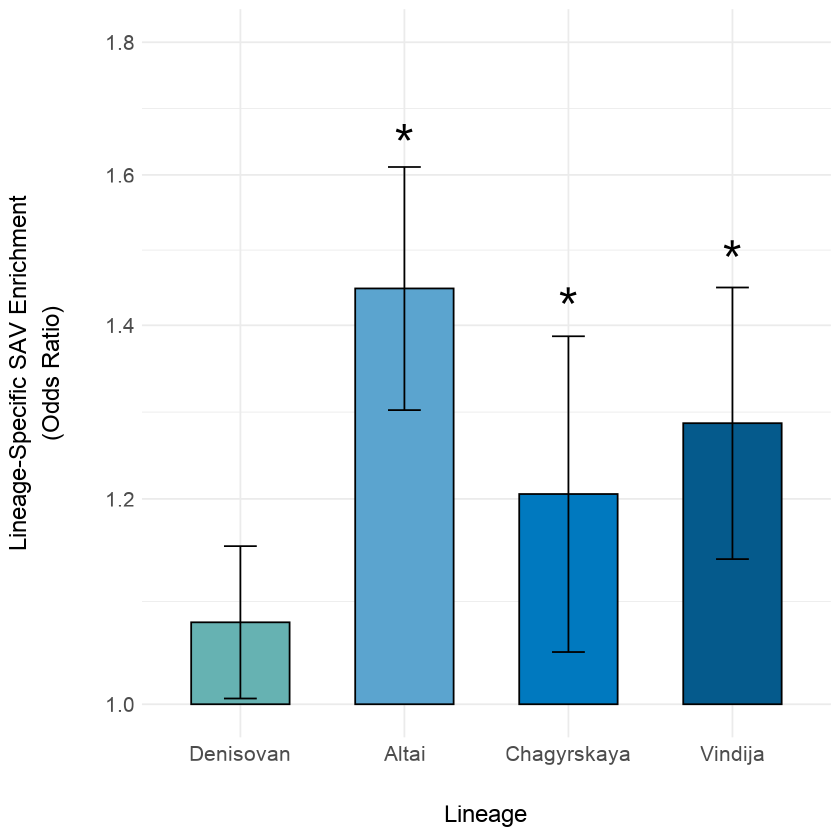

In [199]:
lineage_specific_unique_2_enrichment_plot <- ggplot(lineage_specific_unique_2_enrichment, aes(x = lineage, y = odds_ratio, fill = lineage)) + geom_bar(position = position_dodge(width = 0.2), stat = 'identity', width = 0.6, color = 'black') +
geom_errorbar(aes(ymin = lower_CI, ymax = upper_CI), width = 0.2) +
coord_cartesian(ylim = c(1, 1.8)) + scale_y_log10() +
xlab('\nLineage') + ylab('Lineage-Specific SAV Enrichment\n(Odds Ratio)\n') +
scale_x_discrete(labels=c('Denisovan','Altai','Chagyrskaya','Vindija')) +
theme_minimal() + theme(text = element_text(family = 'Arial')) + 
scale_fill_manual(values = c(altai_color,chagyrskaya_color,denisovan_color,vindija_color)) +
theme(axis.title = element_text(size = 18), axis.text.x = element_text(size = 16), axis.text.y = element_text(size = 16)) +
geom_point(data = lineage_specific_unique_2_enrichment[lineage_specific_unique_2_enrichment$p_value < 0.0125, ], aes(lineage, upper_CI + 0.05), shape = '*', size = 12, color = 'black') +
theme(legend.position = 'none')
#guides(fill = guide_legend(override.aes = list(shape = NA))) + theme(panel.spacing.x = unit(2, "cm", data = NULL))

lineage_specific_unique_2_enrichment_plot

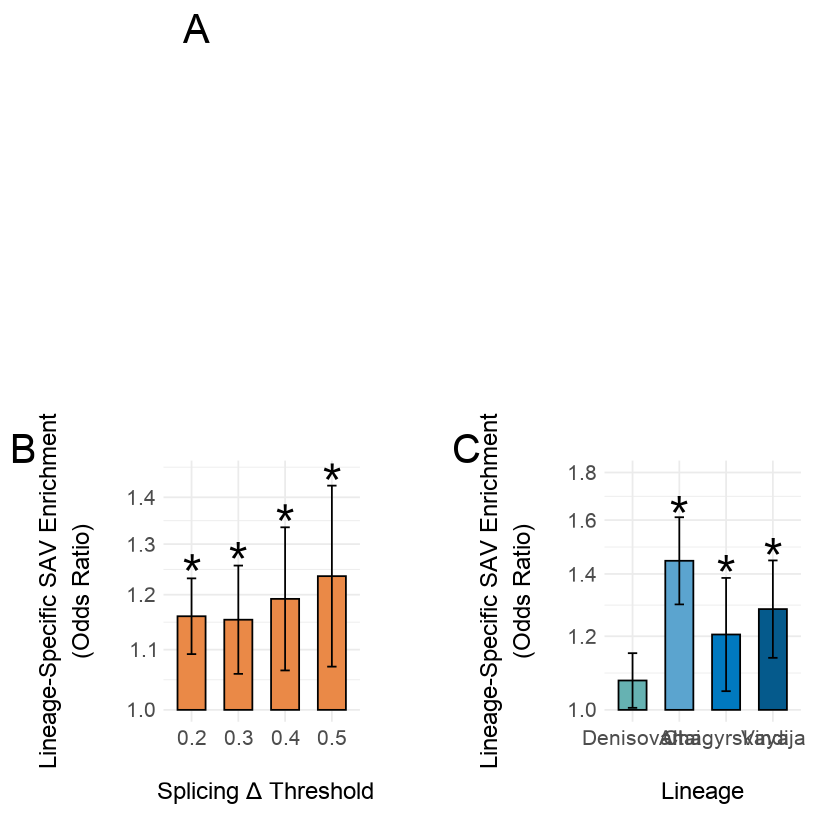

In [200]:
top_row <- plot_grid(NULL, NULL, NULL, labels = c('','A',''), label_size = 30, nrow = 1, rel_widths = c(0.2,0.6,0.2), scale = 0.85)
#middle_row <- plot_grid(total_unique_enrichment_plot, labels = c('B'), label_size = 30, nrow = 1, scale = 0.9)
bottom_row <- plot_grid(total_unique_enrichment_plot, NULL, lineage_specific_unique_2_enrichment_plot, labels = c('B','','C'), label_size = 30, nrow = 1, rel_widths = c(0.475,0.05,0.475), scale= 0.85)
theme_set(theme_cowplot(font_family = 'Arial'))
purifying_selection <- plot_grid(top_row, bottom_row, rel_heights = c(0.5,0.5), ncol = 1)
purifying_selection

In [201]:
pdf('purifying_selection.pdf', width = 20, height = 16)
purifying_selection
dev.off()

png 
  2

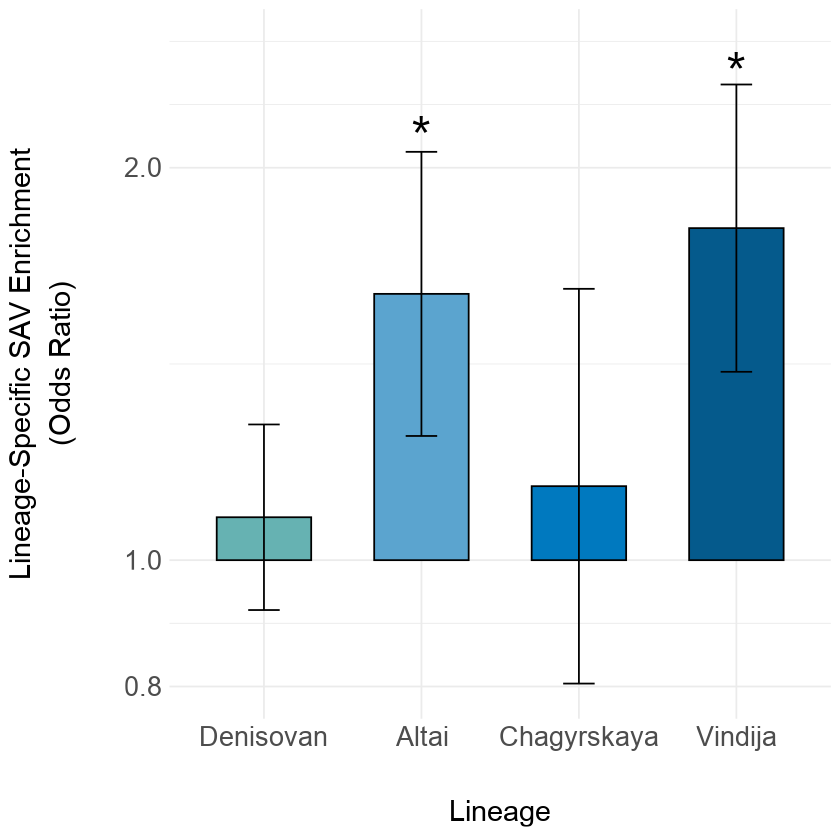

In [202]:
lineage_specific_unique_5_enrichment_plot <- ggplot(lineage_specific_unique_5_enrichment, aes(x = lineage, y = odds_ratio, fill = lineage)) + geom_bar(position = position_dodge(width = 0.2), stat = 'identity', width = 0.6, color = 'black') +
geom_errorbar(aes(ymin = lower_CI, ymax = upper_CI), width = 0.2) +
coord_cartesian(ylim = c(0.8, 2.5)) + scale_y_log10() +
xlab('\nLineage') + ylab('Lineage-Specific SAV Enrichment\n(Odds Ratio)\n') +
theme_minimal() + scale_fill_manual(values = c(altai_color,chagyrskaya_color,denisovan_color,vindija_color)) +
scale_x_discrete(labels=c('Denisovan','Altai','Chagyrskaya','Vindija')) +
theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 22), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20)) +
theme(strip.text = element_text(size = 20)) +
geom_point(data = lineage_specific_unique_5_enrichment[lineage_specific_unique_5_enrichment$p_value < 0.0125, ], aes(lineage, upper_CI + 0.1), shape = '*', size=12, color='black') +
theme(legend.position = 'none')

lineage_specific_unique_5_enrichment_plot

In [203]:
pdf('suppl_figs/lineage_specific_unique_5_enrichment_plot.pdf', width = 15, height = 10)
lineage_specific_unique_5_enrichment_plot
dev.off()

png 
  2

# SAVs in Moderns <a class = 'anchor' id = 'SAVsinmoderns'></a>

## Introgression Distribution <a class = 'anchor' id = 'introgressiondistribution'></a>

### Vernot et al. 2016 <a class = 'anchor' id = 'vernotintrogressiondistribution'></a>

In [204]:
obs <- c('Expected','Expected','Expected','Expected','Expected','Observed','Observed','Observed','Observed','Observed')
dist <- c('Altai','Chagyrskaya','Late\nNeanderthal','All\nNeanderthals','Vindija','Altai','Chagyrskaya','Late\nNeanderthal','All\nNeanderthals','Vindija')
prop <- c(0.291262,0.164078,0.091262,0.229126,0.224272,0.046667,0,0,0.953333,0)
Vernot_archaic_specific_introgressed_proportions_2 <- data.frame(obs,dist,prop)
Vernot_archaic_specific_introgressed_proportions_2$obs <- factor(Vernot_archaic_specific_introgressed_proportions_2$obs, levels = c('Expected','Observed'))
Vernot_archaic_specific_introgressed_proportions_2$dist <- factor(Vernot_archaic_specific_introgressed_proportions_2$dist, levels = c('Vindija','Chagyrskaya','Late\nNeanderthal','Altai','All\nNeanderthals'))

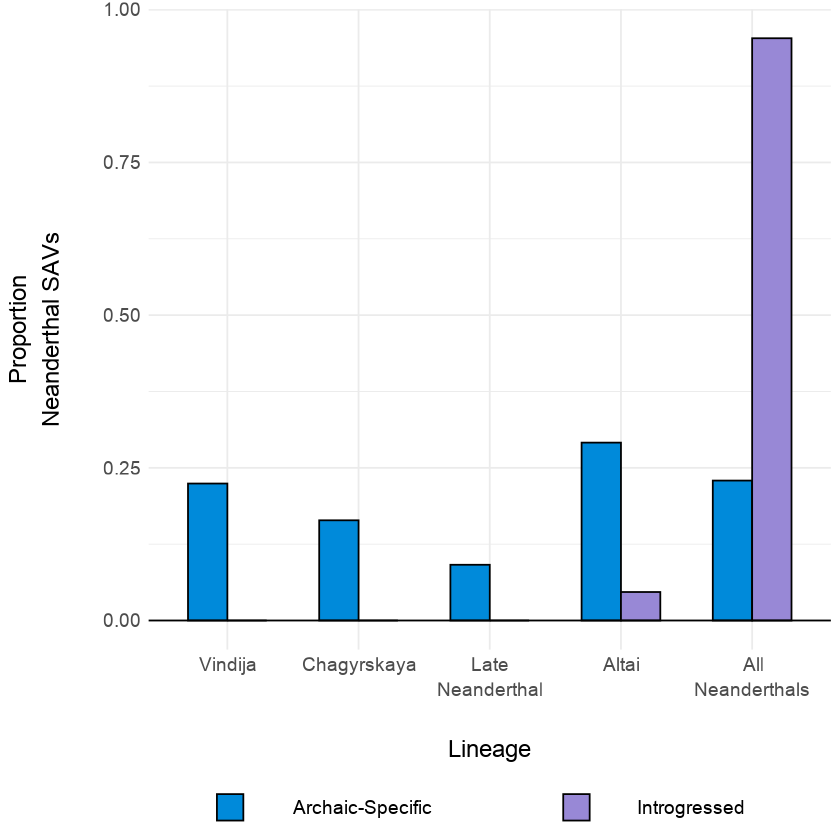

In [205]:
Vernot_archaic_specific_introgressed_proportions_2_plot <- ggplot(Vernot_archaic_specific_introgressed_proportions_2, aes(x = dist, y = prop, group = obs, fill = obs)) + 
geom_bar(position = 'dodge', stat = 'identity', width = 0.6, color = 'black') +
geom_hline(yintercept = 0, color = 'black') +
xlab('\nLineage') + ylab('Proportion\nNeanderthal SAVs\n') +
#ggtitle('Vernot et al. 2016\n') +
scale_fill_manual(labels = c('Archaic-Specific','Introgressed'), values = c(archaic_specific_color,introgressed_color)) +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
#theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 20)) +
theme(axis.title = element_text(size = 18), axis.text.x = element_text(size = 14), axis.text.y = element_text(size = 14)) +
theme(legend.title = element_blank(), legend.text = element_text(size = 14), legend.spacing.x = unit(1, 'cm')) +
theme(legend.position = 'bottom')

Vernot_archaic_specific_introgressed_proportions_2_plot

Repeat for delta >= 0.5.

In [206]:
obs <- c('Expected','Expected','Expected','Expected','Expected','Observed','Observed','Observed','Observed','Observed')
dist <- c('Altai','Chagyrskaya','Late\nNeanderthal','All\nNeanderthals','Vindija','Altai','Chagyrskaya','Late\nNeanderthal','All\nNeanderthals','Vindija')
prop <- c(0.308108,0.145946,0.054054,0.194595,0.297297,0.025641,0,0,0.974359,0)
Vernot_archaic_specific_introgressed_proportions_5 <- data.frame(obs,dist,prop)
Vernot_archaic_specific_introgressed_proportions_5$obs <- factor(Vernot_archaic_specific_introgressed_proportions_5$obs, levels = c('Expected','Observed'))
Vernot_archaic_specific_introgressed_proportions_5$dist <- factor(Vernot_archaic_specific_introgressed_proportions_5$dist, levels = c('Vindija','Chagyrskaya','Late\nNeanderthal','Altai','All\nNeanderthals'))

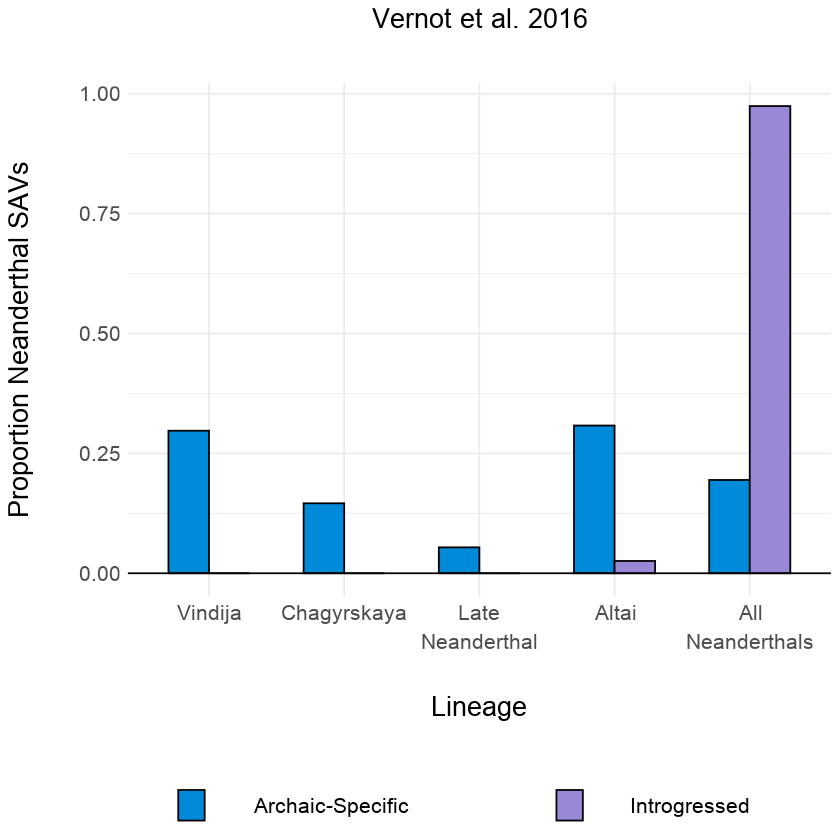

In [207]:
Vernot_archaic_specific_introgressed_proportions_5_plot <- ggplot(Vernot_archaic_specific_introgressed_proportions_5, aes(x = dist, y = prop, group = obs, fill = obs)) + 
geom_bar(position = 'dodge', stat = 'identity', width = 0.6, color = 'black') +
geom_hline(yintercept = 0, color = 'black') +
xlab('\nLineage\n') + ylab('Proportion Neanderthal SAVs\n') +
ggtitle('Vernot et al. 2016\n') +
scale_fill_manual(labels = c('Archaic-Specific','Introgressed'), values = c(archaic_specific_color,introgressed_color)) +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 20)) +
theme(axis.title = element_text(size = 20), axis.text.x = element_text(size = 16), axis.text.y = element_text(size = 16)) +
theme(legend.title = element_blank(), legend.text = element_text(size = 16), legend.spacing.x = unit(1, 'cm')) +
theme(legend.position = 'bottom')

Vernot_archaic_specific_introgressed_proportions_5_plot

## Browning et al. 2018 <a class = 'anchor' id = 'browningintrogressiondistribution'></a>

In [208]:
obs <- c('Expected','Expected','Expected','Expected','Expected','Observed','Observed','Observed','Observed','Observed')
dist <- c('Altai','Chagyrskaya','Late\nNeanderthal','All\nNeanderthals','Vindija','Altai','Chagyrskaya','Late\nNeanderthal','All\nNeanderthals','Vindija')
prop <- c(0.291262,0.164078,0.091262,0.229126,0.224272,0.075893,0,0,0.924107,0)
Browning_archaic_specific_introgressed_proportions_2 <- data.frame(obs,dist,prop)
Browning_archaic_specific_introgressed_proportions_2$obs <- factor(Browning_archaic_specific_introgressed_proportions_2$obs, levels = c('Expected','Observed'))
Browning_archaic_specific_introgressed_proportions_2$dist <- factor(Browning_archaic_specific_introgressed_proportions_2$dist, levels = c('Vindija','Chagyrskaya','Late\nNeanderthal','Altai','All\nNeanderthals'))

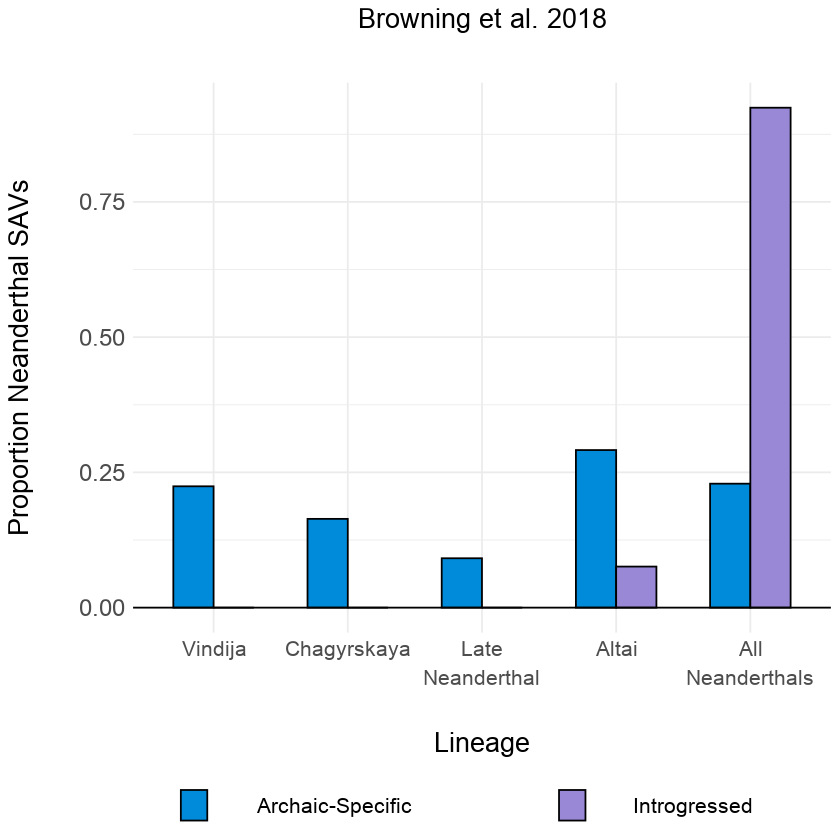

In [209]:
Browning_archaic_specific_introgressed_proportions_2_plot <- ggplot(Browning_archaic_specific_introgressed_proportions_2, aes(x = dist, y = prop, group = obs, fill = obs)) + 
geom_bar(position = 'dodge', stat = 'identity', width = 0.6, color = 'black') +
geom_hline(yintercept = 0, color = 'black') +
xlab('\nLineage') + ylab('Proportion Neanderthal SAVs\n') +
ggtitle('Browning et al. 2018\n') +
scale_fill_manual(labels = c('Archaic-Specific','Introgressed'), values = c(archaic_specific_color,introgressed_color)) +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 20)) +
theme(axis.title = element_text(size = 20), axis.text.x = element_text(size = 16), axis.text.y = element_text(size = 18)) +
theme(legend.title = element_blank(), legend.text = element_text(size = 16), legend.spacing.x = unit(1, 'cm')) +
theme(legend.position = 'bottom')

Browning_archaic_specific_introgressed_proportions_2_plot

Repeat for delta >= 0.5.

In [210]:
obs <- c('Expected','Expected','Expected','Expected','Expected','Observed','Observed','Observed','Observed','Observed')
dist <- c('Altai','Chagyrskaya','Late\nNeanderthal','All\nNeanderthals','Vindija','Altai','Chagyrskaya','Late\nNeanderthal','All\nNeanderthals','Vindija')
prop <- c(0.308108,0.145946,0.054054,0.194595,0.297297,0.095238,0,0,0.904762,0)
Browning_archaic_specific_introgressed_proportions_5 <- data.frame(obs,dist,prop)
Browning_archaic_specific_introgressed_proportions_5$obs <- factor(Browning_archaic_specific_introgressed_proportions_5$obs, levels = c('Expected','Observed'))
Browning_archaic_specific_introgressed_proportions_5$dist <- factor(Browning_archaic_specific_introgressed_proportions_5$dist, levels = c('Vindija','Chagyrskaya','Late\nNeanderthal','Altai','All\nNeanderthals'))

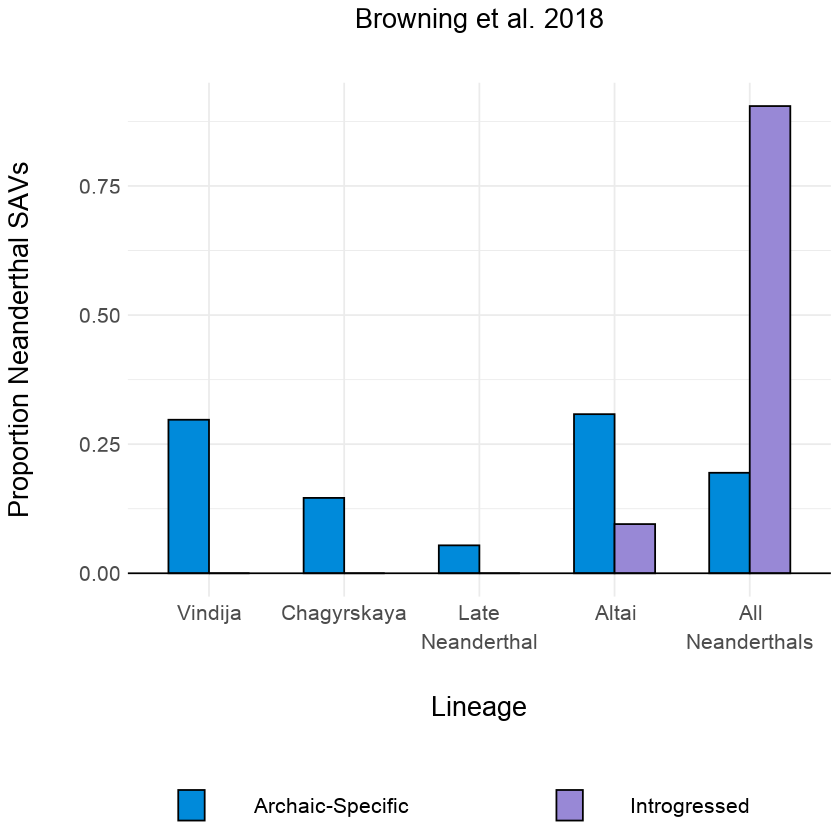

In [211]:
Browning_archaic_specific_introgressed_proportions_5_plot <- ggplot(Browning_archaic_specific_introgressed_proportions_5, aes(x = dist, y = prop, group = obs, fill = obs)) + 
geom_bar(position = 'dodge', stat = 'identity', width = 0.6, color = 'black') +
geom_hline(yintercept = 0, color = 'black') +
xlab('\nLineage\n') + ylab('Proportion Neanderthal SAVs\n') +
ggtitle('Browning et al. 2018\n') +
scale_fill_manual(labels = c('Archaic-Specific','Introgressed'), values = c(archaic_specific_color,introgressed_color)) +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 20)) +
theme(axis.title = element_text(size = 20), axis.text.x = element_text(size = 16), axis.text.y = element_text(size = 16)) +
theme(legend.title = element_blank(), legend.text = element_text(size = 16), legend.spacing.x = unit(1, 'cm')) +
theme(legend.position = 'bottom')

Browning_archaic_specific_introgressed_proportions_5_plot

Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'Arial' not found in PostScript font database”
Warnin

Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'Arial' not found in PostScript font database”


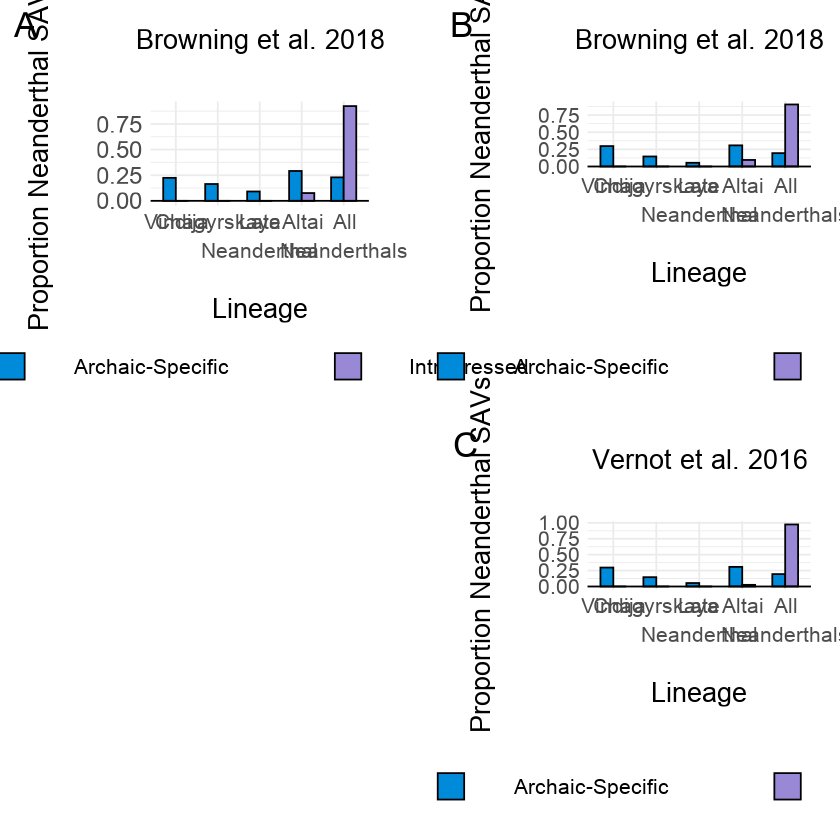

In [212]:
top_row <- plot_grid(Browning_archaic_specific_introgressed_proportions_2_plot, NULL, Browning_archaic_specific_introgressed_proportions_5_plot, labels = c('A','','B'), label_size = 26, rel_widths = c(0.45,0.05,0.45), nrow = 1, scale = 0.9)
bottom_row <- plot_grid(NULL, NULL, Vernot_archaic_specific_introgressed_proportions_5_plot, labels = c('','','C'), label_size = 26, rel_widths = c(0.45,0.05,0.45), nrow = 1, scale = 0.9)
theme_set(theme_cowplot(font_family = 'Arial'))
archaic_specific_introgressed_proportions_plot <- plot_grid(top_row, bottom_row, rel_heights = c(0.5,0.5), ncol = 1)
archaic_specific_introgressed_proportions_plot

In [213]:
pdf('suppl_figs/archaic_specific_introgressed_proportions_plot.pdf', width = 20, height = 18)
archaic_specific_introgressed_proportions_plot
dev.off()

png 
  2

## Allele Frequency vs Max Delta <a class = 'anchor' id = 'allelefrequencymaxdelta'></a>

### Vernot et al. 2016 <a class = 'anchor' id = 'vernotallelefrequencymaxdelta'></a>

In [214]:
present_in_1KG <- subset(data, present_in_1KG == 'yes')
present_in_1KG_2 <- subset(data, present_in_1KG == 'yes' & delta_max >= 0.2)
present_in_1KG_5 <- subset(data, present_in_1KG == 'yes' & delta_max >= 0.5)

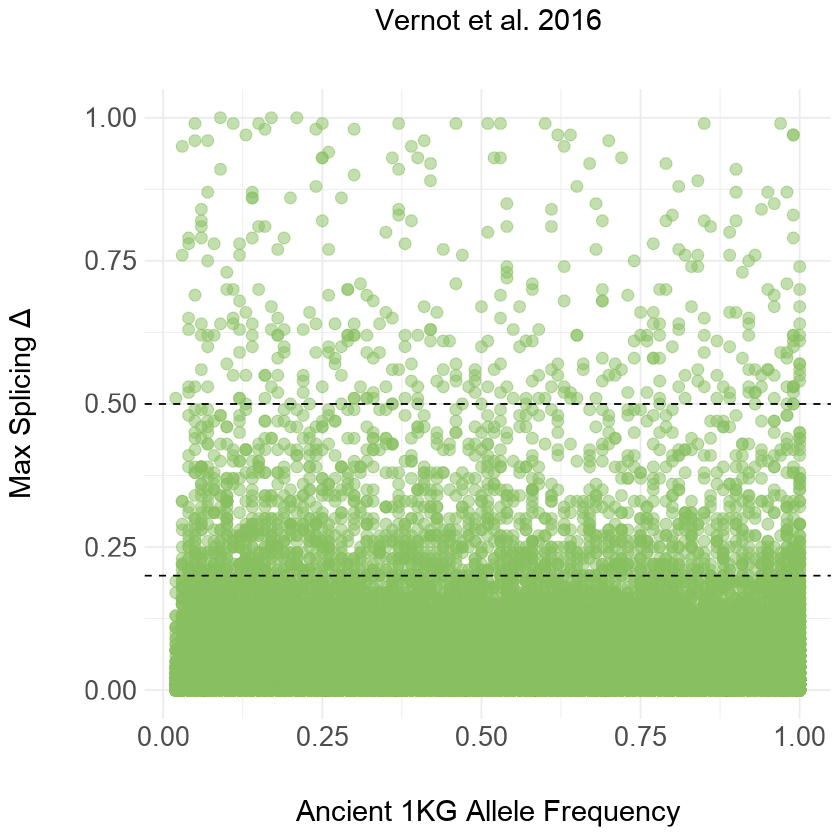

In [215]:
Vernot_AF_DM_ancient <- ggplot(subset(present_in_1KG, Vernot_allele_origin == 'ancient'), aes(x = X1KG_allele_frequency, y = delta_max)) + geom_point(size=3, color=c(ancient_color), alpha=0.5) +
geom_hline(yintercept=0.2, linetype='dashed', color = 'black') +
geom_hline(yintercept=0.5, linetype='dashed', color = 'black') +
xlab('\nAncient 1KG Allele Frequency') + ylab('Max Splicing \u0394\n') + 
ggtitle('Vernot et al. 2016\n') +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 22)) +
theme(axis.title = element_text(size = 22), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20))

Vernot_AF_DM_ancient

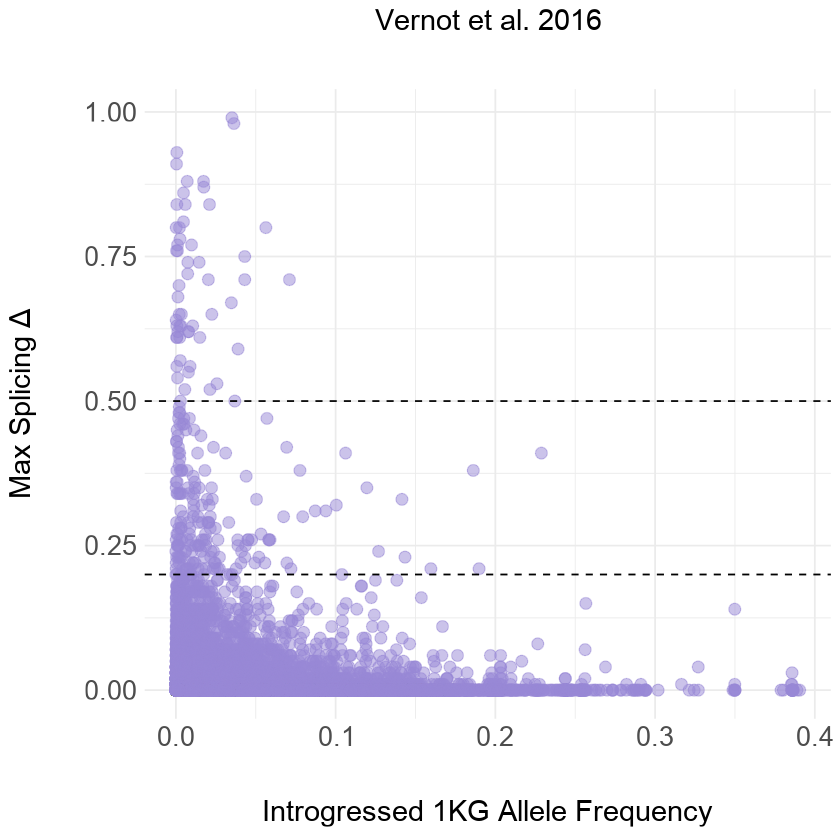

In [216]:
Vernot_AF_DM_introgressed <- ggplot(subset(present_in_1KG, Vernot_allele_origin == 'introgressed'), aes(x = Vernot_introgressed_AF, y = delta_max)) + geom_point(size=3, color=c(introgressed_color), alpha=0.5) +
geom_hline(yintercept=0.2, linetype='dashed', color = 'black') +
geom_hline(yintercept=0.5, linetype='dashed', color = 'black') +
xlab('\nIntrogressed 1KG Allele Frequency') + ylab('Max Splicing \u0394\n') + 
ggtitle('Vernot et al. 2016\n') +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 22)) +
theme(axis.title = element_text(size = 22), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20)) 

Vernot_AF_DM_introgressed

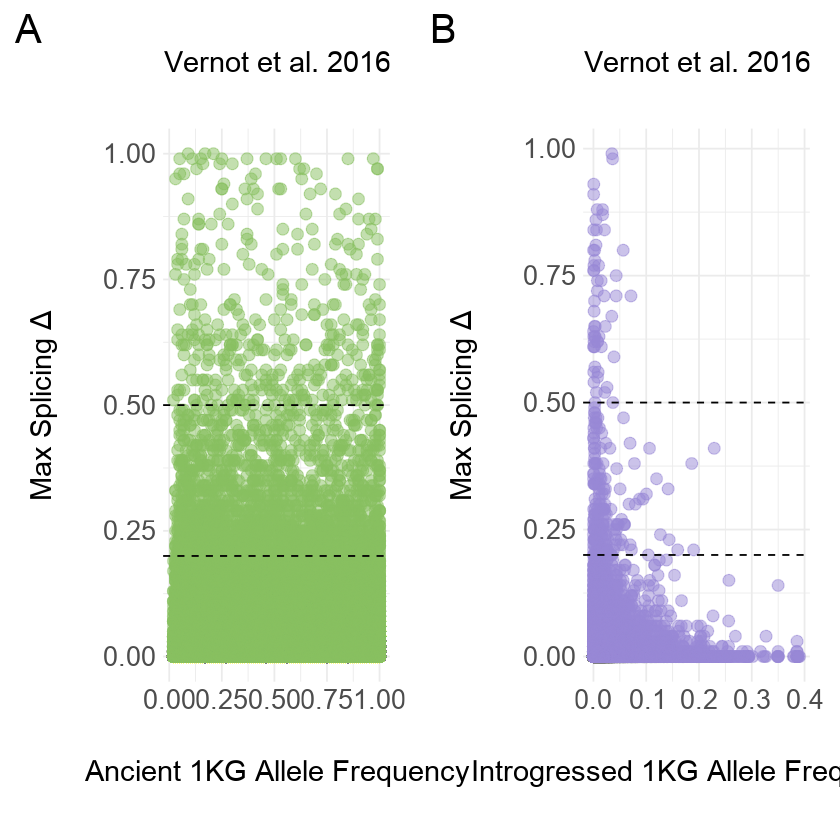

In [217]:
theme_set(theme_cowplot(font_family = 'Arial'))
Vernot_AF_DM <- plot_grid(Vernot_AF_DM_ancient, Vernot_AF_DM_introgressed, labels = c('A','B'), label_size = 30, rel_widths = c(0.5,0.5), nrow = 1, scale = 0.9)

Vernot_AF_DM

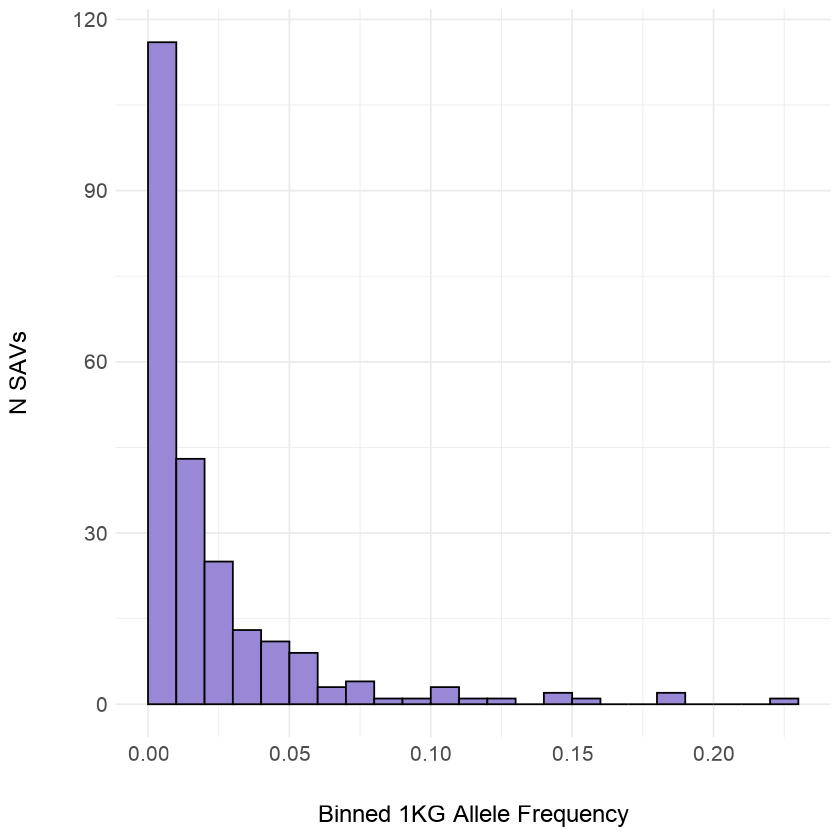

In [218]:
Vernot_AF_DM_2_introgressed <- ggplot(subset(present_in_1KG_2, Vernot_allele_origin == 'introgressed'), aes(x = Vernot_introgressed_AF)) + geom_histogram(binwidth = 0.01, boundary = 0, color = 'black', fill=c(introgressed_color)) +
#stat_bin(binwidth = 0.01, aes(label=..count..), vjust=-0.5, geom = 'text') +
xlab('\nBinned 1KG Allele Frequency') + ylab('N SAVs\n') +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 18), axis.text.x = element_text(size = 16), axis.text.y = element_text(size = 16))

Vernot_AF_DM_2_introgressed

### Browning et al. 2018 <a class = 'anchor' id = 'browningallelefrequencymaxdelta'></a>

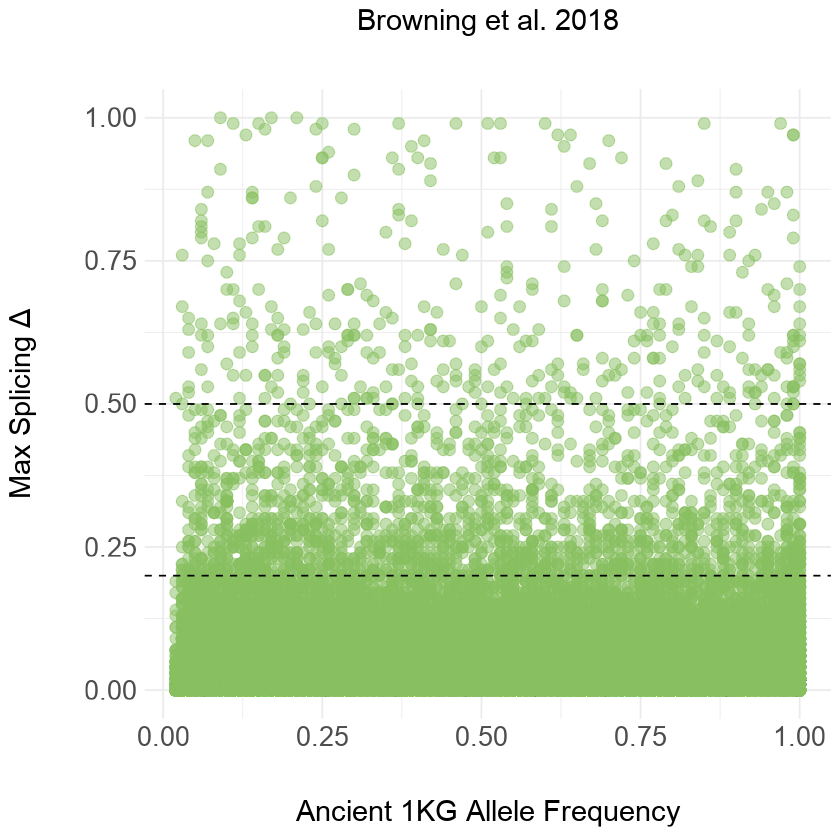

In [219]:
Browning_AF_DM_ancient <- ggplot(subset(present_in_1KG, Browning_allele_origin == 'ancient'), aes(x = X1KG_allele_frequency, y = delta_max)) + geom_point(size=3, color=c(ancient_color), alpha=0.5) +
geom_hline(yintercept=0.2, linetype='dashed', color = 'black') +
geom_hline(yintercept=0.5, linetype='dashed', color = 'black') +
xlab('\nAncient 1KG Allele Frequency') + ylab('Max Splicing \u0394\n') +
ggtitle('Browning et al. 2018\n') +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 22)) +
theme(axis.title = element_text(size = 22), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20))

Browning_AF_DM_ancient

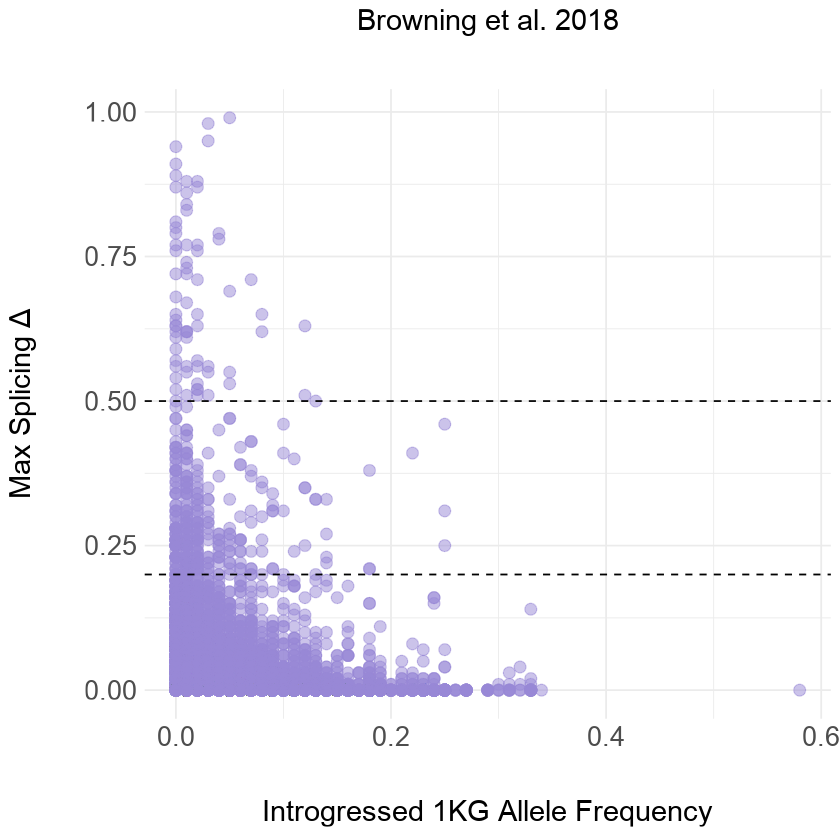

In [220]:
Browning_AF_DM_introgressed <- ggplot(subset(present_in_1KG, Browning_allele_origin == 'introgressed'), aes(x = Browning_introgressed_AF, y = delta_max)) + geom_point(size=3, color=c(introgressed_color), alpha=0.5) +
geom_hline(yintercept=0.2, linetype='dashed', color = 'black') +
geom_hline(yintercept=0.5, linetype='dashed', color = 'black') +
xlab('\nIntrogressed 1KG Allele Frequency') + ylab('Max Splicing \u0394\n') + 
ggtitle('Browning et al. 2018\n') +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 22)) +
theme(axis.title = element_text(size = 22), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20))

Browning_AF_DM_introgressed

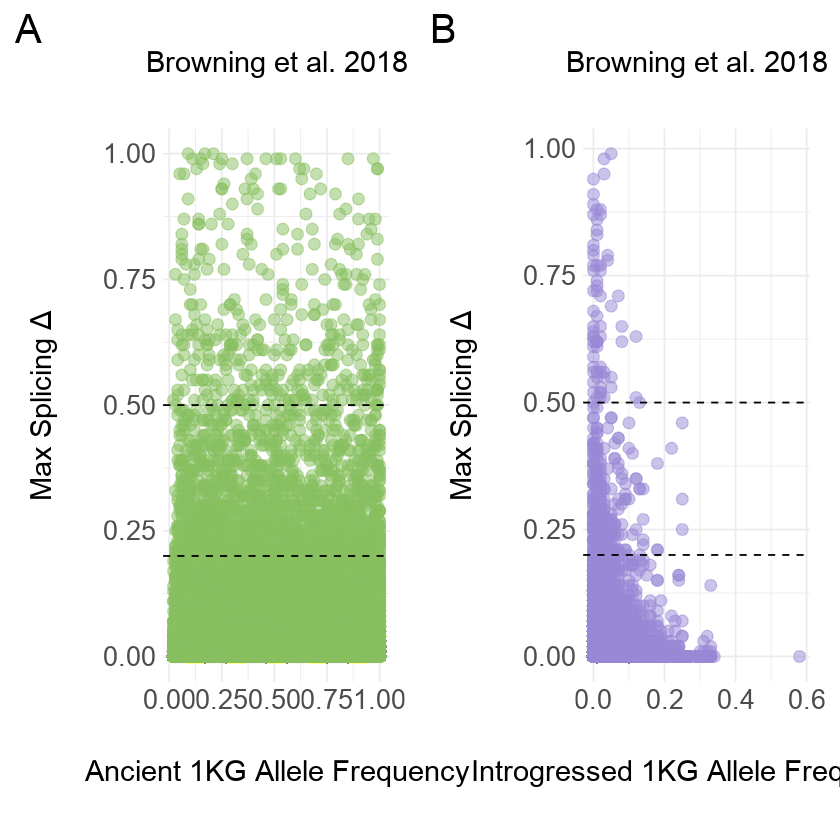

In [221]:
theme_set(theme_cowplot(font_family = 'Arial'))
Browning_AF_DM <- plot_grid(Browning_AF_DM_ancient, Browning_AF_DM_introgressed, labels = c('A','B'), label_size = 30, rel_widths = c(0.5,0.5), nrow = 1, scale = 0.9)

Browning_AF_DM

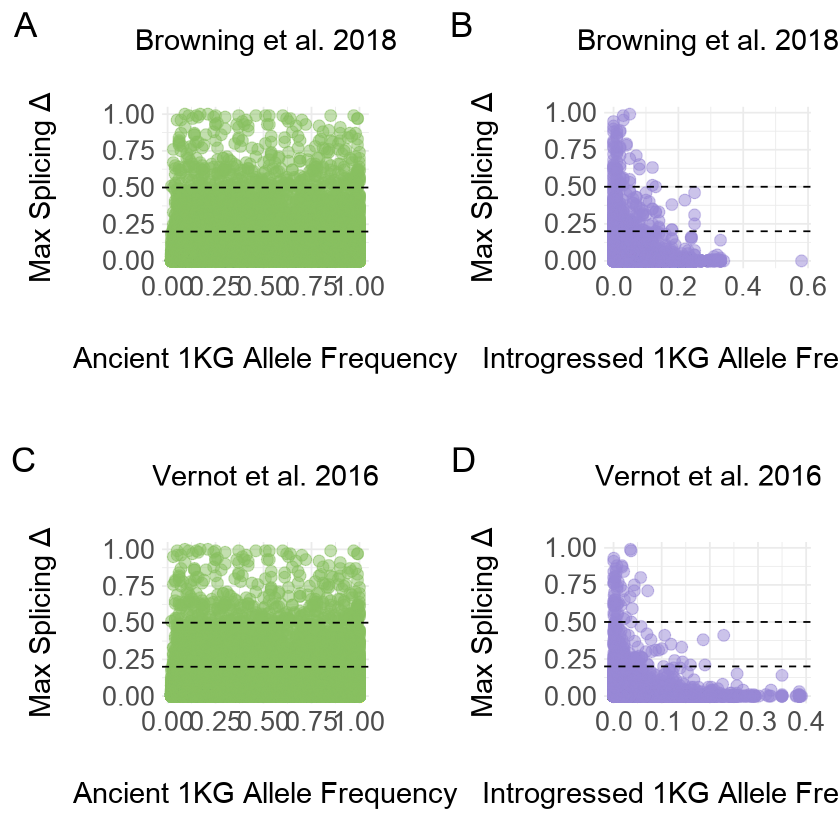

In [222]:
top_row <- plot_grid(Browning_AF_DM_ancient, NULL, Browning_AF_DM_introgressed, labels = c('A','','B'), label_size = 26, rel_widths = c(0.45,0.05,0.45), nrow = 1, scale = 0.9)
middle_row <- plot_grid(NULL, labels = c(''), nrow = 1, scale = 0.9)
bottom_row <- plot_grid(Vernot_AF_DM_ancient, NULL, Vernot_AF_DM_introgressed, labels = c('C','','D'), label_size = 26, rel_widths = c(0.45,0.05,0.45), nrow = 1, scale = 0.9)
theme_set(theme_cowplot(font_family = 'Arial'))
AF_and_deltas_by_allele_origin <- plot_grid(top_row, middle_row, bottom_row, rel_heights = c(0.4,0.03,0.4), ncol = 1)
AF_and_deltas_by_allele_origin

In [223]:
pdf('suppl_figs/AF_and_deltas_by_allele_origin.pdf', width = 20, height = 18)
AF_and_deltas_by_allele_origin
dev.off()

png 
  2

## 1KG Allele Frequencies by Allele Origin <a class = 'anchor' id = '1KGallelefrequencybyalleleorigin'></a>

Start with Vernot. 

In [224]:
Vernot_ancient_frequencies = subset(data_2, Vernot_allele_origin == 'ancient' & present_in_1KG == 'yes')
Vernot_ancient_frequencies <- melt(Vernot_ancient_frequencies, id=c('chrom','pos','ref_allele','alt_allele','ancestral_allele','anc_dev','variant_type','altai_gt','chagyrskaya_gt','denisovan_gt','vindija_gt','altai_gt_boolean','chagyrskaya_gt_boolean','denisovan_gt_boolean','vindija_gt_boolean','distribution','present_in_1KG','X1KG_allele_count','X1KG_allele_number','X1KG_allele_frequency','X1KG_AFR_AF','present_in_gnomAD','gnomAD_allele_count','gnomAD_allele_number','gnomAD_allele_frequency','Vernot_ancestral_allele','Vernot_derived_allele','Vernot_ancestral_derived_code','Vernot_AFA_AF','Vernot_PNG_AF','Vernot_AFR_AF','Vernot_AMR_AF','Vernot_EAS_AF','Vernot_EUR_AF','Vernot_SAS_AF','Vernot_Denisovan_base','Vernot_Neanderthal_base_1','Vernot_Neanderthal_base_2','Vernot_haplotype_tag','Vernot_introgressed','Vernot_introgressed_AF','Browning_introgressed','Browning_ref_alt','Browning_introgressed_AF','annotation','mis_oe','mis_z','lof_oe','lof_z','phyloP','ag_delta','al_delta','dg_delta','dl_delta','delta_max','ag_pos','al_pos','dg_pos','dl_pos','Adipose_Subcutaneous','Adipose_Visceral_Omentum','Adrenal_Gland','Artery_Aorta','Artery_Coronary','Artery_Tibial','Brain_Amygdala','Brain_Anterior_cingulate_cortex_BA24','Brain_Caudate_basal_ganglia','Brain_Cerebellar_Hemisphere','Brain_Cerebellum','Brain_Cortex','Brain_Frontal_Cortex_BA9','Brain_Hippocampus','Brain_Hypothalamus','Brain_Nucleus_accumbens_basal_ganglia','Brain_Putamen_basal_ganglia','Brain_Spinal_cord_cervical_c.1','Brain_Substantia_nigra','Breast_Mammary_Tissue','Cells_Cultured_fibroblasts','Cells_EBV.transformed_lymphocytes','Colon_Sigmoid','Colon_Transverse','Esophagus_Gastroesophageal_Junction','Esophagus_Mucosa','Esophagus_Muscularis','Heart_Atrial_Appendage','Heart_Left_Ventricle','Kidney_Cortex','Liver','Lung','Minor_Salivary_Gland','Muscle_Skeletal','Nerve_Tibial','Ovary','Pancreas','Pituitary','Prostate','Skin_Not_Sun_Exposed_Suprapubic','Skin_Sun_Exposed_Lower_leg','Small_Intestine_Terminal_Ileum','Spleen','Stomach','Testis','Thyroid','Uterus','Vagina','Whole_Blood','N_GTEx_tissues','sQTL','Vernot_allele_origin','Browning_allele_origin'))
Vernot_ancient_frequencies$variable <- factor(Vernot_ancient_frequencies$variable <- factor(Vernot_ancient_frequencies$variable, levels = c('X1KG_AMR_AF','X1KG_EAS_AF','X1KG_EUR_AF','X1KG_SAS_AF','X1KG_non_ASW_AFR_AF')))
Vernot_ancient_frequencies <- Vernot_ancient_frequencies[,c('Vernot_allele_origin','delta_max','variable','value')]
head(Vernot_ancient_frequencies)

,Vernot_allele_origin,delta_max,variable,value
,<chr>,<dbl>,<fct>,<dbl>
1,ancient,0.22,X1KG_EAS_AF,1.00
2,ancient,0.29,X1KG_EAS_AF,1.00
3,ancient,0.22,X1KG_EAS_AF,1.00
4,ancient,0.43,X1KG_EAS_AF,1.00
5,ancient,0.27,X1KG_EAS_AF,0.15
6,ancient,0.52,X1KG_EAS_AF,0.17


In [225]:
nrow(Vernot_ancient_frequencies)/5

[1] 2252

In [226]:
Vernot_introgressed_frequencies = subset(data_2, Vernot_allele_origin == 'introgressed' & present_in_1KG == 'yes')
Vernot_introgressed_frequencies <- melt(Vernot_introgressed_frequencies, id=c('chrom','pos','ref_allele','alt_allele','ancestral_allele','anc_dev','variant_type','altai_gt','chagyrskaya_gt','denisovan_gt','vindija_gt','altai_gt_boolean','chagyrskaya_gt_boolean','denisovan_gt_boolean','vindija_gt_boolean','distribution','present_in_1KG','X1KG_allele_count','X1KG_allele_number','X1KG_allele_frequency','X1KG_AFR_AF','X1KG_AMR_AF','X1KG_EAS_AF','X1KG_EUR_AF','X1KG_SAS_AF','X1KG_non_ASW_AFR_AF','present_in_gnomAD','gnomAD_allele_count','gnomAD_allele_number','gnomAD_allele_frequency','Vernot_ancestral_allele','Vernot_derived_allele','Vernot_ancestral_derived_code','Vernot_AFA_AF','Vernot_PNG_AF','Vernot_Denisovan_base','Vernot_Neanderthal_base_1','Vernot_Neanderthal_base_2','Vernot_haplotype_tag','Vernot_introgressed','Vernot_introgressed_AF','Browning_introgressed','Browning_ref_alt','Browning_introgressed_AF','annotation','mis_oe','mis_z','lof_oe','lof_z','phyloP','ag_delta','al_delta','dg_delta','dl_delta','delta_max','ag_pos','al_pos','dg_pos','dl_pos','Adipose_Subcutaneous','Adipose_Visceral_Omentum','Adrenal_Gland','Artery_Aorta','Artery_Coronary','Artery_Tibial','Brain_Amygdala','Brain_Anterior_cingulate_cortex_BA24','Brain_Caudate_basal_ganglia','Brain_Cerebellar_Hemisphere','Brain_Cerebellum','Brain_Cortex','Brain_Frontal_Cortex_BA9','Brain_Hippocampus','Brain_Hypothalamus','Brain_Nucleus_accumbens_basal_ganglia','Brain_Putamen_basal_ganglia','Brain_Spinal_cord_cervical_c.1','Brain_Substantia_nigra','Breast_Mammary_Tissue','Cells_Cultured_fibroblasts','Cells_EBV.transformed_lymphocytes','Colon_Sigmoid','Colon_Transverse','Esophagus_Gastroesophageal_Junction','Esophagus_Mucosa','Esophagus_Muscularis','Heart_Atrial_Appendage','Heart_Left_Ventricle','Kidney_Cortex','Liver','Lung','Minor_Salivary_Gland','Muscle_Skeletal','Nerve_Tibial','Ovary','Pancreas','Pituitary','Prostate','Skin_Not_Sun_Exposed_Suprapubic','Skin_Sun_Exposed_Lower_leg','Small_Intestine_Terminal_Ileum','Spleen','Stomach','Testis','Thyroid','Uterus','Vagina','Whole_Blood','N_GTEx_tissues','sQTL','Vernot_allele_origin','Browning_allele_origin'))
Vernot_introgressed_frequencies$variable <- factor(Vernot_introgressed_frequencies$variable <- factor(Vernot_introgressed_frequencies$variable, levels = c('Vernot_AFR_AF','Vernot_AMR_AF','Vernot_EAS_AF','Vernot_EUR_AF','Vernot_SAS_AF')))
Vernot_introgressed_frequencies <- Vernot_introgressed_frequencies[,c('Vernot_allele_origin','delta_max','variable','value')]
head(Vernot_introgressed_frequencies)

,Vernot_allele_origin,delta_max,variable,value
,<chr>,<dbl>,<fct>,<dbl>
1,introgressed,0.20,Vernot_AFR_AF,0
2,introgressed,0.28,Vernot_AFR_AF,0
3,introgressed,0.98,Vernot_AFR_AF,0
4,introgressed,0.26,Vernot_AFR_AF,0
5,introgressed,0.36,Vernot_AFR_AF,0
6,introgressed,0.24,Vernot_AFR_AF,0


In [227]:
nrow(Vernot_introgressed_frequencies)/5

[1] 237

In [228]:
Vernot_frequencies = rbind(Vernot_ancient_frequencies, Vernot_introgressed_frequencies)
head(Vernot_frequencies)

,Vernot_allele_origin,delta_max,variable,value
,<chr>,<dbl>,<fct>,<dbl>
1,ancient,0.22,X1KG_EAS_AF,1.00
2,ancient,0.29,X1KG_EAS_AF,1.00
3,ancient,0.22,X1KG_EAS_AF,1.00
4,ancient,0.43,X1KG_EAS_AF,1.00
5,ancient,0.27,X1KG_EAS_AF,0.15
6,ancient,0.52,X1KG_EAS_AF,0.17


Replace some strings.

In [229]:
replacement = c('X1KG_non_ASW_AFR_AF'='AFR','X1KG_AMR_AF'='AMR','X1KG_EAS_AF'='EAS','X1KG_EUR_AF'='EUR','X1KG_SAS_AF'='SAS','Vernot_AFR_AF'='AFR','Vernot_AMR_AF'='AMR','Vernot_EAS_AF'='EAS','Vernot_EUR_AF'='EUR','Vernot_SAS_AF'='SAS')
Vernot_frequencies$variable <- str_replace_all(Vernot_frequencies$variable, replacement)
head(Vernot_frequencies)

,Vernot_allele_origin,delta_max,variable,value
,<chr>,<dbl>,<chr>,<dbl>
1,ancient,0.22,EAS,1.00
2,ancient,0.29,EAS,1.00
3,ancient,0.22,EAS,1.00
4,ancient,0.43,EAS,1.00
5,ancient,0.27,EAS,0.15
6,ancient,0.52,EAS,0.17


Warning message:
“position_dodge requires non-overlapping x intervals”


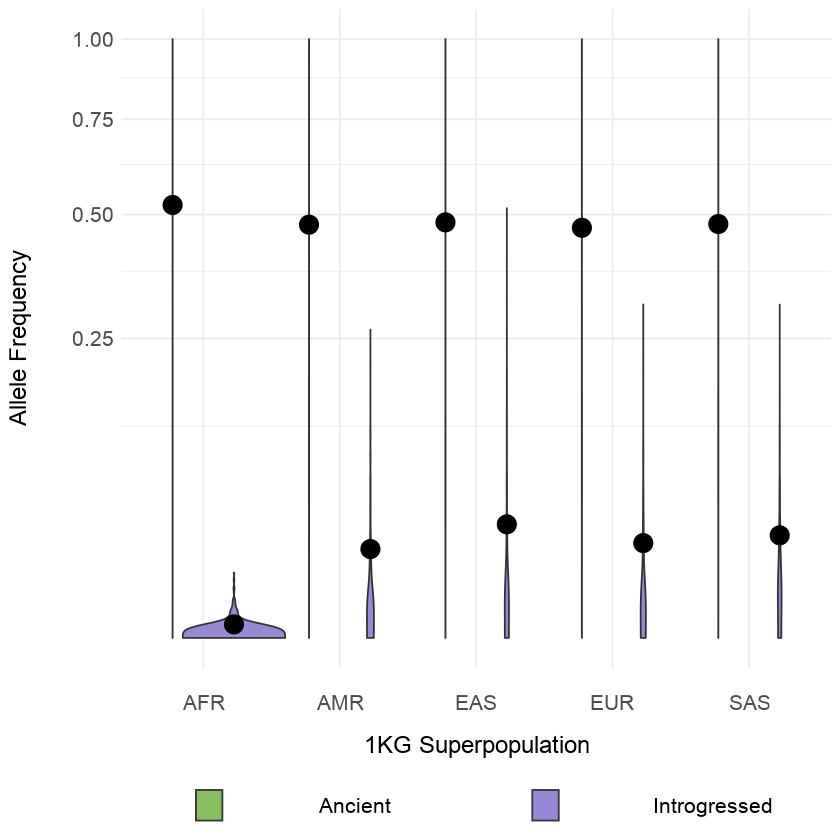

In [230]:
Vernot_SAV_1KG_AF_allele_origin <- ggplot(Vernot_frequencies, aes(x = variable, y = value, fill = Vernot_allele_origin)) + geom_violin(width = 1.5, position = position_dodge(0.9)) +
stat_summary(fun = 'mean', geom = 'point', color = 'black', size = 5, position = position_dodge(0.9)) +
coord_trans(y = 'sqrt') +
xlab('\n1KG Superpopulation') + ylab('Allele Frequency\n') + 
#ggtitle('Vernot et al. 2016\n') +
scale_fill_manual(name = '', labels = c('Ancient', 'Introgressed'), values = c(ancient_color,introgressed_color)) +
theme_minimal() + theme(text = element_text(family = 'Arial')) + theme(legend.position = 'bottom') +
#theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 18)) +
theme(axis.title = element_text(size = 18), axis.text.x = element_text(size = 16, vjust = -1.5), axis.text.y = element_text(size = 16)) +
theme(legend.title=element_text(size = 16), legend.text=element_text(size = 16), legend.spacing.x = unit(2, 'cm')) +
guides(fill = guide_legend(override.aes = list(shape = NA)))

Vernot_SAV_1KG_AF_allele_origin

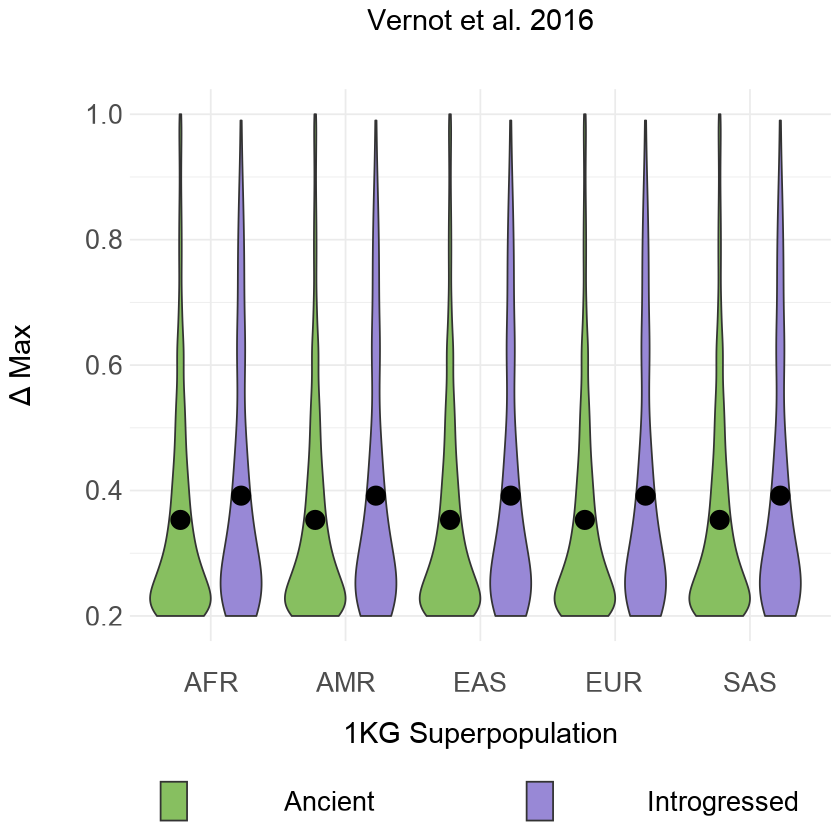

In [231]:
Vernot_SAV_1KG_delta_max_allele_origin <- ggplot(Vernot_frequencies, aes(x = variable, y = delta_max, fill = Vernot_allele_origin)) + geom_violin() +
stat_summary(fun = 'mean', geom = 'point', color = 'black', size = 5, position = position_dodge(0.9)) +
xlab('\n1KG Superpopulation') + ylab('\u0394 Max\n') +
ggtitle('Vernot et al. 2016\n') +
scale_fill_manual(name = '', labels = c('Ancient', 'Introgressed'), values = c(ancient_color,introgressed_color)) +
theme_minimal() + theme(text = element_text(family = 'Arial')) + theme(legend.position = "bottom") +
theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 22)) +
theme(axis.title = element_text(size = 22), axis.text.x = element_text(size=20, vjust=-1.5), axis.text.y = element_text(size = 20)) +
theme(legend.title=element_text(size=20), legend.text=element_text(size=20), legend.spacing.x = unit(2, 'cm')) +
guides(fill = guide_legend(override.aes = list(shape = NA)))

Vernot_SAV_1KG_delta_max_allele_origin

Now do Browning et al. 2018.

In [232]:
Browning_ancient_frequencies = subset(data_2, Browning_allele_origin == 'ancient' & present_in_1KG == 'yes')
Browning_ancient_frequencies <- melt(Browning_ancient_frequencies, id=c('chrom','pos','ref_allele','alt_allele','ancestral_allele','anc_dev','variant_type','altai_gt','chagyrskaya_gt','denisovan_gt','vindija_gt','altai_gt_boolean','chagyrskaya_gt_boolean','denisovan_gt_boolean','vindija_gt_boolean','distribution','present_in_1KG','X1KG_allele_count','X1KG_allele_number','X1KG_allele_frequency','X1KG_AFR_AF','present_in_gnomAD','gnomAD_allele_count','gnomAD_allele_number','gnomAD_allele_frequency','Vernot_ancestral_allele','Vernot_derived_allele','Vernot_ancestral_derived_code','Vernot_AFA_AF','Vernot_PNG_AF','Vernot_AFR_AF','Vernot_AMR_AF','Vernot_EAS_AF','Vernot_EUR_AF','Vernot_SAS_AF','Vernot_Denisovan_base','Vernot_Neanderthal_base_1','Vernot_Neanderthal_base_2','Vernot_haplotype_tag','Vernot_introgressed','Vernot_introgressed_AF','Browning_introgressed','Browning_ref_alt','Browning_introgressed_AF','annotation','mis_oe','mis_z','lof_oe','lof_z','phyloP','ag_delta','al_delta','dg_delta','dl_delta','delta_max','ag_pos','al_pos','dg_pos','dl_pos','Adipose_Subcutaneous','Adipose_Visceral_Omentum','Adrenal_Gland','Artery_Aorta','Artery_Coronary','Artery_Tibial','Brain_Amygdala','Brain_Anterior_cingulate_cortex_BA24','Brain_Caudate_basal_ganglia','Brain_Cerebellar_Hemisphere','Brain_Cerebellum','Brain_Cortex','Brain_Frontal_Cortex_BA9','Brain_Hippocampus','Brain_Hypothalamus','Brain_Nucleus_accumbens_basal_ganglia','Brain_Putamen_basal_ganglia','Brain_Spinal_cord_cervical_c.1','Brain_Substantia_nigra','Breast_Mammary_Tissue','Cells_Cultured_fibroblasts','Cells_EBV.transformed_lymphocytes','Colon_Sigmoid','Colon_Transverse','Esophagus_Gastroesophageal_Junction','Esophagus_Mucosa','Esophagus_Muscularis','Heart_Atrial_Appendage','Heart_Left_Ventricle','Kidney_Cortex','Liver','Lung','Minor_Salivary_Gland','Muscle_Skeletal','Nerve_Tibial','Ovary','Pancreas','Pituitary','Prostate','Skin_Not_Sun_Exposed_Suprapubic','Skin_Sun_Exposed_Lower_leg','Small_Intestine_Terminal_Ileum','Spleen','Stomach','Testis','Thyroid','Uterus','Vagina','Whole_Blood','N_GTEx_tissues','sQTL','Vernot_allele_origin','Browning_allele_origin'))
Browning_ancient_frequencies$variable <- factor(Browning_ancient_frequencies$variable <- factor(Browning_ancient_frequencies$variable, levels = c('X1KG_AMR_AF','X1KG_EAS_AF','X1KG_EUR_AF','X1KG_SAS_AF','X1KG_non_ASW_AFR_AF')))
Browning_ancient_frequencies <- Browning_ancient_frequencies[,c('Browning_allele_origin','delta_max','variable','value')]
head(Browning_ancient_frequencies)

,Browning_allele_origin,delta_max,variable,value
,<chr>,<dbl>,<fct>,<dbl>
1,ancient,0.22,X1KG_EAS_AF,1.00
2,ancient,0.29,X1KG_EAS_AF,1.00
3,ancient,0.22,X1KG_EAS_AF,1.00
4,ancient,0.43,X1KG_EAS_AF,1.00
5,ancient,0.27,X1KG_EAS_AF,0.15
6,ancient,0.52,X1KG_EAS_AF,0.17


In [233]:
nrow(Browning_ancient_frequencies)/5

[1] 2195

In [234]:
Browning_introgressed_frequencies_0 = subset(data_2, Browning_allele_origin == 'introgressed' & present_in_1KG == 'yes')
Browning_introgressed_frequencies_0 = subset(Browning_introgressed_frequencies_0, Browning_ref_alt == 0)
Browning_introgressed_frequencies_0 <- melt(Browning_introgressed_frequencies_0, id=c('chrom','pos','ref_allele','alt_allele','ancestral_allele','anc_dev','variant_type','altai_gt','chagyrskaya_gt','denisovan_gt','vindija_gt','altai_gt_boolean','chagyrskaya_gt_boolean','denisovan_gt_boolean','vindija_gt_boolean','distribution','present_in_1KG','X1KG_allele_count','X1KG_allele_number','X1KG_allele_frequency','X1KG_AFR_AF','present_in_gnomAD','gnomAD_allele_count','gnomAD_allele_number','gnomAD_allele_frequency','Vernot_ancestral_allele','Vernot_derived_allele','Vernot_ancestral_derived_code','Vernot_AFA_AF','Vernot_PNG_AF','Vernot_AFR_AF','Vernot_AMR_AF','Vernot_EAS_AF','Vernot_EUR_AF','Vernot_SAS_AF','Vernot_Denisovan_base','Vernot_Neanderthal_base_1','Vernot_Neanderthal_base_2','Vernot_haplotype_tag','Vernot_introgressed','Vernot_introgressed_AF','Browning_introgressed','Browning_ref_alt','Browning_introgressed_AF','annotation','mis_oe','mis_z','lof_oe','lof_z','phyloP','ag_delta','al_delta','dg_delta','dl_delta','delta_max','ag_pos','al_pos','dg_pos','dl_pos','Adipose_Subcutaneous','Adipose_Visceral_Omentum','Adrenal_Gland','Artery_Aorta','Artery_Coronary','Artery_Tibial','Brain_Amygdala','Brain_Anterior_cingulate_cortex_BA24','Brain_Caudate_basal_ganglia','Brain_Cerebellar_Hemisphere','Brain_Cerebellum','Brain_Cortex','Brain_Frontal_Cortex_BA9','Brain_Hippocampus','Brain_Hypothalamus','Brain_Nucleus_accumbens_basal_ganglia','Brain_Putamen_basal_ganglia','Brain_Spinal_cord_cervical_c.1','Brain_Substantia_nigra','Breast_Mammary_Tissue','Cells_Cultured_fibroblasts','Cells_EBV.transformed_lymphocytes','Colon_Sigmoid','Colon_Transverse','Esophagus_Gastroesophageal_Junction','Esophagus_Mucosa','Esophagus_Muscularis','Heart_Atrial_Appendage','Heart_Left_Ventricle','Kidney_Cortex','Liver','Lung','Minor_Salivary_Gland','Muscle_Skeletal','Nerve_Tibial','Ovary','Pancreas','Pituitary','Prostate','Skin_Not_Sun_Exposed_Suprapubic','Skin_Sun_Exposed_Lower_leg','Small_Intestine_Terminal_Ileum','Spleen','Stomach','Testis','Thyroid','Uterus','Vagina','Whole_Blood','N_GTEx_tissues','sQTL','Vernot_allele_origin','Browning_allele_origin'))
Browning_introgressed_frequencies_0$variable <- factor(Browning_introgressed_frequencies_0$variable <- factor(Browning_introgressed_frequencies_0$variable, levels = c('X1KG_AMR_AF','X1KG_EAS_AF','X1KG_EUR_AF','X1KG_SAS_AF','X1KG_non_ASW_AFR_AF')))
Browning_introgressed_frequencies_0 <- Browning_introgressed_frequencies_0[,c('Browning_allele_origin','delta_max','variable','value')]
Browning_introgressed_frequencies_0$value = 1 - Browning_introgressed_frequencies_0$value
head(Browning_introgressed_frequencies_0)

,Browning_allele_origin,delta_max,variable,value
,<chr>,<dbl>,<fct>,<dbl>
1,introgressed,0.65,X1KG_EAS_AF,0.00
2,introgressed,0.71,X1KG_EAS_AF,0.10
3,introgressed,0.65,X1KG_EUR_AF,0.17
4,introgressed,0.71,X1KG_EUR_AF,0.14
5,introgressed,0.65,X1KG_AMR_AF,0.25
6,introgressed,0.71,X1KG_AMR_AF,0.07


In [235]:
nrow(Browning_introgressed_frequencies_0)/5

[1] 2

In [236]:
Browning_introgressed_frequencies_1 = subset(data_2, Browning_allele_origin == 'introgressed' & present_in_1KG == 'yes')
Browning_introgressed_frequencies_1 = subset(Browning_introgressed_frequencies_1, Browning_ref_alt == 1)
Browning_introgressed_frequencies_1 <- melt(Browning_introgressed_frequencies_1, id=c('chrom','pos','ref_allele','alt_allele','ancestral_allele','anc_dev','variant_type','altai_gt','chagyrskaya_gt','denisovan_gt','vindija_gt','altai_gt_boolean','chagyrskaya_gt_boolean','denisovan_gt_boolean','vindija_gt_boolean','distribution','present_in_1KG','X1KG_allele_count','X1KG_allele_number','X1KG_allele_frequency','X1KG_AFR_AF','present_in_gnomAD','gnomAD_allele_count','gnomAD_allele_number','gnomAD_allele_frequency','Vernot_ancestral_allele','Vernot_derived_allele','Vernot_ancestral_derived_code','Vernot_AFA_AF','Vernot_PNG_AF','Vernot_AFR_AF','Vernot_AMR_AF','Vernot_EAS_AF','Vernot_EUR_AF','Vernot_SAS_AF','Vernot_Denisovan_base','Vernot_Neanderthal_base_1','Vernot_Neanderthal_base_2','Vernot_haplotype_tag','Vernot_introgressed','Vernot_introgressed_AF','Browning_introgressed','Browning_ref_alt','Browning_introgressed_AF','annotation','mis_oe','mis_z','lof_oe','lof_z','phyloP','ag_delta','al_delta','dg_delta','dl_delta','delta_max','ag_pos','al_pos','dg_pos','dl_pos','Adipose_Subcutaneous','Adipose_Visceral_Omentum','Adrenal_Gland','Artery_Aorta','Artery_Coronary','Artery_Tibial','Brain_Amygdala','Brain_Anterior_cingulate_cortex_BA24','Brain_Caudate_basal_ganglia','Brain_Cerebellar_Hemisphere','Brain_Cerebellum','Brain_Cortex','Brain_Frontal_Cortex_BA9','Brain_Hippocampus','Brain_Hypothalamus','Brain_Nucleus_accumbens_basal_ganglia','Brain_Putamen_basal_ganglia','Brain_Spinal_cord_cervical_c.1','Brain_Substantia_nigra','Breast_Mammary_Tissue','Cells_Cultured_fibroblasts','Cells_EBV.transformed_lymphocytes','Colon_Sigmoid','Colon_Transverse','Esophagus_Gastroesophageal_Junction','Esophagus_Mucosa','Esophagus_Muscularis','Heart_Atrial_Appendage','Heart_Left_Ventricle','Kidney_Cortex','Liver','Lung','Minor_Salivary_Gland','Muscle_Skeletal','Nerve_Tibial','Ovary','Pancreas','Pituitary','Prostate','Skin_Not_Sun_Exposed_Suprapubic','Skin_Sun_Exposed_Lower_leg','Small_Intestine_Terminal_Ileum','Spleen','Stomach','Testis','Thyroid','Uterus','Vagina','Whole_Blood','N_GTEx_tissues','sQTL','Vernot_allele_origin','Browning_allele_origin'))
Browning_introgressed_frequencies_1$variable <- factor(Browning_introgressed_frequencies_1$variable <- factor(Browning_introgressed_frequencies_1$variable, levels = c('X1KG_AMR_AF','X1KG_EAS_AF','X1KG_EUR_AF','X1KG_SAS_AF','X1KG_non_ASW_AFR_AF')))
Browning_introgressed_frequencies_1 <- Browning_introgressed_frequencies_1[,c('Browning_allele_origin','delta_max','variable','value')]
head(Browning_introgressed_frequencies_1)

,Browning_allele_origin,delta_max,variable,value
,<chr>,<dbl>,<fct>,<dbl>
1,introgressed,0.36,X1KG_EAS_AF,0.05
2,introgressed,0.20,X1KG_EAS_AF,0.00
3,introgressed,0.28,X1KG_EAS_AF,0.04
4,introgressed,0.29,X1KG_EAS_AF,0.05
5,introgressed,0.98,X1KG_EAS_AF,0.00
6,introgressed,0.26,X1KG_EAS_AF,0.00


In [237]:
nrow(Browning_introgressed_frequencies_1)/5

[1] 375

In [238]:
Browning_frequencies = rbind(Browning_ancient_frequencies, Browning_introgressed_frequencies_0, Browning_introgressed_frequencies_1)
head(Browning_frequencies)

,Browning_allele_origin,delta_max,variable,value
,<chr>,<dbl>,<fct>,<dbl>
1,ancient,0.22,X1KG_EAS_AF,1.00
2,ancient,0.29,X1KG_EAS_AF,1.00
3,ancient,0.22,X1KG_EAS_AF,1.00
4,ancient,0.43,X1KG_EAS_AF,1.00
5,ancient,0.27,X1KG_EAS_AF,0.15
6,ancient,0.52,X1KG_EAS_AF,0.17


Replace some strings.

In [239]:
replacement = c('X1KG_non_ASW_AFR_AF'='AFR','X1KG_AMR_AF'='AMR','X1KG_EAS_AF'='EAS','X1KG_EUR_AF'='EUR','X1KG_SAS_AF'='SAS','Vernot_AFR_AF'='AFR','Vernot_AMR_AF'='AMR','Vernot_EAS_AF'='EAS','Vernot_EUR_AF'='EUR','Vernot_SAS_AF'='SAS')
Browning_frequencies$variable <- str_replace_all(Browning_frequencies$variable, replacement)
head(Browning_frequencies)

,Browning_allele_origin,delta_max,variable,value
,<chr>,<dbl>,<chr>,<dbl>
1,ancient,0.22,EAS,1.00
2,ancient,0.29,EAS,1.00
3,ancient,0.22,EAS,1.00
4,ancient,0.43,EAS,1.00
5,ancient,0.27,EAS,0.15
6,ancient,0.52,EAS,0.17


Warning message:
“position_dodge requires non-overlapping x intervals”


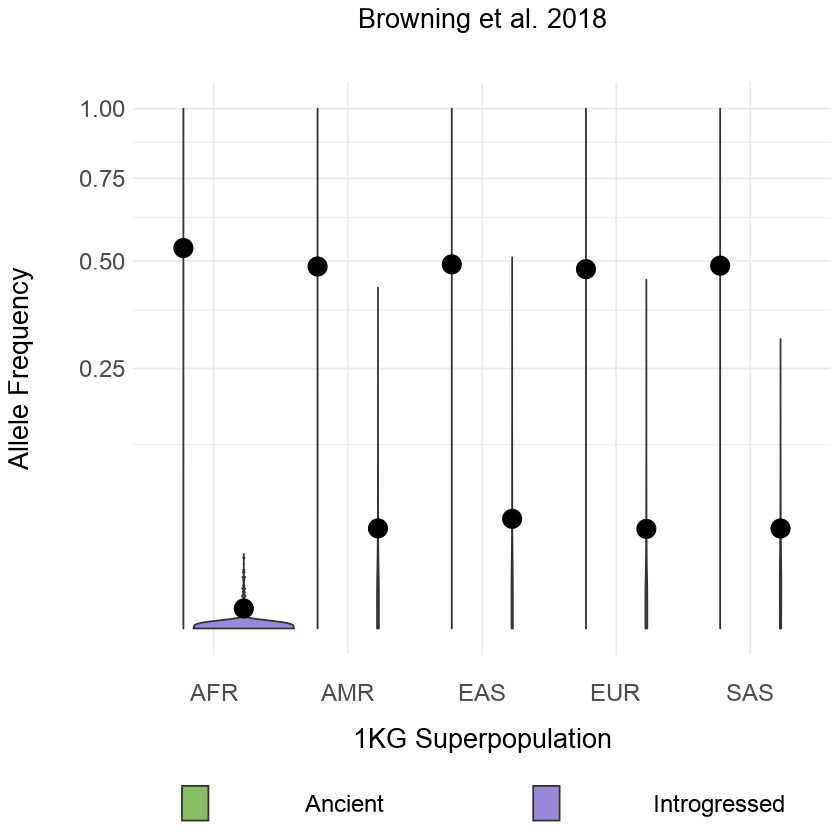

In [240]:
Browning_SAV_1KG_AF_allele_origin <- ggplot(Browning_frequencies, aes(x = variable, y = value, fill = Browning_allele_origin)) + geom_violin(width=1.5, position = position_dodge(0.9)) +
stat_summary(fun = 'mean', geom = 'point', color = 'black', size = 5, position = position_dodge(0.9)) +
coord_trans(y = 'sqrt') +
xlab('\n1KG Superpopulation') + ylab('Allele Frequency\n') +
ggtitle('Browning et al. 2018\n') +
scale_fill_manual(name = '', labels = c('Ancient', 'Introgressed'), values = c(ancient_color,introgressed_color)) +
theme_minimal() + theme(text = element_text(family = 'Arial')) + theme(legend.position = "bottom") +
theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 20)) +
theme(axis.title = element_text(size = 20), axis.text.x = element_text(size=18, vjust=-1.5), axis.text.y = element_text(size = 18)) +
theme(legend.title=element_text(size=18), legend.text=element_text(size=18), legend.spacing.x = unit(2, 'cm')) +
guides(fill = guide_legend(override.aes = list(shape = NA)))

Browning_SAV_1KG_AF_allele_origin

In [241]:
pdf('suppl_figs/Browning_SAV_1KG_AF_allele_origin.pdf', width = 15, height = 8)
Browning_SAV_1KG_AF_allele_origin
dev.off()

Warning message:
“position_dodge requires non-overlapping x intervals”


png 
  2

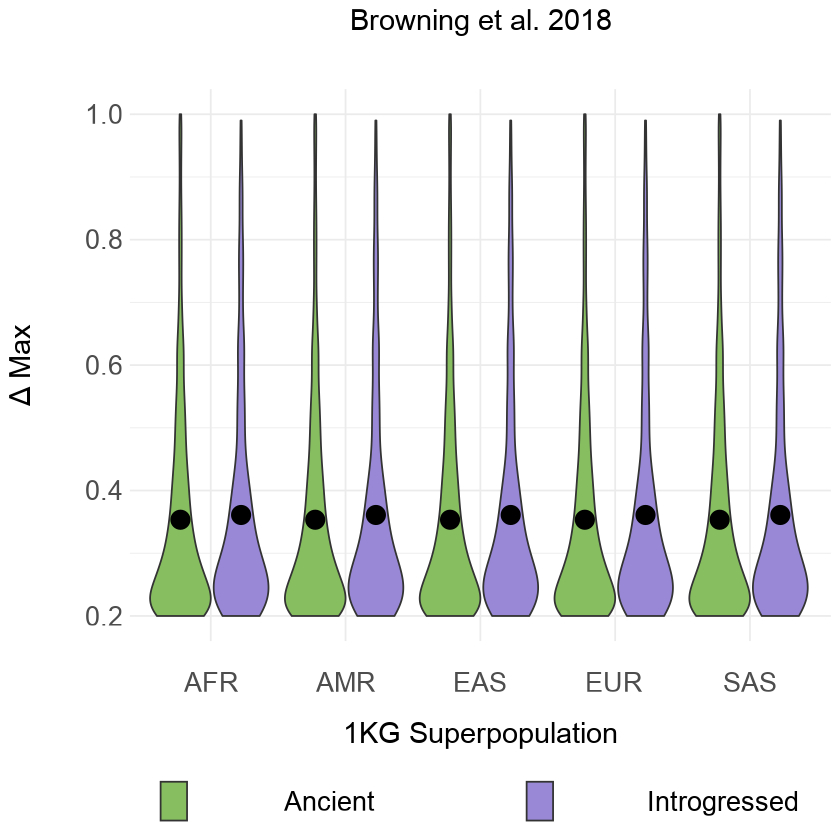

In [242]:
Browning_SAV_1KG_delta_max_allele_origin <- ggplot(Browning_frequencies, aes(x = variable, y = delta_max, fill = Browning_allele_origin)) + geom_violin() +
stat_summary(fun = 'mean', geom = 'point', color = 'black', size = 5, position = position_dodge(0.9)) +
xlab('\n1KG Superpopulation') + ylab('\u0394 Max\n') +
ggtitle('Browning et al. 2018\n') +
scale_fill_manual(name = '', labels = c('Ancient', 'Introgressed'), values = c(ancient_color,introgressed_color)) +
theme_minimal() + theme(text = element_text(family = 'Arial')) + theme(legend.position = "bottom") +
theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 22)) +
theme(axis.title = element_text(size = 22), axis.text.x = element_text(size=20, vjust=-1.5), axis.text.y = element_text(size = 20)) +
theme(legend.title=element_text(size=20), legend.text=element_text(size=20), legend.spacing.x = unit(2, 'cm')) +
guides(fill = guide_legend(override.aes = list(shape = NA)))

Browning_SAV_1KG_delta_max_allele_origin

Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'Arial' not found in PostScript font database”
Warnin

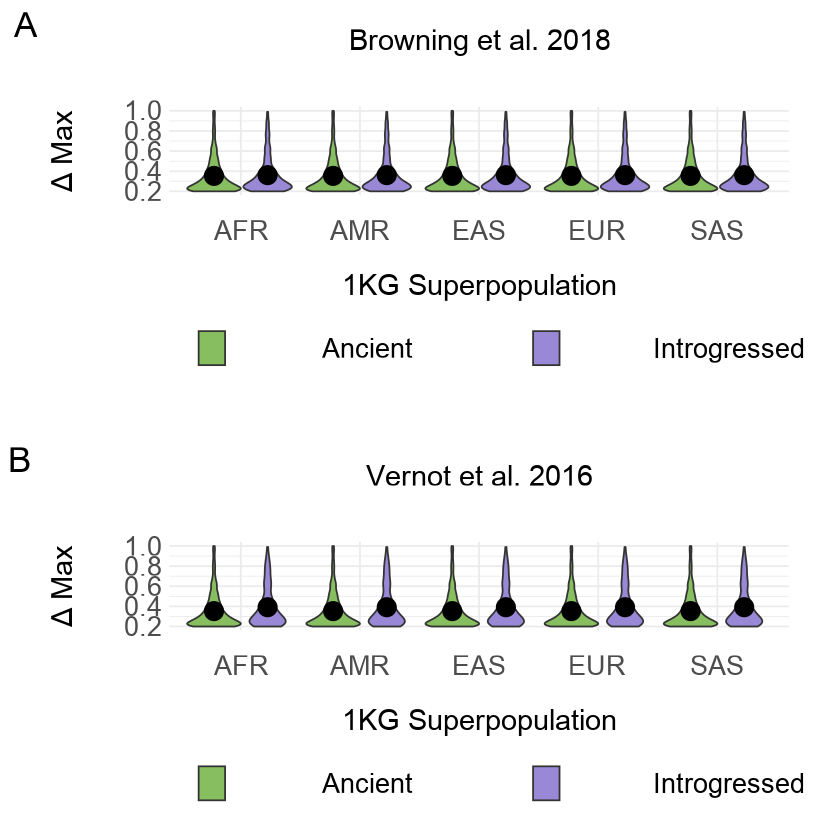

In [243]:
top_row <- plot_grid(Browning_SAV_1KG_delta_max_allele_origin, labels = c('A'), label_size = 26, nrow = 1, scale = 0.9)
middle_row <- plot_grid(NULL, labels = c(''), nrow = 1, scale = 0.9)
bottom_row <- plot_grid(Vernot_SAV_1KG_delta_max_allele_origin, labels = c('B'), label_size = 26, nrow = 1, scale = 0.9)
theme_set(theme_cowplot(font_family = 'Arial'))
SAV_1KG_delta_max_allele_origin <- plot_grid(top_row, middle_row, bottom_row, rel_heights = c(0.4,0.03,0.4), ncol = 1)
SAV_1KG_delta_max_allele_origin

In [244]:
pdf('suppl_figs/SAV_1KG_delta_max_allele_origin.pdf', width = 20, height = 18)
SAV_1KG_delta_max_allele_origin
dev.off()

png 
  2

## 1KG Upset <a class = 'anchor' id = '1KGupset'></a>

### Vernot et al. 2016 <a class = 'anchor' id = 'vernotupset'></a> 

Let's compare the distribution of ancient vs introgressed SAVs in 1KG superpopulations. Start by subsetting the data. We'll use the Vernot et al. 1KG frequencies for the introgressed data.

In [245]:
Vernot_present_in_1KG_ancient <- subset(data_2, Vernot_allele_origin == 'ancient' & present_in_1KG == 'yes')
Vernot_present_in_1KG_ancient <- subset(Vernot_present_in_1KG_ancient, select = c('X1KG_EAS_AF','X1KG_EUR_AF','X1KG_non_ASW_AFR_AF','X1KG_AMR_AF','X1KG_SAS_AF'))

Vernot_present_in_1KG_introgressed <- subset(data_2, Vernot_allele_origin == 'introgressed' & present_in_1KG == 'yes')
Vernot_present_in_1KG_introgressed <- subset(Vernot_present_in_1KG_introgressed, select = c('Vernot_EAS_AF','Vernot_EUR_AF','Vernot_AFR_AF','Vernot_AMR_AF','Vernot_SAS_AF'))

Rename columns. 

In [246]:
colnames(Vernot_present_in_1KG_ancient) <- c('EAS','EUR','AFR','AMR','SAS')
colnames(Vernot_present_in_1KG_introgressed) <- c('EAS','EUR','AFR','AMR','SAS')

Now we need to define our sharing criteria. Let's go with anything greater than 0% as 'True'. This will create some rows where all five populations are 'False'. Remove these.

In [247]:
Vernot_present_in_1KG_ancient$EAS <- cut(Vernot_present_in_1KG_ancient$EAS, breaks=c(-Inf, 0.00, Inf), labels=c('False','True'))
Vernot_present_in_1KG_ancient$EUR <- cut(Vernot_present_in_1KG_ancient$EUR, breaks=c(-Inf, 0.00, Inf), labels=c('False','True'))
Vernot_present_in_1KG_ancient$AFR <- cut(Vernot_present_in_1KG_ancient$AFR, breaks=c(-Inf, 0.00, Inf), labels=c('False','True'))
Vernot_present_in_1KG_ancient$AMR <- cut(Vernot_present_in_1KG_ancient$AMR, breaks=c(-Inf, 0.00, Inf), labels=c('False','True'))
Vernot_present_in_1KG_ancient$SAS <- cut(Vernot_present_in_1KG_ancient$SAS, breaks=c(-Inf, 0.00, Inf), labels=c('False','True'))

In [248]:
head(Vernot_present_in_1KG_ancient)

,EAS,EUR,AFR,AMR,SAS
,<fct>,<fct>,<fct>,<fct>,<fct>
25,True,True,True,True,True
131,True,True,True,True,True
211,True,True,True,True,True
219,True,True,True,True,True
331,True,True,True,True,True
410,True,True,True,True,True


In [249]:
Vernot_present_in_1KG_ancient <- Vernot_present_in_1KG_ancient[!(Vernot_present_in_1KG_ancient$EAS == 'False' & Vernot_present_in_1KG_ancient$EUR == 'False' & Vernot_present_in_1KG_ancient$AFR == 'False' & Vernot_present_in_1KG_ancient$AMR == 'False' & Vernot_present_in_1KG_ancient$SAS == 'False'),]

In [250]:
Vernot_present_in_1KG_introgressed$EAS <- cut(Vernot_present_in_1KG_introgressed$EAS, breaks=c(-Inf, 0.00, 1.00), labels=c('False','True'))
Vernot_present_in_1KG_introgressed$EUR <- cut(Vernot_present_in_1KG_introgressed$EUR, breaks=c(-Inf, 0.00, 1.00), labels=c('False','True'))
Vernot_present_in_1KG_introgressed$AFR <- cut(Vernot_present_in_1KG_introgressed$AFR, breaks=c(-Inf, 0.00, 1.00), labels=c('False','True'))
Vernot_present_in_1KG_introgressed$AMR <- cut(Vernot_present_in_1KG_introgressed$AMR, breaks=c(-Inf, 0.00, 1.00), labels=c('False','True'))
Vernot_present_in_1KG_introgressed$SAS <- cut(Vernot_present_in_1KG_introgressed$SAS, breaks=c(-Inf, 0.00, 1.00), labels=c('False','True'))

In [251]:
Vernot_present_in_1KG_introgressed <- Vernot_present_in_1KG_introgressed[!(Vernot_present_in_1KG_introgressed$EAS == 'False' & Vernot_present_in_1KG_introgressed$EUR == 'False' & Vernot_present_in_1KG_introgressed$AFR == 'False' & Vernot_present_in_1KG_introgressed$AMR == 'False' & Vernot_present_in_1KG_introgressed$SAS == 'False'),]

Reorder some columns to better reflect human evolutionary history.

In [252]:
Vernot_present_in_1KG_ancient <- Vernot_present_in_1KG_ancient[, c(4, 5, 1, 2, 3)]
Vernot_present_in_1KG_introgressed <- Vernot_present_in_1KG_introgressed[, c(4, 5, 1, 2, 3)]

And plot!

Warning message in upset_data(data, intersect, mode = mode, encode_sets = encode_sets, :
“Converting non-logical columns to binary: AMR, SAS, EAS, EUR, AFR”


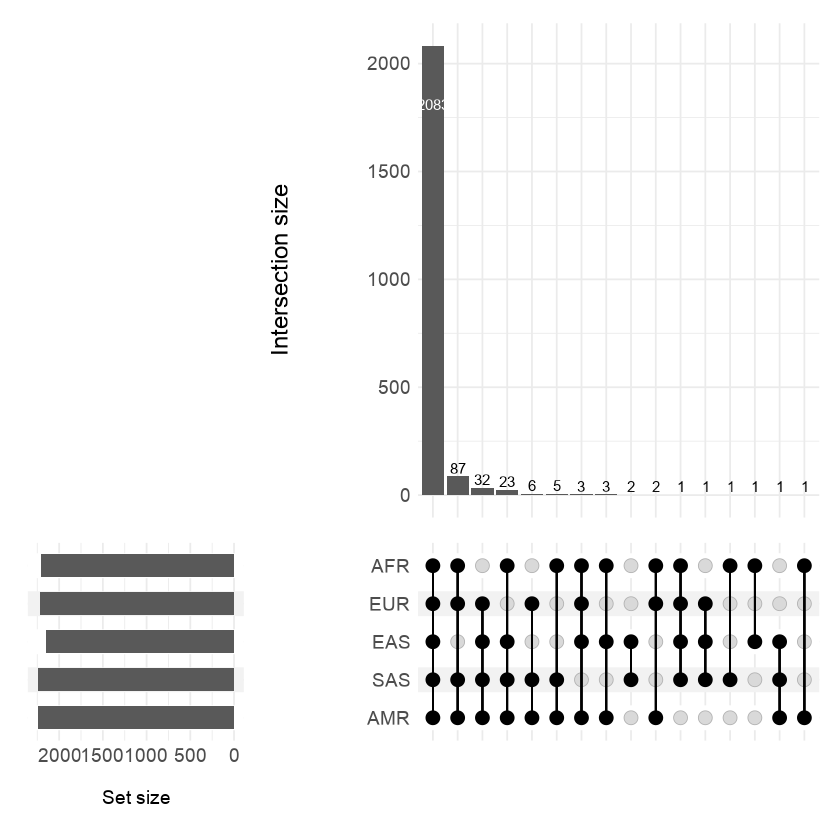

In [253]:
Vernot_present_in_1KG_ancient_plot <- upset(data = Vernot_present_in_1KG_ancient, intersect = colnames(Vernot_present_in_1KG_ancient), sort_sets = FALSE,
      name = '',
      min_size = 0,
      height_ratio = 0.4,
      width_ratio = 0.35,                            
      base_annotations=list('Intersection size' = intersection_size(text = list(family = 'Arial', size = 4)) + ylab('Intersection size\n')),
      themes = upset_modify_themes(list('Intersection size' = theme(text = element_text(family = 'Arial', size = 18)),  
                                      'intersections_matrix' = theme(text = element_text(family = 'Arial', size = 18)),
                                      'overall_sizes' = theme(text = element_text(family = 'Arial', size = 14), axis.text.x = element_text(family = 'Arial', size = 14)))))

Vernot_present_in_1KG_ancient_plot

In [254]:
pdf('suppl_figs/Vernot_present_in_1KG_ancient_upset_plot.pdf', width = 15, height = 8)
Vernot_present_in_1KG_ancient_plot
dev.off()

png 
  2

Now let's do a subset for the figure. 

Warning message in upset_data(data, intersect, mode = mode, encode_sets = encode_sets, :
“Converting non-logical columns to binary: AMR, SAS, EAS, EUR, AFR”


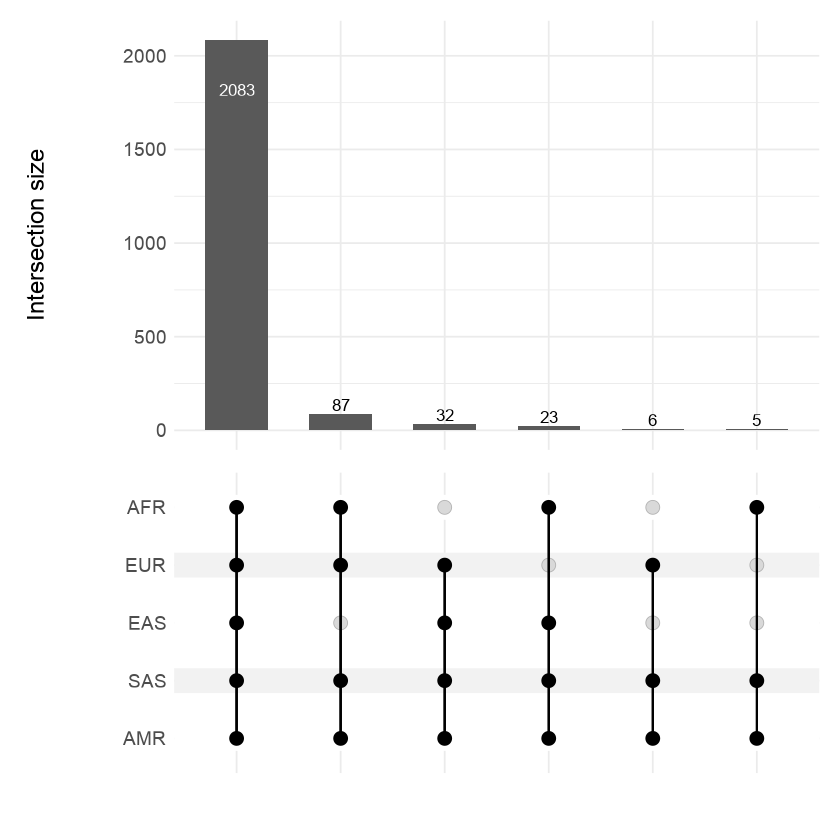

In [255]:
Vernot_present_in_1KG_ancient_plot_subset <- upset(data = Vernot_present_in_1KG_ancient, intersect = colnames(Vernot_present_in_1KG_ancient), sort_sets = FALSE,
      name = '', 
      min_size = 0,
      height_ratio = 0.7,
      width_ratio = 0.4,
      set_sizes = FALSE,
      intersections=list(
        c('AFR','AMR','EAS','EUR','SAS'), c('AFR','AMR','EUR','SAS'), c('AMR','EAS','EUR','SAS'),
        c('AFR','AMR','EAS','SAS'), c('AMR','EUR','SAS'), c('AFR','AMR','SAS')),                               
      base_annotations=list('Intersection size' = intersection_size(text = list(family = 'Arial', size = 4.5), width=0.6) + ylab('Intersection size\n')),
      themes = upset_modify_themes(list('Intersection size' = theme(text = element_text(family = 'Arial', size = 18)),  
                                      'intersections_matrix' = theme(text = element_text(family = 'Arial', size = 18)),
                                      'overall_sizes' = theme(text = element_text(family = 'Arial', size = 16), axis.text.x = element_text(family = 'Arial', size = 16)))))

Vernot_present_in_1KG_ancient_plot_subset

Warning message in upset_data(data, intersect, mode = mode, encode_sets = encode_sets, :
“Converting non-logical columns to binary: AMR, SAS, EAS, EUR, AFR”


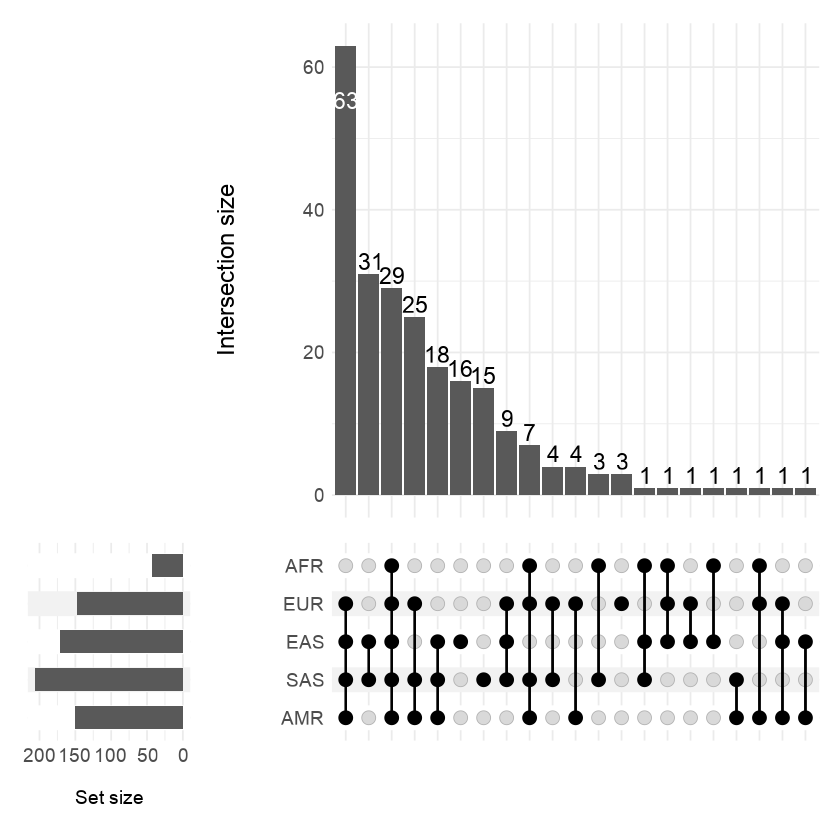

In [256]:
Vernot_present_in_1KG_introgressed_plot <- upset(data = Vernot_present_in_1KG_introgressed, intersect = colnames(Vernot_present_in_1KG_introgressed), sort_sets = FALSE,
      name = '',
      min_size = 0,
      height_ratio = 0.4,
      width_ratio = 0.25,                                 
      base_annotations=list('Intersection size' = intersection_size(text = list(family = 'Arial', size = 6))),
      themes = upset_modify_themes(list('Intersection size' = theme(text = element_text(family = 'Arial', size = 18)),  
                                      'intersections_matrix' = theme(text = element_text(family = 'Arial', size = 18)),
                                      'overall_sizes' = theme(text = element_text(family = 'Arial', size = 14), axis.text.x = element_text(family = 'Arial', size = 14)))))

Vernot_present_in_1KG_introgressed_plot

In [257]:
pdf('suppl_figs/Vernot_present_in_1KG_introgressed_upset_plot.pdf', width = 15, height = 8)
Vernot_present_in_1KG_introgressed_plot
dev.off()

png 
  2

Warning message in upset_data(data, intersect, mode = mode, encode_sets = encode_sets, :
“Converting non-logical columns to binary: AMR, SAS, EAS, EUR, AFR”


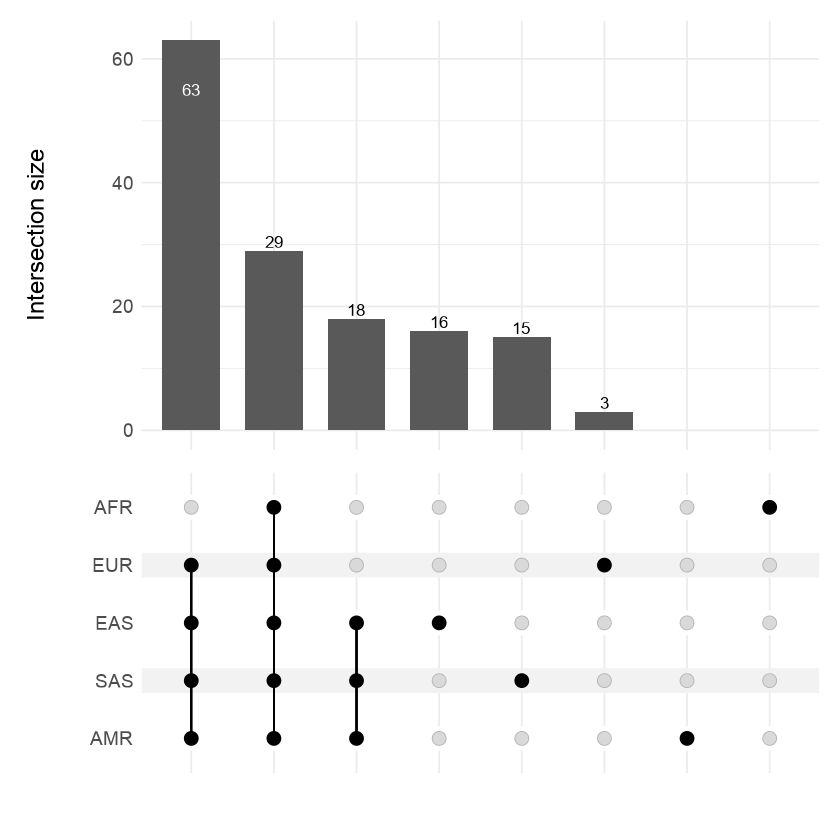

In [258]:
Vernot_present_in_1KG_introgressed_plot_subset <- upset(data = Vernot_present_in_1KG_introgressed, intersect = colnames(Vernot_present_in_1KG_introgressed), sort_sets = FALSE,
      name = '', 
      min_size = 0,
      height_ratio = 0.7,
      width_ratio = 0.25,
      set_sizes = FALSE,
      intersections=list(
        'AFR','AMR','EAS','EUR','SAS', c('AMR','EAS','SAS'),
        c('AMR','EAS','EUR','SAS'), c('AFR','AMR','EAS','EUR','SAS')),                                   
      base_annotations=list('Intersection size' = intersection_size(text = list(family = 'Arial', size = 4.5), width=0.7)),
      themes = upset_modify_themes(list('Intersection size' = theme(text = element_text(family = 'Arial', size = 18)),  
                                      'intersections_matrix' = theme(text = element_text(family = 'Arial', size = 18)),
                                      'overall_sizes' = theme(text = element_text(family = 'Arial', size = 16), axis.text.x = element_text(family = 'Arial', size = 16)))))

Vernot_present_in_1KG_introgressed_plot_subset 

### Browning et al. 2018 <a class = 'anchor' id = 'browningupset'></a>

Let's compare the distribution of ancient vs introgressed SA variants in 1KG superpopulations. Note we need to get 1 minus the alelle frequency for variants where the introgressed allele is the reference.

In [259]:
Browning_present_in_1KG_ancient <- subset(data_2, Browning_allele_origin == 'ancient' & present_in_1KG == 'yes')
Browning_present_in_1KG_ancient <- subset(Browning_present_in_1KG_ancient, select = c('X1KG_EAS_AF','X1KG_EUR_AF','X1KG_non_ASW_AFR_AF','X1KG_AMR_AF','X1KG_SAS_AF'))

Browning_present_in_1KG_introgressed_0 <- subset(data_2, Browning_allele_origin == 'introgressed' & present_in_1KG == 'yes')
Browning_present_in_1KG_introgressed_0 <- subset(Browning_present_in_1KG_introgressed_0, Browning_ref_alt == 0)
Browning_present_in_1KG_introgressed_0 <- subset(Browning_present_in_1KG_introgressed_0, select = c('X1KG_EAS_AF','X1KG_EUR_AF','X1KG_non_ASW_AFR_AF','X1KG_AMR_AF','X1KG_SAS_AF'))
Browning_present_in_1KG_introgressed_0$'X1KG_EAS_AF' = 1 - Browning_present_in_1KG_introgressed_0$'X1KG_EAS_AF'
Browning_present_in_1KG_introgressed_0$'X1KG_EUR_AF' = 1 - Browning_present_in_1KG_introgressed_0$'X1KG_EUR_AF'
Browning_present_in_1KG_introgressed_0$'X1KG_non_ASW_AFR_AF' = 1 - Browning_present_in_1KG_introgressed_0$'X1KG_non_ASW_AFR_AF'
Browning_present_in_1KG_introgressed_0$'X1KG_AMR_AF' = 1 - Browning_present_in_1KG_introgressed_0$'X1KG_AMR_AF'
Browning_present_in_1KG_introgressed_0$'X1KG_SAS_AF' = 1 - Browning_present_in_1KG_introgressed_0$'X1KG_SAS_AF'

Browning_present_in_1KG_introgressed_1 <- subset(data_2, Browning_allele_origin == 'introgressed' & present_in_1KG == 'yes')
Browning_present_in_1KG_introgressed_1 <- subset(Browning_present_in_1KG_introgressed_1, Browning_ref_alt == 1)
Browning_present_in_1KG_introgressed_1 <- subset(Browning_present_in_1KG_introgressed_1, select = c('X1KG_EAS_AF','X1KG_EUR_AF','X1KG_non_ASW_AFR_AF','X1KG_AMR_AF','X1KG_SAS_AF'))

Zip the introgressed back together.

In [260]:
Browning_present_in_1KG_introgressed = rbind(Browning_present_in_1KG_introgressed_0, Browning_present_in_1KG_introgressed_1)

Rename columns. 

In [261]:
colnames(Browning_present_in_1KG_ancient) <- c('EAS','EUR','AFR','AMR','SAS')
colnames(Browning_present_in_1KG_introgressed) <- c('EAS','EUR','AFR','AMR','SAS')

Now we need to define our sharing criteria. Let's go with anything greater than 0% as 'True'. This will create some rows where all five populations are 'False'. Remove these.

In [262]:
Browning_present_in_1KG_ancient$EAS <- cut(Browning_present_in_1KG_ancient$EAS, breaks=c(-Inf, 0.00, Inf), labels=c('False','True'))
Browning_present_in_1KG_ancient$EUR <- cut(Browning_present_in_1KG_ancient$EUR, breaks=c(-Inf, 0.00, Inf), labels=c('False','True'))
Browning_present_in_1KG_ancient$AFR <- cut(Browning_present_in_1KG_ancient$AFR, breaks=c(-Inf, 0.00, Inf), labels=c('False','True'))
Browning_present_in_1KG_ancient$AMR <- cut(Browning_present_in_1KG_ancient$AMR, breaks=c(-Inf, 0.00, Inf), labels=c('False','True'))
Browning_present_in_1KG_ancient$SAS <- cut(Browning_present_in_1KG_ancient$SAS, breaks=c(-Inf, 0.00, Inf), labels=c('False','True'))

In [263]:
head(Browning_present_in_1KG_ancient)

,EAS,EUR,AFR,AMR,SAS
,<fct>,<fct>,<fct>,<fct>,<fct>
25,True,True,True,True,True
131,True,True,True,True,True
211,True,True,True,True,True
219,True,True,True,True,True
331,True,True,True,True,True
410,True,True,True,True,True


In [264]:
Browning_present_in_1KG_ancient <- Browning_present_in_1KG_ancient[!(Browning_present_in_1KG_ancient$EAS == 'False' & Browning_present_in_1KG_ancient$EUR == 'False' & Browning_present_in_1KG_ancient$AFR == 'False' & Browning_present_in_1KG_ancient$AMR == 'False' & Browning_present_in_1KG_ancient$SAS == 'False'),]

In [265]:
Browning_present_in_1KG_introgressed$EAS <- cut(Browning_present_in_1KG_introgressed$EAS, breaks=c(-Inf, 0.00, 1.00), labels=c('False','True'))
Browning_present_in_1KG_introgressed$EUR <- cut(Browning_present_in_1KG_introgressed$EUR, breaks=c(-Inf, 0.00, 1.00), labels=c('False','True'))
Browning_present_in_1KG_introgressed$AFR <- cut(Browning_present_in_1KG_introgressed$AFR, breaks=c(-Inf, 0.00, 1.00), labels=c('False','True'))
Browning_present_in_1KG_introgressed$AMR <- cut(Browning_present_in_1KG_introgressed$AMR, breaks=c(-Inf, 0.00, 1.00), labels=c('False','True'))
Browning_present_in_1KG_introgressed$SAS <- cut(Browning_present_in_1KG_introgressed$SAS, breaks=c(-Inf, 0.00, 1.00), labels=c('False','True'))

In [266]:
head(Browning_present_in_1KG_introgressed)

,EAS,EUR,AFR,AMR,SAS
,<fct>,<fct>,<fct>,<fct>,<fct>
235108,False,True,True,True,True
735815,True,True,True,True,True
10929,True,False,True,False,True
14505,False,True,True,True,True
17108,True,True,False,True,True
17140,True,True,False,True,True


In [267]:
nrow(Browning_present_in_1KG_introgressed)

[1] 377

In [268]:
Browning_present_in_1KG_introgressed <- Browning_present_in_1KG_introgressed[!(Browning_present_in_1KG_introgressed$EAS == 'False' & Browning_present_in_1KG_introgressed$EUR == 'False' & Browning_present_in_1KG_introgressed$AFR == 'False' & Browning_present_in_1KG_introgressed$AMR == 'False' & Browning_present_in_1KG_introgressed$SAS == 'False'),]

In [269]:
nrow(Browning_present_in_1KG_introgressed)

[1] 349

Reorder some columns to better reflect human evolutionary history.

In [270]:
Browning_present_in_1KG_ancient <- Browning_present_in_1KG_ancient[, c(4, 5, 1, 2, 3)]
Browning_present_in_1KG_introgressed <- Browning_present_in_1KG_introgressed[, c(4, 5, 1, 2, 3)]

And plot!

Warning message in upset_data(data, intersect, mode = mode, encode_sets = encode_sets, :
“Converting non-logical columns to binary: AMR, SAS, EAS, EUR, AFR”


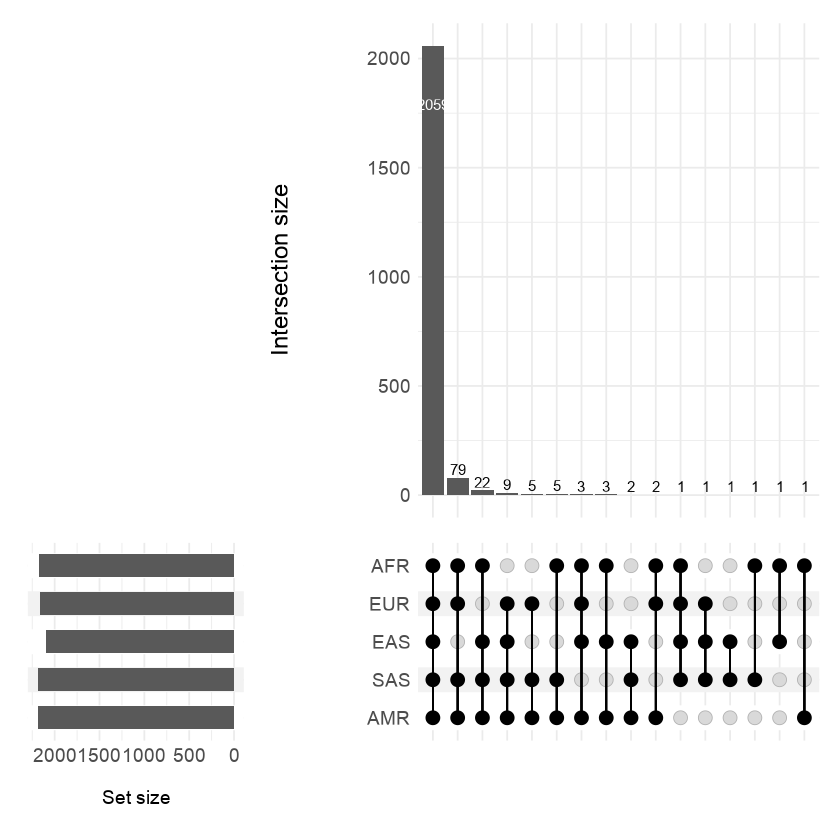

In [271]:
Browning_present_in_1KG_ancient_plot <- upset(data = Browning_present_in_1KG_ancient, intersect = colnames(Browning_present_in_1KG_ancient), sort_sets = FALSE,
      name = '',
      min_size = 0,
      height_ratio = 0.4,
      width_ratio = 0.35,                            
      base_annotations=list('Intersection size' = intersection_size(text = list(family = 'Arial', size = 4)) + ylab('Intersection size\n')),
      themes = upset_modify_themes(list('Intersection size' = theme(text = element_text(family = 'Arial', size = 18)),  
                                      'intersections_matrix' = theme(text = element_text(family = 'Arial', size = 18)),
                                      'overall_sizes' = theme(text = element_text(family = 'Arial', size = 14), axis.text.x = element_text(family = 'Arial', size = 14)))))

Browning_present_in_1KG_ancient_plot

In [272]:
pdf('suppl_figs/Browning_present_in_1KG_ancient_upset_plot.pdf', width = 15, height = 8)
Browning_present_in_1KG_ancient_plot
dev.off()

png 
  2

Warning message in upset_data(data, intersect, mode = mode, encode_sets = encode_sets, :
“Converting non-logical columns to binary: AMR, SAS, EAS, EUR, AFR”


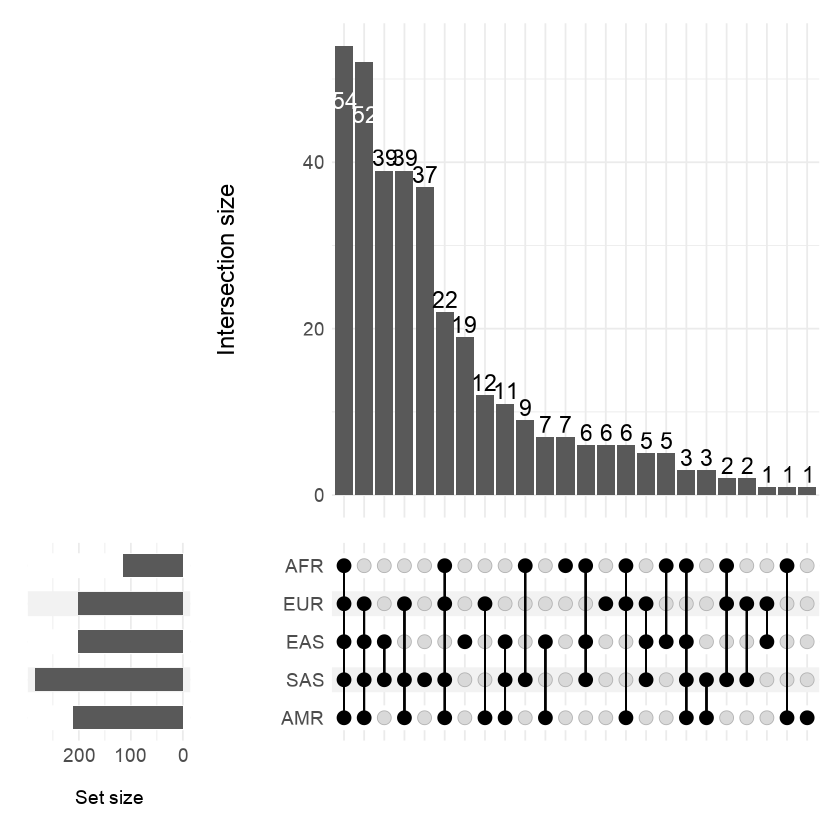

In [273]:
Browning_present_in_1KG_introgressed_plot <- upset(data = Browning_present_in_1KG_introgressed, intersect = colnames(Browning_present_in_1KG_introgressed), sort_sets = FALSE,
      name = '',
      min_size = 0,
      height_ratio = 0.4,
      width_ratio = 0.25,                                 
      base_annotations=list('Intersection size' = intersection_size(text = list(family = 'Arial', size = 6))),
      themes = upset_modify_themes(list('Intersection size' = theme(text = element_text(family = 'Arial', size = 18)),  
                                      'intersections_matrix' = theme(text = element_text(family = 'Arial', size = 18)),
                                      'overall_sizes' = theme(text = element_text(family = 'Arial', size = 14), axis.text.x = element_text(family = 'Arial', size = 14)))))

Browning_present_in_1KG_introgressed_plot

In [274]:
pdf('suppl_figs/Browning_present_in_1KG_introgressed_plot.pdf', width = 15, height = 8)
Browning_present_in_1KG_introgressed_plot
dev.off()

png 
  2

## SAVs in Moderns Figure <a class = 'anchor' id = 'SAVsinmodernsfigure'></a>

Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'Arial' not found in PostScript font database”
Warnin

Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'Arial' not found in PostScript font database”
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
“font family 'Arial' not found in PostScript font database”
Warnin

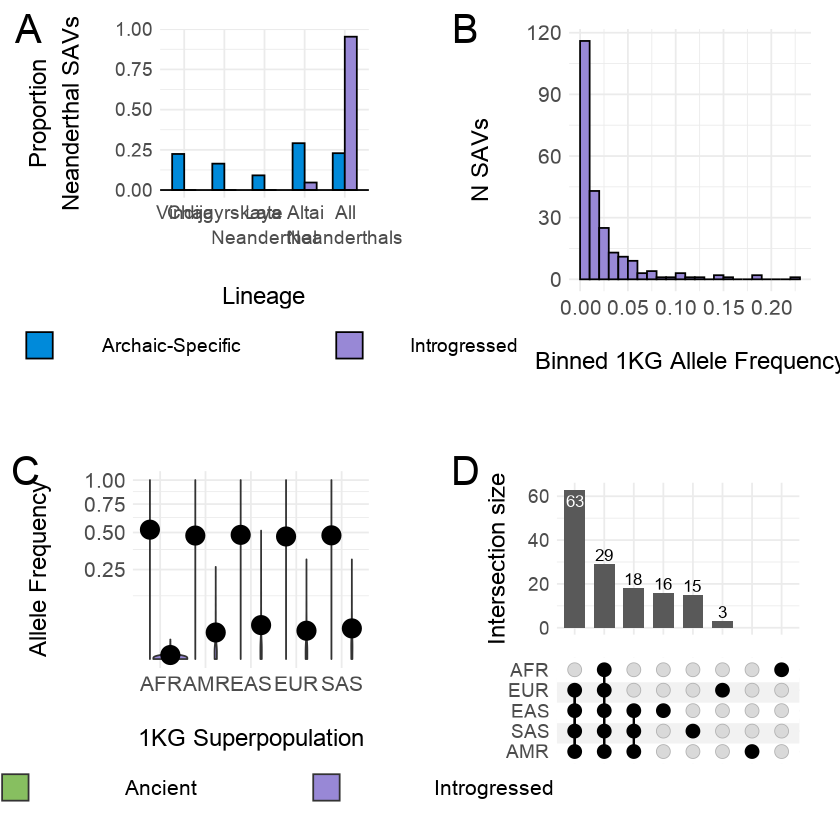

In [275]:
top_row <- plot_grid(Vernot_archaic_specific_introgressed_proportions_2_plot, NULL, Vernot_AF_DM_2_introgressed, labels = c('A','','B'), label_size = 30, rel_widths = c(0.45,0.05,0.45), nrow = 1, scale = 0.9)
empty_row <- plot_grid(NULL, nrow = 1, scale = 0.9)
bottom_row <- plot_grid(Vernot_SAV_1KG_AF_allele_origin, NULL, Vernot_present_in_1KG_introgressed_plot_subset, labels = c('C','','D'), label_size = 30, rel_widths = c(0.45,0.05,0.45), nrow = 1, scale = 0.9)
SAVs_in_moderns <- plot_grid(top_row, empty_row, bottom_row, rel_heights = c(0.45,0.05,0.45), ncol = 1)
SAVs_in_moderns

In [276]:
pdf('SAVs_in_moderns.pdf', width = 18, height = 15)
theme_set(theme_cowplot(font_family = 'Arial'))
plot_grid(SAVs_in_moderns)
dev.off()

png 
  2

# Gene Expression <a class = 'anchor' id = 'geneexpression'></a>

## sQTLs <a class = 'anchor' id = 'sQTLs'></a>

In [277]:
sQTLs <- read.csv('../data/dataframes/sQTLs.txt', header = TRUE, sep = '\t')
head(sQTLs)

,chrom,pos,ref_allele,alt_allele,ancestral_allele,anc_dev,variant_type,altai_gt,chagyrskaya_gt,denisovan_gt,vindija_gt,altai_gt_boolean,chagyrskaya_gt_boolean,denisovan_gt_boolean,vindija_gt_boolean,distribution,present_in_1KG,X1KG_allele_count,X1KG_allele_number,X1KG_allele_frequency,X1KG_EAS_AF,X1KG_EUR_AF,X1KG_AFR_AF,X1KG_AMR_AF,X1KG_SAS_AF,X1KG_non_ASW_AFR_AF,present_in_gnomAD,gnomAD_allele_count,gnomAD_allele_number,gnomAD_allele_frequency,Vernot_introgressed,Vernot_ancestral_allele,Vernot_derived_allele,Vernot_ancestral_derived_code,Vernot_AFA_AF,Vernot_AFR_AF,Vernot_AMR_AF,Vernot_EAS_AF,Vernot_EUR_AF,Vernot_PNG_AF,Vernot_SAS_AF,Vernot_Denisovan_base,Vernot_Neanderthal_base_1,Vernot_Neanderthal_base_2,Vernot_haplotype_tag,Vernot_introgressed_AF,Browning_introgressed,Browning_ref_alt,Browning_introgressed_AF,annotation,⋯,Artery_Aorta,Artery_Coronary,Artery_Tibial,Brain_Amygdala,Brain_Anterior_cingulate_cortex_BA24,Brain_Caudate_basal_ganglia,Brain_Cerebellar_Hemisphere,Brain_Cerebellum,Brain_Cortex,Brain_Frontal_Cortex_BA9,Brain_Hippocampus,Brain_Hypothalamus,Brain_Nucleus_accumbens_basal_ganglia,Brain_Putamen_basal_ganglia,Brain_Spinal_cord_cervical_c.1,Brain_Substantia_nigra,Breast_Mammary_Tissue,Cells_Cultured_fibroblasts,Cells_EBV.transformed_lymphocytes,Colon_Sigmoid,Colon_Transverse,Esophagus_Gastroesophageal_Junction,Esophagus_Mucosa,Esophagus_Muscularis,Heart_Atrial_Appendage,Heart_Left_Ventricle,Kidney_Cortex,Liver,Lung,Minor_Salivary_Gland,Muscle_Skeletal,Nerve_Tibial,Ovary,Pancreas,Pituitary,Prostate,Skin_Not_Sun_Exposed_Suprapubic,Skin_Sun_Exposed_Lower_leg,Small_Intestine_Terminal_Ileum,Spleen,Stomach,Testis,Thyroid,Uterus,Vagina,Whole_Blood,N_GTEx_tissues,sQTL,Vernot_allele_origin,Browning_allele_origin
,<chr>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<chr>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
1,chr1,861808,A,G,A,derived,snv,0/0,0/0,1/1,0/0,False,False,True,False,Denisovan,yes,3479,5096,0.68,0.55,0.97,0.34,0.83,0.88,0.3138402,yes,112289,143198,0.784152,no,,,NA,NA,NA,NA,NA,NA,NA,NA,,,,,NA,no,NA,NA,SAMD11,⋯,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,yes,ancient,ancient
2,chr1,861808,A,G,A,derived,snv,0/0,0/0,1/1,0/0,False,False,True,False,Denisovan,yes,3479,5096,0.68,0.55,0.97,0.34,0.83,0.88,0.3138402,yes,112289,143198,0.784152,no,,,NA,NA,NA,NA,NA,NA,NA,NA,,,,,NA,no,NA,NA,AL645608.1,⋯,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,yes,ancient,ancient
3,chr1,862093,T,C,C,ancestral,snv,0/0,0/0,1/1,0/0,False,False,True,False,Denisovan,yes,3484,5096,0.68,0.55,0.97,0.34,0.83,0.88,0.3157895,yes,111981,143126,0.782395,no,,,NA,NA,NA,NA,NA,NA,NA,NA,,,,,NA,no,NA,NA,SAMD11,⋯,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,yes,ancient,ancient
4,chr1,862093,T,C,C,ancestral,snv,0/0,0/0,1/1,0/0,False,False,True,False,Denisovan,yes,3484,5096,0.68,0.55,0.97,0.34,0.83,0.88,0.3157895,yes,111981,143126,0.782395,no,,,NA,NA,NA,NA,NA,NA,NA,NA,,,,,NA,no,NA,NA,AL645608.1,⋯,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,yes,ancient,ancient
5,chr1,862124,A,G,G,ancestral,snv,0/0,0/0,1/1,0/0,False,False,True,False,Denisovan,yes,3485,5096,0.68,0.55,0.97,0.34,0.83,0.88,0.3167641,yes,112240,143138,0.784138,no,,,NA,NA,NA,NA,NA,NA,NA,NA,,,,,NA,no,NA,NA,SAMD11,⋯,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,y

### Browning et al. 2018 Allele Origin <a class = 'anchor' id = 'browningsQTLs'></a>

In [278]:
sQTL_SAVs <- subset(sQTLs, delta_max >= 0.2 & Browning_allele_origin != 'low-confidence ancient')

In [279]:
nrow(sQTL_SAVs)

[1] 1208

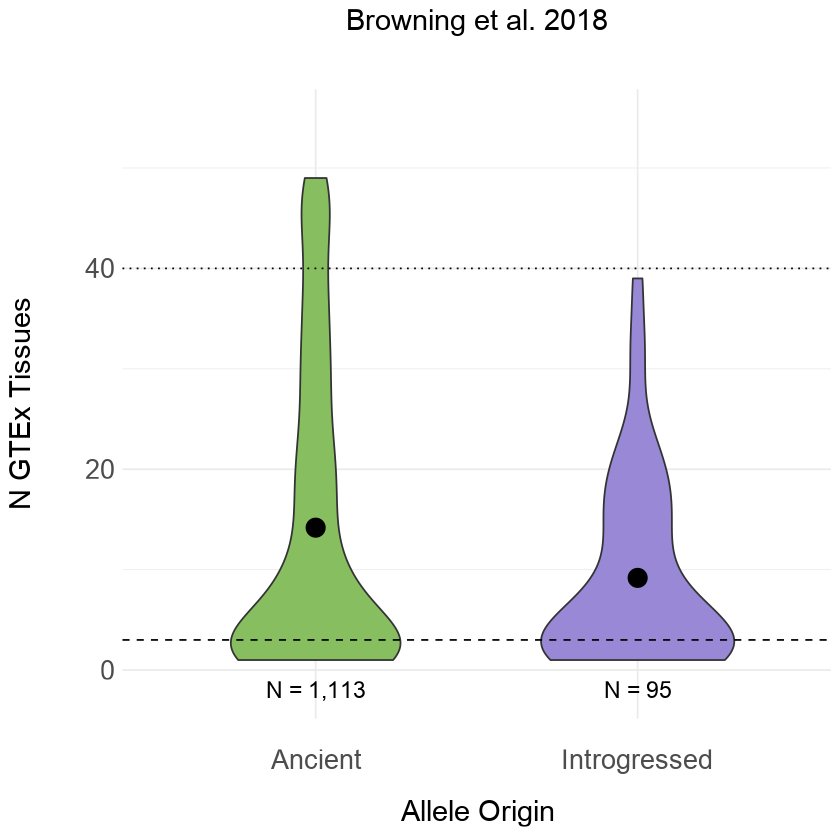

In [280]:
Browning_n_GTEx_tissues_allele_origin <- ggplot(sQTL_SAVs, aes(x = Browning_allele_origin, y = N_GTEx_tissues, fill = Browning_allele_origin)) + geom_violin(width = 0.6) + 
stat_summary(fun = 'mean', geom = 'point', color = 'black', size = 5) +
geom_hline(yintercept=3, linetype='dashed', color = 'black') +
geom_hline(yintercept=40, linetype='dotted', color = 'black') +
scale_y_continuous(limits = c(-2, 55)) +
xlab('\nAllele Origin') + ylab('N GTEx Tissues\n') +
ggtitle('Browning et al. 2018\n') +
scale_x_discrete(labels = c('Ancient','Introgressed')) +
scale_fill_manual(name = '', values = c(ancient_color,introgressed_color)) +
theme_minimal() + theme(text = element_text(family = 'Arial')) + theme(legend.position = "bottom") +
theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 22)) +
theme(axis.title = element_text(size = 22), axis.text.x = element_text(size=20, vjust=-1.5), axis.text.y = element_text(size = 20)) +
theme(legend.title=element_text(size=20), legend.text=element_text(size=20), legend.spacing.x = unit(2, 'cm')) +
theme(legend.position="none") +

annotate('text', x = 'ancient', y = -2, label = 'N = 1,113', size = 6, family = 'Arial') + 
annotate('text', x = 'introgressed', y = -2, label = 'N = 95', , size = 6, family = 'Arial')


Browning_n_GTEx_tissues_allele_origin

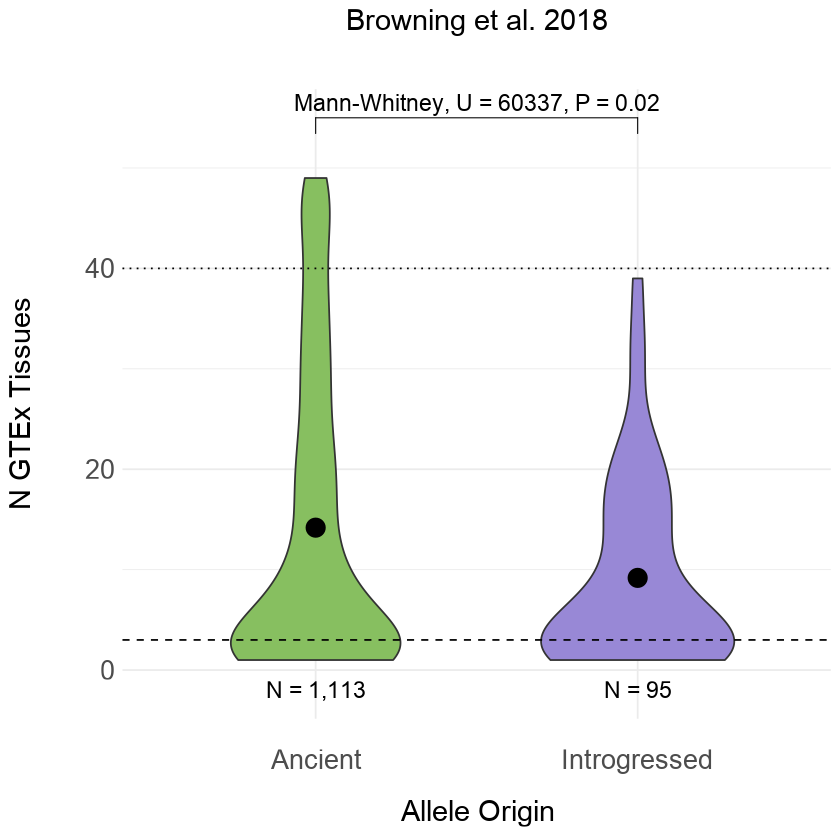

In [281]:
Browning_n_GTEx_tissues_allele_origin = Browning_n_GTEx_tissues_allele_origin + geom_bracket(xmin = 'ancient', xmax = 'introgressed', y.position = 55, tip.length = c(0.0275), label = 'Mann-Whitney, U = 60337, P = 0.02', label.size = 6, family = 'Arial', inherit.aes = FALSE)
Browning_n_GTEx_tissues_allele_origin

In [282]:
pdf('suppl_figs/Browning_n_GTEx_tissues_allele_origin.pdf', width = 12, height = 12)
Browning_n_GTEx_tissues_allele_origin
dev.off()

png 
  2

### Vernot et al. 2016 Allele Origin <a class = 'anchor' id = 'vernotsQTLs'></a>

In [283]:
sQTL_SAVs <- subset(sQTLs, delta_max >= 0.2 & Vernot_allele_origin != 'low-confidence ancient')

In [284]:
nrow(sQTL_SAVs)

[1] 1197

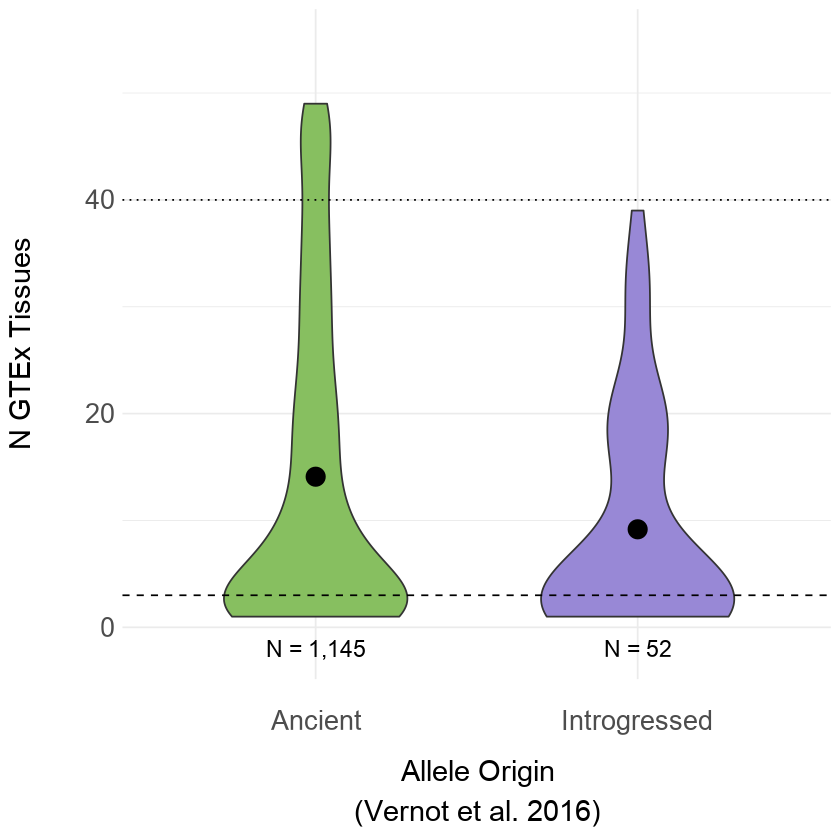

In [285]:
Vernot_n_GTEx_tissues_allele_origin <- ggplot(sQTL_SAVs, aes(x = Vernot_allele_origin, y = N_GTEx_tissues, fill = Vernot_allele_origin)) + geom_violin(width = 0.6) + 
stat_summary(fun = 'mean', geom = 'point', color = 'black', size = 5) +
geom_hline(yintercept=3, linetype='dashed', color = 'black') +
geom_hline(yintercept=40, linetype='dotted', color = 'black') +
scale_y_continuous(limits = c(-2, 55)) +
xlab('\nAllele Origin\n(Vernot et al. 2016)') + ylab('N GTEx Tissues\n') +
#ggtitle('Vernot et al. 2016\n') +
scale_x_discrete(labels = c('Ancient','Introgressed')) +
scale_fill_manual(name = '', values = c(ancient_color,introgressed_color)) +
theme_minimal() + theme(text = element_text(family = 'Arial')) + theme(legend.position = "bottom") +
#theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 22)) +
theme(axis.title = element_text(size = 22), axis.text.x = element_text(size=20, vjust=-1.5), axis.text.y = element_text(size = 20)) +
theme(legend.title=element_text(size=20), legend.text=element_text(size=20), legend.spacing.x = unit(2, 'cm')) +
theme(legend.position="none") +

annotate('text', x = 'ancient', y = -2, label = 'N = 1,145', size = 6, family = 'Arial') + 
annotate('text', x = 'introgressed', y = -2, label = 'N = 52', , size = 6, family = 'Arial')


Vernot_n_GTEx_tissues_allele_origin

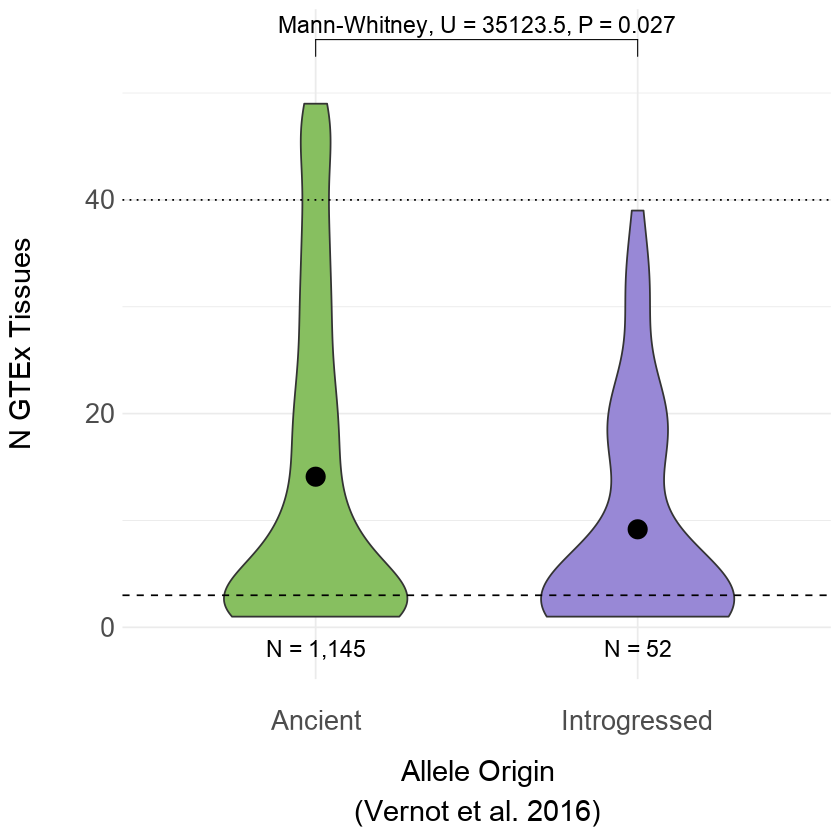

In [286]:
Vernot_n_GTEx_tissues_allele_origin = Vernot_n_GTEx_tissues_allele_origin + geom_bracket(xmin = 'ancient', xmax = 'introgressed', y.position = 55, tip.length = c(0.0275), label = 'Mann-Whitney, U = 35123.5, P = 0.027', label.size = 6, family = 'Arial', inherit.aes = FALSE)
Vernot_n_GTEx_tissues_allele_origin

We will save this plot with another for a main figure later.

### sQTL Allele Origin Differences <a class = 'anchor' id = 'sqtlalleleorigindifferences'></a>

In [287]:
sQTLs_allele_origin_tissue_counts <- read.csv('../data/GTEx_sQTLs/sQTLs_allele_origin_tissue_counts.txt', header = TRUE, sep = '\t')
head(sQTLs_allele_origin_tissue_counts)

,tissue,Vernot_ancient,Vernot_introgressed,Browning_ancient,Browning_introgressed,sample_size
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<int>
1,Adipose_Subcutaneous,530,25,511,45,663
2,Adipose_Visceral_Omentum,451,12,436,27,541
3,Adrenal_Gland,279,6,275,11,258
4,Artery_Aorta,433,16,423,27,432
5,Artery_Coronary,259,5,258,6,240
6,Artery_Tibial,525,19,508,40,663


Melt the dataframe and rename tissues to get rid of underscores.

In [288]:
melted_sQTLs_tissue_counts <- melt(sQTLs_allele_origin_tissue_counts, id = c('tissue', 'sample_size'))
colnames(melted_sQTLs_tissue_counts) <- c('tissue', 'sample_size', 'origin', 'count')
head(melted_sQTLs_tissue_counts)

,tissue,sample_size,origin,count
,<chr>,<int>,<fct>,<dbl>
1,Adipose_Subcutaneous,663,Vernot_ancient,530
2,Adipose_Visceral_Omentum,541,Vernot_ancient,451
3,Adrenal_Gland,258,Vernot_ancient,279
4,Artery_Aorta,432,Vernot_ancient,433
5,Artery_Coronary,240,Vernot_ancient,259
6,Artery_Tibial,663,Vernot_ancient,525


In [289]:
melted_sQTLs_tissue_counts$tissue <- c('Adipose Subcutaneous','Adipose Visceral Omentum','Adrenal Gland','Artery Aorta','Artery Coronary',
                                       'Artery Tibial','Brain Amygdala','Brain Anterior Cingulate Cortex BA24','Brain Caudate Basal Ganglia',
                                       'Brain Cerebellar Hemisphere','Brain Cerebellum','Brain Cortex','Brain Frontal Cortex BA9','Brain Hippocampus',
                                       'Brain Hypothalamus','Brain Nucleus Accumbens Basal Ganglia','Brain Putamen Basal Ganglia','Brain Spinal Cord Cervical C1',
                                       'Brain Substantia Nigra','Breast Mammary Tissue','Cells Cultured Fibroblasts','Cells EBV-transformed Lymphocytes',
                                       'Colon Sigmoid','Colon Transverse','Esophagus Gastroesophageal Junction','Esophagus Mucosa','Esophagus Muscularis',
                                       'Heart Atrial Appendage','Heart Left Ventricle','Kidney Cortex','Liver','Lung','Minor Salivary Gland','Muscle Skeletal',
                                       'Nerve Tibial','Ovary','Pancreas','Pituitary','Prostate','Skin Not Sun Exposed Suprapubic','Skin Sun Exposed Lower Leg',
                                       'Small Intestine Terminal Ileum','Spleen','Stomach','Testis','Thyroid','Uterus','Vagina','Whole Blood')

Write a function for the figure.

In [290]:
generate_sQTLs_allele_origin_tissue_counts_with_sample_size_plot <- function(allele_origin, title, color, y_max) {
    allele_origin_sQTLs_tissue_counts_plot <- ggplot(subset(melted_sQTLs_tissue_counts, origin == allele_origin), aes(x = reorder(tissue, -sample_size), y = count)) + geom_bar(stat = 'identity', width = 0.7, color = 'black', fill = color) + #geom_text(aes(label = count), vjust = -0.5, family = 'Arial', size = 6) +
    xlab('\nTissue') + ylab('N sQTLs\n') + ggtitle(title) +
    scale_y_continuous(limits = c(0, y_max)) + theme_minimal() + theme(text = element_text(family = 'Arial')) +
    theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 20)) +
    theme(axis.title = element_text(size = 20), axis.text.x = element_text(size = 14, angle = 45, hjust = 1), axis.text.y = element_text(size = 16))
}

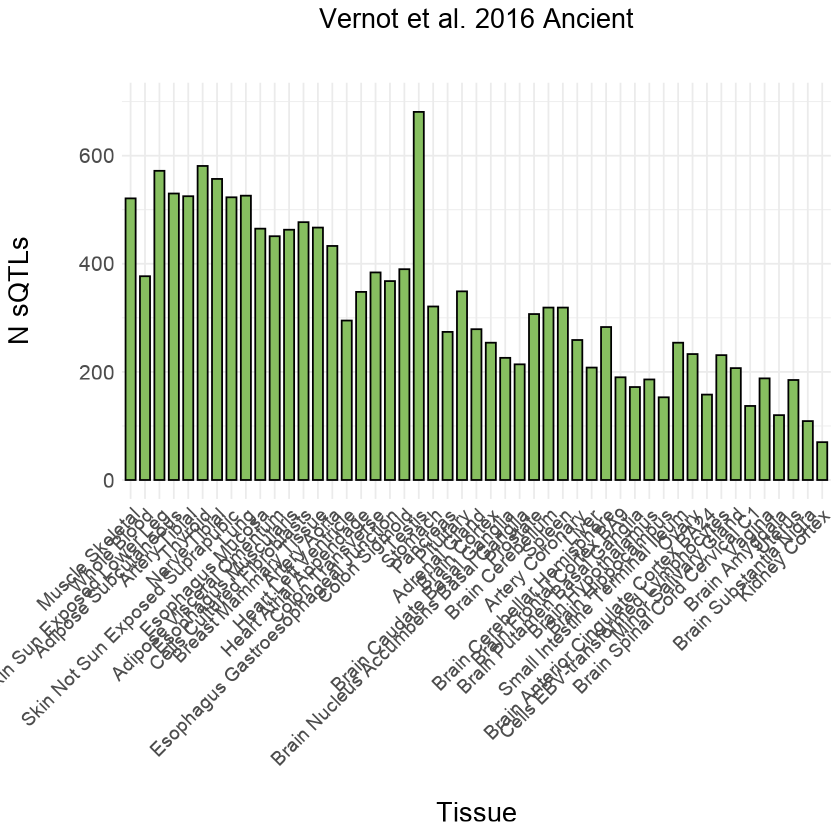

In [291]:
Vernot_ancient_sQTLs_tissue_counts_with_sample_size_plot <- generate_sQTLs_allele_origin_tissue_counts_with_sample_size_plot('Vernot_ancient', 'Vernot et al. 2016 Ancient\n', ancient_color, 700)
Vernot_ancient_sQTLs_tissue_counts_with_sample_size_plot

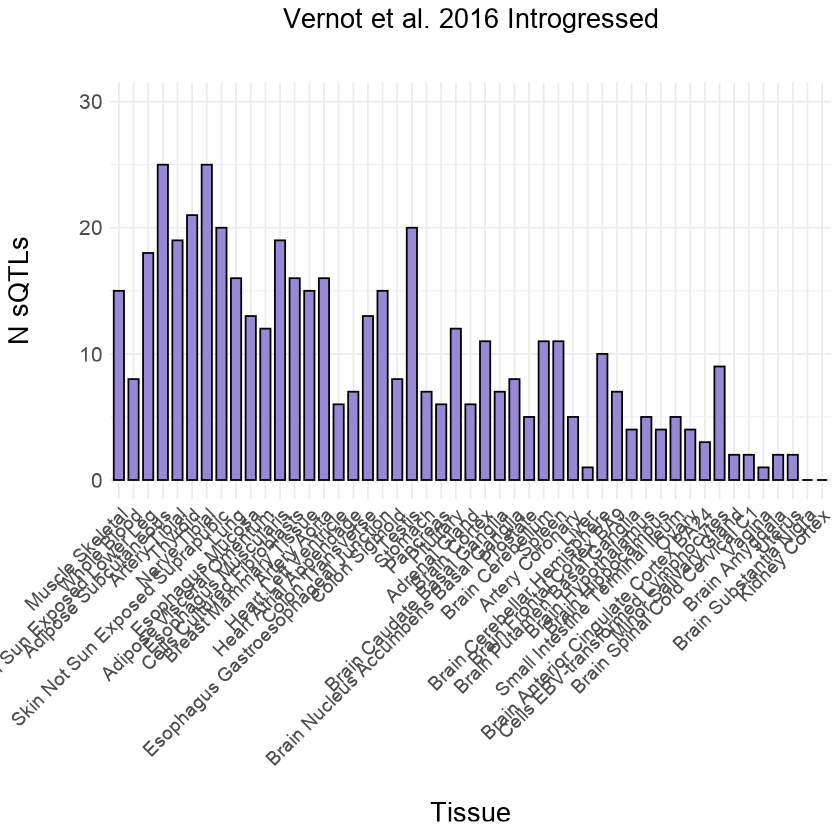

In [292]:
Vernot_introgressed_sQTLs_tissue_counts_with_sample_size_plot <- generate_sQTLs_allele_origin_tissue_counts_with_sample_size_plot('Vernot_introgressed', 'Vernot et al. 2016 Introgressed\n', introgressed_color, 30)
Vernot_introgressed_sQTLs_tissue_counts_with_sample_size_plot

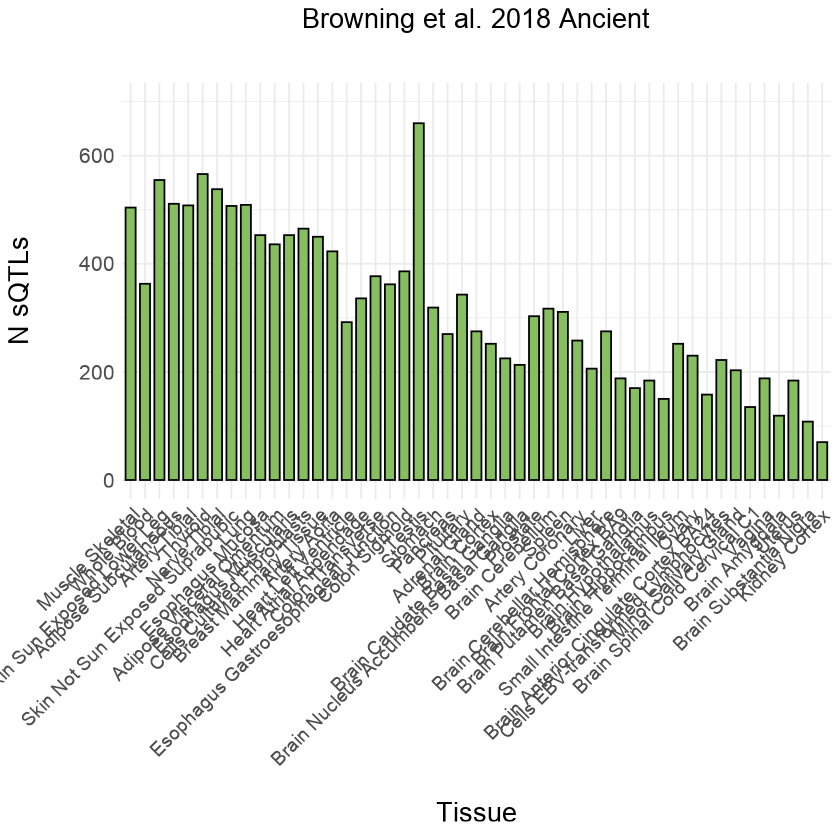

In [293]:
Browning_ancient_sQTLs_tissue_counts_with_sample_size_plot <- generate_sQTLs_allele_origin_tissue_counts_with_sample_size_plot('Browning_ancient', 'Browning et al. 2018 Ancient\n', ancient_color, 700)
Browning_ancient_sQTLs_tissue_counts_with_sample_size_plot

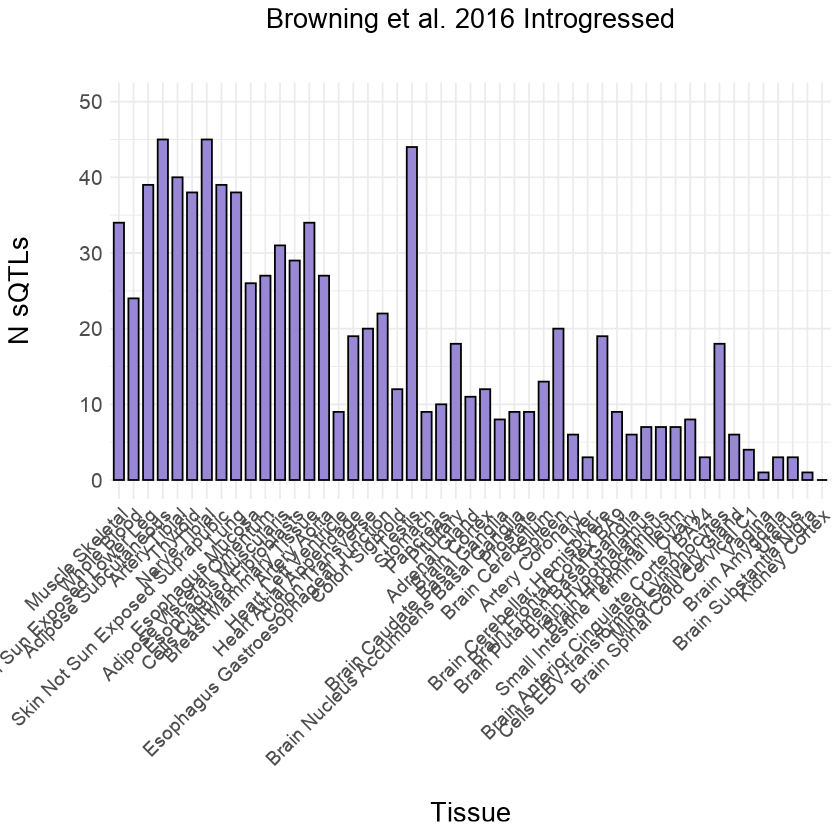

In [294]:
Browning_introgressed_sQTLs_tissue_counts_with_sample_size_plot <- generate_sQTLs_allele_origin_tissue_counts_with_sample_size_plot('Browning_introgressed', 'Browning et al. 2016 Introgressed\n', introgressed_color, 50)
Browning_introgressed_sQTLs_tissue_counts_with_sample_size_plot

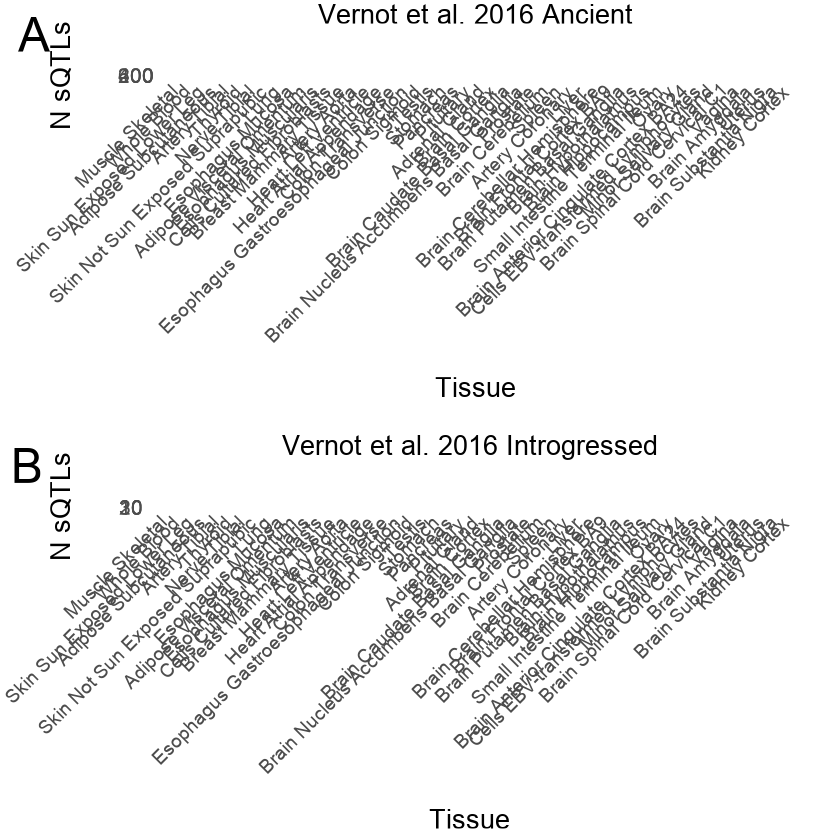

In [295]:
Vernot_sQTL_allele_origin_tissue_counts_with_sample_size_multiplot <- plot_grid(Vernot_ancient_sQTLs_tissue_counts_with_sample_size_plot, NULL, Vernot_introgressed_sQTLs_tissue_counts_with_sample_size_plot, labels = c('A','','B'), label_size = 36, rel_heights = c(0.45,0.025,0.45), ncol = 1, scale = 0.9)
Vernot_sQTL_allele_origin_tissue_counts_with_sample_size_multiplot

In [296]:
pdf('suppl_figs/Vernot_sQTL_allele_origin_tissue_counts_with_sample_size_multiplot.pdf', width = 24, height = 16)
Vernot_sQTL_allele_origin_tissue_counts_with_sample_size_multiplot
dev.off()

png 
  2

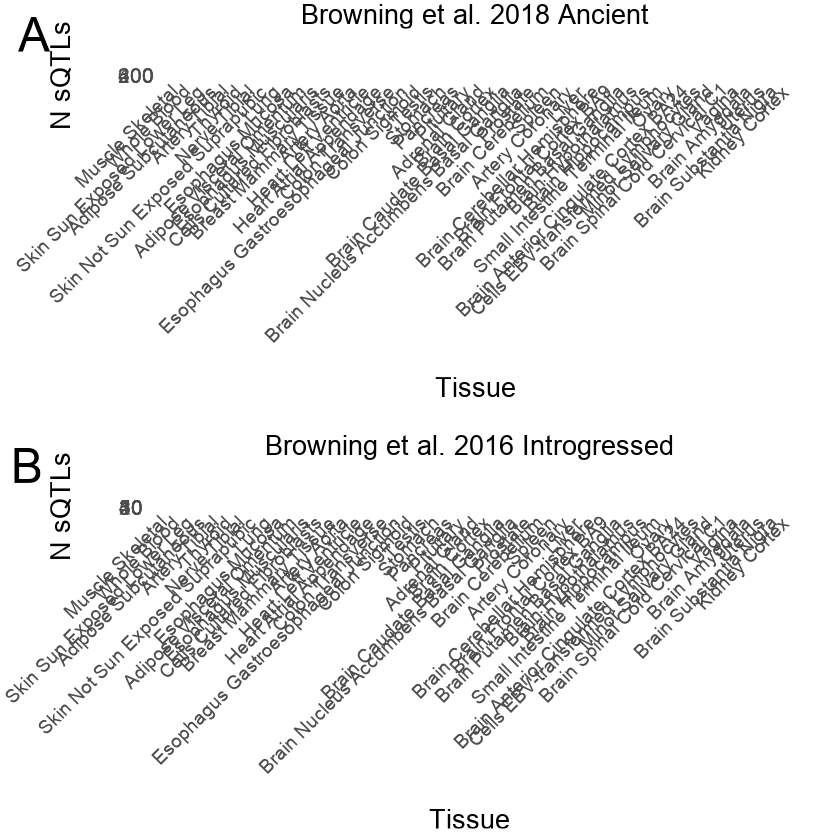

In [297]:
Browning_sQTL_allele_origin_tissue_counts_with_sample_size_multiplot <- plot_grid(Browning_ancient_sQTLs_tissue_counts_with_sample_size_plot, NULL, Browning_introgressed_sQTLs_tissue_counts_with_sample_size_plot, labels = c('A','','B'), label_size = 36, rel_heights = c(0.45,0.025,0.45), ncol = 1, scale = 0.9)
Browning_sQTL_allele_origin_tissue_counts_with_sample_size_multiplot

In [298]:
pdf('suppl_figs/Browning_sQTL_allele_origin_tissue_counts_with_sample_size_multiplot.pdf', width = 24, height = 16)
Browning_sQTL_allele_origin_tissue_counts_with_sample_size_multiplot
dev.off()

png 
  2

Let's plot a correlation between the proportions for ancient and introgressed to test for differences in those two categories.

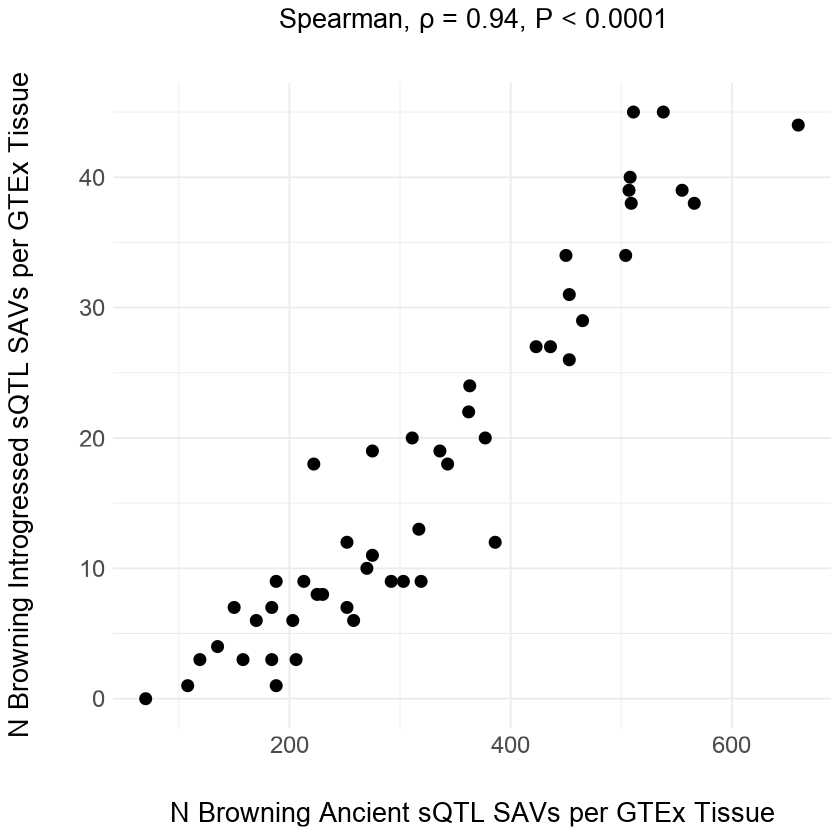

In [299]:
Browning_sQTL_allele_origin_tissue_counts_correlation_plot <- ggplot(sQTLs_allele_origin_tissue_counts, aes(x = Browning_ancient, y = Browning_introgressed)) + geom_point(size = 3) +
xlab('\nN Browning Ancient sQTL SAVs per GTEx Tissue') + ylab('N Browning Introgressed sQTL SAVs per GTEx Tissue\n') + ggtitle('Spearman, \u03c1 = 0.94, P < 0.0001\n') +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 20), axis.text.x = element_text(size = 18), axis.text.y = element_text(size = 18)) +
theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 20))

Browning_sQTL_allele_origin_tissue_counts_correlation_plot

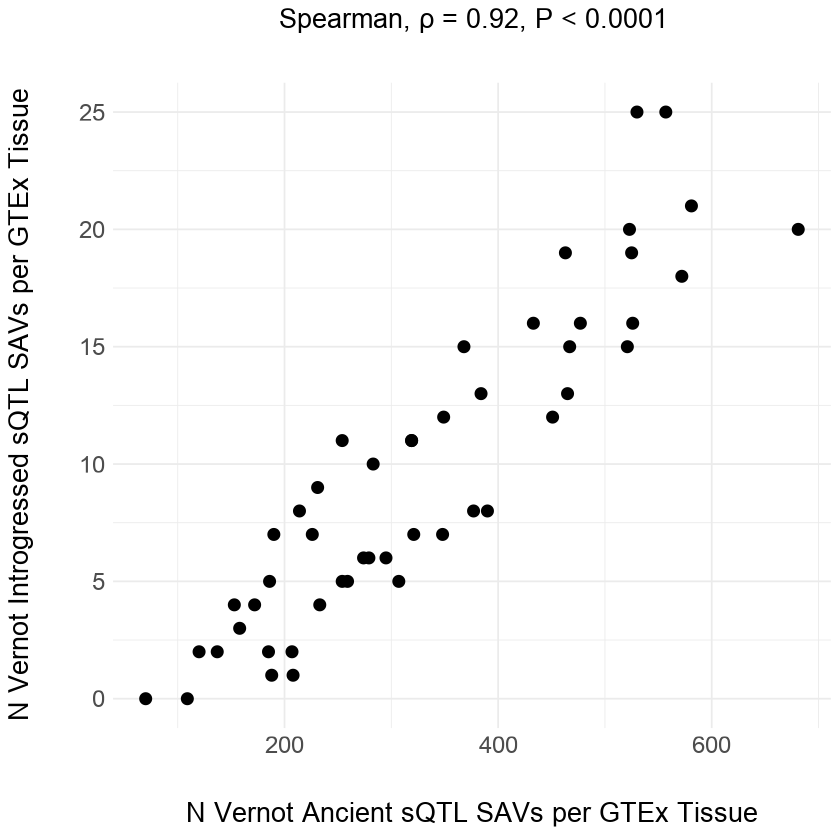

In [300]:
Vernot_sQTL_allele_origin_tissue_counts_correlation_plot <- ggplot(sQTLs_allele_origin_tissue_counts, aes(x = Vernot_ancient, y = Vernot_introgressed)) + geom_point(size = 3) +
xlab('\nN Vernot Ancient sQTL SAVs per GTEx Tissue') + ylab('N Vernot Introgressed sQTL SAVs per GTEx Tissue\n') + ggtitle('Spearman, \u03c1 = 0.92, P < 0.0001\n') +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 20), axis.text.x = element_text(size = 18), axis.text.y = element_text(size = 18)) +
theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 20))

Vernot_sQTL_allele_origin_tissue_counts_correlation_plot

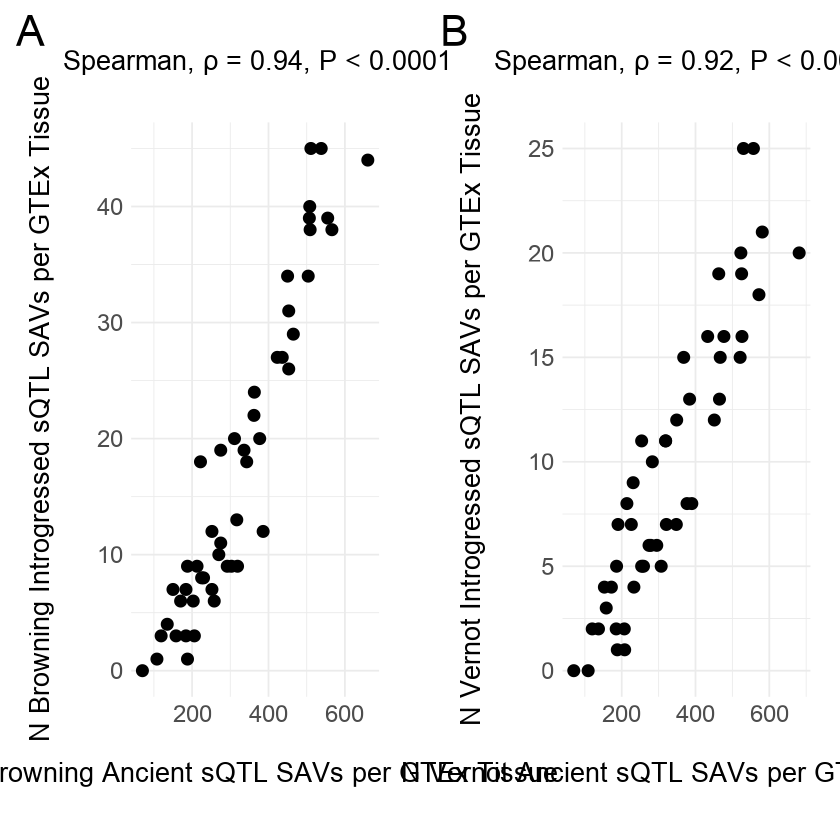

In [301]:
sQTL_allele_origin_tissue_counts_correlation_plot <- plot_grid(Browning_sQTL_allele_origin_tissue_counts_correlation_plot, NULL, Vernot_sQTL_allele_origin_tissue_counts_correlation_plot, labels = c('A','','B'), label_size = 32, rel_widths = c(0.45,0.025,0.45), nrow = 1, scale = 0.9)
sQTL_allele_origin_tissue_counts_correlation_plot

In [302]:
pdf('suppl_figs/sQTL_allele_origin_tissue_counts_correlation_plot.pdf', width = 24, height = 10)
sQTL_allele_origin_tissue_counts_correlation_plot
dev.off()

png 
  2

Let's plot the proportion of observed SAV sQTLs per tissue out of all sQTLs observed per tissue in GTEx.

In [303]:
tissue <- c('Adipose Subcutaneous','Adipose Visceral Omentum','Adrenal Gland','Artery Aorta','Artery Coronary',
            'Artery Tibial','Brain Amygdala','Brain Anterior Cingulate Cortex BA24','Brain Caudate Basal Ganglia',
            'Brain Cerebellar Hemisphere','Brain Cerebellum','Brain Cortex','Brain Frontal Cortex BA9','Brain Hippocampus',
            'Brain Hypothalamus','Brain Nucleus Accumbens Basal Ganglia','Brain Putamen Basal Ganglia','Brain Spinal Cord Cervical C1',
            'Brain Substantia Nigra','Breast Mammary Tissue','Cells Cultured Fibroblasts','Cells EBV-transformed Lymphocytes',
            'Colon Sigmoid','Colon Transverse','Esophagus Gastroesophageal Junction','Esophagus Mucosa','Esophagus Muscularis',
            'Heart Atrial Appendage','Heart Left Ventricle','Kidney Cortex','Liver','Lung','Minor Salivary Gland','Muscle Skeletal',
            'Nerve Tibial','Ovary','Pancreas','Pituitary','Prostate','Skin Not Sun Exposed Suprapubic','Skin Sun Exposed Lower Leg',
            'Small Intestine Terminal Ileum','Spleen','Stomach','Testis','Thyroid','Uterus','Vagina','Whole Blood')
n_SAV_sQTLs <- c(610,507,312,486,288,600,129,169,249,323,364,289,213,168,205,244,188,146,116,528,539,267,432,435,419,521,526,383,325,76,228,599,226,584,638,261,307,401,333,598,648,282,363,358,778,661,201,205,426)
n_sQTLs <- c(1019648,751211,372731,667895,308815,955738,112753,163953,261977,344489,401291,287562,226576,172761,202412,269372,186304,145545,104747,716593,889990,288529,527835,605299,548916,759227,786214,526642,421367,45566,221828,886768,189537,894894,1043635,260517,355195,482318,368898,902558,1037195,265416,395315,423319,1537363,1119675,182070,185912,620835)
SAV_sQTL_proportions <- data.frame(tissue, n_SAV_sQTLs, n_sQTLs)
SAV_sQTL_proportions$prop <- SAV_sQTL_proportions$n_SAV_sQTLs / SAV_sQTL_proportions$n_sQTLs
head(SAV_sQTL_proportions)

,tissue,n_SAV_sQTLs,n_sQTLs,prop
,<chr>,<dbl>,<dbl>,<dbl>
1,Adipose Subcutaneous,610,1019648,0.0005982457
2,Adipose Visceral Omentum,507,751211,0.0006749102
3,Adrenal Gland,312,372731,0.0008370648
4,Artery Aorta,486,667895,0.0007276593
5,Artery Coronary,288,308815,0.0009325972
6,Artery Tibial,600,955738,0.0006277871


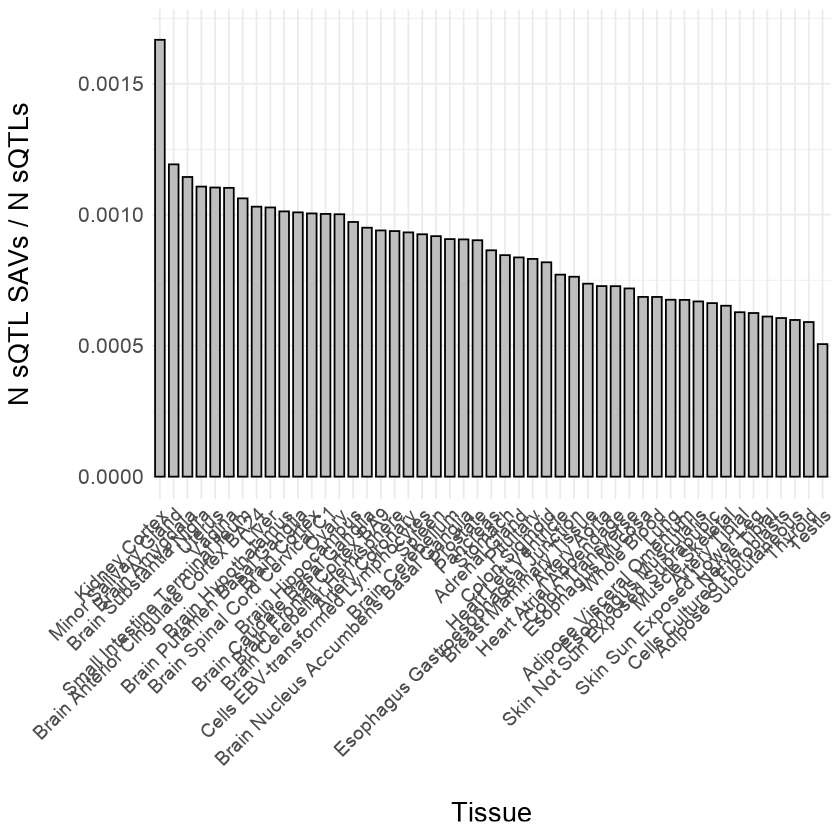

In [304]:
SAV_sQTL_proportions_plot <- ggplot(SAV_sQTL_proportions, aes(x = reorder(tissue, -prop), y = prop)) + geom_bar(stat = 'identity', width = 0.7, color = 'black', fill = bar_color) + #geom_text(aes(label = count), vjust = -0.5, family = 'Arial', size = 6) +
xlab('\nTissue') + ylab('N sQTL SAVs / N sQTLs\n') +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
scale_y_continuous(limits = c(0, 0.0017)) + theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 20)) +
theme(axis.title = element_text(size = 20), axis.text.x = element_text(size = 14, angle = 45, hjust = 1), axis.text.y = element_text(size = 16))

SAV_sQTL_proportions_plot

In [305]:
pdf('suppl_figs/sQTL_SAVs_proportions_plot.pdf', width = 20, height = 10)
SAV_sQTL_proportions_plot
dev.off()

png 
  2

### Specific Tissue Distribution <a class = 'anchor' id = 'specifictissuedistribution'></a>

In [306]:
tissue <- c('Adipose Subcutaneous','Adipose Visceral Omentum','Adrenal Gland','Artery Aorta','Artery Coronary',
            'Artery Tibial','Brain Amygdala','Brain Anterior Cingulate Cortex BA24','Brain Caudate Basal Ganglia',
            'Brain Cerebellar Hemisphere','Brain Cerebellum','Brain Cortex','Brain Frontal Cortex BA9','Brain Hippocampus',
            'Brain Hypothalamus','Brain Nucleus Accumbens Basal Ganglia','Brain Putamen Basal Ganglia','Brain Spinal Cord Cervical C1',
            'Brain Substantia Nigra','Breast Mammary Tissue','Cells Cultured Fibroblasts','Cells EBV-transformed Lymphocytes',
            'Colon Sigmoid','Colon Transverse','Esophagus Gastroesophageal Junction','Esophagus Mucosa','Esophagus Muscularis',
            'Heart Atrial Appendage','Heart Left Ventricle','Kidney Cortex','Liver','Lung','Minor Salivary Gland','Muscle Skeletal',
            'Nerve Tibial','Ovary','Pancreas','Pituitary','Prostate','Skin Not Sun Exposed Suprapubic','Skin Sun Exposed Lower Leg',
            'Small Intestine Terminal Ileum','Spleen','Stomach','Testis','Thyroid','Uterus','Vagina','Whole Blood')
count <- c(14,12,1,11,1,29,1,2,2,5,6,3,0,0,0,4,0,0,0,3,29,8,6,6,3,13,6,2,2,0,5,17,1,54,22,0,2,14,2,20,25,3,11,3,144,35,1,0,29)
specific_tissue_sQTL_counts <- data.frame(tissue, count)
head(specific_tissue_sQTL_counts)

,tissue,count
,<chr>,<dbl>
1,Adipose Subcutaneous,14
2,Adipose Visceral Omentum,12
3,Adrenal Gland,1
4,Artery Aorta,11
5,Artery Coronary,1
6,Artery Tibial,29


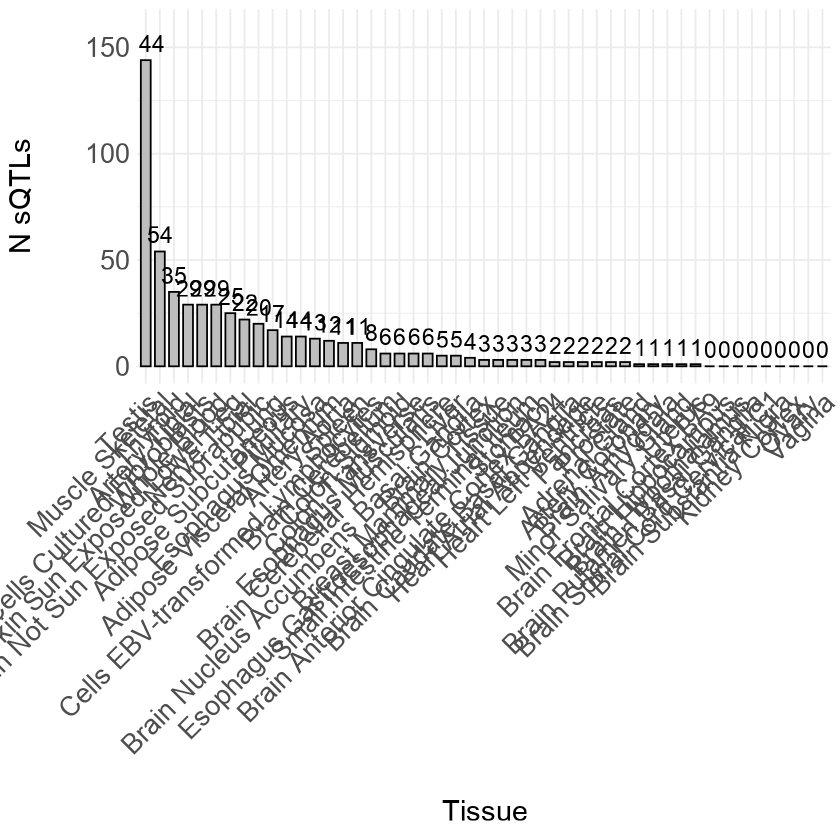

In [307]:
specific_tissue_sQTL_counts_plot <- ggplot(specific_tissue_sQTL_counts, aes(x = reorder(tissue, -count), y = count)) + geom_bar(stat = 'identity', width = 0.7, color = 'black', fill = bar_color) + geom_text(aes(label = count), vjust = -0.5, family = 'Arial', size = 6) +
xlab('\nTissue') + ylab('N sQTLs\n') + scale_y_continuous(limits = c(0, 160)) + theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 22), axis.text.x = element_text(size = 20, angle = 45, hjust = 1), axis.text.y = element_text(size = 20))

specific_tissue_sQTL_counts_plot

In [308]:
pdf('suppl_figs/specific_tissue_sQTL_counts_plot.pdf', width = 20, height = 10)
specific_tissue_sQTL_counts_plot
dev.off()

png 
  2

### EUR sQTLS <a class = 'anchor' id = 'EURsQTLs'></a>

EUR_sQTL cumulative sum.

In [309]:
EUR_sQTLs <- read.csv('../data/GTEx_sQTLs/EUR_sQTLs.txt', header = TRUE, sep = '\t')
head(EUR_sQTLs)

,binned_AF,N_SAVs,N_SAV_sQTLs,proportion_sQTLs
,<chr>,<int>,<int>,<dbl>
1,"(0.0, 0.05]",447,134,0.2997763
2,"(0.05, 0.1]",208,108,0.5192308
3,"(0.1, 0.15]",148,84,0.5675676
4,"(0.15, 0.2]",137,85,0.6204380
5,"(0.2, 0.25]",110,68,0.6181818
6,"(0.25, 0.3]",114,75,0.6578947


In [310]:
x_axis_labels = c('0.01-0.05','0.06-0.1','0.11-0.15','0.16-0.2','0.21-0.25','0.26-0.3','0.31-0.35','0.36-0.4','0.41-0.45','0.46-0.5','0.51-0.55','0.56-0.6','0.61-0.65','0.66-0.7','0.71-0.75','0.76-0.8','0.81-0.85','0.86-0.9','0.91-0.95','0.96-1')

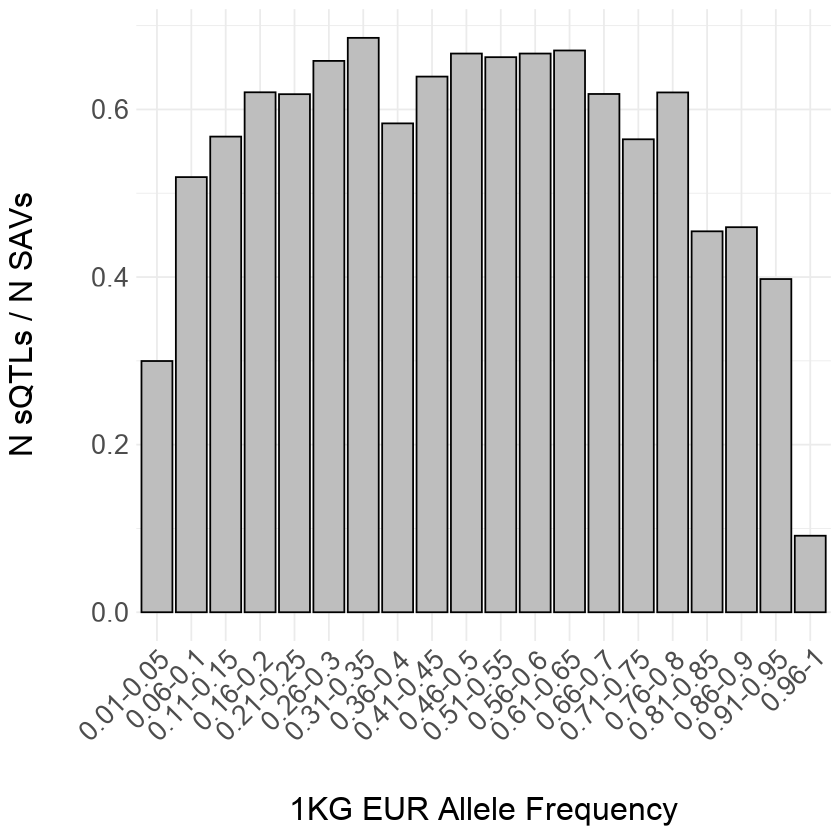

In [311]:
EUR_sQTLs_plot <- ggplot(EUR_sQTLs, aes(x = binned_AF, y = proportion_sQTLs)) + geom_bar(stat = 'identity', color = 'black', fill = bar_color) +
scale_x_discrete(labels = x_axis_labels) +
xlab('\n1KG EUR Allele Frequency') + ylab('N sQTLs / N SAVs\n') + theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 24), axis.text.x = element_text(size = 20, angle = 45, hjust = 1), axis.text.y = element_text(size = 20))

EUR_sQTLs_plot

In [312]:
pdf('suppl_figs/EUR_sQTLs_plot.pdf', width = 14, height = 12)
EUR_sQTLs_plot
dev.off()

png 
  2

## Gene-Level <a class = 'anchor' id = 'genelevel'></a>

In [313]:
expression <- read.csv('../data/gene_expression/GTEX_gene_expression_with_gene_ids.txt', header = TRUE, sep = '\t')
head(expression)

,Gene,annotation,entropy,rel_entropy,tau,adipose.tissue,adrenal.gland,amygdala,basal.ganglia,breast,cerebellum,cerebral.cortex,cervix..uterine,colon,endometrium,esophagus,fallopian.tube,heart.muscle,hippocampal.formation,hypothalamus,kidney,liver,lung,midbrain,ovary,pancreas,pituitary.gland,prostate,salivary.gland,skeletal.muscle,skin,small.intestine,spinal.cord,spleen,stomach,testis,thyroid.gland,urinary.bladder,vagina
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,ENSG00000000003,TSPAN6,0.06832952,0.037444537,0.6391349,27.4,15.5,7.3,7.7,32.0,2.5,5.6,30.6,32.6,22.8,35.5,27.7,4.5,7.0,9.9,16.2,23.8,12.0,6.5,50.3,7.6,36.5,17.5,30.7,2.0,8.8,16.2,6.4,7.8,8.8,49.5,18.7,37.6,23.8
2,ENSG00000000005,TNMD,0.53483935,0.404403236,0.9742351,20.7,0.0,0.1,0.0,11.9,0.0,0.1,0.2,0.6,0.1,0.0,0.3,0.1,0.1,0.1,0.5,0.0,0.0,0.4,1.3,0.0,0.0,0.4,0.4,1.3,3.1,0.5,0.0,0.1,0.0,0.1,0.2,0.1,0.2
3,ENSG00000000419,DPM1,0.01311274,0.006362251,0.3645589,33.6,37.7,12.4,15.6,34.0,24.9,22.4,35.8,31.5,39.2,33.8,36.5,21.6,14.6,17.4,20.5,17.3,31.5,14.1,33.2,18.2,28.4,29.9,28.0,26.2,30.5,28.6,16.7,34.0,24.7,42.7,35.2,32.7,34.7
4,ENSG00000000457,SCYL3,0.02810495,0.010124142,0.4895105,5.4,4.5,1.5,1.7,6.7,5.2,2.3,7.9,5.4,6.5,5.7,6.3,2.0,1.7,2.1,3.4,3.8,5.1,1.7,5.9,2.5,4.5,6.8,6.7,3.6,6.7,5.4,2.5,5.7,3.8,6.3,7.4,9.1,6.6
5,ENSG00000000460,C1orf112,0.10468197,0.051870535,0.9845393,0.7,0.5,0.2,0.2,0.7,1.5,0.2,0.9,0.6,0.7,0.7,0.5,0.2,0.2,0.3,0.3,0.5,0.5,0.3,0.6,0.2,0.5,0.7,0.6,0.1,0.6,0.6,0.5,0.9,0.4,4.9,0.8,1.0,0.7
6,ENSG00000000938,FGR,0.26839304,0.194873974,0.9334211,19.9,4.8,2.7,3.2,13.7,2.4,3.8,9.1,5.0,8.6,3.8,18.7,3.7,3.2,3.7,4.4,4.2,86.1,4.9,2.4,1.7,2.7,6.2,5.8,1.3,3.7,8.2,6.5,124.3,4.1,3.2,7.6,7.1,6.7


In [314]:
nrow(expression)

[1] 18392

### Gene Allele Origin Differences <a class = 'anchor' id = 'genealleleorigindifferences'></a>

In [315]:
Vernot_ancient_genes <- subset(data_2, Vernot_allele_origin == 'ancient', select = 'annotation')
Vernot_archaic_specific_genes <- subset(data_2, Vernot_allele_origin == 'archaic-specific', select = 'annotation')
Vernot_introgressed_genes <- subset(data_2, Vernot_allele_origin == 'introgressed', select = 'annotation')

In [316]:
Vernot_ancient_genes_expression <- subset(expression, annotation %in% Vernot_ancient_genes$annotation)
Vernot_ancient_genes_expression_boolean <- Vernot_ancient_genes_expression[c(-1,-2,-3,-4,-5)]
Vernot_ancient_genes_expression_boolean <- data.frame(Map(function(x) as.numeric(x >= 1), Vernot_ancient_genes_expression_boolean))
Vernot_ancient_genes_expression <- data.frame(colSums(Vernot_ancient_genes_expression_boolean))

In [317]:
Vernot_archaic_specific_genes_expression <- subset(expression, annotation %in% Vernot_archaic_specific_genes$annotation)
Vernot_archaic_specific_genes_expression_boolean <- Vernot_archaic_specific_genes_expression[c(-1,-2,-3,-4,-5)]
Vernot_archaic_specific_genes_expression_boolean <- data.frame(Map(function(x) as.numeric(x >= 1), Vernot_archaic_specific_genes_expression_boolean))
Vernot_archaic_specific_genes_expression <- data.frame(colSums(Vernot_archaic_specific_genes_expression_boolean))

In [318]:
Vernot_introgressed_genes_expression <- subset(expression, annotation %in% Vernot_introgressed_genes$annotation)
Vernot_introgressed_genes_expression_boolean <- Vernot_introgressed_genes_expression[c(-1,-2,-3,-4,-5)]
Vernot_introgressed_genes_expression_boolean <- data.frame(Map(function(x) as.numeric(x >= 1), Vernot_introgressed_genes_expression_boolean))
Vernot_introgressed_genes_expression <- data.frame(colSums(Vernot_introgressed_genes_expression_boolean))

In [319]:
Vernot_allele_origin_genes_expression <- cbind(Vernot_ancient_genes_expression,Vernot_archaic_specific_genes_expression,Vernot_introgressed_genes_expression)
colnames(Vernot_allele_origin_genes_expression) <- c('ancient','archaic_specific','introgressed')
head(Vernot_allele_origin_genes_expression)

,ancient,archaic_specific,introgressed
,<dbl>,<dbl>,<dbl>
adipose.tissue,1298,1352,166
adrenal.gland,1248,1264,167
amygdala,1285,1298,150
basal.ganglia,1342,1377,158
breast,1309,1367,169
cerebellum,1321,1346,164


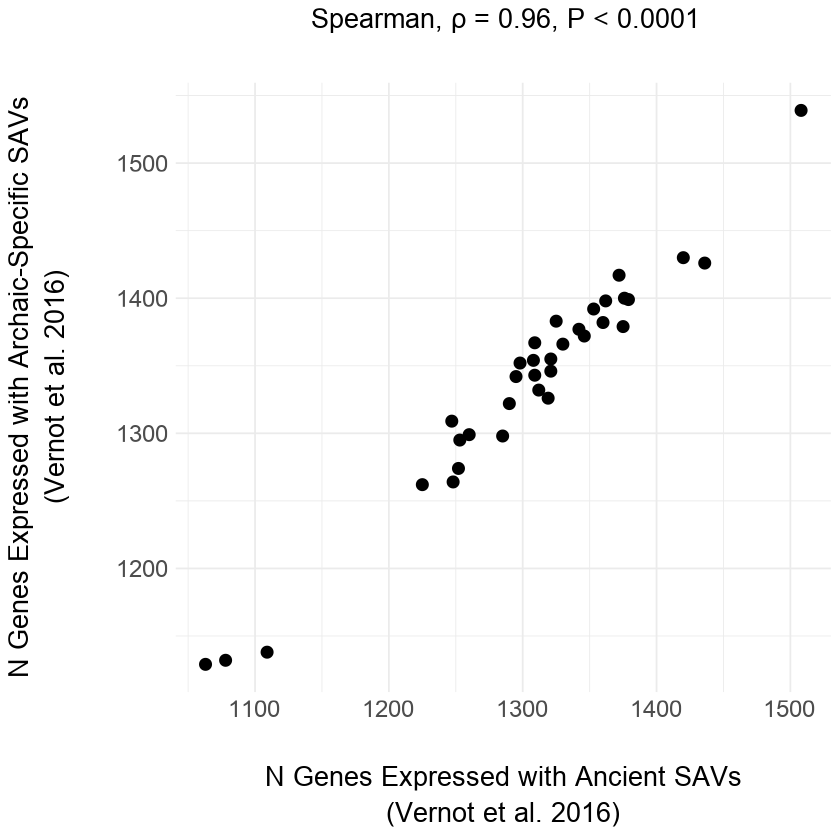

In [320]:
Vernot_ancient_archaic_specific_genes_expression_correlation_plot <- ggplot(Vernot_allele_origin_genes_expression, aes(x = ancient, y = archaic_specific)) + geom_point(size = 3) +
xlab('\nN Genes Expressed with Ancient SAVs\n(Vernot et al. 2016)') + ylab('N Genes Expressed with Archaic-Specific SAVs\n(Vernot et al. 2016)\n') + ggtitle('Spearman, \u03c1 = 0.96, P < 0.0001\n') +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 20), axis.text.x = element_text(size = 18), axis.text.y = element_text(size = 18)) +
theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 20))

Vernot_ancient_archaic_specific_genes_expression_correlation_plot

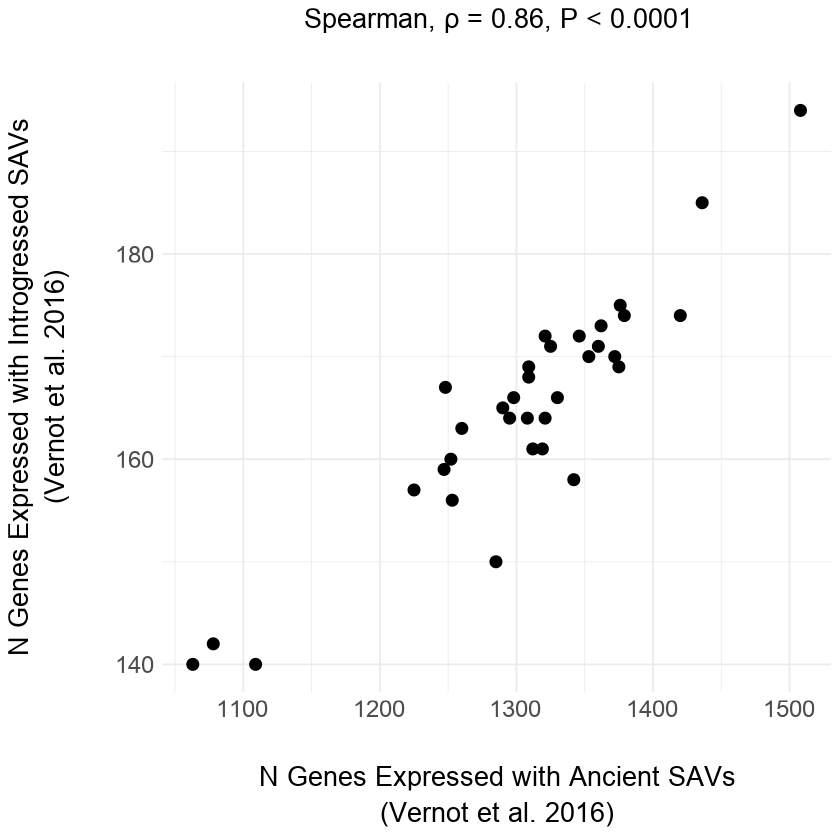

In [321]:
Vernot_ancient_introgressed_genes_expression_correlation_plot <- ggplot(Vernot_allele_origin_genes_expression, aes(x = ancient, y = introgressed)) + geom_point(size = 3) +
xlab('\nN Genes Expressed with Ancient SAVs\n(Vernot et al. 2016)') + ylab('N Genes Expressed with Introgressed SAVs\n(Vernot et al. 2016)\n') + ggtitle('Spearman, \u03c1 = 0.86, P < 0.0001\n') +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 20), axis.text.x = element_text(size = 18), axis.text.y = element_text(size = 18)) +
theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 20))

Vernot_ancient_introgressed_genes_expression_correlation_plot

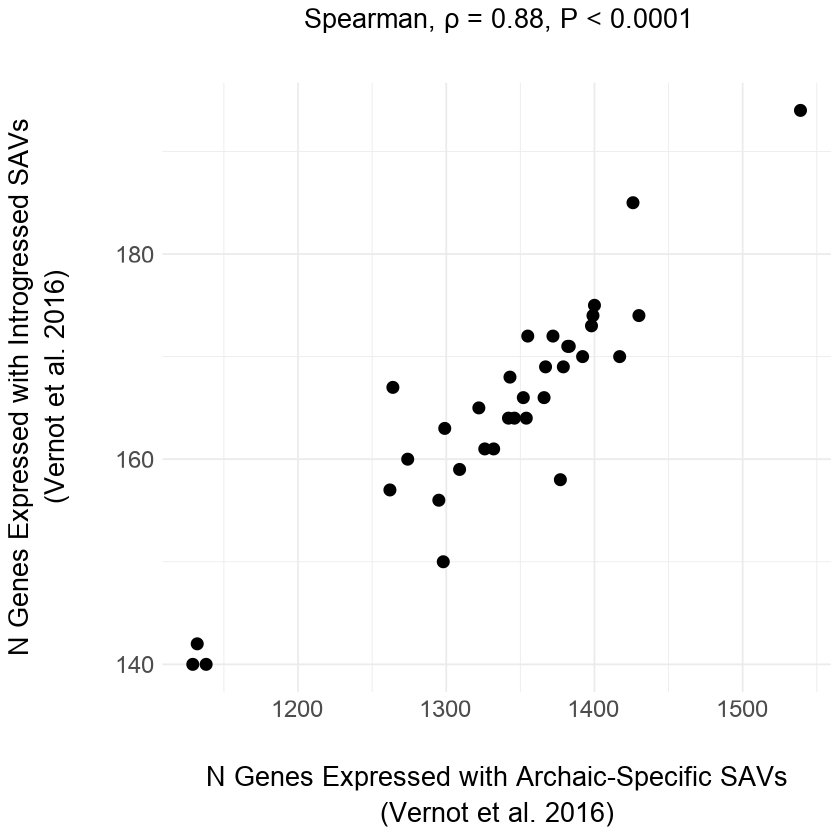

In [322]:
Vernot_archaic_specific_introgressed_genes_expression_correlation_plot <- ggplot(Vernot_allele_origin_genes_expression, aes(x = archaic_specific, y = introgressed)) + geom_point(size = 3) +
xlab('\nN Genes Expressed with Archaic-Specific SAVs\n(Vernot et al. 2016)') + ylab('N Genes Expressed with Introgressed SAVs\n(Vernot et al. 2016)\n') + ggtitle('Spearman, \u03c1 = 0.88, P < 0.0001\n') +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 20), axis.text.x = element_text(size = 18), axis.text.y = element_text(size = 18)) +
theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 20))

Vernot_archaic_specific_introgressed_genes_expression_correlation_plot

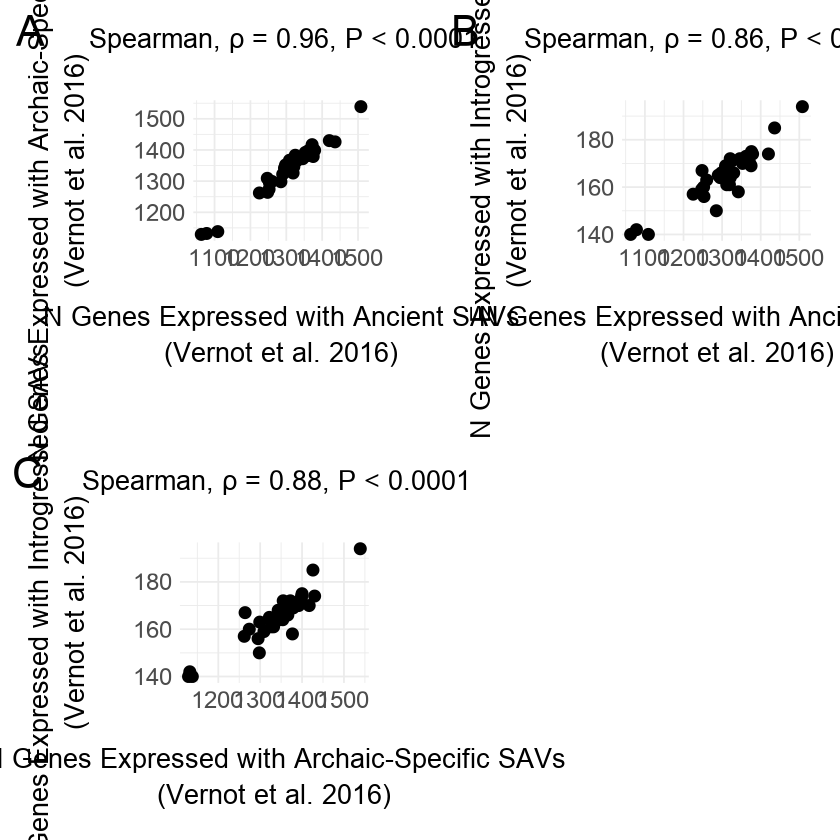

In [323]:
top_row <- plot_grid(Vernot_ancient_archaic_specific_genes_expression_correlation_plot, NULL, Vernot_ancient_introgressed_genes_expression_correlation_plot, labels = c('A','','B'), label_size = 32, rel_widths = c(0.45,0.05,0.45), nrow = 1, scale = 0.9)
middle_row <- plot_grid(NULL, NULL, NULL, nrow = 1)
bottom_row <- plot_grid(Vernot_archaic_specific_introgressed_genes_expression_correlation_plot, NULL, NULL, labels = c('C','',''), label_size = 32, rel_widths = c(0.45,0.05,0.45), nrow = 1, scale = 0.9)
theme_set(theme_cowplot(font_family = 'Arial'))
Vernot_genes_expression_correlation_plot <- plot_grid(top_row, middle_row, bottom_row, rel_heights = c(0.45,0.05,0.45), ncol = 1)
Vernot_genes_expression_correlation_plot

In [324]:
pdf('suppl_figs/Vernot_genes_expression_correlation_plot.pdf', width = 20, height = 20)
Vernot_genes_expression_correlation_plot
dev.off()

png 
  2

In [325]:
Browning_ancient_genes <- subset(data_2, Browning_allele_origin == 'ancient', select = 'annotation')
Browning_archaic_specific_genes <- subset(data_2, Browning_allele_origin == 'archaic-specific', select = 'annotation')
Browning_introgressed_genes <- subset(data_2, Browning_allele_origin == 'introgressed', select = 'annotation')

In [326]:
Browning_ancient_genes_expression <- subset(expression, annotation %in% Browning_ancient_genes$annotation)
Browning_ancient_genes_expression_boolean <- Browning_ancient_genes_expression[c(-1,-2,-3,-4,-5)]
Browning_ancient_genes_expression_boolean <- data.frame(Map(function(x) as.numeric(x >= 1), Browning_ancient_genes_expression_boolean))
Browning_ancient_genes_expression <- data.frame(colSums(Browning_ancient_genes_expression_boolean))

In [327]:
Browning_archaic_specific_genes_expression <- subset(expression, annotation %in% Browning_archaic_specific_genes$annotation)
Browning_archaic_specific_genes_expression_boolean <- Browning_archaic_specific_genes_expression[c(-1,-2,-3,-4,-5)]
Browning_archaic_specific_genes_expression_boolean <- data.frame(Map(function(x) as.numeric(x >= 1), Browning_archaic_specific_genes_expression_boolean))
Browning_archaic_specific_genes_expression <- data.frame(colSums(Browning_archaic_specific_genes_expression_boolean))

In [328]:
Browning_introgressed_genes_expression <- subset(expression, annotation %in% Browning_introgressed_genes$annotation)
Browning_introgressed_genes_expression_boolean <- Browning_introgressed_genes_expression[c(-1,-2,-3,-4,-5)]
Browning_introgressed_genes_expression_boolean <- data.frame(Map(function(x) as.numeric(x >= 1), Browning_introgressed_genes_expression_boolean))
Browning_introgressed_genes_expression <- data.frame(colSums(Browning_introgressed_genes_expression_boolean))

In [329]:
Browning_allele_origin_genes_expression <- cbind(Browning_ancient_genes_expression,Browning_archaic_specific_genes_expression,Browning_introgressed_genes_expression)
colnames(Browning_allele_origin_genes_expression) <- c('ancient','archaic_specific','introgressed')
head(Browning_allele_origin_genes_expression)

,ancient,archaic_specific,introgressed
,<dbl>,<dbl>,<dbl>
adipose.tissue,1274,1352,252
adrenal.gland,1226,1264,250
amygdala,1262,1298,240
basal.ganglia,1316,1377,252
breast,1284,1367,253
cerebellum,1296,1346,254


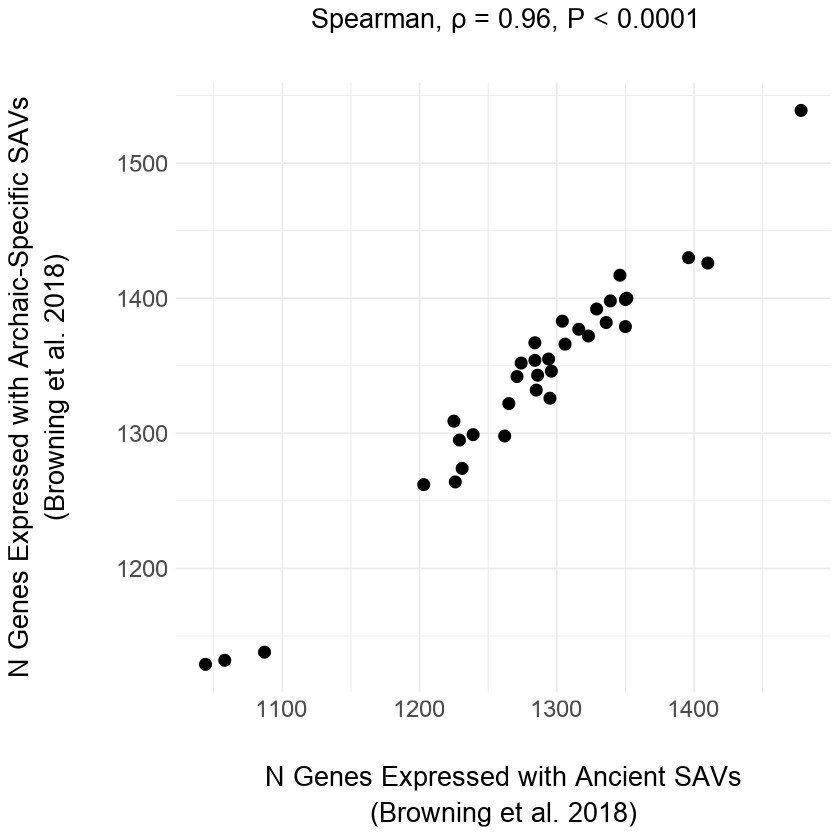

In [330]:
Browning_ancient_archaic_specific_genes_expression_correlation_plot <- ggplot(Browning_allele_origin_genes_expression, aes(x = ancient, y = archaic_specific)) + geom_point(size = 3) +
xlab('\nN Genes Expressed with Ancient SAVs\n(Browning et al. 2018)') + ylab('N Genes Expressed with Archaic-Specific SAVs\n(Browning et al. 2018)\n') + ggtitle('Spearman, \u03c1 = 0.96, P < 0.0001\n') +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 20), axis.text.x = element_text(size = 18), axis.text.y = element_text(size = 18)) +
theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 20))

Browning_ancient_archaic_specific_genes_expression_correlation_plot

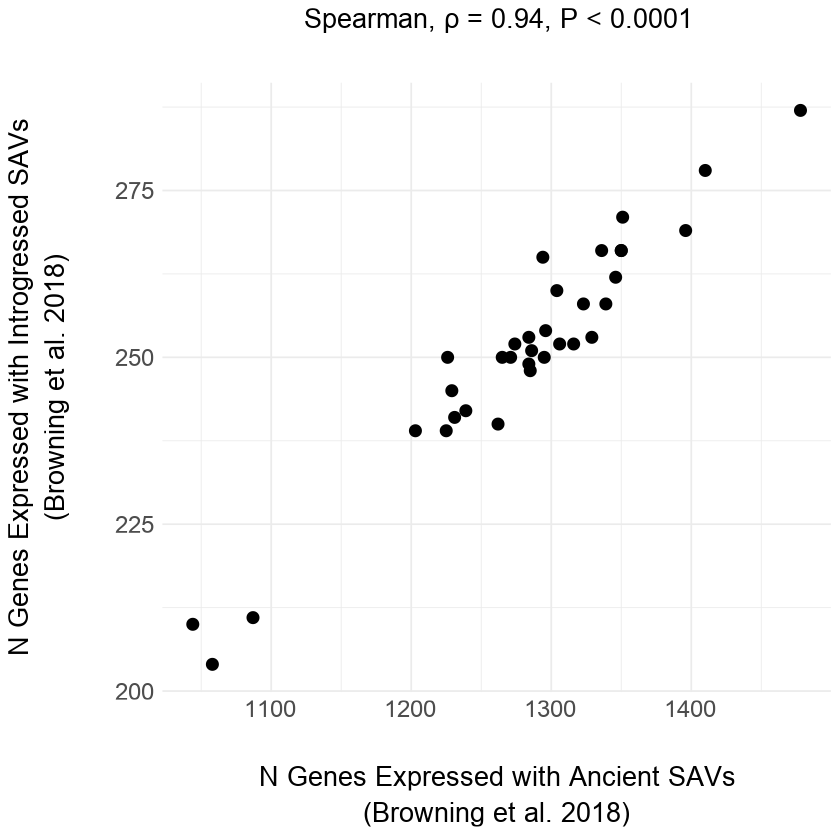

In [331]:
Browning_ancient_introgressed_genes_expression_correlation_plot <- ggplot(Browning_allele_origin_genes_expression, aes(x = ancient, y = introgressed)) + geom_point(size = 3) +
xlab('\nN Genes Expressed with Ancient SAVs\n(Browning et al. 2018)') + ylab('N Genes Expressed with Introgressed SAVs\n(Browning et al. 2018)\n') + ggtitle('Spearman, \u03c1 = 0.94, P < 0.0001\n') +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 20), axis.text.x = element_text(size = 18), axis.text.y = element_text(size = 18)) +
theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 20))

Browning_ancient_introgressed_genes_expression_correlation_plot

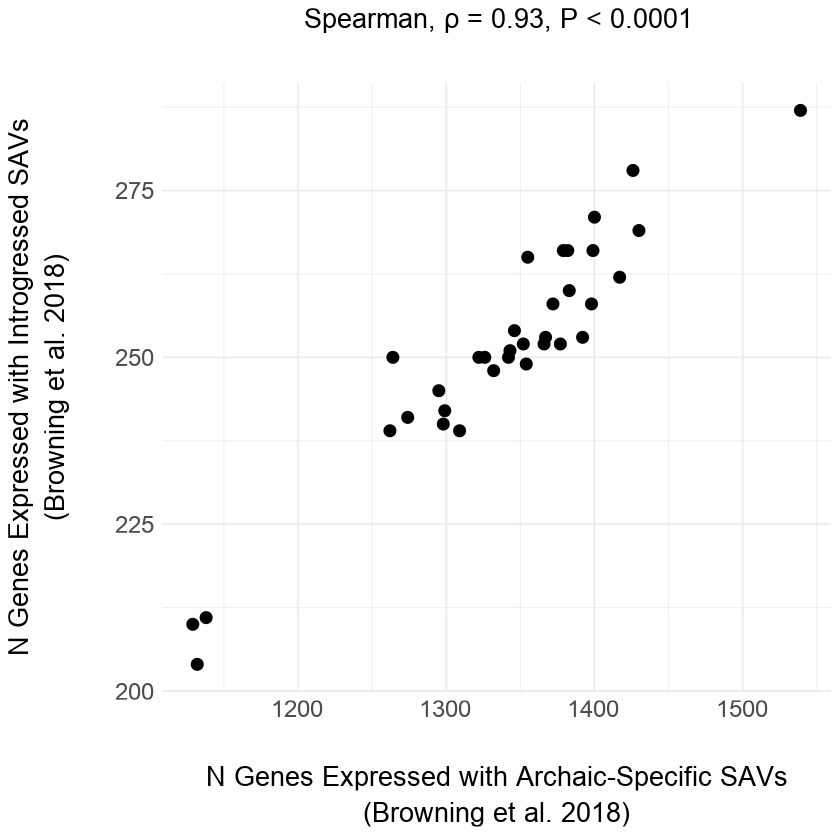

In [332]:
Browning_archaic_specific_introgressed_genes_expression_correlation_plot <- ggplot(Browning_allele_origin_genes_expression, aes(x = archaic_specific, y = introgressed)) + geom_point(size = 3) +
xlab('\nN Genes Expressed with Archaic-Specific SAVs\n(Browning et al. 2018)') + ylab('N Genes Expressed with Introgressed SAVs\n(Browning et al. 2018)\n') + ggtitle('Spearman, \u03c1 = 0.93, P < 0.0001\n') +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 20), axis.text.x = element_text(size = 18), axis.text.y = element_text(size = 18)) +
theme(plot.title = element_text(hjust = 0.5, family = 'Arial', size = 20))

Browning_archaic_specific_introgressed_genes_expression_correlation_plot

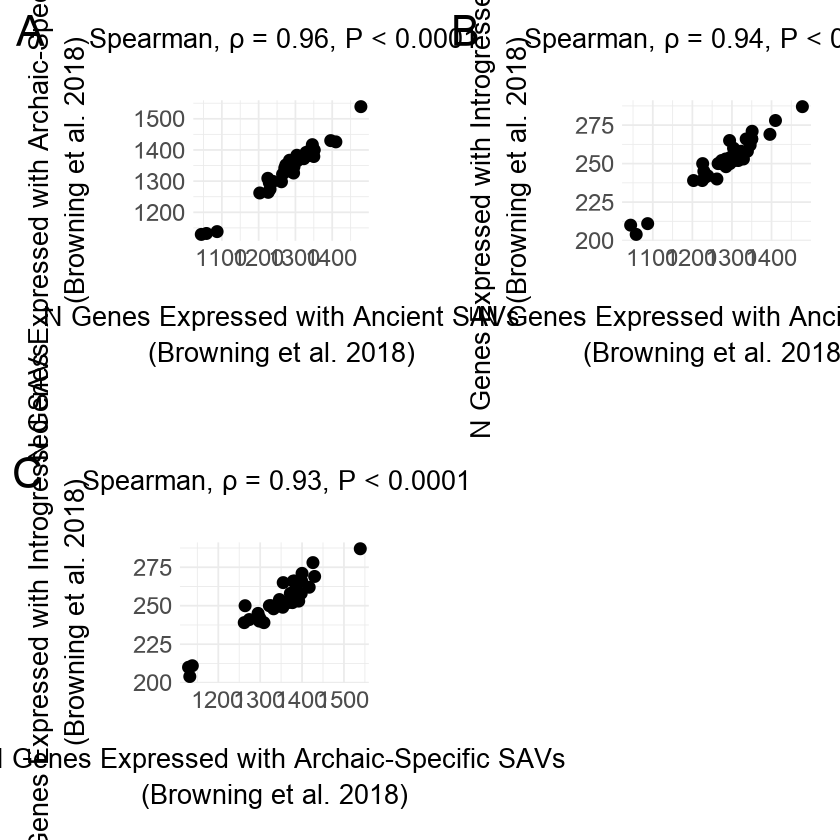

In [333]:
top_row <- plot_grid(Browning_ancient_archaic_specific_genes_expression_correlation_plot, NULL, Browning_ancient_introgressed_genes_expression_correlation_plot, labels = c('A','','B'), label_size = 32, rel_widths = c(0.45,0.05,0.45), nrow = 1, scale = 0.9)
middle_row <- plot_grid(NULL, NULL, NULL, nrow = 1)
bottom_row <- plot_grid(Browning_archaic_specific_introgressed_genes_expression_correlation_plot, NULL, NULL, labels = c('C','',''), label_size = 32, rel_widths = c(0.45,0.05,0.45), nrow = 1, scale = 0.9)
theme_set(theme_cowplot(font_family = 'Arial'))
Browning_genes_expression_correlation_plot <- plot_grid(top_row, middle_row, bottom_row, rel_heights = c(0.45,0.05,0.45), ncol = 1)
Browning_genes_expression_correlation_plot

In [334]:
pdf('suppl_figs/Browning_genes_expression_correlation_plot.pdf', width = 20, height = 20)
Browning_genes_expression_correlation_plot
dev.off()

png 
  2

### Relative Entropy <a class = 'anchor' id = 'relentropy'></a>

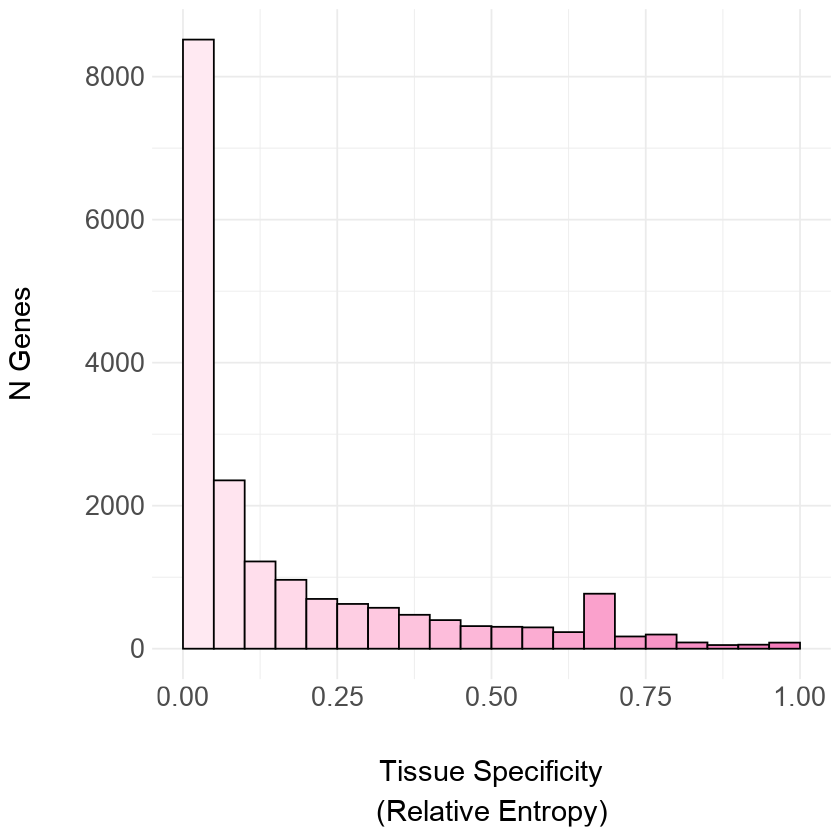

In [335]:
rel_entropy_dist <- ggplot(expression, aes(x = rel_entropy, fill = ..x..)) + geom_histogram(binwidth = 0.05, boundary = 0, color = 'black') +
xlab('\nTissue Specificity\n(Relative Entropy)') + ylab('N Genes\n') +
scale_fill_gradient(low = '#ffe9f2', high = '#f47dbb') +
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 22), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20)) +
theme(legend.position="none")

rel_entropy_dist

In [336]:
pdf('suppl_figs/entropy_distribution.pdf', width=12, height=12)
rel_entropy_dist
dev.off()

png 
  2

In [337]:
n_savs_2 <- aggregate(data_2$variant_type, by = list(annotation = data_2$annotation), FUN = length)

In [338]:
entropy_n_savs <- merge(n_savs_2, expression, by.x = 'annotation')
head(entropy_n_savs)

,annotation,x,Gene,entropy,rel_entropy,tau,adipose.tissue,adrenal.gland,amygdala,basal.ganglia,breast,cerebellum,cerebral.cortex,cervix..uterine,colon,endometrium,esophagus,fallopian.tube,heart.muscle,hippocampal.formation,hypothalamus,kidney,liver,lung,midbrain,ovary,pancreas,pituitary.gland,prostate,salivary.gland,skeletal.muscle,skin,small.intestine,spinal.cord,spleen,stomach,testis,thyroid.gland,urinary.bladder,vagina
,<chr>,<int>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,A1BG,1,ENSG00000121410,0.98696919,0.988323409,0.9999343,0.2,0.0,0.0,0.0,0.1,0.1,0.0,0.2,0.0,0.1,0.0,0.3,0.1,0.0,0.0,0.0,507.6,0.0,0.0,0.1,0.0,0.1,0.1,0.0,0.0,0.0,0.0,0.0,1.1,0.0,0.1,0.1,0.0,0.1
2,AADACL4,1,ENSG00000204518,0.39556903,0.273232423,1.0000000,0.8,0.0,0.0,0.0,0.0,0.0,0.0,0.5,0.2,0.1,0.0,0.1,0.0,0.0,0.0,0.4,0.0,0.0,0.0,0.0,0.0,0.0,0.3,0.0,0.0,0.0,0.0,0.0,0.2,0.1,0.4,0.0,0.0,1.0
3,AADAT,1,ENSG00000109576,0.05365990,0.042202346,0.5501618,3.3,1.5,5.9,5.6,2.8,1.0,7.4,9.7,6.1,9.8,1.9,7.1,1.4,4.9,5.4,2.4,10.2,4.1,4.9,3.8,2.2,6.8,10.3,1.5,1.0,1.4,2.1,6.1,1.5,2.6,9.4,5.4,7.5,6.2
4,AAMP,2,ENSG00000127837,0.01127149,0.003482066,0.3223378,66.1,56.9,33.6,44.3,64.5,72.8,58.6,74.4,60.9,76.3,60.0,69.6,30.3,35.4,43.9,40.4,32.2,53.0,36.3,81.3,27.4,69.8,59.8,52.3,42.1,72.4,53.3,38.2,52.1,58.6,73.4,68.6,80.0,60.6
5,AAR2,1,ENSG00000131043,0.02843327,0.010022355,0.4980153,22.3,20.8,5.9,7.5,20.8,12.4,8.3,22.9,27.0,31.3,13.7,27.7,8.4,6.4,7.3,13.0,8.8,18.5,7.1,18.5,7.6,11.2,21.7,15.2,11.1,24.3,17.5,10.8,17.7,16.4,22.1,18.2,30.3,17.1
6,AARS2,1,ENSG00000124608,0.02205915,0.007349874,0.5470219,4.4,4.6,3.6,3.3,5.1,11.6,6.0,8.0,5.1,7.6,7.4,8.0,2.9,3.5,3.2,3.8,2.8,5.0,3.1,8.5,2.6,7.0,7.4,5.5,2.0,5.9,6.9,3.3,6.9,3.7,5.0,7.4,6.1,7.8


In [339]:
entropy_n_savs$rel_entropy_bin <- cut(entropy_n_savs$rel_entropy, breaks=c(0, 0.1, 0.5, 1), labels=c('Low','Medium','High'))

In [340]:
head(entropy_n_savs)

,annotation,x,Gene,entropy,rel_entropy,tau,adipose.tissue,adrenal.gland,amygdala,basal.ganglia,breast,cerebellum,cerebral.cortex,cervix..uterine,colon,endometrium,esophagus,fallopian.tube,heart.muscle,hippocampal.formation,hypothalamus,kidney,liver,lung,midbrain,ovary,pancreas,pituitary.gland,prostate,salivary.gland,skeletal.muscle,skin,small.intestine,spinal.cord,spleen,stomach,testis,thyroid.gland,urinary.bladder,vagina,rel_entropy_bin
,<chr>,<int>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
1,A1BG,1,ENSG00000121410,0.98696919,0.988323409,0.9999343,0.2,0.0,0.0,0.0,0.1,0.1,0.0,0.2,0.0,0.1,0.0,0.3,0.1,0.0,0.0,0.0,507.6,0.0,0.0,0.1,0.0,0.1,0.1,0.0,0.0,0.0,0.0,0.0,1.1,0.0,0.1,0.1,0.0,0.1,High
2,AADACL4,1,ENSG00000204518,0.39556903,0.273232423,1.0000000,0.8,0.0,0.0,0.0,0.0,0.0,0.0,0.5,0.2,0.1,0.0,0.1,0.0,0.0,0.0,0.4,0.0,0.0,0.0,0.0,0.0,0.0,0.3,0.0,0.0,0.0,0.0,0.0,0.2,0.1,0.4,0.0,0.0,1.0,Medium
3,AADAT,1,ENSG00000109576,0.05365990,0.042202346,0.5501618,3.3,1.5,5.9,5.6,2.8,1.0,7.4,9.7,6.1,9.8,1.9,7.1,1.4,4.9,5.4,2.4,10.2,4.1,4.9,3.8,2.2,6.8,10.3,1.5,1.0,1.4,2.1,6.1,1.5,2.6,9.4,5.4,7.5,6.2,Low
4,AAMP,2,ENSG00000127837,0.01127149,0.003482066,0.3223378,66.1,56.9,33.6,44.3,64.5,72.8,58.6,74.4,60.9,76.3,60.0,69.6,30.3,35.4,43.9,40.4,32.2,53.0,36.3,81.3,27.4,69.8,59.8,52.3,42.1,72.4,53.3,38.2,52.1,58.6,73.4,68.6,80.0,60.6,Low
5,AAR2,1,ENSG00000131043,0.02843327,0.010022355,0.4980153,22.3,20.8,5.9,7.5,20.8,12.4,8.3,22.9,27.0,31.3,13.7,27.7,8.4,6.4,7.3,13.0,8.8,18.5,7.1,18.5,7.6,11.2,21.7,15.2,11.1,24.3,17.5,10.8,17.7,16.4,22.1,18.2,30.3,17.1,Low
6,AARS2,1,ENSG00000124608,0.02205915,0.007349874,0.5470219,4.4,4.6,3.6,3.3,5.1,11.6,6.0,8.0,5.1,7.6,7.4,8.0,2.9,3.5,3.2,3.8,2.8,5.0,3.1,8.5,2.6,7.0,7.4,5.5,2.0,5.9,6.9,3.3,6.9,3.7,5.0,7.4,6.1,7.8,Low


In [341]:
with(entropy_n_savs, tapply(rel_entropy, rel_entropy_bin, length))

Low Medium   High 
  2434   1268    359

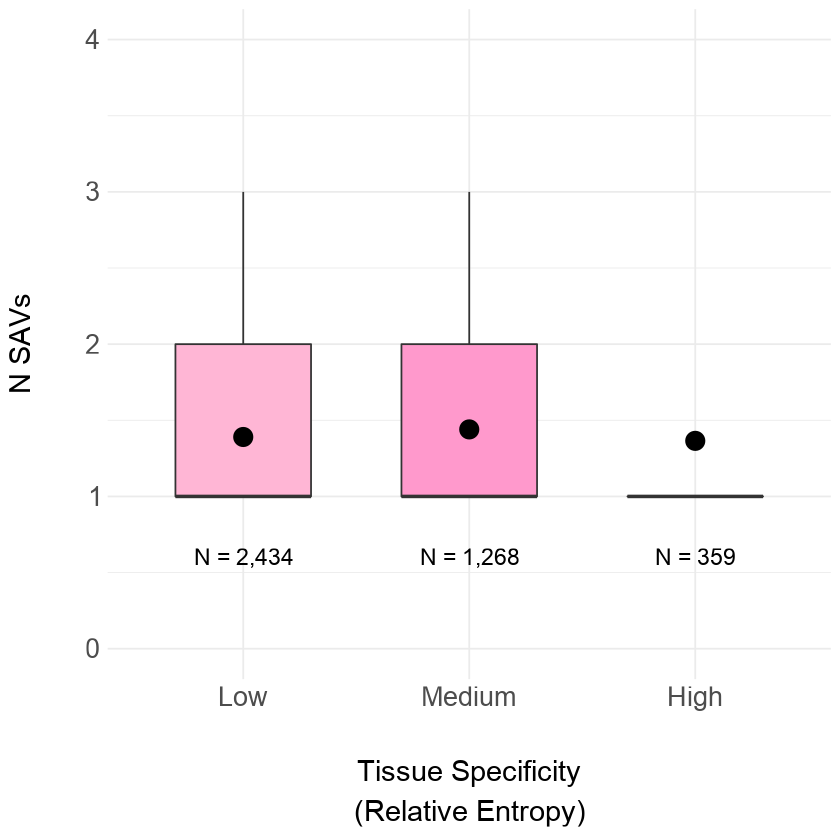

In [342]:
entropy_n_savs_plot <- ggplot(entropy_n_savs, aes(x = rel_entropy_bin, y = x, fill = rel_entropy_bin)) + geom_boxplot(outlier.shape = NA, width=0.6) +
stat_summary(fun = 'mean', geom = 'point', color = 'black', size = 5) + coord_cartesian(ylim = c(0,4)) +
scale_fill_manual(values = c('#ffb6d5','#ff99cc','#f47dbb')) +
xlab('\nTissue Specificity\n(Relative Entropy)') + ylab('N SAVs\n') + 
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 22), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20)) +
theme(legend.position = 'none') +
annotate('text', x = 'Low', y = 0.6, label = 'N = 2,434', size = 6, family = 'Arial') + 
annotate('text', x = 'Medium', y = 0.6, label = 'N = 1,268', , size = 6, family = 'Arial') +
annotate('text', x = 'High', y = 0.6, label = 'N = 359', , size = 6, family = 'Arial')

entropy_n_savs_plot

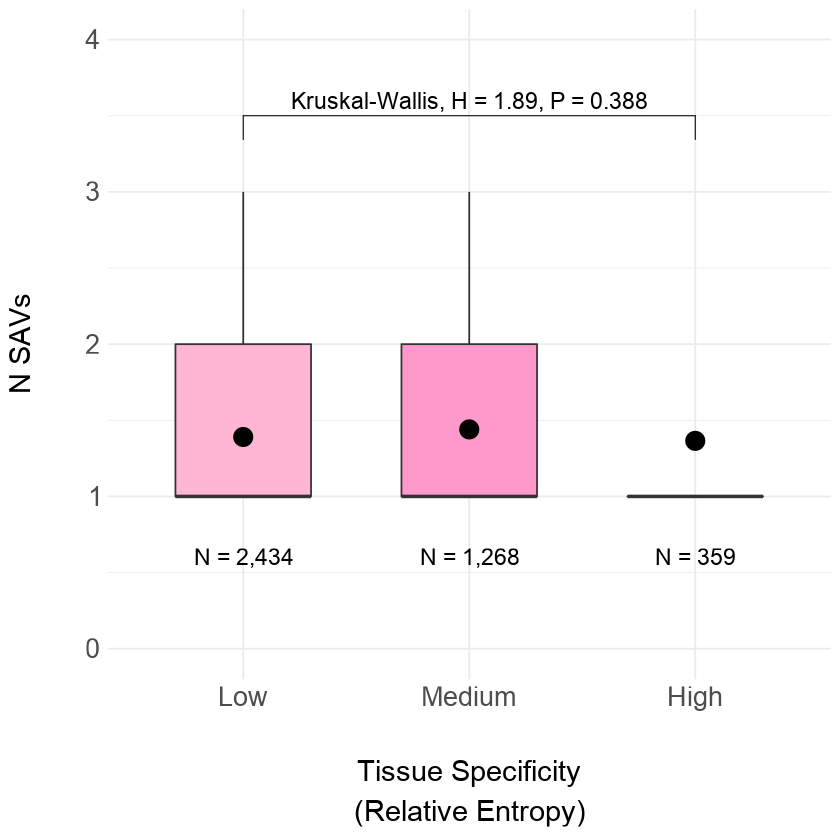

In [343]:
entropy_n_savs_plot = entropy_n_savs_plot + geom_bracket(xmin = 'Low', xmax = 'High', y.position = 3.5, tip.length = c(0.015), label = 'Kruskal-Wallis, H = 1.89, P = 0.388', label.size = 6, family = 'Arial', inherit.aes = FALSE)
entropy_n_savs_plot

In [344]:
pdf('suppl_figs/entropy_n_SAVs_plot.pdf', width = 12, height = 12)
entropy_n_savs_plot
dev.off()

png 
  2

In [345]:
entropy_delta <- subset(data_2, select=c('annotation', 'delta_max'))
head(entropy_delta)

,annotation,delta_max
,<chr>,<dbl>
25,SAMD11,0.22
66,SAMD11,0.29
131,PLEKHN1,0.29
156,AGRN,0.24
211,AGRN,0.22
219,AGRN,0.43


In [346]:
entropy_delta <- merge(entropy_delta, expression, by.x = 'annotation')
head(entropy_delta)

,annotation,delta_max,Gene,entropy,rel_entropy,tau,adipose.tissue,adrenal.gland,amygdala,basal.ganglia,breast,cerebellum,cerebral.cortex,cervix..uterine,colon,endometrium,esophagus,fallopian.tube,heart.muscle,hippocampal.formation,hypothalamus,kidney,liver,lung,midbrain,ovary,pancreas,pituitary.gland,prostate,salivary.gland,skeletal.muscle,skin,small.intestine,spinal.cord,spleen,stomach,testis,thyroid.gland,urinary.bladder,vagina
,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,A1BG,0.21,ENSG00000121410,0.98696919,0.988323409,0.9999343,0.2,0.0,0.0,0.0,0.1,0.1,0.0,0.2,0.0,0.1,0.0,0.3,0.1,0.0,0.0,0.0,507.6,0.0,0.0,0.1,0.0,0.1,0.1,0.0,0.0,0.0,0.0,0.0,1.1,0.0,0.1,0.1,0.0,0.1
2,AADACL4,0.26,ENSG00000204518,0.39556903,0.273232423,1.0000000,0.8,0.0,0.0,0.0,0.0,0.0,0.0,0.5,0.2,0.1,0.0,0.1,0.0,0.0,0.0,0.4,0.0,0.0,0.0,0.0,0.0,0.0,0.3,0.0,0.0,0.0,0.0,0.0,0.2,0.1,0.4,0.0,0.0,1.0
3,AADAT,0.22,ENSG00000109576,0.05365990,0.042202346,0.5501618,3.3,1.5,5.9,5.6,2.8,1.0,7.4,9.7,6.1,9.8,1.9,7.1,1.4,4.9,5.4,2.4,10.2,4.1,4.9,3.8,2.2,6.8,10.3,1.5,1.0,1.4,2.1,6.1,1.5,2.6,9.4,5.4,7.5,6.2
4,AAMP,0.20,ENSG00000127837,0.01127149,0.003482066,0.3223378,66.1,56.9,33.6,44.3,64.5,72.8,58.6,74.4,60.9,76.3,60.0,69.6,30.3,35.4,43.9,40.4,32.2,53.0,36.3,81.3,27.4,69.8,59.8,52.3,42.1,72.4,53.3,38.2,52.1,58.6,73.4,68.6,80.0,60.6
5,AAMP,0.62,ENSG00000127837,0.01127149,0.003482066,0.3223378,66.1,56.9,33.6,44.3,64.5,72.8,58.6,74.4,60.9,76.3,60.0,69.6,30.3,35.4,43.9,40.4,32.2,53.0,36.3,81.3,27.4,69.8,59.8,52.3,42.1,72.4,53.3,38.2,52.1,58.6,73.4,68.6,80.0,60.6
6,AAR2,0.50,ENSG00000131043,0.02843327,0.010022355,0.4980153,22.3,20.8,5.9,7.5,20.8,12.4,8.3,22.9,27.0,31.3,13.7,27.7,8.4,6.4,7.3,13.0,8.8,18.5,7.1,18.5,7.6,11.2,21.7,15.2,11.1,24.3,17.5,10.8,17.7,16.4,22.1,18.2,30.3,17.1


In [347]:
entropy_delta$rel_entropy_bin <- cut(entropy_delta$rel_entropy, breaks=c(0, 0.1, 0.5, 1), labels=c('Low','Medium','High'))

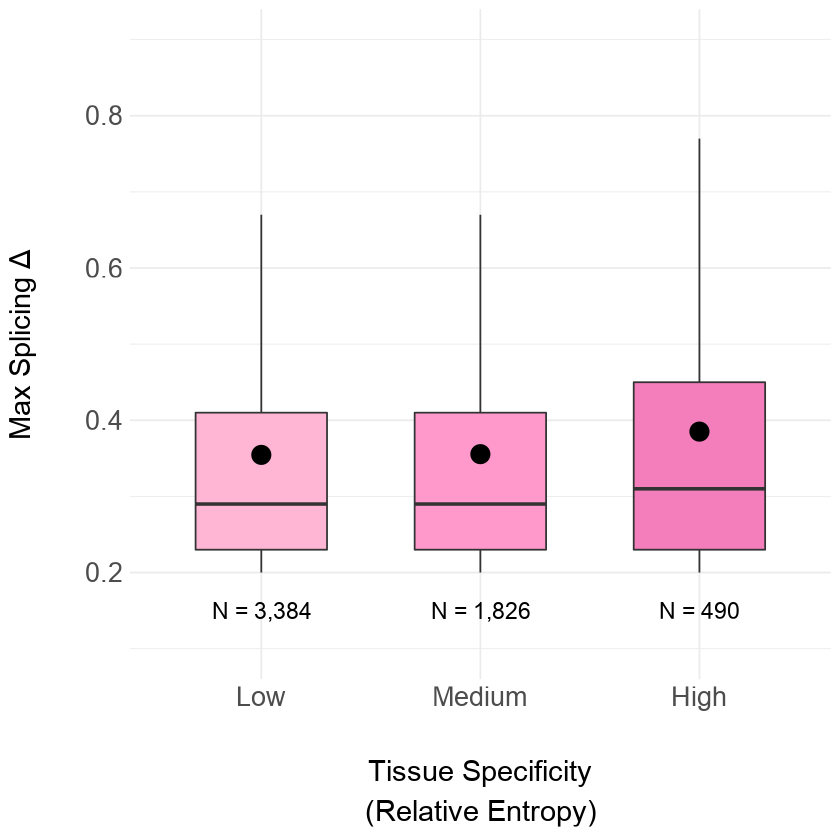

In [348]:
entropy_delta_plot <- ggplot(entropy_delta, aes(x = rel_entropy_bin, y = delta_max, fill = rel_entropy_bin)) + geom_boxplot(outlier.shape = NA, width=0.6) +
stat_summary(fun = 'mean', geom = 'point', color = 'black', size = 5) + coord_cartesian(ylim = c(0.1,0.9)) +
scale_y_continuous(breaks = c(0.2,0.4,0.6,0.8)) +
scale_fill_manual(values = c('#ffb6d5','#ff99cc','#f47dbb')) +
xlab('\nTissue Specificity\n(Relative Entropy)') + ylab('Max Splicing \u0394\n') + 
theme_minimal() + theme(text = element_text(family = 'Arial')) +
theme(axis.title = element_text(size = 22), axis.text.x = element_text(size = 20), axis.text.y = element_text(size = 20)) +
theme(legend.position = 'none') +
annotate('text', x = 'Low', y = 0.15, label = 'N = 3,384', size = 6, family = 'Arial') + 
annotate('text', x = 'Medium', y = 0.15, label = 'N = 1,826', , size = 6, family = 'Arial') +
annotate('text', x = 'High', y = 0.15, label = 'N = 490', , size = 6, family = 'Arial')

entropy_delta_plot

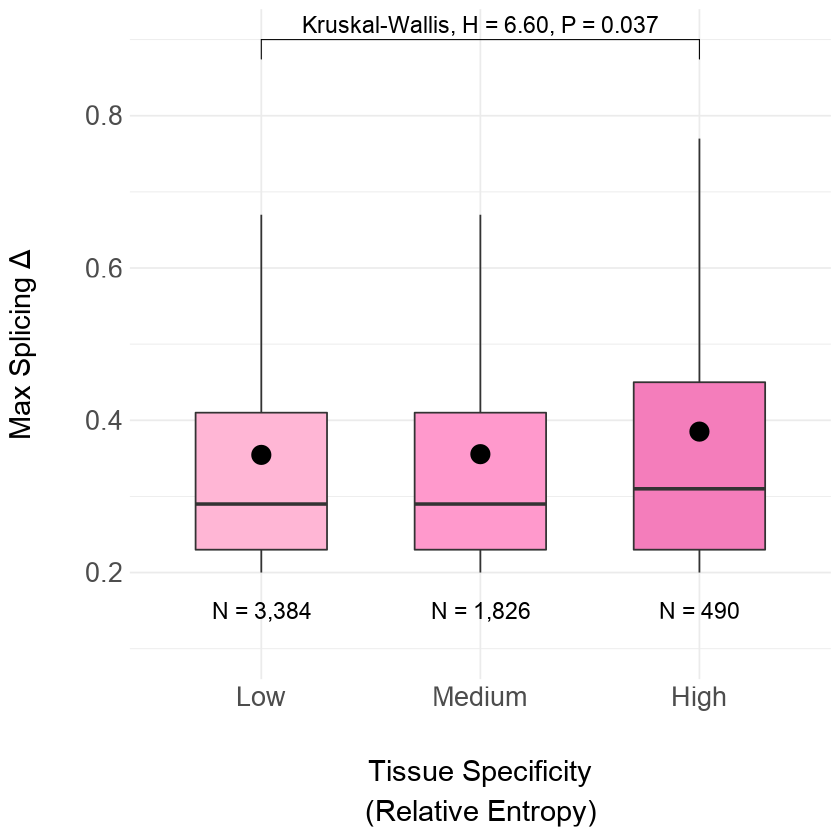

In [349]:
entropy_delta_plot = entropy_delta_plot + geom_bracket(xmin = 'Low', xmax = 'High', y.position = 0.9, tip.length = c(0.03), label = 'Kruskal-Wallis, H = 6.60, P = 0.037', label.size = 6, family = 'Arial', inherit.aes = FALSE)
entropy_delta_plot

Now combine the above with the Vernot allele origin and N GTEx tissue plots from earlier.

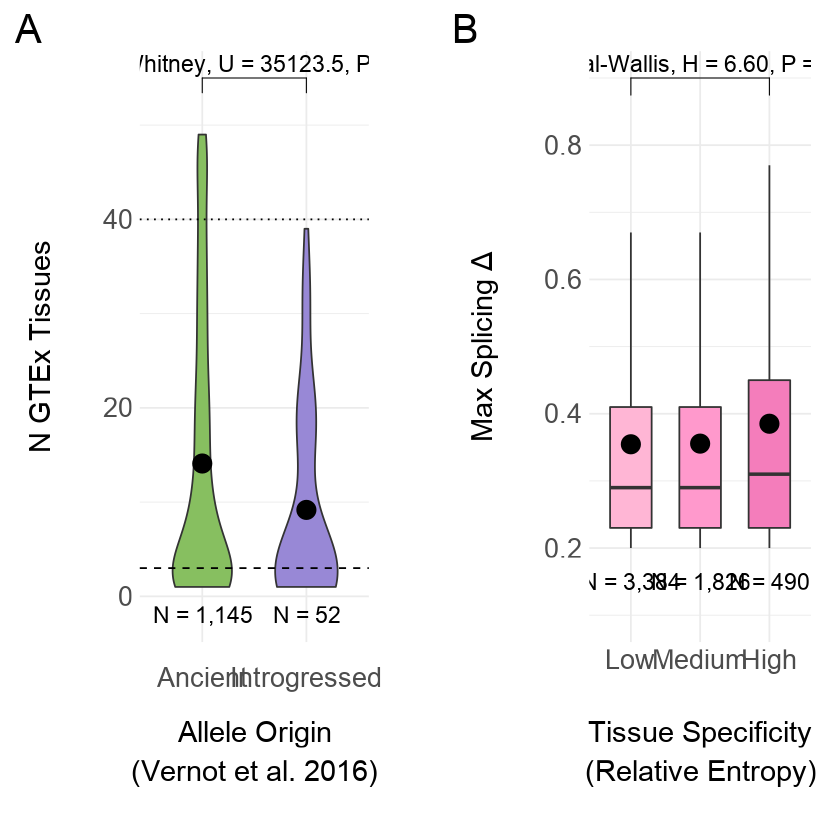

In [350]:
theme_set(theme_cowplot(font_family = 'Arial'))
expression_plot <- plot_grid(Vernot_n_GTEx_tissues_allele_origin, NULL, entropy_delta_plot, labels = c('A','','B'), label_size = 30, rel_widths = c(0.45,0.05,0.45), nrow = 1, scale = 0.9)
expression_plot

In [351]:
pdf('expression_plot.pdf', width = 20, height = 12)
expression_plot
dev.off()

png 
  2